### Initiate the code


run the 5 next cells

<!-- run: ./remaining_preparation.sh   or    cp -r /root/capsule/scratch/configs_xinxin/tongue_mouse/ae_jsons/* ~/.behavenet -->

<!-- python /home/faeze.aminmansoor/video-analysis/behavenet_dir/behavenet/behavenet/fitting/ae_grid_search.py --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_nose_params.json --model_config /home/faeze.aminmansoor/.behavenet/ae_model.json --training_config /home/faeze.aminmansoor/.behavenet/ae_training.json --compute_config /home/faeze.aminmansoor/.behavenet/ae_compute.json -->

Also, 

1. Build config/bodypart pathway and copy config_files into it

2. adjust data_info_bodypart file

3. using data_structuring.ipynb construct data.hdf5

4. migrate data.hdf5 to '/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_' + bodypart' + /706893/2024-05-28/data.hdf5

    1.1. mkdir -p "/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_ + bodypart' + '/706893/2024-05-28/"

    1.2. mv /home/faeze.aminmansoor/video-analysis/videos/706893_2024-05-28_15-15-38/{bodypart}/hdf5-dir/data.hdf5 /home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_{bodypart}/706893/2024-05-28/

5. revise data.info (you can read the specs from data_structuring.ipynb)



In [4]:
n_ae_latents_str = '08' #16

bodypart = 'ear'  # set body part accordingly, like 'nose', 'tongue_mouth'
fps_label = ''# '_480Hz'
bodypart = f"{bodypart}{fps_label}"
bodypart

'ear'

In [9]:
"""set up the data, results, and figures directories"""


# set figure folder accordingly, like /figures/nose

from unittest.mock import patch
from behavenet import setup

def automated_setup():
    with patch('builtins.input', \
        side_effect= ['/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data', '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results', \
        '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/figures/'+bodypart]):
        setup()

# Call the automated setup function
automated_setup()

Directories are now stored in /home/faeze.aminmansoor/.behavenet/directories.json


In [ ]:
# """set up the data, results, and figures directories"""


# # set figure folder accordingly, like /figures/nose

# from unittest.mock import patch
# from behavenet import setup

# def automated_setup():
#     with patch('builtins.input', \
#         side_effect= ['/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/data', '/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/results', \
#         '/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/figures/'+bodypart]):
#         setup()

# # Call the automated setup function
# automated_setup()

Directories are now stored in /home/faeze.aminmansoor/.behavenet/directories.json


In [10]:
import h5py

# set the path to the hdf5 file

hdf5_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/data.hdf5'

with h5py.File(hdf5_path, 'r') as f:
    images = f['images']
    trials = list(images.keys())
    total_num_trials = len(trials)
    sample_shape = images[trials[0]].shape  # e.g., (n_frames, n_channels, y_pix, x_pix);  or you can write : f['images/trial_0000'].shape

print(f"Sample dimensions (n_frames, n_channels, y_pix, x_pix): {sample_shape}")
print(f"Total number of trials: {total_num_trials}")

Sample dimensions (n_frames, n_channels, y_pix, x_pix): (1000, 1, 105, 112)
Total number of trials: 178


In [ ]:
# import h5py

# # set the path to the hdf5 file

# hdf5_path = '/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/data.hdf5'

# with h5py.File(hdf5_path, 'r') as f:
#     images = f['images']
#     trials = list(images.keys())
#     total_num_trials = len(trials)
#     sample_shape = images[trials[0]].shape  # e.g., (n_frames, n_channels, y_pix, x_pix);  or you can write : f['images/trial_0000'].shape

# print(f"Sample dimensions (n_frames, n_channels, y_pix, x_pix): {sample_shape}")
# print(f"Total number of trials: {total_num_trials}")


Sample dimensions (n_frames, n_channels, y_pix, x_pix): (1178, 1, 124, 309)
Total number of trials: 178


In [19]:
"""get the frame rate of the video file from the original? file"""
"""complete data_info.txt"""

'complete data_info.txt'

In [5]:
# to read the inputs from a text file 'data_info.txt'

from unittest.mock import patch
from behavenet import add_dataset

def automated_setup():
    with open('/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data_info_'+bodypart+'.txt', 'r') as file:
        input_values = [line.strip() for line in file]

    with patch('builtins.input', side_effect=input_values):
        add_dataset()

# Call the automated setup function
automated_setup()

Please enter the following information about the dataset:
Please enter the following information about the behavioral video:
Please enter the following information about the neural data:
Dataset params are now stored in /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_ear_params.json


In [21]:
# from behavenet import add_dataset
# add_dataset()

In [22]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.get_device_properties('cuda:0'))
# print(torch.cuda.get_device_properties('cuda:1'))

True
0
_CudaDeviceProperties(name='NVIDIA RTX 6000 Ada Generation', major=8, minor=9, total_memory=48640MB, multi_processor_count=142)


In [23]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.get_device_properties('cuda:0'))
print(torch.cuda.get_device_properties('cuda:1'))


True
0
_CudaDeviceProperties(name='NVIDIA RTX 6000 Ada Generation', major=8, minor=9, total_memory=48640MB, multi_processor_count=142)
_CudaDeviceProperties(name='NVIDIA RTX 6000 Ada Generation', major=8, minor=9, total_memory=48640MB, multi_processor_count=142)


In [6]:
import torch

# Check if CUDA (GPU support) is available
if torch.cuda.is_available():
    # Get the number of available GPUs
    num_gpus = torch.cuda.device_count()
    
    # Iterate over each GPU and print its properties
    for i in range(num_gpus):
        gpu_properties = torch.cuda.get_device_properties(i)
        print(f"GPU {i}: {gpu_properties.name}, {gpu_properties.total_memory / 1e9}GB")
else:
    print("CUDA is not available. Running on CPU.")

GPU 0: NVIDIA RTX 6000 Ada Generation, 51.002867712GB
GPU 1: NVIDIA RTX 6000 Ada Generation, 51.002867712GB


In [27]:
import torch

# Print PyTorch version
print("PyTorch Version:", torch.__version__)

# Check if CUDA is available
if torch.cuda.is_available():
    # Print CUDA version
    print("CUDA Version:", torch.version.cuda)
else:
    print("CUDA is not available.")

PyTorch Version: 2.4.1+cu121
CUDA Version: 12.1


In [29]:
"""This code snipped reads the metrics.csv file and prints the last 20 rows of the file"""
# import pandas as pd
# csv_file = 'scratch/results/han/twoArmBand_Block/09/20210419/ae/conv/10_latents/10D/version_0/metrics.csv'
# data= pd.read_csv(csv_file)
# data[-20:]

# # import csv
# # with open(csv_file, 'r') as csvfile:
# #     reader = csv.DictReader(csvfile)

# #     for row in reader:
# #            print(row, '\n')

'This code snipped reads the metrics.csv file and prints the last 20 rows of the file'

In [ ]:
import torch

model = torch.load("/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_nose/706893/2024-05-28/ae/conv/16_latents/nose_3_views/version_0/best_val_model.pt", map_location="cuda")  # or "cuda" if using GPU
# Now, if your model has an autoencoder attribute or an encode method, you can call that.
latent = model.autoencoder.encode(input_tensor)  # or model.encode(input_tensor)
# model
latent

## General setups

### Enter manually

In [5]:
n_arhmm_states = [2,4,8,12,16,20,32]  

original_video_fps = 480

#### Build and define the "dfs" directories

In [6]:
import os

# Define the directory path
dfs_dir = f"/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_{bodypart}/706893/2024-05-28/dfs"

# Ensure the directory exists
os.makedirs(dfs_dir, exist_ok=True)


### Build dfs/df_original.csv

In [7]:
import pandas as pd

# Load the CSV file
df_original = pd.read_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/original_trials.csv")

df_original.keys()

# create df_original_ by adding the Trial column
df_original_ = df_original.copy()
# # remove nan rows
# df_original_ = df_original_.dropna(subset=["start_time"])
df_original_['Trial'] = range(1, len(df_original_) + 1)  # Assign trial numbers sequentially
# Display the first few rows
print(df_original_.head(10))
# Save the new dataframe to a CSV file
df_original_.to_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" +bodypart+ "/706893/2024-05-28/dfs/df_original.csv", index=False) # change df_events_go.csv to df_events.csv ?????



     start_time     stop_time  animal_response  rewarded_historyL  \
0  6.574702e+06  6.574709e+06              1.0              False   
1  6.574709e+06  6.574716e+06              1.0              False   
2  6.574716e+06  6.574750e+06              0.0               True   
3  6.574750e+06  6.574758e+06              0.0              False   
4  6.574758e+06  6.574764e+06              0.0              False   
5  6.574764e+06  6.574771e+06              0.0              False   
6  6.574771e+06  6.574777e+06              0.0              False   
7  6.574777e+06  6.574788e+06              0.0              False   
8  6.574788e+06  6.574796e+06              0.0              False   
9  6.574796e+06  6.574816e+06              0.0              False   

   rewarded_historyR  delay_start_time  goCue_start_time  reward_outcome_time  \
0              False      6.574705e+06      6.574707e+06         6.574707e+06   
1              False      6.574711e+06      6.574713e+06         6.574714e+06 

### Get the number of frames in the selected_segments

In [9]:
import h5py

def get_frame_counts(hdf5_path, selected_trials=None):
    """
    Reads an HDF5 file and extracts the number of frames for each selected trial.

    Parameters:
        hdf5_path (str): Path to the HDF5 file.
        selected_trials (list, optional): List of trial indices to include. If None, all trials will be used.

    Returns:
        dict: A dictionary with trial keys and their corresponding frame counts.
        int: The total number of frames across the selected trials.
        int: The total number of trials in the HDF5 file.
    """
    n_frames_dict = {}

    with h5py.File(hdf5_path, 'r') as f:
        images_group = f['images']
        total_num_trials = len(images_group.keys())  # Get the total number of trials

        # If no specific trials are selected, use all available trials
        if selected_trials is None:
            selected_trials = list(range(total_num_trials))

        # Loop over the selected trial indices
        for idx in selected_trials:
            trial_key = f"trial_{idx:04d}"
            if trial_key in images_group:
                n_frames = images_group[trial_key].shape[0]  # Extract number of frames
                n_frames_dict[trial_key] = n_frames

    # Compute total frames across selected trials
    total_num_frames = sum(n_frames_dict.values())

    return n_frames_dict, total_num_frames, total_num_trials



# Section 1: Auto-Encoder

## Train AE
adjust config -> ae



<!-- cp -r /home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/configs_xinxin/ae_jsons/* ~/.behavenet -->

<!-- then  -->




### Copy ea config files in ~/.behavenet

In [6]:
import subprocess

command = f"cp -r /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/configs_xinxin/{bodypart}/ae_jsons/* ~/.behavenet"
# command = f"cp -r /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/configs_xinxin/tongue_mouth/ae_jsons/* ~/.behavenet"
subprocess.run(command, shell=True, check=True)

CompletedProcess(args='cp -r /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/configs_xinxin/ear/ae_jsons/* ~/.behavenet', returncode=0)

### Train AE

In [ ]:
import subprocess

command = f"python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/ae_grid_search.py --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_{bodypart}_params.json --model_config /home/faeze.aminmansoor/.behavenet/ae_model.json --training_config /home/faeze.aminmansoor/.behavenet/ae_training.json --compute_config /home/faeze.aminmansoor/.behavenet/ae_compute.json"
subprocess.run(command, shell=True, check=True)

In [7]:
f"python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/ae_grid_search.py --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_{bodypart}_params.json --model_config /home/faeze.aminmansoor/.behavenet/ae_model.json --training_config /home/faeze.aminmansoor/.behavenet/ae_training.json --compute_config /home/faeze.aminmansoor/.behavenet/ae_compute.json"


'python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/ae_grid_search.py --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_ear_params.json --model_config /home/faeze.aminmansoor/.behavenet/ae_model.json --training_config /home/faeze.aminmansoor/.behavenet/ae_training.json --compute_config /home/faeze.aminmansoor/.behavenet/ae_compute.json'

In [ ]:
# import subprocess

# command = f"python /home/faeze.aminmansoor/video-analysis/behavenet_dir/behavenet/behavenet/fitting/ae_grid_search.py --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_{bodypart}_params.json --model_config /home/faeze.aminmansoor/.behavenet/ae_model.json --training_config /home/faeze.aminmansoor/.behavenet/ae_training.json --compute_config /home/faeze.aminmansoor/.behavenet/ae_compute.json"
# subprocess.run(command, shell=True, check=True)

#### then in tmux run

python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/ae_grid_search.py --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_{bodypart}_params.json --model_config /home/faeze.aminmansoor/.behavenet/ae_model.json --training_config /home/faeze.aminmansoor/.behavenet/ae_training.json --compute_config /home/faeze.aminmansoor/.behavenet/ae_compute.json

### tmux:
tmux ls

To detach: Ctrl+B then D.

tmux attach or tmux attach -t session_name  


To Start a New Session: tmux new -s session_name

To kill a session: tmux kill-session -t session_name



In [10]:
import os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from behavenet import get_user_dir, make_dir_if_not_exists
from behavenet.fitting.utils import get_expt_dir
from behavenet.fitting.utils import get_session_dir
from behavenet.fitting.utils import get_best_model_version
from behavenet.fitting.utils import get_lab_example

save_outputs = True  # true to save figures/movies to user's figure directory
format = 'png'  # figure format ('png' | 'jpeg' | 'pdf'); movies saved as mp4

In [4]:
# This cell enters the hyperparameters manually

# ae_model_experiment_name = bodypart+'_3_views' # 'whiskers_bottom'
# n_ae_latents_str = '08' #16
# experimenter_name = 'xinxin'
# dataset_hparams_experiment_name = 'coupled-baiting_'+bodypart # 'coupled-baiting_whiskers'
# farme_rate = 48

## Extract meta tags from meta_tags.csv

In [11]:
# read the valuse of hparams from meta_tag.csv
import pandas as pd

# set the path to the meta_tag.csv file

# Path to your CSV file
# file_path = "meta_tag.csv"
meta_tag_file_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' +bodypart+ '/706893/2024-05-28/ae/conv/' +n_ae_latents_str+ '_latents/' +bodypart+ '_3_views/version_0/meta_tags.csv'

# Load CSV
df_ = pd.read_csv(meta_tag_file_path)

# Extract frame rate
ae_model_experiment_name = df_[df_["key"] == "experiment_name"]["value"].values[0]
n_ae_latents = int(df_[df_["key"] == "n_ae_latents"]["value"].values[0])
experimenter_name = df_[df_["key"] == "lab"]["value"].values[0]
dataset_hparams_experiment_name = df_[df_["key"] == "expt"]["value"].values[0]
frame_rate = float(df_[df_["key"] == "frame_rate"]["value"].values[0])
ae_model_version = df_[df_["key"] == "version"]["value"].values[0]

print("ae_model_experiment_name:", ae_model_experiment_name)
print("n_ae_latents:", n_ae_latents)
print("experimenter_name:", experimenter_name)
print("dataset_hparams_experiment_name:", dataset_hparams_experiment_name)
print("frame_rate:", frame_rate)
print("ae_model_version:", ae_model_version)

# total_num_trials = total_num_trials # calculated before 


ae_model_experiment_name: ear_3_views
n_ae_latents: 8
experimenter_name: xinxin
dataset_hparams_experiment_name: coupled-baiting_ear
frame_rate: 48.0
ae_model_version: 0


#### Make sure the AE_model_version in meta_tag_file_path is correct

In [12]:
# Extract the version number
version = meta_tag_file_path.split("version_")[1].split("/")[0]

print("version assigned in meta_tag_file_path path: ", version) 
print("'version' as stored in meta_tag.csv: ", ae_model_version)

assert version == ae_model_version, "Version mismatch"

version assigned in meta_tag_file_path path:  0
'version' as stored in meta_tag.csv:  0


### Build AE metric_df

In [ ]:
"""Build AE metric_df"""
# import os
# import pandas as pd

# def generate_metrics_df(metrics_file, session_info_file):
#     """
#     Generates a DataFrame (metrics_df) containing epoch-wise training and validation losses.

#     Args:
#         metrics_file (str): Path to the metrics.csv file containing training and validation loss data.
#         session_info_file (str): Path to the session_info.csv file containing session metadata.

#     Returns:
#         pd.DataFrame: A DataFrame containing epoch, loss values, dataset name, and loss type (train/val).
#     """
    
#     # Load training metrics
#     metrics = pd.read_csv(metrics_file)

#     # Read session information and extract "animal ID" and "session name"
#     session_info = pd.read_csv(session_info_file)
#     sess_ids_strs = session_info.apply(lambda row: f"{row['animal']}/{row['session']}", axis=1).tolist()

#     # Convert metrics into a DataFrame
#     metrics_df = []
#     for _, row in metrics.iterrows():
#         dataset = 'all' if row['dataset'] == -1 else sess_ids_strs[row['dataset']]
        
#         # Store validation loss
#         metrics_df.append({'dataset': dataset, 'epoch': row['epoch'], 'loss': row['val_loss'], 'dtype': 'val'})
        
#         # Store training loss
#         metrics_df.append({'dataset': dataset, 'epoch': row['epoch'], 'loss': row['tr_loss'], 'dtype': 'train'})

#     # Convert list to DataFrame
#     return pd.DataFrame(metrics_df)

# # Example usage

# # set model info
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     # 'experiment_name': 'whiskers_bottom',
#     'experiment_name': ae_model_experiment_name,
#     'model_class': 'ae',
#     'model_type': 'conv',
#     # 'n_ae_latents': 8,
#     'n_ae_latents': n_ae_latents
# }

# # programmatically fill out other hparams options
# # get_lab_example(hparams, 'xinxin', 'coupled-baiting_whiskers') # to del
# get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)
# hparams['session_dir'], sess_ids = get_session_dir(hparams)
# hparams['expt_dir'] = get_expt_dir(hparams)

# # find metrics csv file
# versions = get_best_model_version(hparams['expt_dir']) # error related to: in meta-tag: training_completed,True
# version_dir = os.path.join(hparams['expt_dir'], 'version_%i' % versions[0])
# # load training metrics
# metric_file = os.path.join(version_dir, 'metrics.csv')


# metrics_file = "/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_nose/706893/2024-05-28/ae/conv/16_latents/nose_3_views/version_0/metrics.csv"
# session_info_file = "/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_nose/706893/2024-05-28/ae/conv/16_latents/nose_3_views/version_0/session_info.csv"
# metrics_df = generate_metrics_df(metrics_file, session_info_file)

# # Display the first few rows
# print(metrics_df.head())


## Display the AE latent pkl file
## Build proto_ae_latent_df 

The pickle file (e.g. xinxin_coupled-baiting_nose_706893_2024-05-28_latents)  contains a dictionary with two main components:

Latents Data (latents)

Type: list
Number of trials: 178 (each trial corresponds to a latent index).
Each trial contains a matrix of latent variables, where:
Rows represent frames in the corresponding movie.
Columns (16 total) represent the latent dimensions.


Trials Data (trials)

Type: dict
Keys: ['train', 'test', 'val']
Each key holds a list of trial indices assigned to that category (training, testing, validation).
The total number of trials (~178) is distributed among these categories.

Summary
The file stores latent representations of 178 trials, with 16 latent variables per frame.
The number of frames varies per trial, reflecting the movie length for that trial.
The trials are categorized into training, testing, and validation sets.

In [16]:
import pickle
import pandas as pd

# Define the updated file path
file_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' +bodypart+ '/706893/2024-05-28/ae/conv/' +n_ae_latents_str+ '_latents/' +bodypart+ '_3_views/version_0/xinxin_coupled-baiting_' +bodypart+ '_706893_2024-05-28_latents.pkl'

# Load the updated pickle file
with open(file_path, 'rb') as file:
    data = pickle.load(file)

# Extract latents and trials from the updated file
ae_latents = data.get("latents", [])
ae_trials = data.get("trials", {})

# Convert latents to a structured DataFrame
ae_latent_trial_df = []
for i, arr in enumerate(ae_latents):
    if arr.size > 0:  # Ignore empty arrays
        df_temp = pd.DataFrame(arr)
        df_temp['seg_index'] = i  # Identify the latent group
        ae_latent_trial_df.append(df_temp)

proto_ae_latents_df = pd.concat(ae_latent_trial_df, ignore_index=True) if ae_latent_trial_df else pd.DataFrame()
# save proto_ae_latents_df to csv in dfs folder
proto_ae_latents_df.to_csv(f'/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_{bodypart}/706893/2024-05-28/dfs/proto_ae_latents_df.csv', index=False)


# Convert trials into a structured DataFrame
trial_type_df = pd.DataFrame([(k, list(v)) for k, v in ae_trials.items()], columns=["Trial Type", "Indices"])

# Display the first few rows of both DataFrames
print("=== Latents Data ===")
print(trial_type_df[1000:1300])  # Show first 10 rows

print("\n=== Trials Data ===")
print(trial_type_df)  # Show structured trial indices


=== Latents Data ===
Empty DataFrame
Columns: [Trial Type, Indices]
Index: []

=== Trials Data ===
  Trial Type                                            Indices
0      train  [14, 15, 16, 17, 18, 19, 20, 21, 64, 65, 66, 6...
1       test  [23, 73, 93, 113, 153, 53, 33, 173, 133, 103, ...
2        val  [22, 72, 92, 112, 152, 52, 32, 172, 132, 102, ...


### Display proto ae_latent_df 

In [17]:
proto_ae_latents_df

,0,1,2,3,4,5,6,7,seg_index
0,-10.063370,-26.443747,7.669928,82.935844,6.071278,-53.174885,52.648537,-27.147223,4
1,-10.030812,-26.064062,7.540515,83.361519,5.975089,-53.148064,53.062115,-26.956013,4
2,-9.763950,-26.039431,7.653439,83.756409,6.032823,-53.182243,53.397915,-26.848112,4
3,-9.559967,-25.967693,7.660251,83.987000,5.975273,-53.191826,53.662315,-26.703096,4
4,-9.467719,-25.731182,7.634991,84.082474,6.049106,-53.174484,53.597256,-26.400768,4
...,...,...,...,...,...,...,...,...,...
163140,-56.415802,-21.813633,-39.221230,22.169884,-26.365540,-32.468437,-8.215343,-24.818964,173
163141,-56.470924,-21.554176,-39.277878,21.895140,-26.278660,-32.482853,-8.080110,-24.937113,173
163142,-56.085117,-21.755878,-39.169472,21.273794,-26.895475,-32.406998,-9.005992,-25.047815,173
163143,-56.151218,-21.119518,-39.378853,20.405355,-27.366566,-32.501057,-9.607524,-25.317127,173


## Access to train_indices, test_indices, val_indices

In [18]:
train_indices = ae_trials.get("train", [])
test_indices = ae_trials.get("test", [])
val_indices = ae_trials.get("val", [])

In [23]:
print(len(train_indices), len(test_indices), len(val_indices))
print('train_indices:', train_indices)
print('test_indices:', test_indices)
print('val_indices:', val_indices)
# buffer makes sense now considering the way they assign data to data dtypes

136 17 17
train_indices: [ 14  15  16  17  18  19  20  21  64  65  66  67  68  69  70  71  84  85
  86  87  88  89  90  91 104 105 106 107 108 109 110 111 144 145 146 147
 148 149 150 151  44  45  46  47  48  49  50  51  24  25  26  27  28  29
  30  31 164 165 166 167 168 169 170 171 124 125 126 127 128 129 130 131
  94  95  96  97  98  99 100 101  74  75  76  77  78  79  80  81 134 135
 136 137 138 139 140 141 114 115 116 117 118 119 120 121  34  35  36  37
  38  39  40  41   4   5   6   7   8   9  10  11  54  55  56  57  58  59
  60  61 154 155 156 157 158 159 160 161]
test_indices: [ 23  73  93 113 153  53  33 173 133 103  83 143 123  43  13  63 163]
val_indices: [ 22  72  92 112 152  52  32 172 132 102  82 142 122  42  12  62 162]


In [19]:
# Combine all indices into one array
all_indices = np.concatenate((train_indices, test_indices, val_indices))

# Find the maximum value among all indices
max_value = np.max(all_indices)

# Create a full set of numbers from 0 to max_value (inclusive)
full_range = np.arange(max_value)

# Find missing numbers by computing the set difference
excluded_trials = np.setdiff1d(full_range, all_indices)

# print("Total num segmentss is ", total_num_trials)
print("Max trial index present is ", max_value)
print("Missing numbers from 0 to", max_value-1, "are:", excluded_trials)

# ???? has problem: excluded trial from the tail are not here

Max trial index present is  173
Missing numbers from 0 to 172 are: [0 1 2 3]


### Get segment indices in in the data types + max_seg_idx and min_seg_idx

In [32]:
import numpy as np
train_indices = ae_trials.get("train", [])
test_indices = ae_trials.get("test", [])
val_indices = ae_trials.get("val", [])

# Combine all indices into one array and sort them
all_indices = np.concatenate((train_indices, test_indices, val_indices))
all_indices = np.sort(all_indices)

# get the max and min segment in the data
max_seg_idx = np.max(all_indices)
min_seg_idx = np.min(all_indices)

print("Max segment index present is ", max_seg_idx)
print("Min segment present is ", min_seg_idx)

# Find missing numbers by computing the set difference
excluded_trials = np.setdiff1d(np.arange(max_seg_idx), all_indices)
print("Missing numbers from 0 to", max_seg_idx, "segment are:", excluded_trials)



Max segment index present is  173
Min segment present is  4
Missing numbers from 0 to 173 segment are: [0 1 2 3]


### Get num_initial_frames_to_exclude and num_late_frames_to_exclude 

In [34]:
import numpy as np
import pandas as pd

# Example usage
hdf5_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/data.hdf5'
# set_harp_ts = True
# Initialize exclusion counters
total_num_initial_frames_to_exclude, total_num_late_frames_to_exclude = 0, 0

# Exclude frames from the beginning of the list
selected_segments = np.arange(min_seg_idx)

n_frames_dict, total_num_initial_frames_to_exclude, total_num_frames_in_segments = get_frame_counts(hdf5_path, selected_segments)

# Print results
print("Total number of segments in the HDF5 file:", total_num_frames_in_segments)
print("Total number of excluded frames for EARLY segments:", total_num_initial_frames_to_exclude)
print("Frame counts per segments:", n_frames_dict)


# Exclude frames from the end of the list
selected_segments = np.arange(max_seg_idx+1, total_num_frames_in_segments)  

n_frames_dict_, total_num_late_frames_to_exclude, _ = get_frame_counts(hdf5_path, selected_segments)

# Print results
print('')
print("Total number of excluded frames for LATE segments:", total_num_late_frames_to_exclude)
print("Frame counts per segments:", n_frames_dict_)


Total number of segments in the HDF5 file: 178
Total number of excluded frames for EARLY segments: 4071
Frame counts per segments: {'trial_0000': 1000, 'trial_0001': 1071, 'trial_0002': 1000, 'trial_0003': 1000}

Total number of excluded frames for LATE segments: 3667
Frame counts per segments: {'trial_0174': 994, 'trial_0175': 953, 'trial_0176': 1000, 'trial_0177': 720}


In [22]:
selected_segments

array([174, 175, 176, 177])

## Access to AE-latent i of trial j

In [20]:
def get_latents(trial_j, latent_i):
    if trial_j < len(ae_latents) and latent_i < ae_latents[trial_j].shape[1]:
        # Get latent values for the given trial and latent index
        return ae_latents[trial_j][:, latent_i]
    else:
        return "Index out of range"
    
get_latents(trial_j=4, latent_i=0)



array([-10.06336975, -10.03081226,  -9.76395035,  -9.55996704,
        -9.46771908,  -9.17933178,  -9.22241879,  -9.12810993,
        -8.92898941,  -8.70804691,  -8.53134823,  -8.52411747,
        -8.69280434,  -8.87103558,  -9.25457859,  -9.26219463,
        -9.62373638, -10.13176537, -10.00427341,  -9.64974308,
        -9.27326298,  -9.06533527,  -8.77042294,  -8.70442867,
        -8.58191776,  -8.40901279,  -7.5382247 ,  -7.66560078,
        -7.42711258,  -5.31168795,  -2.70447803,  -1.87756836,
        -2.88489032,  -4.72519159,  -4.34448576,  -5.40671921,
        -5.08816719,  -4.63531208,  -4.42534018,  -4.39880848,
        -4.34634161,  -4.15352631,  -4.10407782,  -4.08598471,
        -4.02606916,  -4.667696  ,  -4.4633503 ,  -4.68690109,
        -4.54135513,  -4.78345919,  -4.65181589,  -4.58682537,
        -4.48780966,  -4.91088009,  -5.1242094 ,  -5.4880538 ,
        -5.64260197,  -6.30655718,  -6.58797836,  -6.28944683,
        -6.25417089,  -6.41559887,  -6.29199266,  -6.27

## Accesss to all AE-latents of trial j

In [21]:
def get_all_latents(trial_j):
    return pd.DataFrame(ae_latents[trial_j]) if trial_j < len(ae_latents) else "Index out of range"

# Example usage
get_all_latents(trial_j=4).head()  # Show first few rows of latents for trial 5

,0,1,2,3,4,5,6,7
0,-10.063370,-26.443747,7.669928,82.935844,6.071278,-53.174885,52.648537,-27.147223
1,-10.030812,-26.064062,7.540515,83.361519,5.975089,-53.148064,53.062115,-26.956013
2,-9.763950,-26.039431,7.653439,83.756409,6.032823,-53.182243,53.397915,-26.848112
3,-9.559967,-25.967693,7.660251,83.987000,5.975273,-53.191826,53.662315,-26.703096
4,-9.467719,-25.731182,7.634991,84.082474,6.049106,-53.174484,53.597256,-26.400768


# Plot train and val losses as a function of epochs

In [9]:
# import os
# import pandas as pd

# def generate_metrics_df(metrics_file, session_info_file):
#     """
#     Generates a DataFrame (metrics_df) containing epoch-wise training and validation losses.

#     Args:
#         metrics_file (str): Path to the metrics.csv file containing training and validation loss data.
#         session_info_file (str): Path to the session_info.csv file containing session metadata.

#     Returns:
#         pd.DataFrame: A DataFrame containing epoch, loss values, dataset name, and loss type (train/val).
#     """
    
#     # Load training metrics
#     metrics = pd.read_csv(metrics_file)

#     # Read session information and extract "animal ID" and "session name"
#     session_info = pd.read_csv(session_info_file)
#     sess_ids_strs = session_info.apply(lambda row: f"{row['animal']}/{row['session']}", axis=1).tolist()

#     # Convert metrics into a DataFrame
#     metrics_df = []
#     for _, row in metrics.iterrows():
#         dataset = 'all' if row['dataset'] == -1 else sess_ids_strs[row['dataset']]
        
#         # Store validation loss
#         metrics_df.append({'dataset': dataset, 'epoch': row['epoch'], 'loss': row['val_loss'], 'dtype': 'val'})
        
#         # Store training loss
#         metrics_df.append({'dataset': dataset, 'epoch': row['epoch'], 'loss': row['tr_loss'], 'dtype': 'train'})

#     # Convert list to DataFrame
#     return pd.DataFrame(metrics_df)

# # Example usage

# # set model info
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     # 'experiment_name': 'whiskers_bottom',
#     'experiment_name': ae_model_experiment_name,
#     'model_class': 'ae',
#     'model_type': 'conv',
#     # 'n_ae_latents': 8,
#     'n_ae_latents': n_ae_latents
# }

# # programmatically fill out other hparams options
# # get_lab_example(hparams, 'xinxin', 'coupled-baiting_whiskers') # to del
# get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)
# hparams['session_dir'], sess_ids = get_session_dir(hparams)
# hparams['expt_dir'] = get_expt_dir(hparams)

# # find metrics csv file
# versions = get_best_model_version(hparams['expt_dir']) # error related to: in meta-tag: training_completed,True
# version_dir = os.path.join(hparams['expt_dir'], 'version_%i' % versions[0])
# # load training metrics
# metric_file = os.path.join(version_dir, 'metrics.csv')


# metrics_file = "/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_nose/706893/2024-05-28/ae/conv/16_latents/nose_3_views/version_0/metrics.csv"
# session_info_file = "/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_nose/706893/2024-05-28/ae/conv/16_latents/nose_3_views/version_0/session_info.csv"
# metrics_df = generate_metrics_df(metrics_file, session_info_file)

# # Display the first few rows
# print(metrics_df.head())


  dataset  epoch      loss  dtype
0     all      0       NaN    val
1     all      0  0.143549  train
2     all      0  0.143988    val
3     all      0       NaN  train
4     all      1       NaN    val


In [22]:
from behavenet.fitting.utils import read_session_info_from_csv

# set model info
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    # 'experiment_name': 'whiskers_bottom',
    'experiment_name': ae_model_experiment_name,
    'model_class': 'ae',
    'model_type': 'conv',
    # 'n_ae_latents': 8,
    'n_ae_latents': n_ae_latents
}

# programmatically fill out other hparams options
# get_lab_example(hparams, 'xinxin', 'coupled-baiting_whiskers') # to del
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)
hparams['session_dir'], sess_ids = get_session_dir(hparams)
hparams['expt_dir'] = get_expt_dir(hparams)

# find metrics csv file
versions = get_best_model_version(hparams['expt_dir']) # error related to: in meta-tag: training_completed,True
version_dir = os.path.join(hparams['expt_dir'], 'version_%i' % versions[0])
# load training metrics
metric_file = os.path.join(version_dir, 'metrics.csv')
metrics = pd.read_csv(metric_file)

# collect data from csv file

# read session information from session_info.csv, extract the "animal ID" and "session name"
sess_ids = read_session_info_from_csv(os.path.join(version_dir, 'session_info.csv'))
sess_ids_strs = []
for sess_id in sess_ids:
    # convert these into formatted strings
    sess_ids_strs.append(str('%s/%s' % (sess_id['animal'], sess_id['session'])))
# convert metrics into a dataframe
metrics_df = []
for i, row in metrics.iterrows():
    # Iterates through each row of metrics.csv, extracting:
        # Epoch number
        # Validation loss (val_loss)
        # Training loss (tr_loss)
    # Stores losses in a DataFrame (metrics_df).
    # Labels losses as either "train" or "val".
    dataset = 'all' if row['dataset'] == -1 else sess_ids_strs[row['dataset']]
    metrics_df.append(pd.DataFrame({
        'dataset': dataset,
        'epoch': row['epoch'],
        'loss': row['val_loss'],
        'dtype': 'val',
    }, index=[0]))
    metrics_df.append(pd.DataFrame({
        'dataset': dataset,
        'epoch': row['epoch'],
        'loss': row['tr_loss'],
        'dtype': 'train',
    }, index=[0]))
metrics_df = pd.concat(metrics_df)

In [29]:
metrics_df.head(20)

,dataset,epoch,loss,dtype
0,all,0,NaN,val
0,all,0,0.066544,train
0,all,0,0.066485,val
0,all,0,NaN,train
0,all,1,NaN,val
0,all,1,0.055149,train
0,all,1,0.023421,val
0,all,1,NaN,train
0,all,2,NaN,val
0,all,2,0.017884,train


In [30]:
metrics_df.loss

0         NaN
0    0.066544
0    0.066485
0         NaN
0         NaN
       ...   
0         NaN
0         NaN
0         NaN
0         NaN
0         NaN
Name: loss, Length: 2038, dtype: float64

## Plot MSE/pxl vs epoch for val and train data

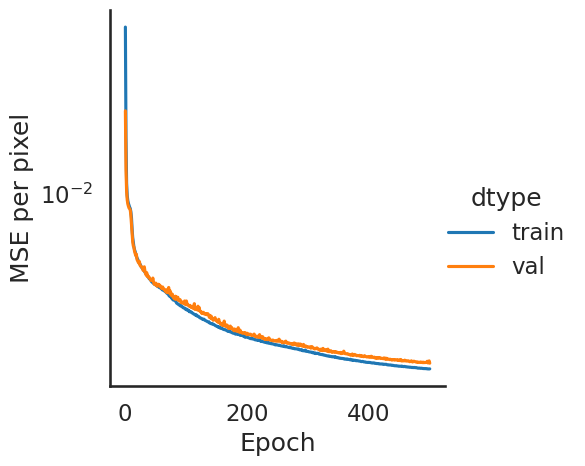

In [31]:
# plot data
sns.set_style('white')
sns.set_context('talk')

#  ???? (metrics_df.epoch > 20) 
data_queried = metrics_df[(metrics_df.epoch > 0) & ~pd.isna(metrics_df.loss)] # (metrics_df.epoch > 20) 

# Remove duplicates based on epoch and dtype
data_queried = data_queried.drop_duplicates(subset=['epoch', 'dtype']).reset_index(drop=True)

splt = sns.relplot(x='epoch', y='loss', hue='dtype', kind='line', data=data_queried)
splt.ax.set_xlabel('Epoch')
splt.ax.set_yscale('log')
splt.ax.set_ylabel('MSE per pixel')

if save_outputs:
    save_file = os.path.join(get_user_dir('fig'), 'ae', 'loss_vs_epoch')
    make_dir_if_not_exists(save_file)
    plt.savefig(save_file + '.' + format, dpi=300, format=format)

plt.show()


In [32]:
print(data_queried.index.value_counts())

0      1
671    1
658    1
659    1
660    1
      ..
338    1
339    1
340    1
341    1
999    1
Length: 1000, dtype: int64


# Multiple sessions? Plot train/val losses as a function of dataset

mannually set the session data

hparams['session'] = '2024-05-28'

or 

hparams['session'] = 'multisession-00'

In [38]:
from behavenet.fitting.utils import read_session_info_from_csv

# set model info
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': ae_model_experiment_name,
    'model_class': 'ae',
    'model_type': 'conv',
    'n_ae_latents': n_ae_latents,
}

# programmatically fill out other hparams options
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)
hparams['session'] = '2024-05-28' # here <----- mannually set the session data
hparams['session_dir'], sess_ids = get_session_dir(hparams)
hparams['expt_dir'] = get_expt_dir(hparams)

# find metrics csv file
versions = get_best_model_version(hparams['expt_dir'])
version_dir = os.path.join(hparams['expt_dir'], 'version_%i' % versions[0])
# load training metrics
metric_file = os.path.join(version_dir, 'metrics.csv')
metrics = pd.read_csv(metric_file)

# collect data from csv file

# read session information from session_info.csv, extract the "animal ID" and "session name"
sess_ids = read_session_info_from_csv(os.path.join(version_dir, 'session_info.csv'))
sess_ids_strs = []
for sess_id in sess_ids:
    # convert these into formatted strings
    sess_ids_strs.append(str('%s/%s' % (sess_id['animal'], sess_id['session'])))

# process Training and Validation Loss
metrics_df = []
for i, row in metrics.iterrows():
    # Iterates through each row of metrics.csv, extracting:
        # Epoch number
        # Validation loss (val_loss)
        # Training loss (tr_loss)
    # Stores losses in a DataFrame (metrics_df).
    # Labels losses as either "train" or "val".
    dataset = 'Combined' if row['dataset'] == -1 else sess_ids_strs[row['dataset']]
    metrics_df.append(pd.DataFrame({
        'dataset': dataset,
        'epoch': row['epoch'],
        'loss': row['val_loss'],
        'dtype': 'val',
    }, index=[0]))
    metrics_df.append(pd.DataFrame({
        'dataset': dataset,
        'epoch': row['epoch'],
        'loss': row['tr_loss'],
        'dtype': 'train',
    }, index=[0]))
metrics_df = pd.concat(metrics_df)

In [39]:
sess_ids_strs

['706893/2024-05-28']

In [ ]:
# plot data
sns.set_style('white')
sns.set_context('talk')

dtype = 'val'  # 'train' | 'val'
data_queried = metrics_df[
    (metrics_df.epoch > 20) & (metrics_df.dtype == dtype) & ~pd.isna(metrics_df.loss)]
splt = sns.relplot(x='epoch', y='loss', hue='dataset', kind='line', data=data_queried)
splt.ax.set_xlabel('Epoch')
splt.ax.set_yscale('log')
splt.ax.set_ylabel('MSE per pixel')
# plt.title('%s loss' % title_str)

if save_outputs:
    save_file = os.path.join(get_user_dir('fig'), 'ae', 'loss_vs_epoch_by_dataset')
    make_dir_if_not_exists(save_file)
    plt.savefig(save_file + '.' + format, dpi=300, format=format)

plt.show()

# Make reconstruction movies

/local1/behavenet_dir/behavenet/behavenet/plotting/__init__.py:143: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if version is 'best':


Generator contains 1 SingleSessionDatasetBatchedLoad objects:
xinxin_coupled-baiting_ear_706893_2024-05-28
    signals: ['images']
    transforms: OrderedDict([('images', None)])
    paths: OrderedDict([('images', '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_ear/706893/2024-05-28/data.hdf5')])

Loading model defined in /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_ear/706893/2024-05-28/ae/conv/08_latents/ear_3_views/version_0/meta_tags.pkl


/local1/behavenet_dir/behavenet/behavenet/fitting/utils.py:1059: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_file, map_location=lamb

saving video to /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/figures/ear/ae/D=08_recon_ae.mp4...done


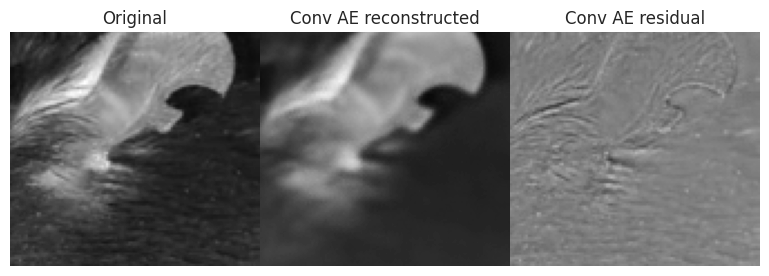

In [34]:
from behavenet.plotting.ae_utils import make_ae_reconstruction_movie_wrapper
from behavenet.data.utils import get_data_generator_inputs
from behavenet.data.data_generator import ConcatSessionsGenerator

# movie info
save_outputs = True
include_linear = False  # True to include reconstructions from linear models; need training

# set model info
version = 'best'  # test-tube version; 'best' finds the version with the lowest mse
sess_idx = 0  # when using a multisession, this determines which session is used
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': ae_model_experiment_name,
    # 'lin_experiment_name': 'ae-example',
    'lin_experiment_name': ae_model_experiment_name,
    'model_class': 'ae',
    'model_type': 'conv',
    'n_ae_latents': n_ae_latents,
    'frame_rate': frame_rate,  # frame rate of rendered movie, not original behavioral video
}

# programmatically fill out other hparams options
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)   
hparams['session_dir'], sess_ids = get_session_dir(hparams)
hparams['expt_dir'] = get_expt_dir(hparams)

# load data generator to find a test trial
hparams, signals, transforms, paths = get_data_generator_inputs(hparams, sess_ids)
data_generator = ConcatSessionsGenerator(
    hparams['data_dir'], sess_ids, 
    signals_list=signals, transforms_list=transforms, paths_list=paths,
    device='cuda', as_numpy=False, batch_load=True, rng_seed=0)
print(data_generator)
trial = data_generator.datasets[sess_idx].batch_idxs['test'][1]  # trial to use in movie

filename = str('D=%02i_recon_ae' % hparams['n_ae_latents'])
if include_linear:
    filename += '_wlinear'

make_ae_reconstruction_movie_wrapper(
    hparams, version=version, 
    save_file=os.path.join(get_user_dir('fig'), 'ae', filename), 
    include_linear=include_linear, trial=trial, max_frames=1000,
    frame_rate=hparams['frame_rate'])

# FA: explanation:
# def make_ae_reconstruction_movie_wrapper(
#         hparams, save_file, trial=None, sess_idx=0, version='best', include_linear=False,
#         max_frames=400, frame_rate=15):
#     """Produce a movie made up of the original video + reconstructed video + residual video.
#  
# frame_rate=500 & max_frames=5000: saves a video with speed and duration of original movie. demands about 100G memory. 21 min
# frame_rate=5 & max_frames=5000: saves a video with 10 times slower in speed and larger in duration of original movie. demands about 10-20G memory.

In [ ]:
make_ae_reconstruction_movie_wrapper?

# Original video for a specified trial 

In [ ]:
# Not sure if this function is necesary anymore

# import matplotlib.animation as animation
# import matplotlib.pyplot as plt
# from matplotlib.gridspec import GridSpec
# from behavenet.fitting.eval import get_reconstruction
# from behavenet.fitting.utils import get_best_model_and_data
# from behavenet.plotting import concat, save_movie
# from behavenet.plotting.ae_utils import make_reconstruction_movie

# # movie info
# save_outputs = True
# include_linear = False  # True to include reconstructions from linear models; need training

# # set model info
# version = 'best'  # test-tube version; 'best' finds the version with the lowest mse
# sess_idx = 0  # when using a multisession, this determines which session is used
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': '10D',
#     'lin_experiment_name': '10D',
#     'model_class': 'ae',
#     'model_type': 'conv',
#     'n_ae_latents': 10,
#     'frame_rate': 30,  # frame rate of rendered movie, not original behavioral video
# }   

# # programmatically fill out other hparams options
# get_lab_example(hparams, 'han', 'twoArmBand_Block')   
# hparams['session_dir'], sess_ids = get_session_dir(hparams)
# hparams['expt_dir'] = get_expt_dir(hparams)

# trial = 9
# frame_rate = 30

# # build model(s)
# if hparams['model_class'] == 'ae':
#     from behavenet.models import AE as Model
# elif hparams['model_class'] == 'cond-ae':
#     from behavenet.models import ConditionalAE as Model
# else:
#     raise NotImplementedError('"%s" is an invalid model class' % hparams['model_class'])
# model_ae, data_generator = get_best_model_and_data(hparams, Model, version=version)


# # push images through decoder
# if trial is None:
#     # choose first test trial
#     trial = data_generator.batch_idxs[sess_idx]['test'][0]
# batch = data_generator.datasets[sess_idx][trial]
# ims_orig_pt = batch['images'] #[:max_frames]

# if hparams['model_class'] == 'cond-ae':
#     labels_pt = batch['labels'] #[:max_frames]
# else:
#     labels_pt = None
    
    
#  # mask images for plotting
# # ...

# ims_orig = ims_orig_pt.cpu().detach().numpy()
# ims = [ims_orig] #, ims_recon_ae, 0.5 + (ims_orig - ims_recon_ae)]
# titles = ['Original', 'Conv AE reconstructed', 'Conv AE residual']
    
# if include_linear:
#     ims.append([])
#     ims.append(ims_recon_lin)
#     ims.append(0.5 + (ims_orig - ims_recon_lin))
#     titles.append('')
#     titles.append('Linear AE reconstructed')
#     titles.append('Linear AE residual')
#     n_rows = 2
#     n_cols = 3
# else:
#     n_rows = 1
#     n_cols = 1
    
# hparams['model_class'] = 'arhmm'
# hparams['trial_idx'] = trial

# #     if save_outputs:
# #         save_file = os.path.join(
# #             get_user_dir('fig'), hparams['model_class'], model_name + '.' + format)
# #     else:
# #         save_file = None

# if hparams['model_class'] == 'arhmm':           
#     model_name = str(
#         'single_trial_state_overlaied_latent_D=%02i_T=%02i_original_vid' % (
#         hparams['n_ae_latents'], hparams['trial_idx']))
# elif hparams['model_class'] == 'arhmm-labels':
#     model_name = str('single_trial_state_overlaied_latent_K=%02i_T=%02i_original_vid' % (
#         hparams['n_arhmm_states'], hparams['trial_idx']))
        
        
# #      if save_file is not None:
# #         make_dir_if_not_exists(save_file)
# #         fig.savefig(save_file, transparent=True, bbox_inches='tight')
# #         # plt.close(fig)   

# if save_outputs:
#     save_file = os.path.join(
#         get_user_dir('fig'), hparams['model_class'], model_name)
# #         get_user_dir('fig'), hparams['model_class'], hparams['trial_idx'], model_name)
# else:
#     save_file = None

# make_reconstruction_movie(
# ims=ims, titles=titles, n_rows=n_rows, n_cols=n_cols, save_file=save_file,
# frame_rate=frame_rate)

# # ims_orig

In [28]:
# # # Example indices (replace with your actual arrays or lists)
# # train_indices = [14, 15, 16, 17, 18, 19, 20, 21, 64, 65, 66, 67, 68, 69, 70, 71,
# #                  84, 85, 86, 87, 88, 89, 90, 91, 104, 105, 106, 107, 108, 109, 110, 111,
# #                  144, 145, 146, 147, 148, 149, 150, 151, 44, 45, 46, 47, 48, 49, 50, 51,
# #                  24, 25, 26, 27, 28, 29, 30, 31, 164, 165, 166, 167, 168, 169, 170, 171,
# #                  124, 125, 126, 127, 128, 129, 130, 131, 94, 95, 96, 97, 98, 99, 100, 101,
# #                  74, 75, 76, 77, 78, 79, 80, 81, 134, 135, 136, 137, 138, 139, 140, 141,
# #                  114, 115, 116, 117, 118, 119, 120, 121, 34, 35, 36, 37, 38, 39, 40, 41,
# #                  4, 5, 6, 7, 8, 9, 10, 11, 54, 55, 56, 57, 58, 59, 60, 61,
# #                  154, 155, 156, 157, 158, 159, 160, 161]

# # test_indices = [23, 73, 93, 113, 153, 53, 33, 173, 133, 103, 83, 143, 123, 43, 13, 63, 163]

# # val_indices = [22, 72, 92, 112, 152, 52, 32, 172, 132, 102, 82, 142, 122, 42, 12, 62, 162]

# # # Expected counts for a sanity check:
# # expected_train_count = 136
# # expected_test_count = 17
# # expected_val_count   = 17

# # # Check counts first:
# # assert len(train_indices) == expected_train_count, f"Expected {expected_train_count} train trials but got {len(train_indices)}"
# # assert len(test_indices)  == expected_test_count,  f"Expected {expected_test_count} test trials but got {len(test_indices)}"
# # assert len(val_indices)   == expected_val_count,   f"Expected {expected_val_count} val trials but got {len(val_indices)}"

# # Combine them into one global list preserving their original order within each dtype.
# # If you have a specific desired order (for example, interleaving or sorted by trial id),
# # you can modify the order here. For now, we'll just concatenate them in the order: train, test, val.

# global_trials = []
# for dtype, indices in [("train", train_indices), ("test", test_indices), ("val", val_indices)]:
#     for trial in indices:
#         global_trials.append({
#             "trial": trial,    # The trial identifier
#             "dtype": dtype     # The type of the trial (train, test, or val)
#         })

# # Now, assign a global index to each trial based on its position in the global list.
# for global_index, trial_info in enumerate(global_trials):
#     trial_info["global_index"] = global_index

# # Optionally, print out the global trial data:
# print("Global Trials:")
# for trial_info in global_trials:
#     print(trial_info)

# # Sanity check: Make sure that the total number of trials is as expected.
# total_expected = expected_train_count + expected_test_count + expected_val_count
# if len(global_trials) == total_expected:
#     print(f"\nAll trials are available. Total trials: {len(global_trials)}")
# else:
#     print(f"\nWarning: Expected {total_expected} trials, but got {len(global_trials)}")


Global Trials:
{'trial': 14, 'dtype': 'train', 'global_index': 0}
{'trial': 15, 'dtype': 'train', 'global_index': 1}
{'trial': 16, 'dtype': 'train', 'global_index': 2}
{'trial': 17, 'dtype': 'train', 'global_index': 3}
{'trial': 18, 'dtype': 'train', 'global_index': 4}
{'trial': 19, 'dtype': 'train', 'global_index': 5}
{'trial': 20, 'dtype': 'train', 'global_index': 6}
{'trial': 21, 'dtype': 'train', 'global_index': 7}
{'trial': 64, 'dtype': 'train', 'global_index': 8}
{'trial': 65, 'dtype': 'train', 'global_index': 9}
{'trial': 66, 'dtype': 'train', 'global_index': 10}
{'trial': 67, 'dtype': 'train', 'global_index': 11}
{'trial': 68, 'dtype': 'train', 'global_index': 12}
{'trial': 69, 'dtype': 'train', 'global_index': 13}
{'trial': 70, 'dtype': 'train', 'global_index': 14}
{'trial': 71, 'dtype': 'train', 'global_index': 15}
{'trial': 84, 'dtype': 'train', 'global_index': 16}
{'trial': 85, 'dtype': 'train', 'global_index': 17}
{'trial': 86, 'dtype': 'train', 'global_index': 18}
{'trial

# Section 2: ARHMM

In [13]:
import os
import pickle
import scipy.io as sio
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from behavenet import get_user_dir, make_dir_if_not_exists
from behavenet.data.utils import get_transforms_paths
from behavenet.data.utils import load_labels_like_latents
from behavenet.fitting.utils import get_expt_dir
from behavenet.fitting.utils import get_session_dir
from behavenet.fitting.utils import get_best_model_version
from behavenet.fitting.utils import get_lab_example
from behavenet.plotting.arhmm_utils import *

save_outputs = True  # true to save figures/movies to user's figure directory
format = 'png'  # figure format ('png' | 'jpeg' | 'pdf'); movies saved as mp4
# model_class = 'arhmm'  # 'arhmm' | 'arhmm-labels'

In [ ]:
# looks useless here, content is covered by upper cell. ????

# import os
# import pandas as pd
# import seaborn as sns
# import numpy as np
# import matplotlib.pyplot as plt
# from behavenet import get_user_dir, make_dir_if_not_exists
# from behavenet.fitting.utils import get_expt_dir
# from behavenet.fitting.utils import get_session_dir
# from behavenet.fitting.utils import get_best_model_version
# from behavenet.fitting.utils import get_lab_example

# save_outputs = True  # true to save figures/movies to user's figure directory
# format = 'png'  # figure format ('png' | 'jpeg' | 'pdf'); movies saved as mp4

## Train ARHMM

adjust config -> arhmm

### Copy ea config files in ~/.behavenet


In [2]:
import subprocess

command = f"cp -r /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/configs_xinxin/{bodypart}/arhmm_jsons/* ~/.behavenet"
# command = f"cp -r /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/configs_xinxin/tongue_mouth/ae_jsons/* ~/.behavenet"
subprocess.run(command, shell=True, check=True)

CompletedProcess(args='cp -r /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/configs_xinxin/ear/arhmm_jsons/* ~/.behavenet', returncode=0)

### Train ARHMM

In [4]:
# import subprocess

command = f"python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/arhmm_grid_search.py \
    --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_{bodypart}_params.json \
    --model_config /home/faeze.aminmansoor/.behavenet/arhmm_model.json \
    --training_config /home/faeze.aminmansoor/.behavenet/arhmm_training.json \
    --compute_config /home/faeze.aminmansoor/.behavenet/arhmm_compute.json"
subprocess.run(command, shell=True, check=True)


DATA CONFIG:
    lab: xinxin
    expt: coupled-baiting_ear
    animal: 706893
    session: 2024-05-28
    n_input_channels: 1
    y_pixels: 105
    x_pixels: 112
    use_output_mask: False
    frame_rate: 48.0
    neural_type: ca
    neural_bin_size: 0.020833333333333332
    approx_batch_size: 200

COMPUTE CONFIG:
    gpus_viz: 0
    device: cpu
    tt_n_gpu_trials: 1000
    tt_n_cpu_trials: 1000
    tt_n_cpu_workers: 5

TRAINING CONFIG:
    export_train_plots: False
    export_states: True
    n_iters: 100
    rng_seed_train: None
    arhmm_es_tol: 0
    as_numpy: True
    batch_load: False
    rng_seed_data: 0
    train_frac: 1.0
    trial_splits: 8;1;1;0

MODEL CONFIG:
    experiment_name: arhmm_ear_3_views
    n_arhmm_states: 2
    rng_seed_model: 0
    n_arhmm_lags: 1
    kappa: 0
    noise_type: gaussian
    transitions: stationary
    ae_experiment_name: ear_3_views
    ae_version: best
    ae_model_class: ae
    ae_model_type: conv
    n_ae_latents: 8
    model_class: arhmm
  

Exception ignored in: <function Pool.__del__ at 0x7fa60b4088b0>
Traceback (most recent call last):
  File "/home/faeze.aminmansoor/miniconda3/envs/behavenet/lib/python3.8/multiprocessing/pool.py", line 268, in __del__
  File "/home/faeze.aminmansoor/miniconda3/envs/behavenet/lib/python3.8/multiprocessing/queues.py", line 362, in put
AttributeError: 'NoneType' object has no attribute 'dumps'


CompletedProcess(args='python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/arhmm_grid_search.py     --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_ear_params.json     --model_config /home/faeze.aminmansoor/.behavenet/arhmm_model.json     --training_config /home/faeze.aminmansoor/.behavenet/arhmm_training.json     --compute_config /home/faeze.aminmansoor/.behavenet/arhmm_compute.json', returncode=0)

In [4]:
f"python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/arhmm_grid_search.py\
    --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_{bodypart}_params.json\
    --model_config /home/faeze.aminmansoor/.behavenet/arhmm_model.json\
    --training_config /home/faeze.aminmansoor/.behavenet/arhmm_training.json\
    --compute_config /home/faeze.aminmansoor/.behavenet/arhmm_compute.json"

'python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/arhmm_grid_search.py    --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_ear_params.json    --model_config /home/faeze.aminmansoor/.behavenet/arhmm_model.json    --training_config /home/faeze.aminmansoor/.behavenet/arhmm_training.json    --compute_config /home/faeze.aminmansoor/.behavenet/arhmm_compute.json'

python /local1/video-analysis/behavenet_dir/behavenet/behavenet/fitting/arhmm_grid_search.py --data_config /home/faeze.aminmansoor/.behavenet/xinxin_coupled-baiting_{bodypart}_params.json --model_config /home/faeze.aminmansoor/.behavenet/arhmm_model.json --training_config /home/faeze.aminmansoor/.behavenet/arhmm_training.json --compute_config /home/faeze.aminmansoor/.behavenet/arhmm_compute.json


## Analyze ARHMMs

### Get values of hparams from meta_tag.csv

In [15]:
# read the valuse of hparams from meta_tag.csv
import pandas as pd

# Path to your CSV file
# file_path = "meta_tag.csv"
meta_tag_file_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' +bodypart+ '/706893/2024-05-28/arhmm/' +n_ae_latents_str+ '_latents/02_states/stationary/gaussian/arhmm_' +bodypart+ '_3_views/version_0/meta_tags.csv'

# Load CSV
df_ = pd.read_csv(meta_tag_file_path)

# Extract frame rate
arhmm_model_experiment_name = df_[df_["key"] == "experiment_name"]["value"].values[0]
n_ae_latents = int(df_[df_["key"] == "n_ae_latents"]["value"].values[0])
experimenter_name = df_[df_["key"] == "lab"]["value"].values[0]
dataset_hparams_experiment_name = df_[df_["key"] == "expt"]["value"].values[0]
frame_rate = float(df_[df_["key"] == "frame_rate"]["value"].values[0])
noise_type = df_[df_["key"] == "noise_type"]["value"].values[0]
n_arhmm_lags = int(df_[df_["key"] == "n_arhmm_lags"]["value"].values[0])
ae_experiment_name = df_[df_["key"] == "ae_experiment_name"]["value"].values[0]
model_class = df_[df_["key"] == "model_class"]["value"].values[0]
arhmm_model_version = df_[df_["key"] == "version"]["value"].values[0]

print("arhmm_model_experiment_name:", arhmm_model_experiment_name)
print("n_ae_latents:", n_ae_latents)
print("experimenter_name:", experimenter_name)
print("dataset_hparams_experiment_name:", dataset_hparams_experiment_name)
print("frame_rate:", frame_rate)
print("noise_type:", noise_type)
print("n_arhmm_lags:", n_arhmm_lags)
print("ae_experiment_name:", ae_experiment_name)
print("model_class:", model_class)
print("arhmm_model_version:", arhmm_model_version)
print("")



device = df_[df_["key"] == "device"]["value"].values[0]
batch_load = df_[df_["key"] == "batch_load"]["value"].values[0]
rng_seed_model = int(df_[df_["key"] == "rng_seed_model"]["value"].values[0])
as_numpy = df_[df_["key"] == "as_numpy"]["value"].values[0]
rng_seed_data = int(df_[df_["key"] == "rng_seed_data"]["value"].values[0])
trial_splits = df_[df_["key"] == "trial_splits"]["value"].values[0]
train_frac = float(df_[df_["key"] == "train_frac"]["value"].values[0])


print("device:", device)
print("batch_load:", batch_load)
print("rng_seed_model:", rng_seed_model)
print("as_numpy:", as_numpy)
print("rng_seed_data:", rng_seed_data)
print("trial_splits:", trial_splits)
print("train_frac:", train_frac)

arhmm_model_experiment_name: arhmm_ear_3_views
n_ae_latents: 8
experimenter_name: xinxin
dataset_hparams_experiment_name: coupled-baiting_ear
frame_rate: 48.0
noise_type: gaussian
n_arhmm_lags: 1
ae_experiment_name: ear_3_views
model_class: arhmm
arhmm_model_version: 0

device: cpu
batch_load: False
rng_seed_model: 0
as_numpy: True
rng_seed_data: 0
trial_splits: 8;1;1;0
train_frac: 1.0


#### Make sure the ARHMM_model_version in meta_tag_file_path is correct

In [16]:
# Extract the version number
version = meta_tag_file_path.split("version_")[1].split("/")[0]

print("version assigned in meta_tag_file_path path: ", version) 
print("'best version' as stored in meta_tag.csv: ", arhmm_model_version)

assert version == arhmm_model_version, "Version mismatch"

version assigned in meta_tag_file_path path:  0
'best version' as stored in meta_tag.csv:  0


<!-- ### Enter manually -->

In [ ]:
# n_arhmm_states = [2,4,8,12,16,20,32]  

<!-- #### Build and define the "dfs" directories -->

In [ ]:
# import os

# # Define the directory path
# dfs_dir = f"/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_{bodypart}/706893/2024-05-28/dfs"

# # Ensure the directory exists
# os.makedirs(dfs_dir, exist_ok=True)


### Set up common hparams


In [17]:
# Set up common hparams
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': arhmm_model_experiment_name,
    'model_class': model_class,
    'model_type': None,
    'noise_type': noise_type,
    'n_arhmm_lags': n_arhmm_lags,
    'transitions': 'stationary',
    'ae_experiment_name': ae_experiment_name,
    'ae_model_class': 'ae',
    'ae_model_type': 'conv',
    'ae_version': 'best',
    'n_ae_latents': n_ae_latents,
    'device': device,
    'as_numpy': as_numpy,
    'batch_load': batch_load,
    'rng_seed_model': rng_seed_model,
    'rng_seed_data': rng_seed_data,
    'trial_splits': trial_splits,
    'train_frac': train_frac,
}
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)


In [ ]:
# is moved to the top ????

# import os
# import pickle
# import scipy.io as sio
# import pandas as pd
# import seaborn as sns
# import numpy as np
# import matplotlib.pyplot as plt

# from behavenet import get_user_dir, make_dir_if_not_exists
# from behavenet.data.utils import get_transforms_paths
# from behavenet.data.utils import load_labels_like_latents
# from behavenet.fitting.utils import get_expt_dir
# from behavenet.fitting.utils import get_session_dir
# from behavenet.fitting.utils import get_best_model_version
# from behavenet.fitting.utils import get_lab_example
# from behavenet.plotting.arhmm_utils import *

# save_outputs = True  # true to save figures/movies to user's figure directory
# format = 'png'  # figure format ('png' | 'jpeg' | 'pdf'); movies saved as mp4
# # model_class = 'arhmm'  # 'arhmm' | 'arhmm-labels'


In [ ]:
"""Fa: comment out for now"""
# import pandas as pd
# # csv_file = 'scratch/results/han/twoArmBand_Block/09/20210419/ae/conv/10_latents/10D/version_0/metrics.csv'
# csv_file = '/root/capsule/scratch/results/han/stacked_side_bottom_128/HH09/S04_20210419/arhmm/32_latents/32_states/stationary/gaussian/n_states_search/version_0/metrics.csv'
# data= pd.read_csv(csv_file)
# data[50:100]


## Get training metric_df

In [21]:
from behavenet.fitting.utils import get_subdirs

# define which arhmm states to plot (must already be fit)
# model_class = 'arhmm'
# n_arhmm_states = [2,4,8,12,16]  #[64, 128, 256, 512]

# set model parametrs (hparams)
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': arhmm_model_experiment_name,
    'model_class': model_class,
    'model_type': None,
    'noise_type': noise_type,
    'n_arhmm_lags': n_arhmm_lags,
    'transitions': 'stationary',
    'ae_experiment_name': ae_experiment_name,
    'n_ae_latents': n_ae_latents,
}
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# Loop over different ARHMM models
metrics_df = []
for n_states in n_arhmm_states:
    hparams['n_arhmm_states'] = n_states
    hparams['session_dir'], _ = get_session_dir(hparams)
    # Retrieves the experiment directory where trained models are stored.
    expt_dir = get_expt_dir(hparams)

    # gather all versions

    # find model version in the directory
    try:
        versions = get_subdirs(expt_dir)
    except Exception:
        print('No models in %s; skipping' % expt_dir)
        continue

    # load csv files with model metrics (saved out from test tube)

    # Extract model training metrics from metric.csv files
    for i, version in enumerate(versions):
        # read metrics csv file
        model_dir = os.path.join(expt_dir, version)
        try:
            metrics = pd.read_csv(os.path.join(model_dir, 'metrics.csv'))
        except:
            continue
        #  Load meta_tags.pkl and check if training is complete
        # Opens meta_tags.pkl
        with open(os.path.join(model_dir, 'meta_tags.pkl'), 'rb') as f:
            hp_new = pickle.load(f)
        # If the model's training was not completed, it skips this version.
        if not hp_new['training_completed']:
            continue
        # Extract and store test loss
        for i, row in metrics.iterrows():
        # Iterates through each epoch's metrics.
        # If the test_loss column exists, stores:
            # epoch (training step)
            # test_loss (model performance)
            # n_states (ARHMM state count)
            if 'test_loss' in row:
                metrics_df.append(pd.DataFrame({
                    'epoch': row['epoch'],
                    'loss': row['test_loss'],
                    'n_states': n_states}, index=[0]))
                
# Merges all extracted test losses into a single DataFrame for analysis.
metrics_df = pd.concat(metrics_df,ignore_index=True) # error here for duplicated index in metrics.csv . solved by setting "export_train_plots" = false. It saves the plot "LL vs n_arhmm_latent" when plotting it in the next cell.
# metrics_df.reset_index(level=0, inplace=True) ?????

In [9]:
metrics_df.tail(10)

,epoch,loss,n_states
1523,100,1.125786,32
1524,100,1.249577,32
1525,100,1.096104,32
1526,100,1.210726,32
1527,100,0.791378,32
1528,100,0.955401,32
1529,100,1.046132,32
1530,100,1.417366,32
1531,100,1.047783,32
1532,100,1.032458,32


# Plot validation log probability as a function of discrete states

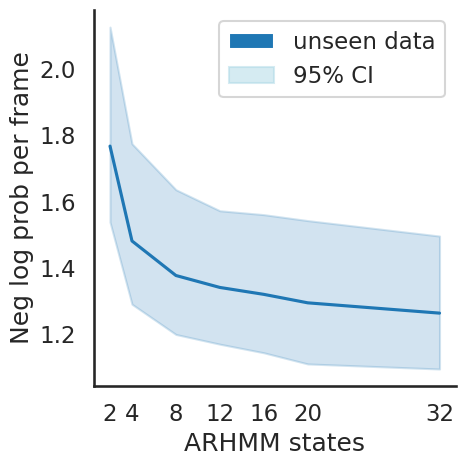

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

sns.set_style('white')
sns.set_context('talk')

# Create the plot with 95% CI
splt = sns.relplot(x='n_states', y='loss', kind='line', data=metrics_df, ci=95) # kind="line" By default, the resulting plot shows the mean and 95% CI for each unit

splt.ax.set_xlabel('ARHMM states')
splt.ax.set_xticks(n_arhmm_states)
splt.ax.set_xticklabels(n_arhmm_states)
splt.ax.set_ylabel('Neg log prob per frame')

# Manually create a legend with a patch for "95% CI"
line_label = mpatches.Patch(label="unseen data")  # Line color
ci_patch = mpatches.Patch(color="lightblue", alpha=0.5, label="95% CI")  # CI shading

splt.ax.legend(handles=[line_label, ci_patch])

# Save the plot if needed
if save_outputs:
    filename = os.path.join(get_user_dir('fig'), hparams['model_class'], 'll_test_vs_states')
    make_dir_if_not_exists(filename)
    plt.savefig(filename + '.' + format, dpi=300, format=format)

plt.show()


In [33]:
metrics_df.groupby('n_states')['loss'].std()


n_states
2     0.692944
4     0.529702
8     0.497897
12    0.481752
16    0.476963
20    0.460474
32    0.458343
Name: loss, dtype: float64

In [34]:
metrics_df.groupby('n_states').count()


,epoch,loss
n_states,,
2,219,17
4,219,17
8,219,17
12,219,17
16,219,17
20,219,17
32,219,17


In [35]:
metrics_df.isna().sum()


epoch          0
loss        1414
n_states       0
dtype: int64

In [ ]:
metrics_df['dtype'].value_counts()


In [37]:
from behavenet.fitting.utils import get_subdirs

# define which arhmm states to plot (must already be fit)
# model_class = 'arhmm'
# n_arhmm_states = [2,4,8,12,16]  #[64, 128, 256, 512]

# set model parametrs (hparams)
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': arhmm_model_experiment_name,
    'model_class': model_class,
    'model_type': None,
    'noise_type': noise_type,
    'n_arhmm_lags': n_arhmm_lags,
    'transitions': 'stationary',
    'ae_experiment_name': ae_experiment_name,
    'n_ae_latents': n_ae_latents,
}
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# Loop over different ARHMM models
metrics_df = []
for n_states in n_arhmm_states:
    hparams['n_arhmm_states'] = n_states
    hparams['session_dir'], _ = get_session_dir(hparams)
    # Retrieves the experiment directory where trained models are stored.
    expt_dir = get_expt_dir(hparams)

    # gather all versions

    # find model version in the directory
    try:
        versions = get_subdirs(expt_dir)
    except Exception:
        print('No models in %s; skipping' % expt_dir)
        continue

    # load csv files with model metrics (saved out from test tube)

    # Extract model training metrics from metric.csv files
    for i, version in enumerate(versions):
        # read metrics csv file
        model_dir = os.path.join(expt_dir, version)
        try:
            metrics = pd.read_csv(os.path.join(model_dir, 'metrics.csv'))
        except:
            continue
        #  Load meta_tags.pkl and check if training is complete
        # Opens meta_tags.pkl
        with open(os.path.join(model_dir, 'meta_tags.pkl'), 'rb') as f:
            hp_new = pickle.load(f)
        # If the model's training was not completed, it skips this version.
        if not hp_new['training_completed']:
            continue
        # Extract training, validation, and test losses
        for _, row in metrics.iterrows():
            # Store validation loss
            metrics_df.append({
                'epoch': row['epoch'],
                'loss': row['val_loss'],
                'dtype': 'val',
                'n_states': n_states
            })

            # Store training loss
            metrics_df.append({
                'epoch': row['epoch'],
                'loss': row['tr_loss'],
                'dtype': 'train',
                'n_states': n_states
            })

            # Store test loss if available
            if 'test_loss' in row and pd.notna(row['test_loss']):
                metrics_df.append({
                    'epoch': row['epoch'],
                    'loss': row['test_loss'],
                    'dtype': 'test',
                    'n_states': n_states
                })

# Convert list to DataFrame
if metrics_df:
    metrics_df = pd.DataFrame(metrics_df)
    metrics_df.reset_index(drop=True, inplace=True)
    print(metrics_df.head())  # Display first few rows
else:
    print("No valid metrics data found.")
                
# # Merges all extracted test losses into a single DataFrame for analysis.
# metrics_df = pd.concat(metrics_df,ignore_index=True) # error here for duplicated index in metrics.csv . solved by setting "export_train_plots" = false. It saves the plot "LL vs n_arhmm_latent" when plotting it in the next cell.
# # metrics_df.reset_index(level=0, inplace=True) ?????

   epoch      loss  dtype  n_states
0      0  2.437420    val         2
1      0  2.468336  train         2
2      0  2.437420    val         2
3      0  2.468336  train         2
4      1  2.017909    val         2


In [38]:
metrics_df.tail(20)

,epoch,loss,dtype,n_states
3165,100,NaN,train,32
3166,100,1.210726,test,32
3167,100,NaN,val,32
3168,100,NaN,train,32
3169,100,0.791378,test,32
3170,100,NaN,val,32
3171,100,NaN,train,32
3172,100,0.955401,test,32
3173,100,NaN,val,32
3174,100,NaN,train,32


In [39]:
metrics_df.loss

0       2.437420
1       2.468336
2       2.437420
3       2.468336
4       2.017909
          ...   
3180         NaN
3181    1.047783
3182         NaN
3183         NaN
3184    1.032458
Name: loss, Length: 3185, dtype: float64

In [40]:
print(metrics_df.columns)


Index(['epoch', 'loss', 'dtype', 'n_states'], dtype='object')


#### Plot loss trends across all epochs for Train Data

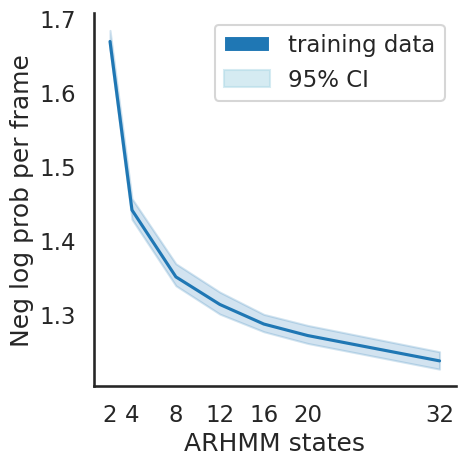

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

sns.set_style('white')
sns.set_context('talk')

# Filter only "train" dtype
train_metrics_df = metrics_df[metrics_df['dtype'] == 'train']
val_metric_df = metrics_df[metrics_df['dtype'] == 'val']
test_metric_df = metrics_df[metrics_df['dtype'] == 'test']

# Create the plot with 95% CI
splt = sns.relplot(x='n_states', y='loss', kind='line', data=train_metrics_df, ci=95) # kind="line" By default, the resulting plot shows the mean and 95% CI for each unit

splt.ax.set_xlabel('ARHMM states')
splt.ax.set_xticks(n_arhmm_states)
splt.ax.set_xticklabels(n_arhmm_states)
splt.ax.set_ylabel('Neg log prob per frame')

# Manually create a legend with a patch for "95% CI"
line_label = mpatches.Patch(label="training data")  # Line color
ci_patch = mpatches.Patch(color="lightblue", alpha=0.5, label="95% CI")  # CI shading

splt.ax.legend(handles=[line_label, ci_patch])

# Save the plot if needed
if save_outputs:
    filename = os.path.join(get_user_dir('fig'), hparams['model_class'], 'll_test_vs_states')
    make_dir_if_not_exists(filename)
    plt.savefig(filename + '.' + format, dpi=300, format=format)

plt.show()


#### Plot loss trends across all epochs for all Data Types

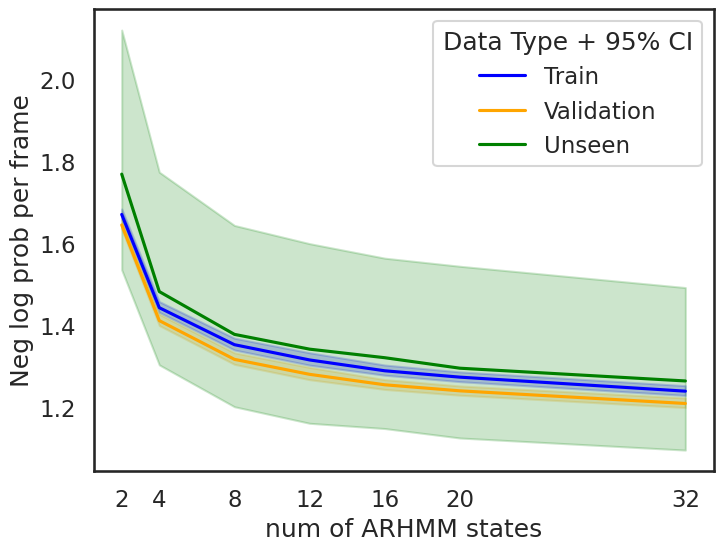

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style('white')
sns.set_context('talk')

plt.figure(figsize=(8, 6))

# Filter only "train" dtype
train_metrics_df = metrics_df[metrics_df['dtype'] == 'train']
val_metric_df = metrics_df[metrics_df['dtype'] == 'val']
test_metric_df = metrics_df[metrics_df['dtype'] == 'test']

# Plot Train Data
sns.lineplot(x='n_states', y='loss', data=train_metrics_df, label="Train", ci=95, color="blue")

# Plot Validation Data
sns.lineplot(x='n_states', y='loss', data=val_metric_df, label="Validation", ci=95, color="orange")

# Plot Test Data
sns.lineplot(x='n_states', y='loss', data=test_metric_df, label="Unseen", ci=95, color="green")

# Labels and Formatting
plt.xlabel('num of ARHMM states')
plt.ylabel('Neg log prob per frame')
plt.legend(title="Data Type + 95% CI")
plt.xticks(sorted(metrics_df['n_states'].unique()))

plt.show()


#### Plot loss trends for ONLY final epoch for all Data Types

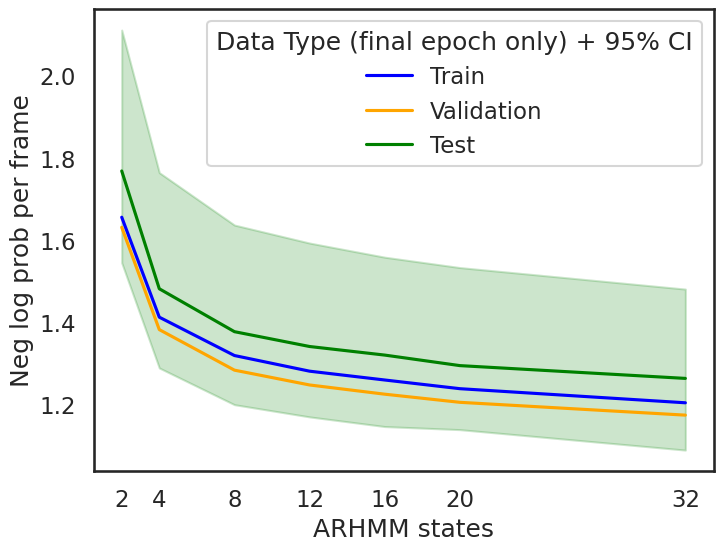

In [45]:

sns.set_style('white')
sns.set_context('talk')

plt.figure(figsize=(8, 6))

# Filter only "train" dtype
# Get the last epoch for each n_states in train data
train_last_epoch_metric_df = metrics_df[metrics_df['dtype'] == 'train'].loc[ metrics_df[metrics_df['dtype'] == 'train'].groupby("n_states")["epoch"].idxmax()]
val_last_epoch_metric_df = metrics_df[metrics_df['dtype'] == 'val'].loc[ metrics_df[metrics_df['dtype'] == 'val'].groupby("n_states")["epoch"].idxmax()]

# val_metric_df = metrics_df[metrics_df['dtype'] == 'val']
test_metric_df = metrics_df[metrics_df['dtype'] == 'test']

# Plot Train Data
sns.lineplot(x='n_states', y='loss', data=train_last_epoch_metric_df, label="Train", ci=95, color="blue")

# Plot Validation Data
sns.lineplot(x='n_states', y='loss', data=val_last_epoch_metric_df, label="Validation", ci=95, color="orange")

# Plot Test Data
sns.lineplot(x='n_states', y='loss', data=test_metric_df, label="Test", ci=95, color="green")

# Labels and Formatting
plt.xlabel('ARHMM states')
plt.ylabel('Neg log prob per frame')
plt.legend(title="Data Type (final epoch only) + 95% CI")
plt.xticks(sorted(metrics_df['n_states'].unique()))

plt.show()

In [46]:
test_metric_df

,epoch,loss,dtype,n_states
406,100,4.347565,test,2
409,100,1.387007,test,2
412,100,1.830478,test,2
415,100,1.833583,test,2
418,100,1.739366,test,2
...,...,...,...,...
3172,100,0.955401,test,32
3175,100,1.046132,test,32
3178,100,1.417366,test,32
3181,100,1.047783,test,32


In [47]:
train_last_epoch_metric_df

,epoch,loss,dtype,n_states
401,100,1.655014,train,2
856,100,1.411742,train,4
1311,100,1.318406,train,8
1766,100,1.280309,train,12
2221,100,1.258850,train,16
2676,100,1.237705,train,20
3131,100,1.203390,train,32


In [48]:
metrics_df.groupby('n_states')['loss'].std()


n_states
2     0.163377
4     0.144188
8     0.143067
12    0.144021
16    0.129876
20    0.125572
32    0.123658
Name: loss, dtype: float64

In [49]:
metrics_df.groupby('n_states').count()


,epoch,loss,dtype
n_states,,,
2,455,421,455
4,455,421,455
8,455,421,455
12,455,421,455
16,455,421,455
20,455,421,455
32,455,421,455


In [50]:
metrics_df.isna().sum()


epoch         0
loss        238
dtype         0
n_states      0
dtype: int64

In [51]:
metrics_df['dtype'].value_counts()


val      1533
train    1533
test      119
Name: dtype, dtype: int64

# Plot validation likelihood as a function of discrete states

In [14]:
"""Fa: coment out for now"""
# from behavenet.fitting.utils import get_subdirs

# # define which arhmm states to plot (must already be fit)
# model_class = 'arhmm'
# n_arhmm_states = [8,12]  #[64, 128, 256, 512]

# # set model info
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': 'state_number_search',
#     'model_class': model_class,
#     'model_type': None,
#     'noise_type': 'gaussian',
#     'n_arhmm_lags': 1,
#     'transitions': 'stationary',
#     'ae_experiment_name': 'ae-example',
#     'n_ae_latents': 32,
# }
# get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# metrics_df = []
# for n_states in n_arhmm_states:
#     hparams['n_arhmm_states'] = n_states
#     hparams['session_dir'], _ = get_session_dir(hparams)
#     expt_dir = get_expt_dir(hparams)
#     # gather all versions
#     try:
#         versions = get_subdirs(expt_dir)
#     except Exception:
#         print('No models in %s; skipping' % expt_dir)
#         continue
#     # load csv files with model metrics (saved out from test tube)
#     for i, version in enumerate(versions):
#         # read metrics csv file
#         model_dir = os.path.join(expt_dir, version)
#         try:
#             metrics = pd.read_csv(os.path.join(model_dir, 'metrics.csv'))
#         except:
#             continue
#         with open(os.path.join(model_dir, 'meta_tags.pkl'), 'rb') as f:
#             hp_new = pickle.load(f)
#         if not hp_new['training_completed']:
#             continue
#         for i, row in metrics.iterrows():
# #             print(i)
#             if 'test_loss' in row:
# #                 print(i)
#                 metrics_df.append(pd.DataFrame({
#                     'epoch': row['epoch'],
#                     'loss': -row['test_loss']/np.log(2),
#                     'n_states': n_states}, index=[0]))
# metrics_df = pd.concat(metrics_df,ignore_index=True)
# # metrics_df.reset_index(level=0, inplace=True)

In [16]:
"""Fa: coment out for now"""
# # plot data
# sns.set_style('white')
# sns.set_context('talk')

# splt = sns.relplot(x='n_states', y='loss', hue=None, kind='line', data=metrics_df) # kind="line" By default, the resulting plot shows the mean and 95% CI for each unit
# splt.ax.set_xlabel('ARHMM states')
# splt.ax.set_xscale('log')
# splt.ax.set_xticks(n_arhmm_states)
# splt.ax.set_xticklabels(n_arhmm_states)
# # splt.ax.set_ylabel('Neg log prob per frame')
# splt.ax.set_ylabel('likelihood per frame')

# if save_outputs:
#     filename = os.path.join(get_user_dir('fig'), hparams['model_class'], 'l_vs_states')
#     make_dir_if_not_exists(filename)
#     plt.savefig(filename + '.' + format, dpi=300, format=format)

# plt.show()

In [ ]:
"""Fa: coment out for now"""
# metrics_df['loss']
# metrics_df.index.values

In [ ]:
"""Fa: coment out for now"""
# a = pd.read_csv(os.path.join(model_dir, 'metrics.csv'))
# a[:100]

In [ ]:
"""Fa: coment out for now"""
# for i, row in metrics.iterrows():
#     if 'test_loss' in row and i==0:
#         print(i, row, row['test_loss'])

In [ ]:
"""Fa: coment out for now"""
# metrics_df[~metrics_df.index.duplicated()]

In [ ]:
"""Fa: coment out for now"""
# metrics_df.index.is_unique
# metrics_df.index.duplicated()
# metrics_df = metrics_df.loc[~metrics_df.index.duplicated(), :]
# # metrics_df[metrics_df.index.duplicated()]
# # metrics_df = metrics_df.loc[:,~metrics_df.columns.duplicated()]

In [ ]:
"""Fa: coment out for now"""
# metrics_df[:20]

# Visualize state segmentations for multiple trials

In [27]:
def plot_segmentations_by_trial(
        states, xtick_locs=None, xticklabel_offset=0, frame_rate=None, save_file=None, 
        title=None, cmap='tab20b',dtype=None, trial_idxs=None):
    # "states" in this function is : [mdict['states'][dtype][t] for t in trial_vec], a list of available trials
    
    from matplotlib.lines import Line2D

    n_trials = len(states)
    print(f'n_trials plotting = {n_trials}')
    # print('trials in plot: ', states)

    fig = plt.figure(figsize=(10, n_trials /4))
    gs_bottom_left = plt.GridSpec(n_trials, 1, top=0.85, right=1)
    # for i_trial in range(n_trials):

    #     axes = plt.subplot(gs_bottom_left[i_trial, 0])
    #     axes.imshow(
    #         states[i_trial][None, :], aspect='auto',
    #         extent=(0, len(states[i_trial]), 0, 1), cmap=cmap, alpha=0.8)
    #     axes.set_xticks([])
    #     axes.set_yticks([])
    #     axes.set_frame_on(False)

    for i_trial in range(n_trials):

        axes = plt.subplot(gs_bottom_left[i_trial, 0])
        axes.imshow(
            states[i_trial][None, :], aspect='auto',
            extent=(0, len(states[i_trial]), 0, 1), cmap=cmap, alpha=0.8)
        axes.set_xticks([])
        axes.set_yticks([.5])  # Set a y-tick at the center of the row
        axes.set_yticklabels([f'Seg {trial_idxs[i_trial]}'])  # Label it with the trial index
        axes.set_frame_on(False)




    if xtick_locs is not None and frame_rate is not None:
        axes.set_xticks(xtick_locs)
        axes.set_xticklabels(
            ((xticklabel_offset + np.asarray(xtick_locs)) / frame_rate).astype('int'))
        axes.set_xlabel('Time (s)')
    else:
        axes.set_xlabel('Time (bins)')
    axes = plt.subplot(gs_bottom_left[int(np.floor(n_trials / 2)), 0])
    axes.set_ylabel('Trials')

    # Set the y-label according to the dtype
    axes = plt.subplot(gs_bottom_left[int(np.floor(n_trials / 2)), 0])
    axes.set_ylabel(f'Trials - {dtype} set')  # Changed label here depending on dtype


    plt.suptitle(title, y=1/n_trials + 1)
    plt.tight_layout()

    if save_file is not None:
        make_dir_if_not_exists(save_file)
        fig.savefig(save_file, transparent=True, bbox_inches='tight')
        # plt.close(fig)
    plt.show()
    return fig

In [ ]:
# ### Add Harp timestamps to arhmm_latents_df
# # 
# # import pandas as pd

# T

# # Load the arhmm_latents_df
# arhmm_latents_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' +bodypart+ '/706893/2024-05-28/dfs/arhmm_latents_df.csv'
# arhmm_latents_df = pd.read_csv(arhmm_latents_path)

# # Ensure both DataFrames have the same length .....????
# # assert len(arhmm_latents_df) == len(harp_ts_df) - total_num_initial_frames_to_exclude - total_num_late_frames_to_exclude

# # Remove the first 'total_num_frames_in_segments' rows
# harp_ts_df_ = harp_ts_df.iloc[total_num_initial_frames_to_exclude:total_num_frames - total_num_late_frames_to_exclude-1].reset_index(drop=True)

# # Add a new column for the remaining harp timestamps
# arhmm_latents_df["Harp_Timestamp"] = harp_ts_df_["Selected_Values"]

# # Save the updated dataframe
# arhmm_latents_df.to_csv('/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' +bodypart+ '/706893/2024-05-28/dfs/arhmm_latents_df_.csv', index=False)

# # Display the first few rows
# print(arhmm_latents_df.head())



# len(arhmm_latents_df)

# len(harp_ts_df)

# len(arhmm_latents_df) -(len(harp_ts_df) - total_num_initial_frames_to_exclude - total_num_late_frames_to_exclude)

In [54]:
# import numpy as np

# data = np.array([40, 41, 42, 43, 44, 45, 46, 47, 180, 181, 182, 183, 184, 185, 186, 187,
#                  210, 211, 212, 213, 214, 215, 216, 217, 190, 191, 192, 193, 194, 195,
#                  196, 197, 90, 91, 92, 93, 94, 95, 96, 97, 350, 351, 352, 353, 354, 355,
#                  356, 357, 30, 31, 32, 33, 34, 35, 36, 37, 0, 1, 2, 3, 4, 5, 6, 7])

# sorted_indices = np.argsort(data)

# print(sorted_indices)

# print(data[sorted_indices])


In [28]:
# replaced by next cell, in which real-time is refined to be coming from the harp_ts_df. and Harp_timestam is also added in arhmm_latent_df
# if next cell iworks well, del this cell.

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Import model utilities (adjust these imports to your environment)
from behavenet.plotting.arhmm_utils import get_model_latents_states
from behavenet import get_user_dir
# from behavenet.utils import get_lab_example #, make_dir_if_not_exists  # adjust as needed


# -----------------------------
# Common parameters (update these for your setup)
# -----------------------------
get_best_version = True
sess_idx = 0
max_frames = 1500
# frame_rate =   # Hz (example value)
# n_arhmm_states = [2, 4]  # Example state numbers to iterate over
dtypes_all = ['train', 'val', 'test']


# X-tick locations (frame indices)
xtick_locs = [0, 250, 500]


# Set up common hparams
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': arhmm_model_experiment_name,
    'model_class': model_class,
    'model_type': None,
    'noise_type': noise_type,
    'n_arhmm_lags': n_arhmm_lags,
    'transitions': 'stationary',
    'ae_experiment_name': ae_experiment_name,
    'ae_model_class': 'ae',
    'ae_model_type': 'conv',
    'ae_version': 'best',
    'n_ae_latents': n_ae_latents,
    'device': device,
    'as_numpy': as_numpy,
    'batch_load': batch_load,
    'rng_seed_model': rng_seed_model,
    'rng_seed_data': rng_seed_data,
    'trial_splits': trial_splits,
    'train_frac': train_frac,
}
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# -----------------------------
# Mode functions
# -----------------------------
def run_single_mode(dtype="train"):
    """
    Plot ARHMM state segmentations for a single dtype (e.g. 'train').
    """
    print(f"Running single mode for dtype: {dtype}")
    for n_states in n_arhmm_states:
        hparams['n_arhmm_states'] = n_states
        if model_class == 'arhmm':
            model_name = f'multitrial_segmentation_D={hparams["n_ae_latents"]:02d}_K={n_states:02d}_{dtype}Set'
        else:
            model_name = f'multitrial_segmentation_K={n_states:02d}'
        
        mdict = get_model_latents_states(hparams, version='best', dtype=dtype, dtypes=[dtype])
        trial_vec = np.argsort(mdict['trial_idxs'][dtype])
        # Update states for each selected trial (limit frames)
        for i, j in enumerate(trial_vec):
            x = mdict['latents'][dtype][j][:max_frames]
            states_tmp = mdict['model'].most_likely_states(x)
            n_frames = len(states_tmp)
            mdict['states'][dtype][j][:n_frames] = states_tmp

        save_file = os.path.join(get_user_dir('fig'), model_class, model_name + '.png') if get_best_version else None
        fig = plot_segmentations_by_trial(
            [mdict['states'][dtype][t] for t in trial_vec],
            xtick_locs=xtick_locs,
            xticklabel_offset=0,
            frame_rate=frame_rate,
            save_file=save_file,
            title=model_name,
            cmap='tab20b',
            dtype=dtype,
            trial_idxs=mdict['trial_idxs'][dtype][trial_vec]
        )
        plt.show()


def run_all_mode():
    """
    Plot ARHMM state segmentations for all trials across dtypes.
    """
    print("Running all mode for dtypes:", dtypes_all)
    for n_states in n_arhmm_states:
        hparams['n_arhmm_states'] = n_states
        if model_class == 'arhmm':
            model_name = f'multitrial_segmentation_D={hparams["n_ae_latents"]:02d}_K={n_states:02d}_AllTrials'
        else:
            model_name = f'multitrial_segmentation_K={n_states:02d}'
        
        all_states = []
        all_trial_indices = []
        for dtype in dtypes_all:
            print(f"Collecting data for {dtype}")
            mdict = get_model_latents_states(hparams, version='best', dtype=dtype, dtypes=[dtype])
            trial_indices = mdict['trial_idxs'][dtype]
            sorted_indices = np.argsort(trial_indices)
            all_states.extend([mdict['model'].most_likely_states(mdict['latents'][dtype][j][:max_frames])
                               for j in sorted_indices])
            all_trial_indices.extend(trial_indices[sorted_indices])
        
        # Sort combined results by trial id
        combined = sorted(zip(all_trial_indices, all_states), key=lambda pair: pair[0].item())
        combined_trial_indices, combined_states = zip(*combined)
        
        save_file = os.path.join(get_user_dir('fig'), model_class, model_name + '.png') if get_best_version else None
        fig = plot_segmentations_by_trial(
            list(combined_states),
            xtick_locs=xtick_locs,
            xticklabel_offset=0,
            frame_rate=frame_rate,
            save_file=save_file,
            title=model_name,
            cmap='tab20b',
            dtype='combined',
            trial_idxs=combined_trial_indices
        )
        plt.show()


def run_continuous_mode(plot=True):
    """
    Combine all trials from all dtypes into a continuous session,
    store continuous states in a DataFrame (with timestamps and real time),
    save to CSV, and optionally plot the segmentation.
    """
    print("Running continuous mode for dtypes:", dtypes_all)
    arhmm_latent_df = pd.DataFrame()
    timestamps, real_time = None, None

    for n_states in n_arhmm_states:
        print(f"Processing : {n_states}-state model")
        hparams['n_arhmm_states'] = n_states
        if model_class == 'arhmm':
            model_name = f'multitrial_segmentation_D={hparams["n_ae_latents"]:02d}_K={n_states:02d}_AllTrials'
        else:
            model_name = f'multitrial_segmentation_K={n_states:02d}'

        all_states = []
        all_trial_indices = []
        for dtype in dtypes_all:
            print(f"    Collecting data for {dtype}")
            mdict = get_model_latents_states(hparams, version='best', dtype=dtype, dtypes=[dtype])
            trial_indices = mdict['trial_idxs'][dtype]
            sorted_indices = np.argsort(trial_indices)
            all_states.extend([mdict['model'].most_likely_states(mdict['latents'][dtype][j][:max_frames])
                               for j in sorted_indices])
            all_trial_indices.extend(trial_indices[sorted_indices])
        
        # Sort by trial id for plotting
        combined = sorted(zip(all_trial_indices, all_states), key=lambda pair: pair[0].item())
        combined_trial_indices, combined_states = zip(*combined)

        # Concatenate states into a continuous 1D array
        continuous_states = np.concatenate(combined_states)
        if timestamps is None and real_time is None:
            n_frames_total = len(continuous_states)
            timestamps = np.arange(n_frames_total)
            # real_time = timestamps / frame_rate
            arhmm_latent_df['Timestamp'] = timestamps
            # arhmm_latent_df['RealTime (s)'] = real_time

        colname = f'Most Likely State (K={n_states})'
        arhmm_latent_df[colname] = continuous_states

        if plot:
            save_file = os.path.join(get_user_dir('fig'), model_class, model_name + '.png') if get_best_version else None
            fig = plot_segmentations_by_trial(
                list(combined_states),
                xtick_locs=xtick_locs,
                xticklabel_offset=0,
                frame_rate=frame_rate,
                save_file=save_file,
                title=model_name,
                cmap='tab20b',
                dtype='combined',
                trial_idxs=combined_trial_indices
            )
            plt.show()

    # Save DataFrame to CSV
    output_csv_path = os.path.join(get_session_dir(hparams)[0], hparams['model_class'], f"{hparams['n_ae_latents']:02d}_latents", 'time_points_most_likely_states.csv')
    arhmm_latent_df.to_csv(output_csv_path, index=False)
    print(f"Continuous session states saved to: {output_csv_path}")
    print(arhmm_latent_df)



#     save_file = os.path.join(
#         get_user_dir('fig'), hparams['model_class'], model_name + '.png')

# -----------------------------
# Main function to set the mode and run the corresponding function
# -----------------------------
def main(mode="single", dtype="train", continuous_plot=True):
    """
    Main function to run one of the three modes.
    
    Args:
        mode (str): Mode to run. Options are:
            - "single": Plot ARHMM segmentations for a single dtype (e.g., 'train').
            - "all":    Plot segmentations for all trials across dtypes.
            - "continuous": Combine all trials into a continuous session, save a CSV, and optionally plot.
        dtype (str): Only used in "single" mode. For example, 'train', 'val', or 'test'.
        continuous_plot (bool): Only used in "continuous" mode. If True, plot the segmentation; if False, skip plotting.
    """
    if mode == "single":
        run_single_mode(dtype)
    elif mode == "all":
        run_all_mode()
    elif mode == "continuous":
        run_continuous_mode(plot=continuous_plot)
    else:
        print("Invalid mode selected. Please choose: 'single', 'all', or 'continuous'.")



# # -----------------------------
# # Example usage: change these values to run different modes
# # -----------------------------
# if __name__ == '__main__':
#     # Set mode and (if needed) dtype here.
#     selected_mode = "single"     # Options: "single", "all", "continuous"
#     selected_dtype = "train"     # Only used in "single" mode
#     main(mode=selected_mode, dtype=selected_dtype)


In [ ]:
# import os
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt

# # Import model utilities (adjust these imports to your environment)
# from behavenet.plotting.arhmm_utils import get_model_latents_states
# from behavenet import get_user_dir
# # from behavenet.utils import get_lab_example #, make_dir_if_not_exists  # adjust as needed


# # -----------------------------
# # Common parameters (update these for your setup)
# # -----------------------------
# get_best_version = True
# sess_idx = 0
# max_frames = 1500
# # frame_rate =   # Hz (example value)
# # n_arhmm_states = [2, 4]  # Example state numbers to iterate over
# dtypes_all = ['train', 'val', 'test']


# # X-tick locations (frame indices)
# xtick_locs = [0, 250, 500]


# # Set up common hparams
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': arhmm_model_experiment_name,
#     'model_class': model_class,
#     'model_type': None,
#     'noise_type': noise_type,
#     'n_arhmm_lags': n_arhmm_lags,
#     'transitions': 'stationary',
#     'ae_experiment_name': ae_experiment_name,
#     'ae_model_class': 'ae',
#     'ae_model_type': 'conv',
#     'ae_version': 'best',
#     'n_ae_latents': n_ae_latents,
#     'device': device,
#     'as_numpy': as_numpy,
#     'batch_load': batch_load,
#     'rng_seed_model': rng_seed_model,
#     'rng_seed_data': rng_seed_data,
#     'trial_splits': trial_splits,
#     'train_frac': train_frac,
# }
# get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# # -----------------------------
# # Mode functions
# # -----------------------------
# def run_single_mode(dtype="train"):
#     """
#     Plot ARHMM state segmentations for a single dtype (e.g. 'train').
#     """
#     print(f"Running single mode for dtype: {dtype}")
#     for n_states in n_arhmm_states:
#         hparams['n_arhmm_states'] = n_states
#         if model_class == 'arhmm':
#             model_name = f'multitrial_segmentation_D={hparams["n_ae_latents"]:02d}_K={n_states:02d}_{dtype}Set'
#         else:
#             model_name = f'multitrial_segmentation_K={n_states:02d}'
        
#         mdict = get_model_latents_states(hparams, version='best', dtype=dtype, dtypes=[dtype])
#         trial_vec = np.argsort(mdict['trial_idxs'][dtype])
#         # Update states for each selected trial (limit frames)
#         for i, j in enumerate(trial_vec):
#             x = mdict['latents'][dtype][j][:max_frames]
#             states_tmp = mdict['model'].most_likely_states(x)
#             n_frames = len(states_tmp)
#             mdict['states'][dtype][j][:n_frames] = states_tmp

#         save_file = os.path.join(get_user_dir('fig'), model_class, model_name + '.png') if get_best_version else None
#         fig = plot_segmentations_by_trial(
#             [mdict['states'][dtype][t] for t in trial_vec],
#             xtick_locs=xtick_locs,
#             xticklabel_offset=0,
#             frame_rate=frame_rate,
#             save_file=save_file,
#             title=model_name,
#             cmap='tab20b',
#             dtype=dtype,
#             trial_idxs=mdict['trial_idxs'][dtype][trial_vec]
#         )
#         plt.show()


# def run_all_mode():
#     """
#     Plot ARHMM state segmentations for all trials across dtypes.
#     """
#     print("Running all mode for dtypes:", dtypes_all)
#     for n_states in n_arhmm_states:
#         hparams['n_arhmm_states'] = n_states
#         if model_class == 'arhmm':
#             model_name = f'multitrial_segmentation_D={hparams["n_ae_latents"]:02d}_K={n_states:02d}_AllTrials'
#         else:
#             model_name = f'multitrial_segmentation_K={n_states:02d}'
        
#         all_states = []
#         all_trial_indices = []
#         for dtype in dtypes_all:
#             print(f"Collecting data for {dtype}")
#             mdict = get_model_latents_states(hparams, version='best', dtype=dtype, dtypes=[dtype])
#             trial_indices = mdict['trial_idxs'][dtype]
#             sorted_indices = np.argsort(trial_indices)
#             all_states.extend([mdict['model'].most_likely_states(mdict['latents'][dtype][j][:max_frames])
#                                for j in sorted_indices])
#             all_trial_indices.extend(trial_indices[sorted_indices])
        
#         # Sort combined results by trial id
#         combined = sorted(zip(all_trial_indices, all_states), key=lambda pair: pair[0].item())
#         combined_trial_indices, combined_states = zip(*combined)
        
#         save_file = os.path.join(get_user_dir('fig'), model_class, model_name + '.png') if get_best_version else None
#         fig = plot_segmentations_by_trial(
#             list(combined_states),
#             xtick_locs=xtick_locs,
#             xticklabel_offset=0,
#             frame_rate=frame_rate,
#             save_file=save_file,
#             title=model_name,
#             cmap='tab20b',
#             dtype='combined',
#             trial_idxs=combined_trial_indices
#         )
#         plt.show()


# # -----------------------------
# # Continuous Mode with Harp Timestamps
# # -----------------------------
# def run_continuous_mode(plot=True):
#     """
#     Combine all trials into a continuous session, insert Harp_Timestamp, 
#     align RealTime (s) with the first Harp timestamp, and save as CSV.
#     """
#     print("Running continuous mode for dtypes:", dtypes_all)
#     arhmm_latent_df = pd.DataFrame()
#     timestamps, real_time = None, None

#     # Load Harp Video Timestamps
#     harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_video_timestamps_every_10_rows.csv'
#     harp_ts_df = pd.read_csv(harp_timestamps_path)
    
#     # Extract Harp timestamps and align real time
#     harp_timestamps = harp_ts_df.iloc[:, 0].values  # Assuming the first column has timestamps
#     session_start_time = harp_timestamps[0]  # Use the first Harp timestamp as reference
#     real_time_aligned = harp_timestamps - session_start_time  # Align to session start

#     for n_states in n_arhmm_states:
#         print(f"Processing : {n_states}-state model")
#         hparams['n_arhmm_states'] = n_states
#         model_name = f'multitrial_segmentation_K={n_states:02d}'

#         all_states = []
#         all_trial_indices = []
#         for dtype in dtypes_all:
#             print(f"    Collecting data for {dtype}")
#             mdict = get_model_latents_states(hparams, version='best', dtype=dtype, dtypes=[dtype])
#             trial_indices = mdict['trial_idxs'][dtype]
#             sorted_indices = np.argsort(trial_indices)
#             all_states.extend([mdict['model'].most_likely_states(mdict['latents'][dtype][j][:max_frames])
#                                for j in sorted_indices])
#             all_trial_indices.extend(trial_indices[sorted_indices])
        
#         # Sort by trial id
#         combined = sorted(zip(all_trial_indices, all_states), key=lambda pair: pair[0].item())
#         combined_trial_indices, combined_states = zip(*combined)

#         # Concatenate states into a continuous 1D array
#         continuous_states = np.concatenate(combined_states)

#         if timestamps is None:
#             n_frames_total = len(continuous_states)
            
#             # Ensure Harp_Timestamp matches length of ARHMM states
#             if len(harp_timestamps) >= n_frames_total:
#                 harp_timestamps_selected = harp_timestamps[:n_frames_total]
#                 real_time_selected = real_time_aligned[:n_frames_total]
#             else:
#                 raise ValueError(f"Harp timestamps ({len(harp_timestamps)}) do not match ARHMM states ({n_frames_total}).")

#             arhmm_latent_df['Harp_Timestamp'] = harp_timestamps_selected
#             arhmm_latent_df['RealTime (s)'] = real_time_selected

#         colname = f'Most Likely State (K={n_states})'
#         arhmm_latent_df[colname] = continuous_states



#         if plot:
#             save_file = os.path.join(get_user_dir('fig'), model_class, model_name + '.png') if get_best_version else None
#             fig = plot_segmentations_by_trial(
#                 list(combined_states),
#                 xtick_locs=xtick_locs,
#                 xticklabel_offset=0,
#                 frame_rate=frame_rate,
#                 save_file=save_file,
#                 title=model_name,
#                 cmap='tab20b',
#                 dtype='combined',
#                 trial_idxs=combined_trial_indices
#             )
#             plt.show()


#     # Save DataFrame to CSV
#     output_csv_path = os.path.join(get_session_dir(hparams)[0], hparams['model_class'], f"{hparams['n_ae_latents']:02d}_latents", 'time_points_most_likely_states.csv')
#     arhmm_latent_df.to_csv(output_csv_path, index=False)
#     print(f"Continuous session states saved to: {output_csv_path}")
#     print(arhmm_latent_df)


# #     save_file = os.path.join(
# #         get_user_dir('fig'), hparams['model_class'], model_name + '.png')



# # -----------------------------
# # Main function to set the mode and run the corresponding function
# # -----------------------------
# def main(mode="single", dtype="train", continuous_plot=True):
#     """
#     Main function to run one of the three modes.
    
#     Args:
#         mode (str): Mode to run. Options are:
#             - "single": Plot ARHMM segmentations for a single dtype (e.g., 'train').
#             - "all":    Plot segmentations for all trials across dtypes.
#             - "continuous": Combine all trials into a continuous session, save a CSV, and optionally plot.
#         dtype (str): Only used in "single" mode. For example, 'train', 'val', or 'test'.
#         continuous_plot (bool): Only used in "continuous" mode. If True, plot the segmentation; if False, skip plotting.
#     """
#     if mode == "single":
#         run_single_mode(dtype)
#     elif mode == "all":
#         run_all_mode()
#     elif mode == "continuous":
#         run_continuous_mode(plot=continuous_plot)
#     else:
#         print("Invalid mode selected. Please choose: 'single', 'all', or 'continuous'.")



# # # -----------------------------
# # # Example usage: change these values to run different modes
# # # -----------------------------
# # if __name__ == '__main__':
# #     # Set mode and (if needed) dtype here.
# #     selected_mode = "single"     # Options: "single", "all", "continuous"
# #     selected_dtype = "train"     # Only used in "single" mode
# #     main(mode=selected_mode, dtype=selected_dtype)


### Plot ARHMM state segmentations over **all segments of a specified dtypes** {'train' | 'val' | 'test'}
each time point is colored based on the discrete state assigned by the ARHMM

In [ ]:
# To run in single mode for the training set:
main(mode="single", dtype="train")

### Plot ARHMM state segmentations over **all** trials ('train' & 'val' & 'test')
each time point is colored based on the discrete state assigned by the ARHMM

In [ ]:
# To run in all mode (combining all dtypes):
main(mode="all")


### **Store time_points_most_likely_states.csv file** and plot (not polt) ARHMM state segmentations over **all** trials ('train' & 'val' & 'test')
each time point is colored based on the discrete state assigned by the ARHMM


In [29]:
# To run in continuous mode without plotting
main(mode="continuous", continuous_plot=False)

Running continuous mode for dtypes: ['train', 'val', 'test']
Processing : 2-state model
Processing : 4-state model
Processing : 8-state model
Processing : 12-state model
Processing : 16-state model
Processing : 20-state model
Processing : 32-state model
Continuous session states saved to: /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_ear/706893/2024-05-28/arhmm/08_latents/time_points_most_likely_states.csv
        Timestamp  Most Likely State (K=2)  Most Likely State (K=4)  \
0               0                        0                        1   
1               1                        0                        0   
2               2                        0                        1   
3               3                        0                        1   
4               4                        0                        1   
...           ...                      ...                      ...   
163140     163140                        0        

<!-- ### Build dfs/df_original.csv -->

In [ ]:
# import pandas as pd

# # Load the CSV file
# df_original = pd.read_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/original_trials.csv")

# df_original.keys()

# # create df_original_ by adding the Trial column
# df_original_ = df_original.copy()
# # # remove nan rows
# # df_original_ = df_original_.dropna(subset=["start_time"])
# df_original_['Trial'] = range(1, len(df_original_) + 1)  # Assign trial numbers sequentially
# # Display the first few rows
# print(df_original_.head(10))
# # Save the new dataframe to a CSV file
# df_original_.to_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" +bodypart+ "/706893/2024-05-28/dfs/df_original.csv", index=False) # change df_events_go.csv to df_events.csv ?????




     start_time     stop_time  animal_response  rewarded_historyL  \
0  6.574702e+06  6.574709e+06              1.0              False   
1  6.574709e+06  6.574716e+06              1.0              False   
2  6.574716e+06  6.574750e+06              0.0               True   
3  6.574750e+06  6.574758e+06              0.0              False   
4  6.574758e+06  6.574764e+06              0.0              False   
5  6.574764e+06  6.574771e+06              0.0              False   
6  6.574771e+06  6.574777e+06              0.0              False   
7  6.574777e+06  6.574788e+06              0.0              False   
8  6.574788e+06  6.574796e+06              0.0              False   
9  6.574796e+06  6.574816e+06              0.0              False   

   rewarded_historyR  delay_start_time  goCue_start_time  reward_outcome_time  \
0              False      6.574705e+06      6.574707e+06         6.574707e+06   
1              False      6.574711e+06      6.574713e+06         6.574714e+06 

In [ ]:
# ### Get the number of frames in the selected_segments
# # 
# # import h5py

# def get_frame_counts(hdf5_path, selected_trials=None):
#     """
#     Reads an HDF5 file and extracts the number of frames for each selected trial.

#     Parameters:
#         hdf5_path (str): Path to the HDF5 file.
#         selected_trials (list, optional): List of trial indices to include. If None, all trials will be used.

#     Returns:
#         dict: A dictionary with trial keys and their corresponding frame counts.
#         int: The total number of frames across the selected trials.
#         int: The total number of trials in the HDF5 file.
#     """
#     n_frames_dict = {}

#     with h5py.File(hdf5_path, 'r') as f:
#         images_group = f['images']
#         total_num_trials = len(images_group.keys())  # Get the total number of trials

#         # If no specific trials are selected, use all available trials
#         if selected_trials is None:
#             selected_trials = list(range(total_num_trials))

#         # Loop over the selected trial indices
#         for idx in selected_trials:
#             trial_key = f"trial_{idx:04d}"
#             if trial_key in images_group:
#                 n_frames = images_group[trial_key].shape[0]  # Extract number of frames
#                 n_frames_dict[trial_key] = n_frames

#     # Compute total frames across selected trials
#     total_num_frames = sum(n_frames_dict.values())

#     return n_frames_dict, total_num_frames, total_num_trials



<!-- ### Get the number of frames in the selected_segments -->

In [ ]:
# import h5py

# def get_frame_counts(hdf5_path, selected_trials=None):
#     """
#     Reads an HDF5 file and extracts the number of frames for each selected trial.

#     Parameters:
#         hdf5_path (str): Path to the HDF5 file.
#         selected_trials (list, optional): List of trial indices to include. If None, all trials will be used.

#     Returns:
#         dict: A dictionary with trial keys and their corresponding frame counts.
#         int: The total number of frames across the selected trials.
#         int: The total number of trials in the HDF5 file.
#     """
#     n_frames_dict = {}

#     with h5py.File(hdf5_path, 'r') as f:
#         images_group = f['images']
#         total_num_trials = len(images_group.keys())  # Get the total number of trials

#         # If no specific trials are selected, use all available trials
#         if selected_trials is None:
#             selected_trials = list(range(total_num_trials))

#         # Loop over the selected trial indices
#         for idx in selected_trials:
#             trial_key = f"trial_{idx:04d}"
#             if trial_key in images_group:
#                 n_frames = images_group[trial_key].shape[0]  # Extract number of frames
#                 n_frames_dict[trial_key] = n_frames

#     # Compute total frames across selected trials
#     total_num_frames = sum(n_frames_dict.values())

#     return n_frames_dict, total_num_frames, total_num_trials



<!-- ### Get num_initial_frames_to_exclude and num_late_frames_to_exclude  -->

In [ ]:
# import numpy as np
# import pandas as pd

# # Example usage
# hdf5_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/data.hdf5'
# set_harp_ts = True  

# ae_latent_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/dfs/proto_ae_latents_df.csv'
# proto_ae_latents_df = pd.read_csv(ae_latent_path)

# # Initialize exclusion counters
# total_num_initial_frames_to_exclude, total_num_late_frames_to_exclude = 0, 0

# if set_harp_ts:
#     # Exclude frames from the beginning of the list
#     selected_segments = np.arange(proto_ae_latents_df['seg_index'].iloc[0])  

#     n_frames_dict, total_num_initial_frames_to_exclude, total_num_frames_in_segments = get_frame_counts(hdf5_path, selected_segments)

#     # Print results
#     print("Total number of segments in the HDF5 file:", total_num_frames_in_segments)
#     print("Total number of excluded frames for EARLY segments:", total_num_initial_frames_to_exclude)
#     print("Frame counts per segments:", n_frames_dict)


#     # Exclude frames from the end of the list
#     selected_segments = np.arange(proto_ae_latents_df['seg_index'].iloc[-1]+1, total_num_frames_in_segments)  

#     n_frames_dict_, total_num_late_frames_to_exclude, _ = get_frame_counts(hdf5_path, selected_segments)

#     # Print results
#     print('')
#     print("Total number of excluded frames for LATE segments:", total_num_late_frames_to_exclude)
#     print("Frame counts per segments:", n_frames_dict_)


Total number of segments in the HDF5 file: 178
Total number of excluded frames for EARLY segments: 4071
Frame counts per segments: {'trial_0000': 1000, 'trial_0001': 1071, 'trial_0002': 1000, 'trial_0003': 1000}

Total number of excluded frames for LATE segments: 3667
Frame counts per segments: {'trial_0174': 994, 'trial_0175': 953, 'trial_0176': 1000, 'trial_0177': 720}


### Ensure the length of arhmm and ae dfs after excluding EARLY and LATE from original video frames are equal.

In [ ]:
# Load the harp video timestamps
harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_original_video_timestamp.csv'
harp_ts_df = pd.read_csv(harp_timestamps_path)
proto_ae_latents_df

assert len(proto_ae_latents_df) == len(pd.read_csv(os.path.join(
    get_session_dir(hparams)[0],
    hparams['model_class'],
    f"{hparams['n_ae_latents']:02d}_latents",
    'time_points_most_likely_states.csv')))   # assert len(ae_latents_df) == len(time_points_most_likely_states) . the later is pre arhmm_latents_df

len(proto_ae_latents_df) - (int(len(harp_ts_df)* (frame_rate/original_video_fps)) +1 - total_num_initial_frames_to_exclude - total_num_late_frames_to_exclude)

0

In [42]:
len(proto_ae_latents_df) 

163145

In [43]:
len(harp_ts_df)

1708821

In [44]:
int(len(harp_ts_df)* (frame_rate/original_video_fps))

170882

<!-- ### Build arhmm_latent_df and ae_latents_df -->

In [ ]:
# import os
# import pandas as pd

# # Load the harp video timestamps
# harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_original_video_timestamp.csv'
# harp_ts_df = pd.read_csv(harp_timestamps_path)

# # Load the  df_original 
# df_original_path = os.path.join(get_session_dir(hparams)[0], 'dfs', 'df_original.csv')
# df_original = pd.read_csv(df_original_path)

# # Extract every nth frame based on frame rate
# # every_nth = int(original_video_fps / frame_rate)
# # df_every_nth = harp_ts_df.iloc[::every_nth, 0]
# # df_every_nth_exclude_initial_late = df_every_nth.iloc[total_num_initial_frames_to_exclude:-total_num_late_frames_to_exclude].reset_index(drop=True)

# every_nth = int(original_video_fps / frame_rate)
# nth_indices = harp_ts_df.index[::every_nth]

# harp_every_nth = harp_ts_df.iloc[nth_indices, 0]
# harp_every_nth_exclude_initial_late = harp_every_nth.iloc[total_num_initial_frames_to_exclude:-total_num_late_frames_to_exclude].reset_index(drop=True)

# # trial_every_nth = df_original.iloc[nth_indices, 0]
# # trial_every_nth_exclude_initial_late = trial_every_nth.iloc[total_num_initial_frames_to_exclude:-total_num_late_frames_to_exclude].reset_index(drop=True)

# # Function to process latent state data
# def process_latents(file_path):
#     # Read CSV file into DataFrame
#     latents_df = pd.read_csv(file_path)
    
#     # Add the Harp_Timestamp column
#     latents_df['Harp_Timestamp'] = harp_every_nth_exclude_initial_late.values
    
#     # Add SessionTime aligned to the first Harp timestamp
#     latents_df['SessionTime (s)'] = (latents_df['Harp_Timestamp'] - harp_ts_df['Selected_Values'].iloc[0])
    
#     # Add Anal_Video_Time aligned to the first Harp timestamp in latents_df
#     latents_df['Anal_Video_Time (s)'] = (latents_df['Harp_Timestamp'] - latents_df['Harp_Timestamp'].iloc[0])

#     # # Add Trial column
#     # latents_df['Trial'] = trial_every_nth_exclude_initial_late.values
    
#     return latents_df

# # Construct paths for AE and ARHMM latents
# pre_ae_latents_path = os.path.join(get_session_dir(hparams)[0], 'dfs', 'proto_ae_latents_df.csv')
# pre_arhmm_latents_path = os.path.join(
#     get_session_dir(hparams)[0], hparams['model_class'], f"{hparams['n_ae_latents']:02d}_latents", 'time_points_most_likely_states.csv'
# )

# # Process AE and ARHMM latents
# ae_latents_df = process_latents(pre_ae_latents_path)
# arhmm_latents_df = process_latents(pre_arhmm_latents_path)
# # Save the updated DataFrames
# ae_latents_df.to_csv(os.path.join(get_session_dir(hparams)[0], 'dfs', 'ae_latents_df.csv'), index=False)
# arhmm_latents_df.to_csv(os.path.join(get_session_dir(hparams)[0], 'dfs', 'arhmm_latents_df.csv'), index=False)

<!-- ### Build arhmm_latent_df -->

In [ ]:
# # Construct the path where the CSV was saved.
# # (This should match the path used when writing the CSV in run_continuous_mode.)
# pre_arhmm_latents_path = os.path.join(
#     get_session_dir(hparams)[0],
#     hparams['model_class'],
#     f"{hparams['n_ae_latents']:02d}_latents",
#     'time_points_most_likely_states.csv'
# )

# # Load the harp video timestamps
# harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_original_video_timestamp.csv'
# harp_ts_df = pd.read_csv(harp_timestamps_path)


# # Read the CSV file into a DataFrame.
# arhmm_latents_df = pd.read_csv(pre_arhmm_latents_path)

# # Add the Harp_Timestamp column to the arhmm_latents_df DataFrame.
# # Extract every 10th row from the first column
# every_nth = int(original_video_fps/frame_rate)
# df_every_nth = harp_ts_df.iloc[::every_nth, 0]

# # Add the extracted values as a new column in arhmm_latents_df
# df_every_nth_exclude_initial_late = df_every_nth.iloc[total_num_initial_frames_to_exclude:-total_num_late_frames_to_exclude].reset_index(drop=True)
# arhmm_latents_df['Harp_Timestamp'] = df_every_nth_exclude_initial_late.values

# # add a column for the real time in seconds alighned to the first Harp timestamp in the original video
# arhmm_latents_df['SessionTime (s)'] = (arhmm_latents_df['Harp_Timestamp'] - harp_ts_df['Selected_Values'].iloc[0])

# # add a column for time alighned to the first Harp timestamp in arhmm_latents_df
# arhmm_latents_df['Anal_Video_Time (s)'] = (arhmm_latents_df['Harp_Timestamp'] - arhmm_latents_df['Harp_Timestamp'].iloc[0])


# LOOKS GOOD!!!!

### Build ae_latent_df

In [ ]:
# # Construct the path where the CSV was saved.
# # (This should match the path used when writing the CSV in run_continuous_mode.)
# pre_ae_latents_path = os.path.join(
#     get_session_dir(hparams)[0],
#     'dfs',
#     'proto_ae_latents_df.csv'
# )

# # Load the harp video timestamps
# harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_original_video_timestamp.csv'
# harp_ts_df = pd.read_csv(harp_timestamps_path)


# # Read the CSV file into a DataFrame.
# ae_latents_df = pd.read_csv(pre_ae_latents_path)

# # Add the Harp_Timestamp column to the arhmm_latents_df DataFrame.
# # Extract every 10th row from the first column
# every_nth = int(original_video_fps/frame_rate)
# df_every_nth = harp_ts_df.iloc[::every_nth, 0]

# # Add the extracted values as a new column in arhmm_latents_df
# df_every_nth_exclude_initial_late = df_every_nth.iloc[total_num_initial_frames_to_exclude:-total_num_late_frames_to_exclude].reset_index(drop=True)
# ae_latents_df['Harp_Timestamp'] = df_every_nth_exclude_initial_late.values

# # add a column for the real time in seconds alighned to the first Harp timestamp in the original video
# ae_latents_df['SessionTime (s)'] = (ae_latents_df['Harp_Timestamp'] - harp_ts_df['Selected_Values'].iloc[0])

# # add a column for time alighned to the first Harp timestamp in arhmm_latents_df
# ae_latents_df['Anal_Video_Time (s)'] = (ae_latents_df['Harp_Timestamp'] - ae_latents_df['Harp_Timestamp'].iloc[0])

In [ ]:
# import os
# import pandas as pd

# # Construct the path where the CSV was saved.
# # (This should match the path used when writing the CSV in run_continuous_mode.)
# output_csv_path = os.path.join(
#     get_session_dir(hparams)[0],
#     hparams['model_class'],
#     f"{hparams['n_ae_latents']:02d}_latents",
#     'time_points_most_likely_states.csv'
# )
# # Read the CSV file into a DataFrame.
# arhmm_latents_df = pd.read_csv(output_csv_path)

# # Display the first few rows.
# arhmm_latents_df[:20] # all good!

# # save the dataframe to a csv file in dfs folder
# arhmm_latents_df.to_csv(os.path.join(dfs_dir, "arhmm_latents_df.csv"), index=False)


### Build arhmm_latent_df and ae_latents_df

In [ ]:
import os
import pandas as pd

# Load the harp video timestamps
harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_original_video_timestamp.csv'
harp_ts_df = pd.read_csv(harp_timestamps_path)

# Load the original trial data
df_original_path = os.path.join(get_session_dir(hparams)[0], 'dfs', 'df_original.csv')
df_original = pd.read_csv(df_original_path)

# Extract every nth frame based on frame rate
every_nth = int(original_video_fps / frame_rate)
df_every_nth = harp_ts_df.iloc[::every_nth, 0]
df_every_nth_exclude_initial_late = df_every_nth.iloc[total_num_initial_frames_to_exclude:-total_num_late_frames_to_exclude].reset_index(drop=True)

# Function to process latent state data
def process_latents(file_path):
    # Read CSV file into DataFrame
    latents_df = pd.read_csv(file_path)
    
    # Add the Harp_Timestamp column
    latents_df['Harp_Timestamp'] = df_every_nth_exclude_initial_late.values
    
    # Add SessionTime aligned to the first Harp timestamp
    latents_df['SessionTime (s)'] = (latents_df['Harp_Timestamp'] - harp_ts_df['Selected_Values'].iloc[0])
    
    # Add Anal_Video_Time aligned to the first Harp timestamp in latents_df
    latents_df['Anal_Video_Time (s)'] = (latents_df['Harp_Timestamp'] - latents_df['Harp_Timestamp'].iloc[0])
    
    # Assign trials based on timestamps in df_original
    latents_df['Trial'] = latents_df['Harp_Timestamp'].apply(
        lambda ts: df_original.loc[(df_original['start_time'] <= ts) & (df_original['stop_time'] >= ts), 'Trial'].values[0]
        if not df_original.loc[(df_original['start_time'] <= ts) & (df_original['stop_time'] >= ts), 'Trial'].empty else None
    )
    
    return latents_df

# Construct paths for AE and ARHMM latents
pre_ae_latents_path = os.path.join(get_session_dir(hparams)[0], 'dfs', 'proto_ae_latents_df.csv')
pre_arhmm_latents_path = os.path.join(
    get_session_dir(hparams)[0], hparams['model_class'], f"{hparams['n_ae_latents']:02d}_latents", 'time_points_most_likely_states.csv'
)

# Process AE and ARHMM latents
ae_latents_df = process_latents(pre_ae_latents_path)
arhmm_latents_df = process_latents(pre_arhmm_latents_path)

# Save the updated DataFrames
ae_latents_df.to_csv(os.path.join(get_session_dir(hparams)[0], 'dfs', 'ae_latents_df.csv'), index=False)
arhmm_latents_df.to_csv(os.path.join(get_session_dir(hparams)[0], 'dfs', 'arhmm_latents_df.csv'), index=False)


### Get first and last trial range (based on trained video) to plot

In [13]:
import pandas as pd

# Construct the path where the CSV was saved.
arhmm_latents_path = os.path.join(get_session_dir(hparams)[0], 'dfs', 'arhmm_latents_df.csv')
# Read the CSV file into a DataFrame.
arhmm_latents_df = pd.read_csv(arhmm_latents_path)

# Define file paths
df_original_path = os.path.join(get_session_dir(hparams)[0], 'dfs', 'df_original.csv')
# Load the CSV files
df_original = pd.read_csv(df_original_path)

# Get the first Harp_Timestamp from arhmm_latents_df
first_harp_timestamp = arhmm_latents_df["Harp_Timestamp"].iloc[0]

# Find the closest next trial timestamp in df_original
first_analyzed_trial_idx = (df_original["start_time"] > first_harp_timestamp).idxmax()  # Get index of the first trial after first_harp_timestamp in analyzed video
first_analyzed_trial_event_timestamp = df_original.loc[first_analyzed_trial_idx, "start_time"]
first_analyzed_trial_number = df_original.loc[first_analyzed_trial_idx, "Trial"]

# Print results
print(f"First Harp_Timestamp from arhmm_latents_df: {first_harp_timestamp}")
print(f"Closest next trial Harp_Timestamp (start_time) from df_original: {first_analyzed_trial_event_timestamp} (Trial {first_analyzed_trial_number})")
print('')

# Get the last non-NaN Harp_Timestamp from arhmm_latents_df
last_harp_timestamp = arhmm_latents_df["Harp_Timestamp"].dropna().iloc[-1]

# # Find the closest prior trial timestamp in df_original
# Drop NaNs from the Harp_Timestamp column
df_original_clean = df_original.dropna(subset=["stop_time"])

# Find the index of the last trial before last_harp_timestamp
last_analyzed_trial_idx = df_original_clean[df_original_clean["stop_time"] < last_harp_timestamp].index[-1]
last_analyzed_trial_event_timestamp = df_original.loc[last_analyzed_trial_idx, "stop_time"]

# Get the trial number of the closest prior trial
last_analyzed_trial_number = df_original_clean.loc[last_analyzed_trial_idx, "Trial"]


# Print results
print(f"Last Harp_Timestamp from arhmm_latents_df: {last_harp_timestamp}")
print(f"Closest prior trial Harp_Timestamp from df_events: {last_analyzed_trial_event_timestamp} (Trial {last_analyzed_trial_number})")


First Harp_Timestamp from arhmm_latents_df: 6574786.711488
Closest next trial Harp_Timestamp (start_time) from df_original: 6574787.602496 (Trial 9)

Last Harp_Timestamp from arhmm_latents_df: 6578185.480352
Closest prior trial Harp_Timestamp from df_events: 6578181.317504 (Trial 273)


### Motif clustering number

In [18]:
dfs_dir

'/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_ear/706893/2024-05-28/dfs'

/tmp/ipykernel_1795925/2267034247.py:24: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated since 3.2 and will be removed two minor releases later. Use an explicit list instead.
  plt.bar(state_percentages_sorted.index, state_percentages_sorted.values, color='blue', edgecolor='')


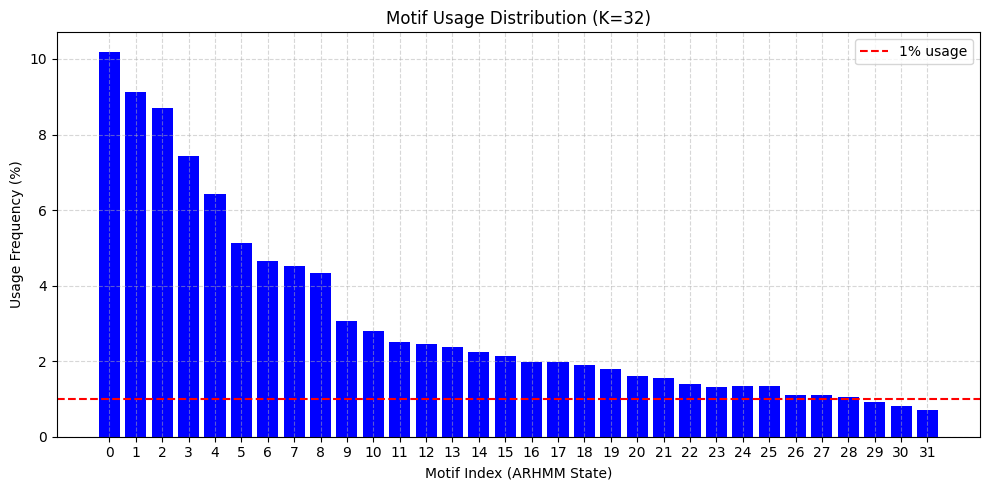

In [20]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the ARHMM latent states CSV
csv_path = dfs_dir + '/arhmm_latents_df.csv'
arhmm_latents_df = pd.read_csv(csv_path)

# Choose the K value for ARHMM state
K = 32  # You can change this as needed
col_name = f"Most Likely State (K={K})"

# Count frequency of each state
state_counts = arhmm_latents_df[col_name].value_counts().sort_values(ascending=False)

# Normalize to get percentage
state_counts
state_percentages = (state_counts / state_counts.sum()) * 100

# Sort states by index to maintain original state labels on x-axis
state_percentages_sorted = state_percentages.sort_index() # The x-axis indexes correspond to the original state values from the arhmm_latents_df (e.g., state 0 through K-1).

# Plotting
plt.figure(figsize=(10, 5))
plt.bar(state_percentages_sorted.index, state_percentages_sorted.values, color='blue', edgecolor='')
plt.axhline(y=1, color='red', linestyle='--', label='1% usage')

plt.xlabel("Motif Index (ARHMM State)")
plt.ylabel("Usage Frequency (%)")
plt.title(f"Motif Usage Distribution (K={K})")
plt.xticks(state_percentages_sorted.index)  # Ensure all state labels are shown
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


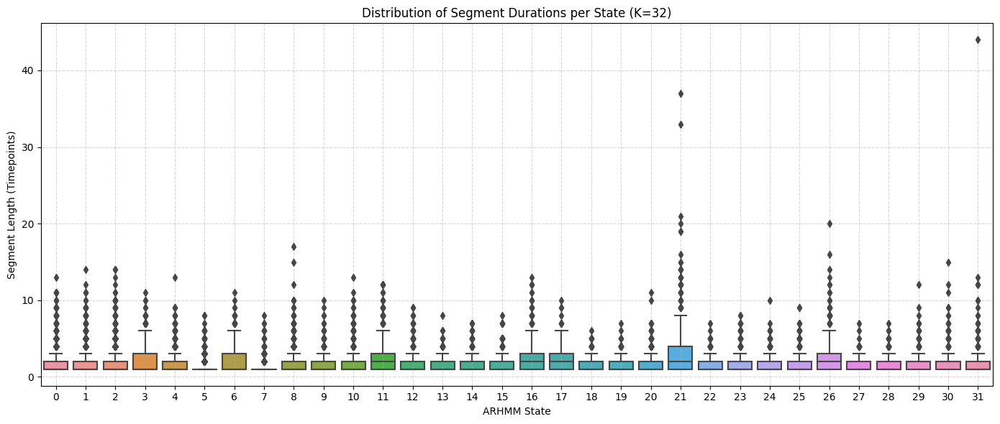

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the ARHMM latent states CSV
csv_path = dfs_dir + '/arhmm_latents_df.csv'
arhmm_latents_df = pd.read_csv(csv_path)

# Choose the K value for ARHMM state
K = 32
col_name = f"Most Likely State (K={K})"

# Get the sequence of states
states_sequence = arhmm_latents_df[col_name].values

# Calculate consecutive lengths of each state
state_durations = {state: [] for state in range(K)}
current_state = states_sequence[0]
length = 1

for s in states_sequence[1:]:
    if s == current_state:
        length += 1
    else:
        state_durations[current_state].append(length)
        current_state = s
        length = 1
# Append the last segment
state_durations[current_state].append(length)

# Convert to long-form DataFrame for seaborn plotting
duration_data = []
for state, durations in state_durations.items():
    for d in durations:
        duration_data.append({'State': state, 'Duration': d})
duration_df = pd.DataFrame(duration_data)

# Plot distribution of segment durations for each state
plt.figure(figsize=(14, 6))
sns.boxplot(data=duration_df, x='State', y='Duration')
plt.title(f'Distribution of Segment Durations per State (K={K})')
plt.xlabel("ARHMM State")
plt.ylabel("Segment Length (Timepoints)")
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()



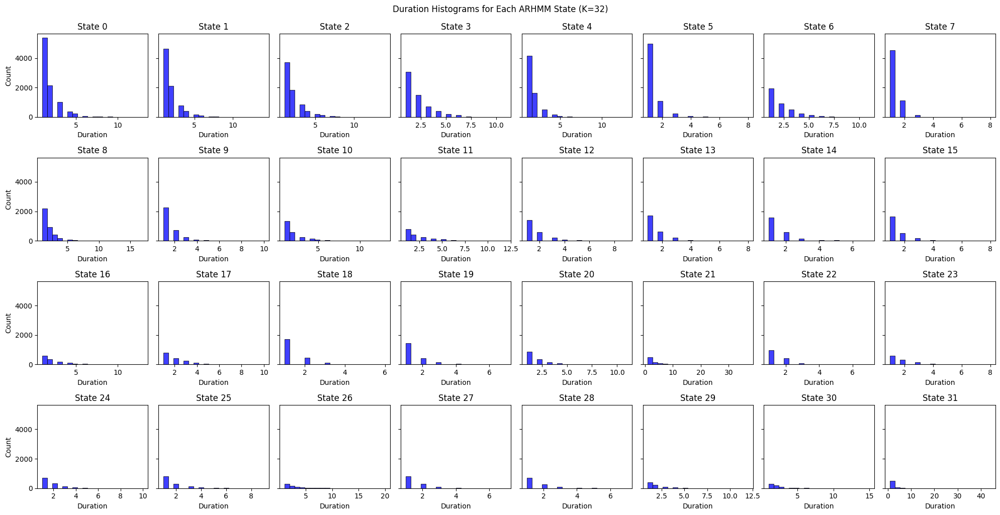

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the ARHMM latent states CSV
csv_path = dfs_dir + '/arhmm_latents_df.csv'
arhmm_latents_df = pd.read_csv(csv_path)

# Choose the K value for ARHMM state
K = 32
col_name = f"Most Likely State (K={K})"

# Get the sequence of states
states_sequence = arhmm_latents_df[col_name].values

# Calculate consecutive lengths of each state
state_durations = {state: [] for state in range(K)}
current_state = states_sequence[0]
length = 1

for s in states_sequence[1:]:
    if s == current_state:
        length += 1
    else:
        state_durations[current_state].append(length)
        current_state = s
        length = 1
state_durations[current_state].append(length)  # Final segment

# Create a histogram for each state
n_cols = 8
n_rows = (K + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10), sharey=True)
axes = axes.flatten()

for state in range(K):
    sns.histplot(state_durations[state], bins=20, ax=axes[state], kde=False, color='blue')
    axes[state].set_title(f'State {state}')
    axes[state].set_xlabel('Duration')
    axes[state].set_ylabel('Count')

# Hide unused subplots
for i in range(K, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle(f'Duration Histograms for Each ARHMM State (K={K})', y=1.02)
plt.show()


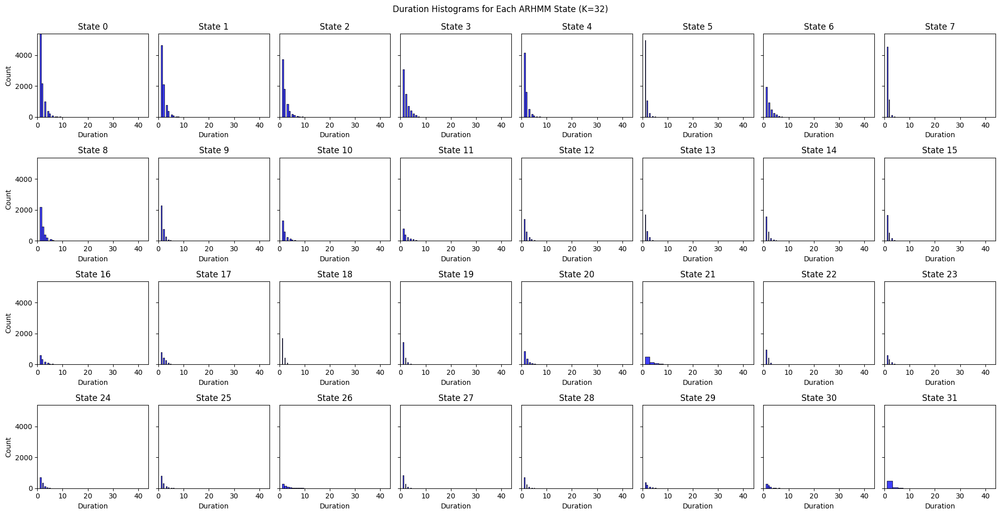

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the ARHMM latent states CSV
csv_path = dfs_dir + '/arhmm_latents_df.csv'
arhmm_latents_df = pd.read_csv(csv_path)

# Choose the K value for ARHMM state
K = 32
col_name = f"Most Likely State (K={K})"

# Get the sequence of states
states_sequence = arhmm_latents_df[col_name].values

# Calculate consecutive lengths of each state
state_durations = {state: [] for state in range(K)}
current_state = states_sequence[0]
length = 1

for s in states_sequence[1:]:
    if s == current_state:
        length += 1
    else:
        state_durations[current_state].append(length)
        current_state = s
        length = 1
state_durations[current_state].append(length)  # Final segment

# Flatten all durations to determine consistent axis limits
all_durations = [length for durations in state_durations.values() for length in durations]
max_duration = max(all_durations)
max_count = max([
    pd.Series(durations).value_counts().max() if durations else 0
    for durations in state_durations.values()
])

# Create a histogram for each state
n_cols = 8
n_rows = (K + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10), sharey=True)
axes = axes.flatten()

for state in range(K):
    sns.histplot(state_durations[state], bins=20, ax=axes[state], kde=False, color='blue')
    axes[state].set_title(f'State {state}')
    axes[state].set_xlabel('Duration')
    axes[state].set_ylabel('Count')
    axes[state].set_xlim(0, max_duration)
    axes[state].set_ylim(0, max_count)

# Hide unused subplots
for i in range(K, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.suptitle(f'Duration Histograms for Each ARHMM State (K={K})', y=1.02)
plt.show()


### Get behavioral Transition probability

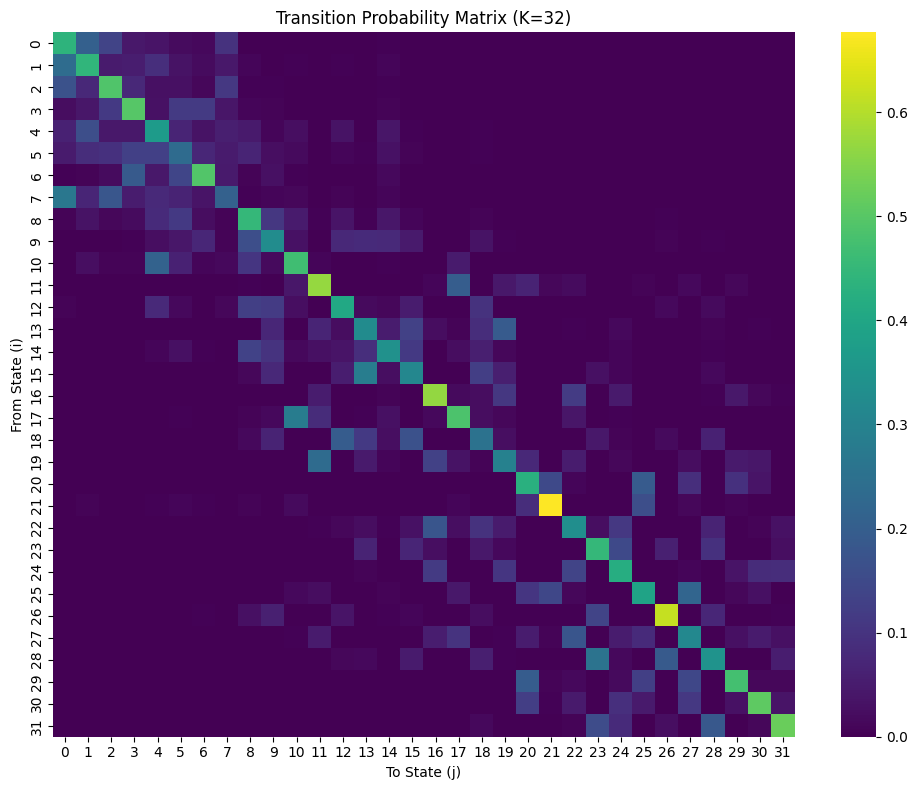

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load state sequence
csv_path = dfs_dir + '/arhmm_latents_df.csv'
df = pd.read_csv(csv_path)  # Replace with actual path
K = 32
state_seq = df[f"Most Likely State (K={K})"].values

# Initialize transition matrix
T = np.zeros((K, K))

# Count transitions
for i in range(len(state_seq) - 1):
    from_state = state_seq[i]
    to_state = state_seq[i + 1]
    T[from_state, to_state] += 1

# Normalize to get probabilities
T = T / T.sum(axis=1, keepdims=True)  # Each row sums to 1

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(T, annot=False, cmap="viridis", xticklabels=range(K), yticklabels=range(K))
plt.xlabel("To State (j)")
plt.ylabel("From State (i)")
plt.title(f"Transition Probability Matrix (K={K})")
plt.tight_layout()
plt.show()


### Sort states based on usage frequency to make the matrix more interpretable.

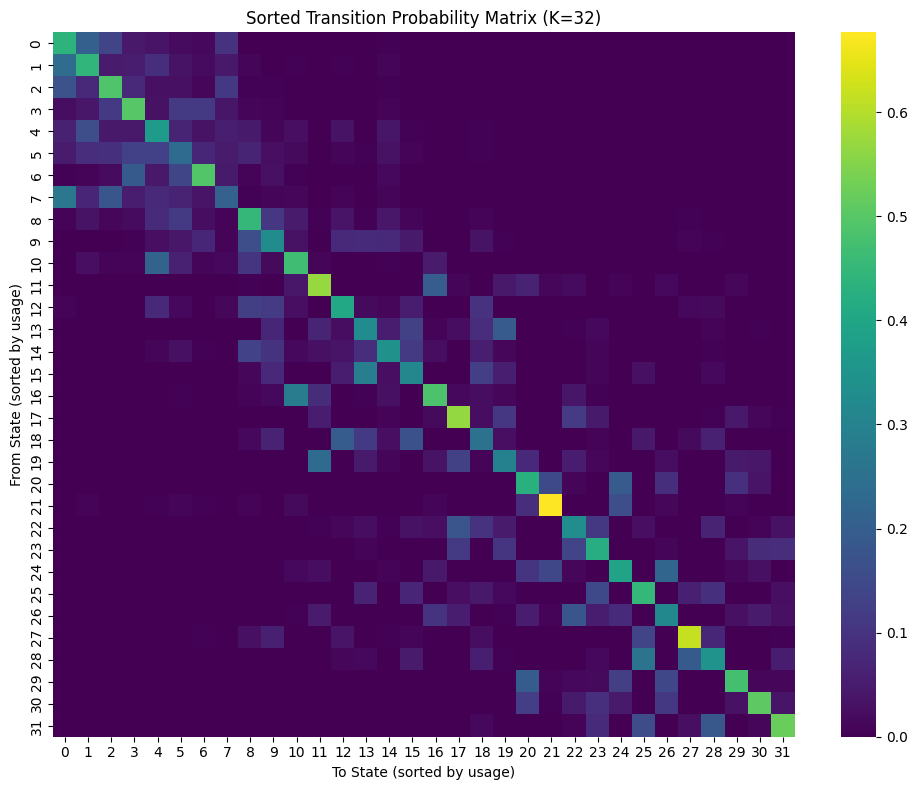

In [25]:
# Re-run necessary setup after kernel reset
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Reload the ARHMM latent states CSV
csv_path = dfs_dir + '/arhmm_latents_df.csv'
arhmm_latents_df = pd.read_csv(csv_path)  # Replace with actual path

# Choose the K value for ARHMM state
K = 32
col_name = f"Most Likely State (K={K})"
state_seq = arhmm_latents_df[col_name].values

# Count state usage
state_counts = pd.Series(state_seq).value_counts().sort_values(ascending=False)
sorted_states = state_counts.index.tolist()

# Create remapping from old to new indices based on usage
state_remap = {old: new for new, old in enumerate(sorted_states)}
remapped_seq = np.array([state_remap[s] for s in state_seq])

# Initialize and count transitions
T_sorted = np.zeros((K, K))
for i in range(len(remapped_seq) - 1):
    from_state = remapped_seq[i]
    to_state = remapped_seq[i + 1]
    T_sorted[from_state, to_state] += 1

# Normalize rows to get probabilities
T_sorted = T_sorted / T_sorted.sum(axis=1, keepdims=True)

# Plot the sorted transition matrix
plt.figure(figsize=(10, 8))
sns.heatmap(T_sorted, annot=False, cmap="viridis", xticklabels=range(K), yticklabels=range(K))
plt.xlabel("To State (sorted by usage)")
plt.ylabel("From State (sorted by usage)")
plt.title(f"Sorted Transition Probability Matrix (K={K})")
plt.tight_layout()
plt.show()


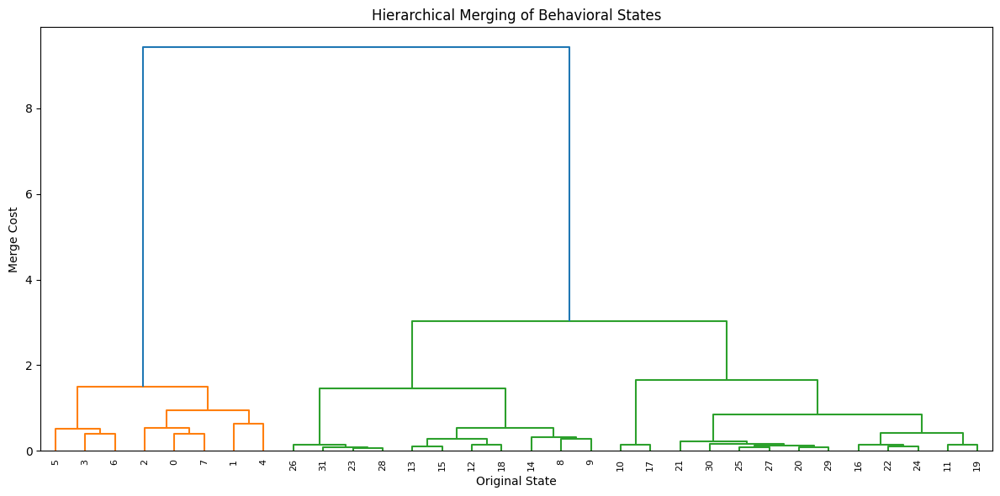

In [26]:
# Re-import required libraries after code state reset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Reload the ARHMM latent states CSV
csv_path = dfs_dir + '/arhmm_latents_df.csv'
arhmm_latents_df = pd.read_csv(csv_path)

# Set K and extract the sequence
K = 32
state_seq = arhmm_latents_df[f"Most Likely State (K={K})"].values

# Compute transition matrix
T = np.zeros((K, K))
for i in range(len(state_seq) - 1):
    T[state_seq[i], state_seq[i+1]] += 1
T = T / T.sum(axis=1, keepdims=True)
T = np.nan_to_num(T)

# Compute stationary distribution U
U = np.bincount(state_seq, minlength=K) / len(state_seq)

# Initialize cluster dict and merge history
clusters = {i: [i] for i in range(K)}
merge_history = []

# Working versions
current_T = T.copy()
current_U = U.copy()

while len(clusters) > 1:
    keys = list(clusters.keys())
    min_cost = np.inf
    to_merge = (None, None)

    for i in range(len(keys)):
        for j in range(i + 1, len(keys)):
            a, b = keys[i], keys[j]
            Tij = current_T[i, j]
            Tji = current_T[j, i]
            if Tij + Tji > 0:
                cost = (current_U[i] + current_U[j]) / (Tij + Tji)
                if cost < min_cost:
                    min_cost = cost
                    to_merge = (a, b)

    i, j = to_merge
    new_cluster_id = max(clusters.keys()) + 1
    merged_cluster = clusters[i] + clusters[j]

    merge_history.append([i, j, min_cost, len(merged_cluster)])
    new_clusters = {k: v for k, v in clusters.items() if k not in (i, j)}
    new_clusters[new_cluster_id] = merged_cluster

    new_keys = list(new_clusters.keys())
    size = len(new_keys)
    new_T = np.zeros((size, size))
    new_U = np.zeros(size)
    key_to_index = {k: idx for idx, k in enumerate(new_keys)}

    for k, idx in key_to_index.items():
        new_U[idx] = sum(U[s] for s in new_clusters[k])

    for kx, ix in key_to_index.items():
        for ky, iy in key_to_index.items():
            new_T[ix, iy] = sum(T[p, q] for p in new_clusters[kx] for q in new_clusters[ky])

    new_T = new_T / new_T.sum(axis=1, keepdims=True)
    new_T = np.nan_to_num(new_T)

    clusters = new_clusters
    current_T = new_T
    current_U = new_U

# Plot dendrogram
Z = np.array(merge_history)
plt.figure(figsize=(12, 6))
dendrogram(Z, labels=np.arange(K), leaf_rotation=90)
plt.title("Hierarchical Merging of Behavioral States")
plt.xlabel("Original State")
plt.ylabel("Merge Cost")
plt.tight_layout()
plt.show()


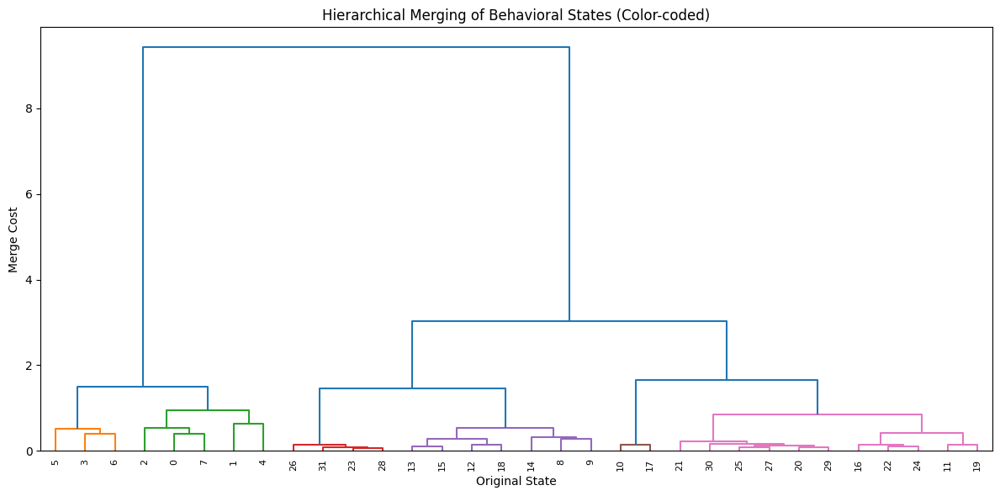

array([2, 2, 2, 1, 2, 1, 1, 2, 4, 4, 5, 6, 4, 4, 4, 4, 6, 5, 4, 6, 6, 6,
       6, 3, 6, 6, 3, 6, 3, 6, 6, 3], dtype=int32)

In [27]:
# Re-import required libraries after code state reset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, fcluster

# Reload the ARHMM latent states CSV
csv_path = dfs_dir + '/arhmm_latents_df.csv'
arhmm_latents_df = pd.read_csv(csv_path)

# Set K and extract the sequence
K = 32
state_seq = arhmm_latents_df[f"Most Likely State (K={K})"].values

# Compute transition matrix
T = np.zeros((K, K))
for i in range(len(state_seq) - 1):
    T[state_seq[i], state_seq[i+1]] += 1
T = T / T.sum(axis=1, keepdims=True)
T = np.nan_to_num(T)

# Compute stationary distribution U
U = np.bincount(state_seq, minlength=K) / len(state_seq)

# Initialize cluster dict and merge history
clusters = {i: [i] for i in range(K)}
merge_history = []

# Working versions
current_T = T.copy()
current_U = U.copy()

while len(clusters) > 1:
    keys = list(clusters.keys())
    min_cost = np.inf
    to_merge = (None, None)

    for i in range(len(keys)):
        for j in range(i + 1, len(keys)):
            a, b = keys[i], keys[j]
            Tij = current_T[i, j]
            Tji = current_T[j, i]
            if Tij + Tji > 0:
                cost = (current_U[i] + current_U[j]) / (Tij + Tji)
                if cost < min_cost:
                    min_cost = cost
                    to_merge = (a, b)

    i, j = to_merge
    new_cluster_id = max(clusters.keys()) + 1
    merged_cluster = clusters[i] + clusters[j]

    merge_history.append([i, j, min_cost, len(merged_cluster)])
    new_clusters = {k: v for k, v in clusters.items() if k not in (i, j)}
    new_clusters[new_cluster_id] = merged_cluster

    new_keys = list(new_clusters.keys())
    size = len(new_keys)
    new_T = np.zeros((size, size))
    new_U = np.zeros(size)
    key_to_index = {k: idx for idx, k in enumerate(new_keys)}

    for k, idx in key_to_index.items():
        new_U[idx] = sum(U[s] for s in new_clusters[k])

    for kx, ix in key_to_index.items():
        for ky, iy in key_to_index.items():
            new_T[ix, iy] = sum(T[p, q] for p in new_clusters[kx] for q in new_clusters[ky])

    new_T = new_T / new_T.sum(axis=1, keepdims=True)
    new_T = np.nan_to_num(new_T)

    clusters = new_clusters
    current_T = new_T
    current_U = new_U
    
# Plot dendrogram
Z = np.array(merge_history)


# from scipy.cluster.hierarchy import dendrogram, fcluster
# import matplotlib.pyplot as plt
# import numpy as np


# Assume Z is the linkage matrix
depth = 6  # desired number of clusters

# Get cluster labels for each original leaf node (0 to K-1)
cluster_labels = fcluster(Z, t=depth, criterion='maxclust')

# Create mapping from leaf node to color
leaf_colors = {i: f"C{(cluster_labels[i] - 1) % 10}" for i in range(len(cluster_labels))}

# Link color function
def link_color_func(node_id):
    # Only apply color to leaf nodes
    if node_id < len(leaf_colors):
        return leaf_colors[node_id]
    return 'black'  # internal node (default color)

# Compute a good color threshold
if len(Z) >= depth:
    color_thresh = np.sort(Z[:, 2])[-(depth - 1)]
else:
    color_thresh = 0.0

# Plot the dendrogram
plt.figure(figsize=(12, 6))
dendrogram(
    Z,
    labels=np.arange(len(cluster_labels)),
    leaf_rotation=90,
    # link_color_func=link_color_func,
    color_threshold=color_thresh  # Needed for link_color_func to activate
)
plt.title("Hierarchical Merging of Behavioral States (Color-coded)")
plt.xlabel("Original State")
plt.ylabel("Merge Cost")
plt.tight_layout()
plt.show()

cluster_labels

In [15]:
cluster_labels

array([2, 2, 2, 1, 2, 1, 1, 2, 4, 4, 5, 6, 4, 4, 4, 4, 6, 5, 4, 6, 6, 6,
       6, 3, 6, 6, 3, 6, 3, 6, 6, 3], dtype=int32)

### PCA 

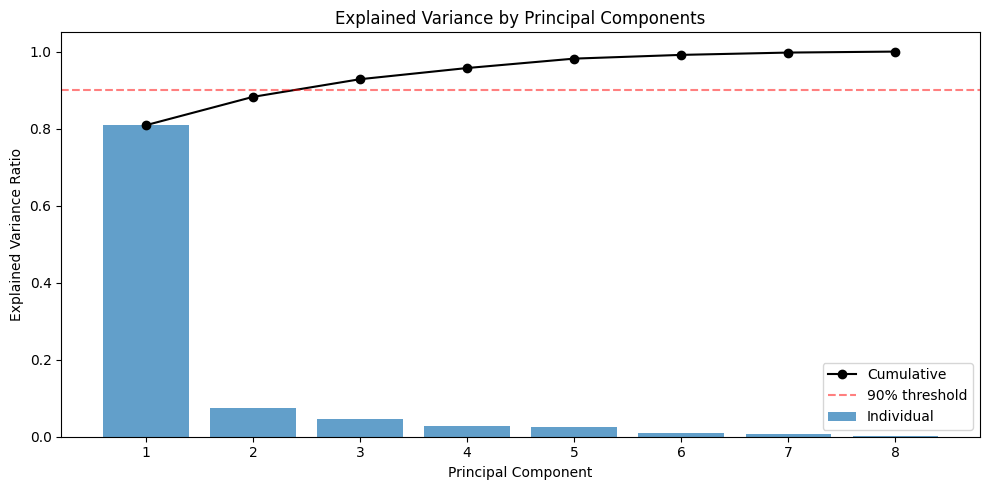

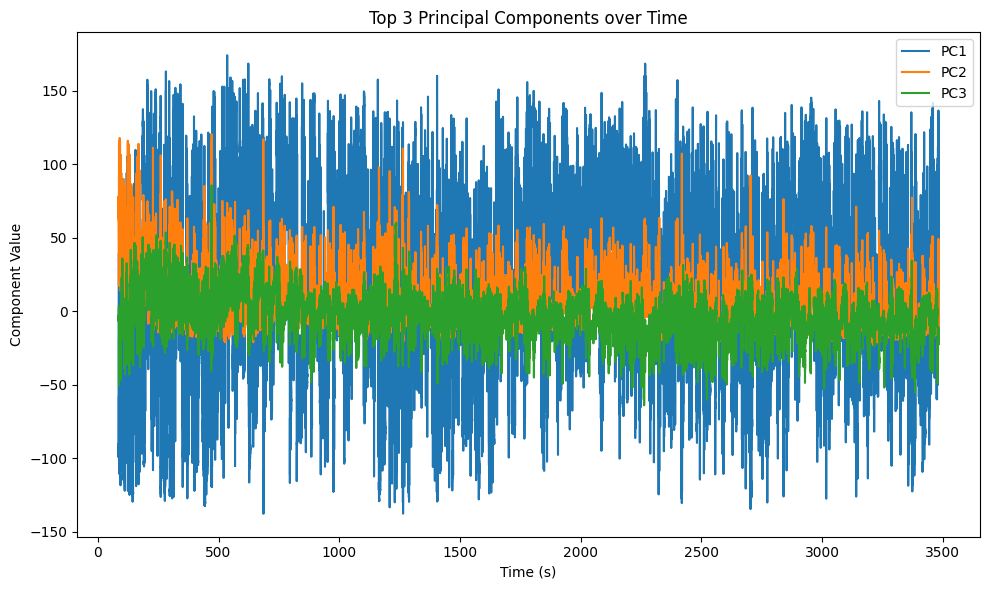

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load the data
csv_path = dfs_dir + '/ae_latents_df.csv'
df = pd.read_csv(csv_path)
data = df.drop(columns=['seg_index', 'Harp_Timestamp', 'SessionTime (s)', 'Anal_Video_Time (s)', 'Trial'])
t = df['SessionTime (s)']

# Step 1: PCA with all components
pca = PCA(n_components=data.shape[1])
pca_scores = pca.fit_transform(data)

# Step 2: Plot explained variance
explained_var = pca.explained_variance_ratio_

plt.figure(figsize=(10, 5))
plt.bar(range(1, len(explained_var) + 1), explained_var, alpha=0.7, label='Individual')
plt.plot(range(1, len(explained_var) + 1), np.cumsum(explained_var), marker='o', color='black', label='Cumulative')
plt.axhline(y=.9, color='red', linestyle='--', alpha=0.5, label='90% threshold')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by Principal Components')
plt.legend()
plt.tight_layout()
plt.show()

# Step 3: Plot the top 3 PCs over time
plt.figure(figsize=(10, 6))
for i in range(3):
    plt.plot(t, pca_scores[:, i], label=f'PC{i+1}')
plt.title("Top 3 Principal Components over Time")
plt.xlabel("Time (s)")
plt.ylabel("Component Value")
plt.legend()
plt.tight_layout()
plt.show()


### Explained Variance and Explained Variance Ratio

In [37]:
# Explained variance for each component
explained_variance = pca.explained_variance_
print("Explained variance:", explained_variance)

# Explained variance ratio (percentage of total variance)
explained_variance_ratio = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance_ratio)


Explained variance: [3062.47405186  278.47223399  173.78821488  109.85075323   92.53429651
   36.71515723   22.78333369    9.61129531]
Explained variance ratio: [0.80884537 0.0735487  0.04590008 0.02901323 0.0244397  0.00969702
 0.00601742 0.00253849]


### Loadings (Principal Axes or Weights)

In [38]:
# Loadings (weights of the original features in each PC)
loadings = pca.components_  # shape: (n_components, n_features)

# If you want to format them nicely with feature names:
feature_names = data.columns
loadings_df = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(loadings.shape[0])], index=feature_names)

print("Loadings (weights of original features in each PC):")
print(loadings_df)


Loadings (weights of original features in each PC):
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  0.057297  0.541602  0.480725 -0.054622  0.202574  0.083952 -0.388516   
1  0.523132  0.385880 -0.203492  0.333179  0.539339  0.014824  0.161424   
2 -0.241116  0.387192  0.470709 -0.216568 -0.174964  0.267245  0.367458   
3 -0.665555  0.011515  0.108236  0.672803  0.243314 -0.174892 -0.018939   
4 -0.279413  0.029014 -0.125050 -0.559794  0.467760 -0.387975 -0.346107   
5  0.093349  0.099756 -0.086799  0.238301 -0.391064  0.171707 -0.738023   
6 -0.255792  0.622228 -0.615572 -0.066187 -0.313294 -0.122377  0.132295   
7 -0.264072 -0.098759 -0.303498 -0.109113  0.329210  0.834111 -0.075119   

        PC8  
0  0.519879  
1 -0.328402  
2 -0.535180  
3 -0.048760  
4 -0.320882  
5 -0.435800  
6  0.182927  
7  0.082054  


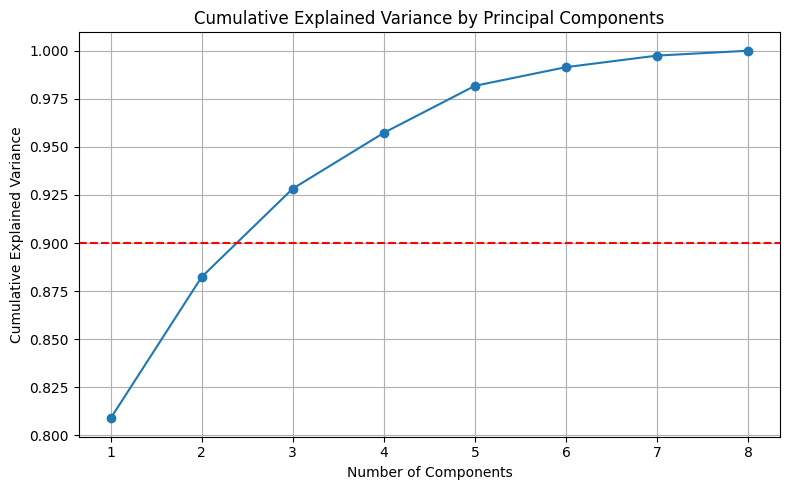

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(np.arange(1,data.shape[1]+1), np.cumsum(explained_variance_ratio), marker='o')
plt.axhline(y=0.9, color='red', linestyle='--', label='90% threshold')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.tight_layout()
plt.show()


### and t_SNE on AE signal and visualize the results

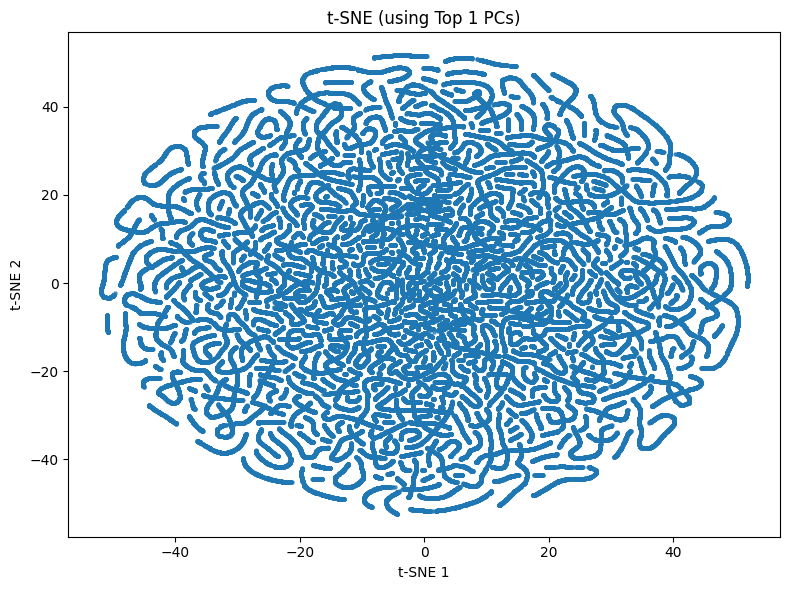

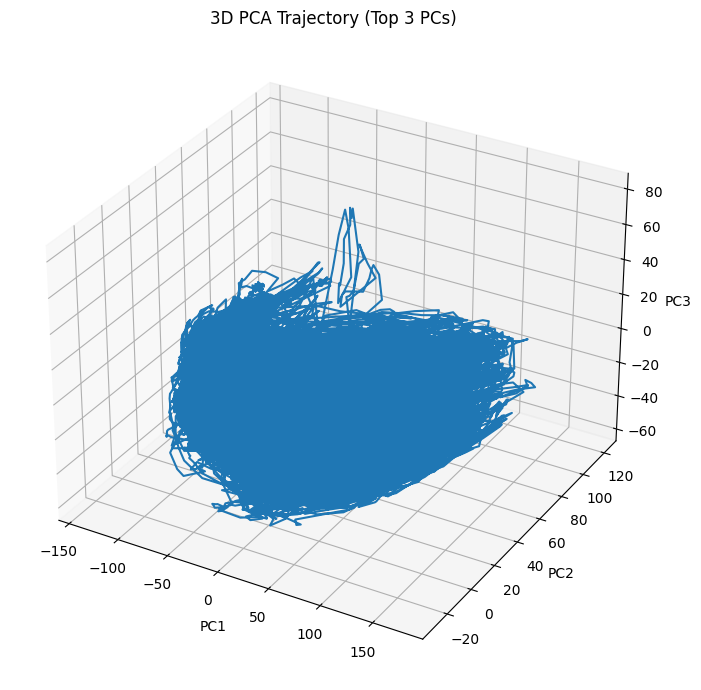

In [41]:
from sklearn.manifold import TSNE

# === t-SNE on top N PCs ===
N = 1  # <-- Set this to however many top PCs you want
tsne_input = pca_scores[:, :N]
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(tsne_input)

# === Plot: t-SNE results ===
plt.figure(figsize=(8, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s=5, alpha=0.7)
plt.title(f"t-SNE (using Top {N} PCs)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()
plt.show()

# === Optional: 3D trajectory of top 3 PCs ===
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot(pca_scores[:, 0], pca_scores[:, 1], pca_scores[:, 2])
ax.set_title("3D PCA Trajectory (Top 3 PCs)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()

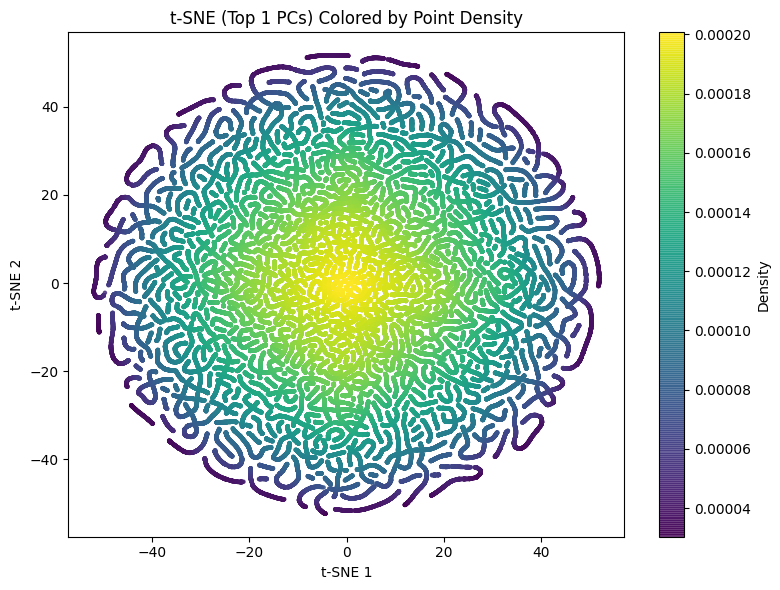

In [ ]:
from scipy.stats import gaussian_kde

# Estimate density using Gaussian KDE
xy = tsne_results.T  # shape (2, n_samples)
kde = gaussian_kde(xy)(xy)  # Evaluate KDE on each point

# Sort points by density (for better visualization)
idx = kde.argsort()
x, y, z = tsne_results[idx, 0], tsne_results[idx, 1], kde[idx]

# Plot with density-based coloring
plt.figure(figsize=(8, 6))
sc = plt.scatter(x, y, c=z, cmap='viridis', s=5, alpha=0.8)
plt.colorbar(sc, label='Density')
plt.title(f"t-SNE (Top {N} PCs) Colored by Point Density")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()

plot_path = f"{dfs_dir}/tsne/tsne_density_top{N}_pcs.png"
plt.savefig(plot_path, dpi=300)

plt.show()


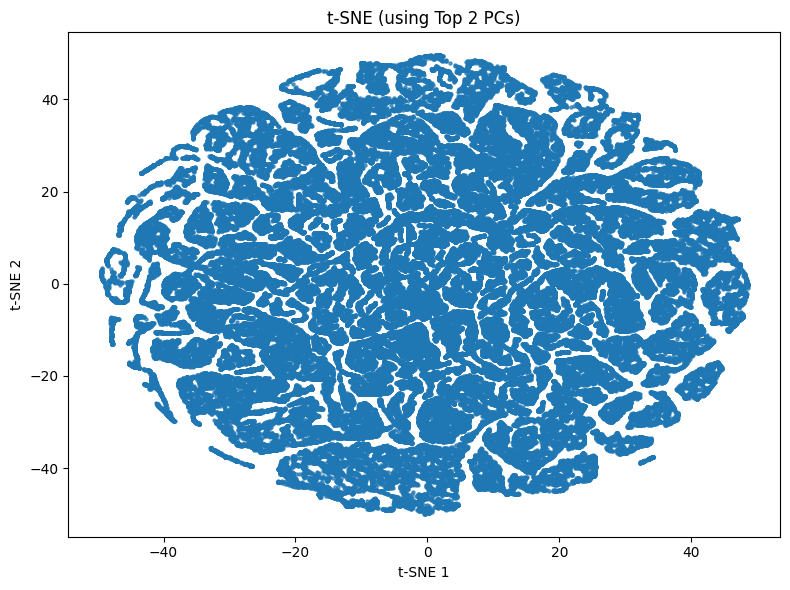

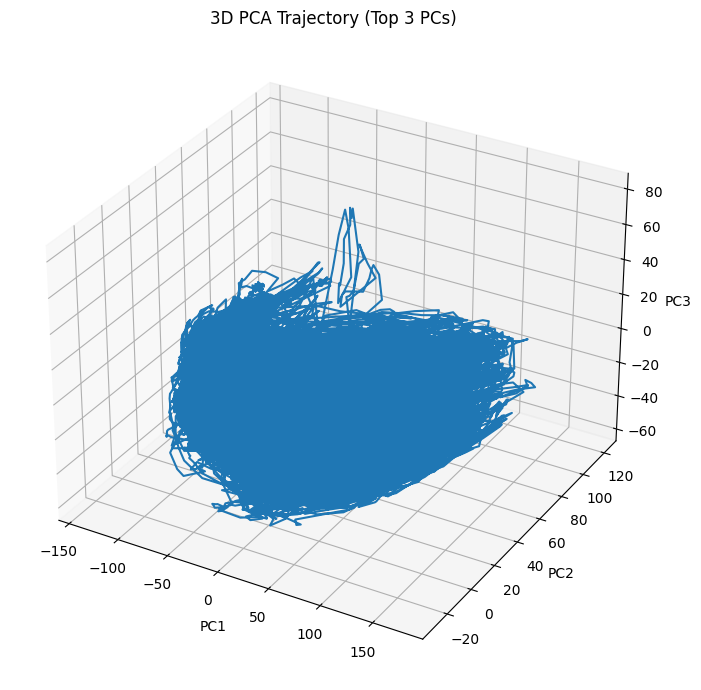

In [43]:
from sklearn.manifold import TSNE

# === t-SNE on top N PCs ===
N = 2  # <-- Set this to however many top PCs you want
tsne_input = pca_scores[:, :N]
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(tsne_input)

# === Plot: t-SNE results ===
plt.figure(figsize=(8, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s=5, alpha=0.7)
plt.title(f"t-SNE (using Top {N} PCs)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()
plt.show()

# === Optional: 3D trajectory of top 3 PCs ===
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot(pca_scores[:, 0], pca_scores[:, 1], pca_scores[:, 2])
ax.set_title("3D PCA Trajectory (Top 3 PCs)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()

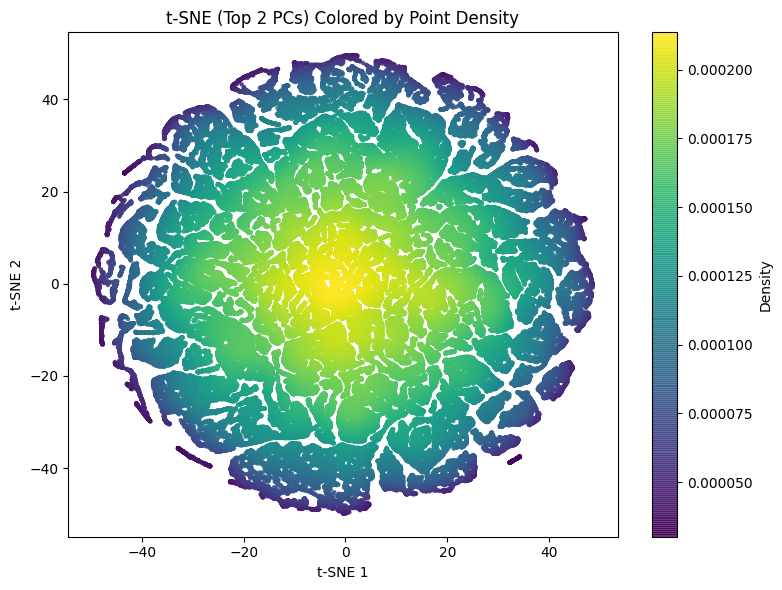

In [ ]:
from scipy.stats import gaussian_kde

# Estimate density using Gaussian KDE
xy = tsne_results.T  # shape (2, n_samples)
kde = gaussian_kde(xy)(xy)  # Evaluate KDE on each point

# Sort points by density (for better visualization)
idx = kde.argsort()
x, y, z = tsne_results[idx, 0], tsne_results[idx, 1], kde[idx]

# Plot with density-based coloring
plt.figure(figsize=(8, 6))
sc = plt.scatter(x, y, c=z, cmap='viridis', s=5, alpha=0.8)
plt.colorbar(sc, label='Density')
plt.title(f"t-SNE (Top {N} PCs) Colored by Point Density")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()

plot_path = f"{dfs_dir}/tsne/tsne_density_top{N}_pcs.png"
plt.savefig(plot_path, dpi=300)

plt.show()

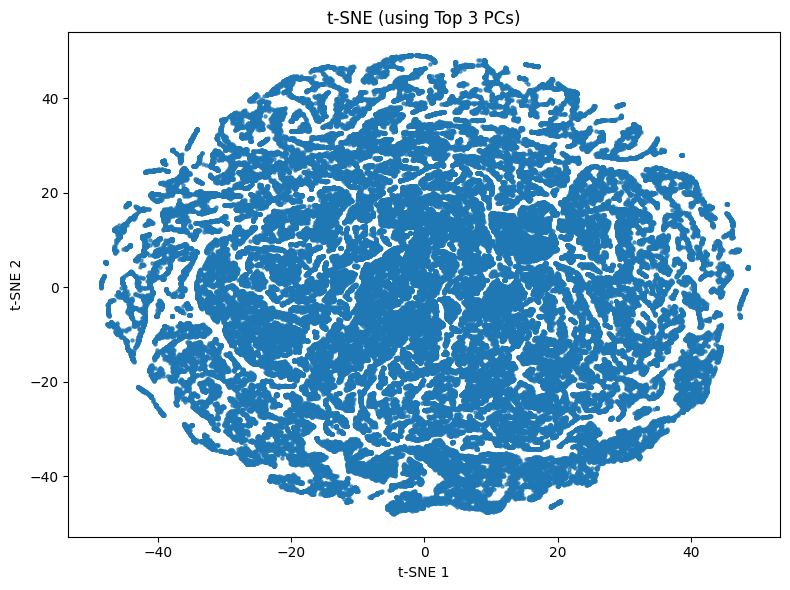

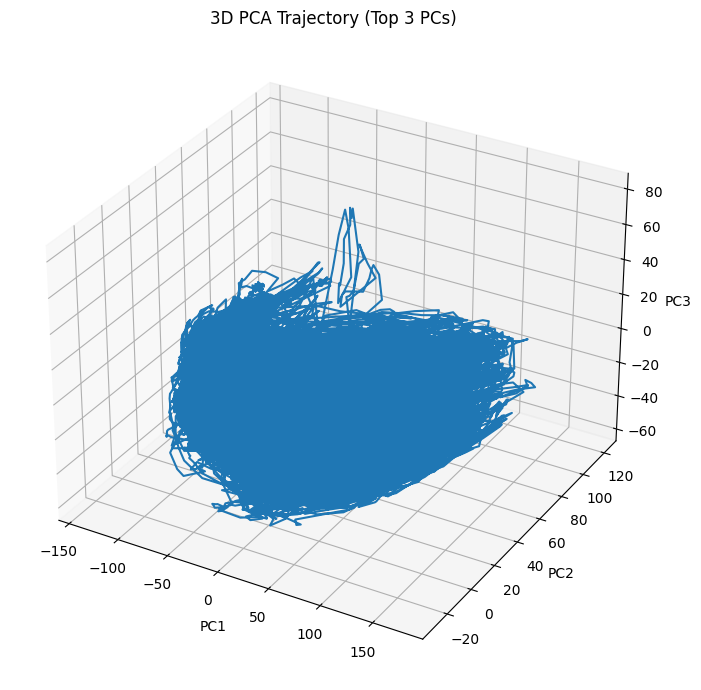

In [45]:
from sklearn.manifold import TSNE

# === t-SNE on top N PCs ===
N = 3  # <-- Set this to however many top PCs you want
tsne_input = pca_scores[:, :N]
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(tsne_input)

# === Plot: t-SNE results ===
plt.figure(figsize=(8, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s=5, alpha=0.7)
plt.title(f"t-SNE (using Top {N} PCs)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()
plt.show()

# === Optional: 3D trajectory of top 3 PCs ===
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot(pca_scores[:, 0], pca_scores[:, 1], pca_scores[:, 2])
ax.set_title("3D PCA Trajectory (Top 3 PCs)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()

### Save t-SNE results

In [69]:



import os
import pandas as pd

# Directory path for saving t-SNE results
tsne_dir = os.path.join(dfs_dir, 'tsne')
os.makedirs(tsne_dir, exist_ok=True)  # Create dir if it doesn't exist

# Save t-SNE results to CSV
tsne_df = pd.DataFrame(tsne_results, columns=['tSNE1', 'tSNE2'])
tsne_csv_path = os.path.join(tsne_dir, f'tsne_top{N}_pcs.csv')
tsne_df.to_csv(tsne_csv_path, index=False)
print(f"t-SNE results saved to: {tsne_csv_path}")

# # load later
# tsne_df = pd.read_csv('tsne_results_top{}_pcs.csv'.format(N))
# tsne_results = tsne_df.values


t-SNE results saved to: /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_ear/706893/2024-05-28/dfs/tsne/tsne_top4_pcs.csv


### load t_SNE results

In [68]:
import os
import pandas as pd

# Set N to match the file you want to load
N = 4  # or whichever N you saved earlier

# Define path to the saved CSV
tsne_csv_path = os.path.join(dfs_dir, 'tsne', f'tsne_top{N}_pcs.csv')

# Load the CSV into a DataFrame
if os.path.exists(tsne_csv_path):
    tsne_df = pd.read_csv(tsne_csv_path)
    tsne_results = tsne_df.values  # If you want it as a NumPy array
    print(f"Loaded t-SNE results from: {tsne_csv_path}")
else:
    print(f"t-SNE file not found at: {tsne_csv_path}")


t-SNE file not found at: /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_ear/706893/2024-05-28/dfs/tsne/tsne_top4_pcs.csv


### Save the density-colored t-SNE plot. Skip if it already exists

In [ ]:
# plot_path = f"{dfs_dir}/tsne/tsne_density_top{N}_pcs.png"
# plt.savefig(plot_path, dpi=300)
# print(f"Saved t-SNE density plot to: {plot_path}")

# plot_path = f"{dfs_dir}/tsne/tsne_density_top{N}_pcs.png"
# if not os.path.exists(plot_path):
#     # [Insert plot code here — density scatter]
#     plt.savefig(plot_path, dpi=300)
#     print(f"Saved t-SNE density plot to: {plot_path}")
# else:
#     print(f"Plot already exists: {plot_path}")


Saved t-SNE density plot to: /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_ear/706893/2024-05-28/dfs/tsne/tsne_density_top4_pcs.png
Plot already exists: /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_ear/706893/2024-05-28/dfs/tsne/tsne_density_top4_pcs.png


<Figure size 640x480 with 0 Axes>

In [ ]:
from scipy.stats import gaussian_kde

# Estimate density using Gaussian KDE
xy = tsne_results.T  # shape (2, n_samples)
kde = gaussian_kde(xy)(xy)  # Evaluate KDE on each point

# Sort points by density (for better visualization)
idx = kde.argsort()
x, y, z = tsne_results[idx, 0], tsne_results[idx, 1], kde[idx]

# Plot with density-based coloring
plt.figure(figsize=(8, 6))
sc = plt.scatter(x, y, c=z, cmap='viridis', s=5, alpha=0.8)
plt.colorbar(sc, label='Density')
plt.title(f"t-SNE (Top {N} PCs) Colored by Point Density")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()
# plt.show()

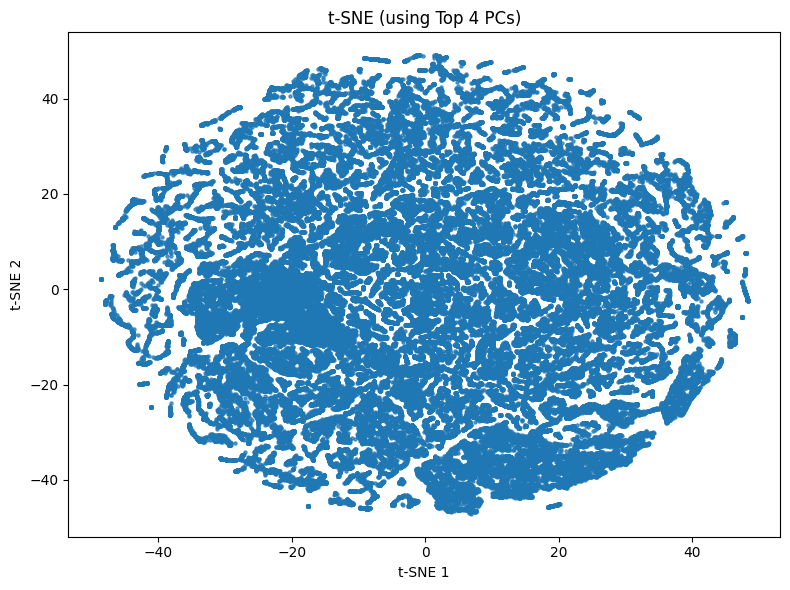

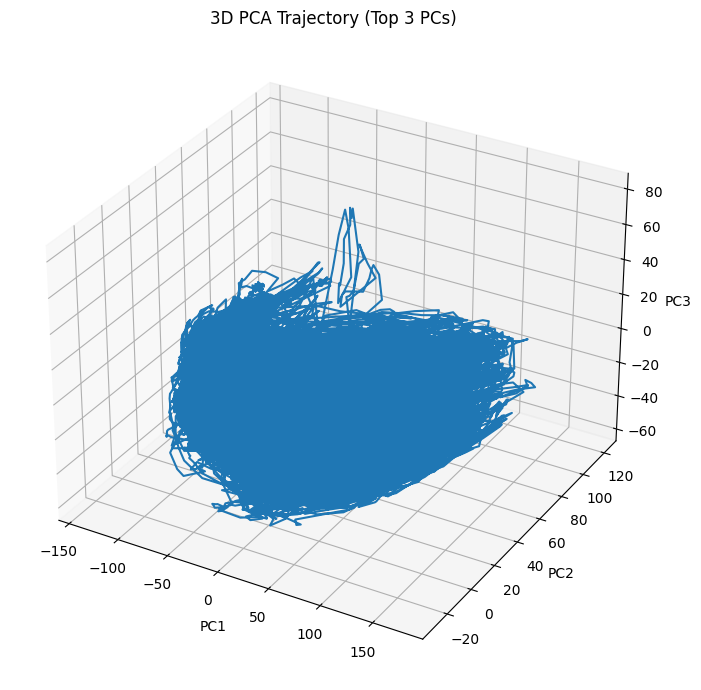

In [ ]:
from sklearn.manifold import TSNE

# === t-SNE on top N PCs ===
N = 4  # <-- Set this to however many top PCs you want
tsne_input = pca_scores[:, :N]
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(tsne_input)

# === Plot: t-SNE results ===
plt.figure(figsize=(8, 6))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], s=5, alpha=0.7)
plt.title(f"t-SNE (using Top {N} PCs)")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()
plt.show()

# === Optional: 3D trajectory of top 3 PCs ===
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.plot(pca_scores[:, 0], pca_scores[:, 1], pca_scores[:, 2])
ax.set_title("3D PCA Trajectory (Top 3 PCs)")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
plt.tight_layout()
plt.show()

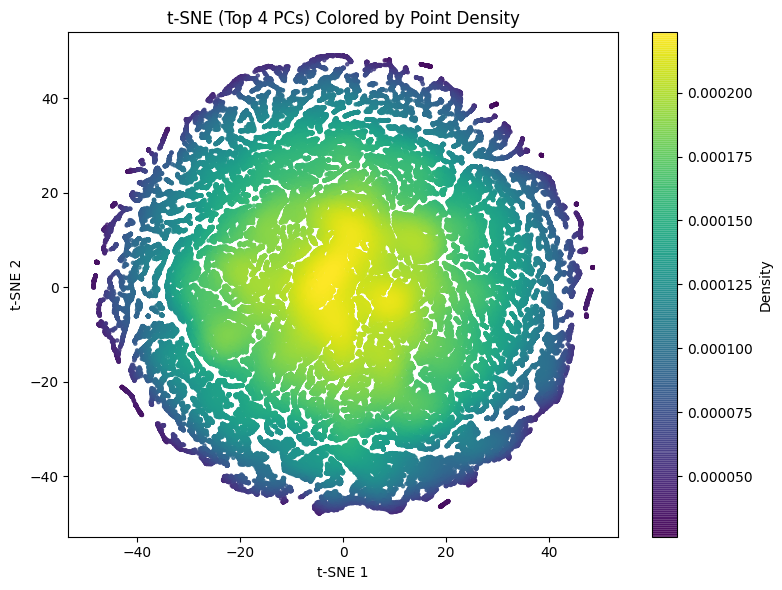

In [73]:
from scipy.stats import gaussian_kde

# Estimate density using Gaussian KDE
xy = tsne_results.T  # shape (2, n_samples)
kde = gaussian_kde(xy)(xy)  # Evaluate KDE on each point

# Sort points by density (for better visualization)
idx = kde.argsort()
x, y, z = tsne_results[idx, 0], tsne_results[idx, 1], kde[idx]

# Plot with density-based coloring
plt.figure(figsize=(8, 6))
sc = plt.scatter(x, y, c=z, cmap='viridis', s=5, alpha=0.8)
plt.colorbar(sc, label='Density')
plt.title(f"t-SNE (Top {N} PCs) Colored by Point Density")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.tight_layout()

plot_path = f"{dfs_dir}/tsne/tsne_density_top{N}_pcs.png"
plt.savefig(plot_path, dpi=300)

plt.show()


### Plot ARHMM state segmentations over **all trials of a specified dtypes** {'train' | 'val' | 'test'}
each time point is colored based on the discrete state assigned by the ARHMM

In [ ]:
"comment for now. Fa . Scnce it is in the function"
# from behavenet.plotting.arhmm_utils import get_model_latents_states

# # user params
# dtype = 'train'  # data type to draw trials from: 'train' | 'val' | 'test'
# get_best_version = True  # False when looking at multiple models w/in a tt expt
# sess_idx = 0  # when using a multisession, this determines which session is used
# max_frames = 1000

# # define which arhmm states to plot (must already be fit)
# # n_arhmm_states = [2,4,8,12,20,32]

# # set model info
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': arhmm_model_experiment_name,
#     'model_class': model_class,
#     'model_type': None,
#     'noise_type': noise_type,
#     'n_arhmm_lags': n_arhmm_lags,
#     'transitions': 'stationary',
#     'ae_experiment_name': ae_experiment_name,
#     'ae_model_class': 'ae',
#     'ae_model_type': 'conv',
#     'ae_version': 'best',
#     'n_ae_latents': n_ae_latents
# }
# get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# # xtick_locs = [0, 30, 60, 90, 120, 150, 180]
# xtick_locs = [0, 250, 500]  # xtick_locs is the frame index, not second   ?????
# frame_rate = frame_rate
# n_trials = 269 # n_trials to plot in 'dtype' set, 269, 37   ?????
           

# # add additional params to identify model
# hparams['device'] = device
# hparams['as_numpy'] = as_numpy
# hparams['batch_load'] = batch_load
# hparams['rng_seed_model'] = rng_seed_model
# hparams['rng_seed_data'] = rng_seed_data
# hparams['trial_splits'] = trial_splits
# hparams['train_frac'] = train_frac


# for n_states in n_arhmm_states:

#     # print(f'plotting K={n_states} arhmm states , for {n_trials} {dtype} trials' )
        
#     hparams['n_arhmm_states'] = n_states

#     if hparams['model_class'] == 'arhmm':           
#         model_name = str(
#             'multitrial_segmentation_D=%02i_K=%02i_%sSet' % (
#             hparams['n_ae_latents'], hparams['n_arhmm_states'], dtype))
#     elif hparams['model_class'] == 'arhmm-labels':
#         model_name = str('multitrial_segmentation_K=%02i' % hparams['n_arhmm_states'])

#     mdict = get_model_latents_states(hparams, version ='best', dtype=dtype, dtypes=[dtype]) #, sess_idx, return_samples, cond_sampling, dtype, dtypes, rng_seed)
    
#     # print(f"Trial IDs in '{dtype}' set available to plot : {mdict['trial_idxs'][dtype]}\nTotal = {len(mdict['trial_idxs'][dtype])} trilas")

#     # choose which trials to plot
#     np.random.seed(0)
#         # radomly choose 'n_trials' trials from the set of 'dtype' data set.
#     # trial_vec = np.random.choice(
#     #     np.arange(0, len(mdict['trial_idxs'][dtype])), size=(n_trials,), replace=False)
#     # Fa guess: trial_vec: shuffeled index of trials in trial set (mdict['trial_idxs'][dtype]). It is not Trial(video segment) id.
#     # trial set : mdict['trial_idxs'][dtype]

#     # trial_vec = np.arange(0, len(mdict['trial_idxs'][dtype]))
#     # trial_vec: a shuffled list of trial indices
#     trial_vec = sorted_indices = np.argsort(mdict['trial_idxs'][dtype])
#     # print('trial_vec = ', trial_vec)
#     # print("mdict['trial_idxs'][dtype][trial_vec] = ", mdict['trial_idxs'][dtype][trial_vec])

#     # collect states
#     for i, j in enumerate(trial_vec):
#         # print('i,j = ', i,j)
        
#         # print('dtype = ', dtype)
#         # print("mdict['latents'][dtype][j] = ", mdict['latents'][dtype][j])

#         x = mdict['latents'][dtype][j][:max_frames]
#         states_tmp = mdict['model'].most_likely_states(x)
#         n_frames = len(states_tmp)
# #         print(n_frames/30)
#         mdict['states'][dtype][j][:n_frames] = states_tmp

#     if save_outputs:
#         save_file = os.path.join(
#             get_user_dir('fig'), hparams['model_class'], model_name + '.' + format)
#     else:
#         save_file = None

#     # fig = plot_segmentations_by_trial(
#     #     [mdict['states'][dtype][t] for t in trial_vec], xtick_locs=None,  
#     #     0, frame_rate, save_file=save_file, title=model_name)

#     # fig = plot_segmentations_by_trial(
#     #     [mdict['states'][dtype][t] for t in trial_vec], 
#     #     xtick_locs=xtick_locs, 
#     #     xticklabel_offset=0, 
#     #     frame_rate=frame_rate, 
#     #     save_file=save_file, 
#     #     title=model_name,
#     #     cmap='tab20b'
#     # )
#     # print('trial_vec = ', trial_vec)
#     fig = plot_segmentations_by_trial(
#         [mdict['states'][dtype][t] for t in trial_vec],
#         xtick_locs=xtick_locs,
#         xticklabel_offset=0,
#         frame_rate=frame_rate,
#         save_file=save_file,
#         title=model_name,
#         cmap='tab20b',
#         dtype=dtype,  # Pass the dtype to the function
#         trial_idxs = mdict['trial_idxs'][dtype][trial_vec]
#     )

### Plot ARHMM state segmentations over **all** trials ('train' & 'val' & 'test')
each time point is colored based on the discrete state assigned by the ARHMM

In [ ]:
"comment for now. Fa . Scnce it is in the function"

# import numpy as np
# import os
# from behavenet.plotting.arhmm_utils import get_model_latents_states 

# # User params
# get_best_version = True
# sess_idx = 0  # when using a multisession, this determines which session is used 
# max_frames = 1500 #????

# # Define which arhmm states to plot (must already be fit)
# # n_arhmm_states = [2, 4, 8, 12, 20,32] 

# # Set model info
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': arhmm_model_experiment_name,
#     'model_class': model_class,
#     'model_type': None,
#     'noise_type': noise_type,
#     'n_arhmm_lags': n_arhmm_lags,
#     'transitions': 'stationary',
#     'ae_experiment_name': ae_experiment_name,
#     'ae_model_class': 'ae',
#     'ae_model_type': 'conv',
#     'ae_version': 'best',
#     'n_ae_latents': n_ae_latents,
# }
# get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# # X-tick locations
# xtick_locs = [0, 250, 500]  # xtick_locs is the frame index, not second  ????
# frame_rate = frame_rate
# dtypes = ['train', 'val', 'test']  # Data types to load and plot

# # Add additional params to identify model
# # hparams['device'] = 'cpu'
# # hparams['as_numpy'] = True
# # hparams['batch_load'] = True
# # hparams['rng_seed_model'] = 0
# # hparams['rng_seed_data'] = 0
# # hparams['trial_splits'] = '8;1;1;0'
# # hparams['train_frac'] = 1.0

# # Add additional params to identify model
# hparams['device'] = device
# hparams['as_numpy'] = as_numpy
# hparams['batch_load'] = batch_load
# hparams['rng_seed_model'] = rng_seed_model
# hparams['rng_seed_data'] = rng_seed_data
# hparams['trial_splits'] = trial_splits
# hparams['train_frac'] = train_frac



# # Loop over different numbers of ARHMM states
# for n_states in n_arhmm_states:

#     # Placeholder to collect data across dtypes
#     all_trials = []
#     all_states = []
#     all_trial_indices = []

#     print(f'plotting K={n_states} arhmm states for all dtypes')

#     hparams['n_arhmm_states'] = n_states

#     if hparams['model_class'] == 'arhmm':
#         model_name = str(
#             'multitrial_segmentation_D=%02i_K=%02i_AllTrials' % (
#                 hparams['n_ae_latents'], hparams['n_arhmm_states']))
#     elif hparams['model_class'] == 'arhmm-labels':
#         model_name = str('multitrial_segmentation_K=%02i' % hparams['n_arhmm_states'])

#     # Collect data from all dtypes
#     for dtype in dtypes:
#         print(f"Collecting data for dtype: {dtype}")
#         mdict = get_model_latents_states(hparams, version = 'best', dtype=dtype, dtypes=[dtype])

#         # Collect trial indices and sort them for plotting in the correct order
#         trial_indices = mdict['trial_idxs'][dtype]
#         sorted_indices = np.argsort(trial_indices)

#         # Store trials and states for later plotting
#         all_trials.extend([mdict['latents'][dtype][j][:max_frames] for j in sorted_indices])
#         all_states.extend([mdict['model'].most_likely_states(mdict['latents'][dtype][j][:max_frames])
#                            for j in sorted_indices])
#         all_trial_indices.extend(trial_indices[sorted_indices])

#     # Combine data from all dtypes and sort based on trial indices
#     combined_states = [x for _, x in sorted(zip(all_trial_indices, all_states), key=lambda pair: pair[0].item())]
#     combined_trial_indices = sorted(all_trial_indices, key=lambda x: x.item())

#     # Plot the combined data
#     if get_best_version:
#         save_file = os.path.join(
#             get_user_dir('fig'), hparams['model_class'], model_name + '.png')
#     else:
#         save_file = None

#     print(f"Plotting for {len(combined_trial_indices)} total trials")
#     fig = plot_segmentations_by_trial(
#         combined_states,
#         xtick_locs=xtick_locs,
#         xticklabel_offset=0,
#         frame_rate=frame_rate,
#         save_file=save_file,
#         title=model_name,
#         cmap='tab20b',
#         dtype='combined',  # Set dtype as combined
#         trial_idxs=combined_trial_indices
#     )


### Plot ARHMM state segmentations over **all** trials ('train' & 'val' & 'test') and store the most likely state at each time point
each time point is colored based on the discrete state assigned by the ARHMM

In [ ]:
"comment for now. Fa . Scnce it is in the function"

# import numpy as np
# import os
# import pandas as pd
# from behavenet.plotting.arhmm_utils import get_model_latents_states

# # User params
# get_best_version = True
# sess_idx = 0  # when using a multisession, this determines which session is used
# max_frames = 1500
# frame_rate = frame_rate  # Frame rate in Hz

# # Define which arhmm states to plot (must already be fit)
# # n_arhmm_states = [2, 4, 8, 12, 20,32]

# # Set model info
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': arhmm_model_experiment_name,
#     'model_class': model_class,
#     'model_type': None,
#     'noise_type': noise_type,
#     'n_arhmm_lags': n_arhmm_lags,
#     'transitions': 'stationary',
#     'ae_experiment_name': ae_experiment_name,
#     'ae_model_class': 'ae',
#     'ae_model_type': 'conv',
#     'ae_version': 'best',
#     'n_ae_latents': n_ae_latents,
# }
# get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# # X-tick locations
# xtick_locs = [0, 250, 500]  # xtick_locs is the frame index, not second  ????
# frame_rate = frame_rate
# dtypes = ['train', 'val', 'test']  # Data types to load and plot

# # Add additional params to identify model
# # hparams['device'] = 'cpu'
# # hparams['as_numpy'] = True
# # hparams['batch_load'] = True
# # hparams['rng_seed_model'] = 0
# # hparams['rng_seed_data'] = 0
# # hparams['trial_splits'] = '8;1;1;0'
# # hparams['train_frac'] = 1.0

# # Add additional params to identify model
# hparams['device'] = device
# hparams['as_numpy'] = as_numpy
# hparams['batch_load'] = batch_load
# hparams['rng_seed_model'] = rng_seed_model
# hparams['rng_seed_data'] = rng_seed_data
# hparams['trial_splits'] = trial_splits
# hparams['train_frac'] = train_frac


# # DataFrame to store continuous session data
# arhmm_latent_df = pd.DataFrame()

# # Placeholder to store the timestamps and real time (only once)
# timestamps = None
# real_time = None

# # Loop over different numbers of ARHMM states
# for n_states in n_arhmm_states:

#     # Placeholder to collect data across dtypes
#     all_trials = []
#     all_states = []
#     all_trial_indices = []

#     print(f'plotting K={n_states} arhmm states for all dtypes')

#     hparams['n_arhmm_states'] = n_states

#     if hparams['model_class'] == 'arhmm':
#         model_name = str(
#             'multitrial_segmentation_D=%02i_K=%02i_AllTrials' % (
#                 hparams['n_ae_latents'], hparams['n_arhmm_states']))
#     elif hparams['model_class'] == 'arhmm-labels':
#         model_name = str('multitrial_segmentation_K=%02i' % hparams['n_arhmm_states'])

#     # Collect data from all dtypes
#     for dtype in dtypes:
#         print(f"Collecting data for dtype: {dtype}")
#         mdict = get_model_latents_states(hparams, version = 'best', dtype=dtype, dtypes=[dtype])

#         # Collect trial indices and sort them for plotting in the correct order
#         trial_indices = mdict['trial_idxs'][dtype]
#         sorted_indices = np.argsort(trial_indices)

#         # Store trials and states for later plotting
#         all_trials.extend([mdict['latents'][dtype][j][:max_frames] for j in sorted_indices])
#         all_states.extend([mdict['model'].most_likely_states(mdict['latents'][dtype][j][:max_frames])
#                            for j in sorted_indices])
#         all_trial_indices.extend(trial_indices[sorted_indices])

#     # Combine data from all dtypes and sort based on trial indices
#     combined_states = [x for _, x in sorted(zip(all_trial_indices, all_states), key=lambda pair: pair[0].item())]
#     combined_trial_indices = sorted(all_trial_indices, key=lambda x: x.item())

#     # Flatten the list of states to make it a continuous session
#     continuous_states = np.concatenate(combined_states)

#     # Generate timestamps and real-time in seconds (only once)
#     if timestamps is None and real_time is None:
#         n_frames_total = len(continuous_states)
#         timestamps = np.arange(n_frames_total)
#         real_time = timestamps / frame_rate

#         # Add Timestamp and RealTime columns to the dataframe
#         arhmm_latent_df['Timestamp'] = timestamps
#         arhmm_latent_df['RealTime (s)'] = real_time

#     # Add the states for this number of states to the dataframe
#     arhmm_latent_df[f'Most Likely State (K={n_states})'] = continuous_states

# # Display the dataframe containing most likely states for all state numbers, along with timestamps and real-time
# print(arhmm_latent_df)

# # If you need to save it as a CSV file
# output_csv_path = os.path.join(get_user_dir('save'), 'most_likely_states_continuous_session.csv')
# arhmm_latent_df.to_csv(output_csv_path, index=False)

# # Optionally, plot the combined data
# if get_best_version:
#     save_file = os.path.join(
#         get_user_dir('fig'), hparams['model_class'], model_name + '.png')
# else:
#     save_file = None

# print(f"Plotting for {len(combined_trial_indices)} total trials")
# fig = plot_segmentations_by_trial(
#     combined_states,
#     xtick_locs=xtick_locs,
#     xticklabel_offset=0,
#     frame_rate=frame_rate,
#     save_file=save_file,
#     title=model_name,
#     cmap='tab20b',
#     dtype='combined',  # Set dtype as combined
#     trial_idxs=combined_trial_indices
# )


## Fit a **Gaussian HMM** on **AE latent** traces
should move up

### set parameters

In [17]:
import autograd.numpy as np
import autograd.numpy.random as npr
npr.seed(0)

import ssm
from ssm.util import find_permutation
from ssm.plots import gradient_cmap, white_to_color_cmap

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_style("white")
sns.set_context("talk")

color_names = [
    "windows blue",
    "red",
    "amber",
    "faded green",
    "dusty purple",
    "orange",
    "clay",
    "pink",
    "greyish",
    "mint",
    "light cyan",
    "steel blue",
    "forest green",
    "pastel purple",
    "salmon",
    "dark brown",
    "lavender",
    "tan",
    "maroon",
    "turquoise",
    "bright green",
    "gold",
    "sky blue"
    ]

colors_hmm = sns.xkcd_palette(color_names)  #????? bad naming
patch_cmap = gradient_cmap(colors_hmm)


# Speficy whether or not to save figures
save_figures = True

In [ ]:
#  to del
# # Assuming ae_latent_df is your DataFrame loaded from the provided HTML table data
# # and that the first 16 columns (0 to 15) contain the latent values.

# # Extract the latent columns (all rows, columns 0 to 15)
# obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values

# # Convert the NumPy array to a list of lists
# obs = obs_array.tolist()

# # Print some information about the result
# print("Total number of latent vectors:", len(obs))
# if obs:
#     print("Length of each latent vector:", len(obs[0]))

# # Now latents_list is a list of shape (number_of_rows, 16)


Total number of latent vectors: 163192
Length of each latent vector: 16


### Fit HMM on AE traces

In [20]:
# Extract the latent columns (all rows, columns 0 to 15)
ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "ae_latents_df.csv"))
arhmm_latents_df = pd.read_csv(os.path.join(dfs_dir, "arhmm_latents_df.csv"))
obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values # np.shape(obs_array) : (163192, 16) iloc[:, 0:n_ae_latents].values
# Convert the NumPy array to a list of lists
# obs = obs_array.tolist()
# data = obs.copy() # Treat observations generated above as synthetic data.

# Print some information about the result
print("obs_array shape:", np.shape(obs_array))
# if obs_array:
#     print("Length of each latent vector:", len(obs_array[0]))

obs_array shape: (163145, 8)


  0%|          | 0/200 [00:00<?, ?it/s]

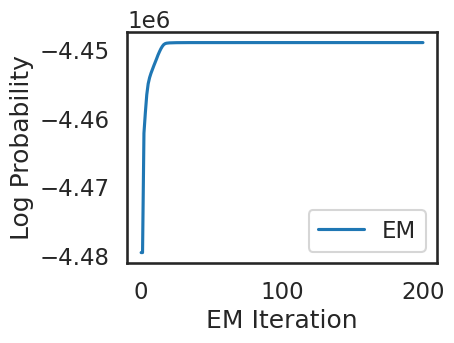

In [ ]:
N_iters = 100
num_hmm_on_ae_states = 3
obs_dim = n_ae_latents
# time_bins = len()

## testing the constrained transitions class
hmm = ssm.HMM(num_hmm_on_ae_states, obs_dim, observations="gaussian")

hmm_lls = hmm.fit(obs_array, method="em", num_iters=N_iters) # , init_method="kmeans"

plt.figure(figsize=(4, 3))
plt.plot(hmm_lls, label="EM")
# plt.plot([0, N_iters], true_ll * np.ones(2), ':k', label="True")
plt.xlabel("EM Iteration")
plt.ylabel("Log Probability")
plt.legend(loc="lower right")
plt.show()

### Build hmm_on_ae_latent_df

In [21]:
### Build hmm_on_ae_latent_df

most_likely_states = hmm.most_likely_states(obs_array)
posterior_probs = hmm.expected_states(data=obs_array)[0]  # Get the posterior probabilities
num_states = len(np.unique(most_likely_states))  # Number of unique GLM states


import pandas as pd

# Get the number of states from posterior_probs.
num_states = posterior_probs.shape[1]

# Create the column name for the most likely state based on num_states.
most_likely_col = f"Most Likely State (K={num_states})"

# Check that the lengths match.
n_timepoints = len(arhmm_latents_df["RealTime (s)"])
if most_likely_states.shape[0] != n_timepoints or posterior_probs.shape[0] != n_timepoints:
    print("Error: Mismatch in the number of time points among the arrays/dataframe.")
else:
    # Create a new DataFrame
    hmm_on_ae_latents_df = pd.DataFrame({
        "RealTime (s)": arhmm_latents_df["RealTime (s)"].values,
        most_likely_col: most_likely_states
    })

    # Add posterior probability columns for each state.
    for i in range(num_states):
        hmm_on_ae_latents_df[f"Posterior_Prob_State_{i}"] = posterior_probs[:, i]

    # # Optionally, inspect the resulting DataFrame.
    # print(hmm_on_ae_latent_df.head())


In [22]:
most_likely_states = hmm.most_likely_states(obs_array)
posterior_probs = hmm.expected_states(data=obs_array)[0]  # Get the posterior probabilities
num_states = len(np.unique(most_likely_states))  # Number of unique GLM states

In [23]:
import pandas as pd

# Get the number of states from posterior_probs.
num_states = posterior_probs.shape[1]

# Create the column name for the most likely state based on num_states.
most_likely_col = f"Most Likely State (K={num_states})"

# Check that the lengths match.
n_timepoints = len(arhmm_latents_df["RealTime (s)"])
if most_likely_states.shape[0] != n_timepoints or posterior_probs.shape[0] != n_timepoints:
    print("Error: Mismatch in the number of time points among the arrays/dataframe.")
else:
    # Create a new DataFrame
    hmm_on_ae_latents_df = pd.DataFrame({
        "RealTime (s)": arhmm_latents_df["RealTime (s)"].values,
        most_likely_col: most_likely_states
    })

    # Add posterior probability columns for each state.
    for i in range(num_states):
        hmm_on_ae_latents_df[f"Posterior_Prob_State_{i}"] = posterior_probs[:, i]

    # # Optionally, inspect the resulting DataFrame.
    # print(hmm_on_ae_latent_df.head())


In [24]:
ae_latents_df

,0,1,2,3,4,5,6,7,seg_index,RealTime (s)
0,-10.063370,-26.443747,7.669928,82.935844,6.071278,-53.174885,52.648537,-27.147223,4,0.000000
1,-10.030812,-26.064062,7.540515,83.361519,5.975089,-53.148064,53.062115,-26.956013,4,0.020833
2,-9.763950,-26.039431,7.653439,83.756409,6.032823,-53.182243,53.397915,-26.848112,4,0.041667
3,-9.559967,-25.967693,7.660251,83.987000,5.975273,-53.191826,53.662315,-26.703096,4,0.062500
4,-9.467719,-25.731182,7.634991,84.082474,6.049106,-53.174484,53.597256,-26.400768,4,0.083333
...,...,...,...,...,...,...,...,...,...,...
163140,-56.415802,-21.813633,-39.221230,22.169884,-26.365540,-32.468437,-8.215343,-24.818964,173,3398.750000
163141,-56.470924,-21.554176,-39.277878,21.895140,-26.278660,-32.482853,-8.080110,-24.937113,173,3398.770833
163142,-56.085117,-21.755878,-39.169472,21.273794,-26.895475,-32.406998,-9.005992,-25.047815,173,3398.791667
163143,-56.151218,-21.119518,-39.378853,20.405355,-27.366566,-32.501057,-9.607524,-25.317127,173,3398.812500


In [25]:
arhmm_latents_df

,Timestamp,RealTime (s),Most Likely State (K=2),Most Likely State (K=4),Most Likely State (K=8),Most Likely State (K=12),Most Likely State (K=16),Most Likely State (K=20),Most Likely State (K=32)
0,0,0.000000,0,1,2,4,4,3,1
1,1,0.020833,0,0,0,0,2,3,1
2,2,0.041667,0,1,0,0,2,3,1
3,3,0.062500,0,1,0,0,0,3,1
4,4,0.083333,0,1,0,0,0,3,1
...,...,...,...,...,...,...,...,...,...
163140,163140,3398.750000,0,1,0,0,0,0,0
163141,163141,3398.770833,0,1,0,0,0,0,0
163142,163142,3398.791667,0,0,3,1,1,2,3
163143,163143,3398.812500,0,0,3,1,1,2,3


In [25]:
hmm_on_ae_latents_df[2500:2560]

,RealTime (s),Most Likely State (K=3),Posterior_Prob_State_0,Posterior_Prob_State_1,Posterior_Prob_State_2
2500,52.083333,1,2.616946e-74,1.0,5.859116e-76
2501,52.104167,1,1.206706e-63,1.0,2.248042e-58
2502,52.125000,1,3.068314e-63,1.0,6.706925e-58
2503,52.145833,1,3.425815e-76,1.0,2.317121e-81
2504,52.166667,1,1.899760e-81,1.0,1.075037e-89
2505,52.187500,1,1.730500e-76,1.0,1.213246e-78
2506,52.208333,1,7.551737e-84,1.0,4.633234e-90
2507,52.229167,1,6.447061e-118,1.0,4.882154e-171
2508,52.250000,1,1.004857e-92,1.0,1.568935e-108
2509,52.270833,1,7.792907e-79,1.0,3.707580e-77


### Plot HMM_on_ae_latents states and AE latens overlaied
### Plot infered HMM_on_ae_latents and corresponding posterior probabbility

No handles with labels found to put in legend.


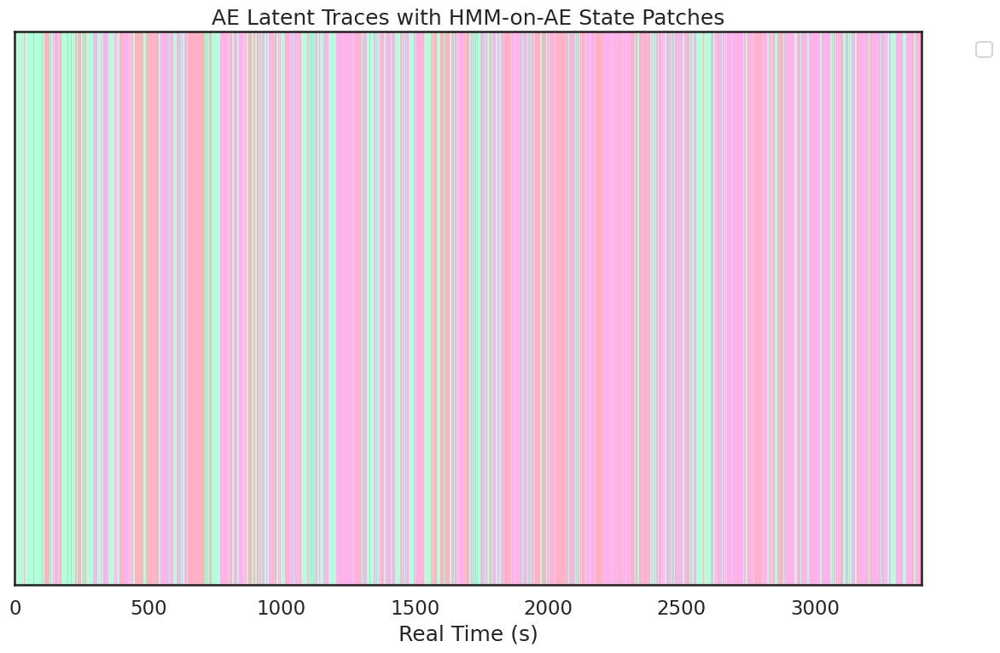

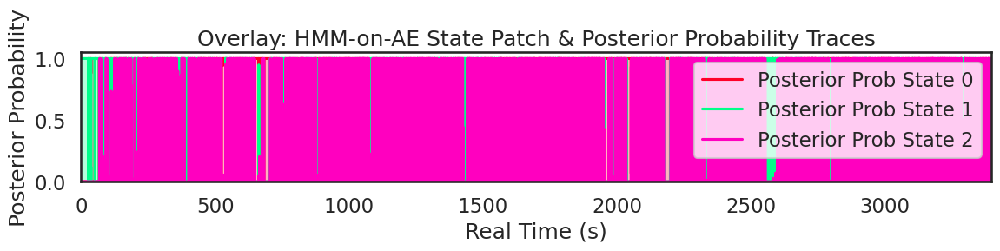

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# ----- User Settings -----
# Options for plotting and filtering:
plot_patch = True      # For Plot 1: whether to show the HMM state patch.
plot_latents = False    # For Plot 1: whether to plot the AE latent traces.
use_time_range = True  # Filter by time.
use_index_range = False  # Filter by index.

# Time range settings (in seconds)
start_time = 0        # Adjust as needed.
end_time   = "end"       # Adjust as needed; can also be "end" to select the last time point.

# Index range settings (if used)
start_index = 160000   # Adjust as needed.
end_index = "end"      # "end" means the last index.

# Vertical offset for AE latent traces (Plot 1)
offset = 100

# ----- Common Mask Building (for both plots) -----
# We use the "RealTime (s)" column from ae_latents_df to filter data.
time_all = ae_latents_df["RealTime (s)"].values

# Time mask
if use_time_range:
    if isinstance(end_time, str) and end_time.lower() == "end":
        end_time = time_all[-1]
    mask_time = (time_all >= start_time) & (time_all <= end_time)
else:
    mask_time = np.ones_like(time_all, dtype=bool)

# Index mask
if use_index_range:
    if start_index is None:
        start_index = 0
    if isinstance(end_index, str) and end_index.lower() == "end":
        end_index = len(time_all) - 1
    mask_index = np.zeros_like(time_all, dtype=bool)
    mask_index[start_index: end_index + 1] = True
else:
    mask_index = np.ones_like(time_all, dtype=bool)

# Combined mask
mask = mask_time & mask_index
time_range = time_all[mask]

# ----- HMM Patch Setup (common for both plots) -----
# For both plots, we use the "Most Likely State (K=3)" column from hmm_on_ae_latent_df.
# (Adjust the column name if needed.)
hmm_states_all = hmm_on_ae_latents_df[f"Most Likely State (K={num_hmm_on_ae_states})"].values
hmm_z_range = hmm_states_all[mask]  # Filter using the same mask.
num_states = len(np.unique(hmm_states_all))
cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# =============================================================================
# Plot 1: AE Latent Traces with HMM State Patch
# =============================================================================
# Data extraction for AE latent traces (assumed in the first n_ae_latents columns)
_obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values

# Determine overall y-axis range from the latent traces (after adding vertical offsets)
n_channels = _obs_array.shape[1]
y_min = np.inf
y_max = -np.inf
for i in range(n_channels):
    trace = _obs_array[mask, i] + i * offset
    y_min = min(y_min, np.min(trace))
    y_max = max(y_max, np.max(trace))

plt.figure(figsize=(12, 8))
if plot_patch:
    plt.imshow(hmm_z_range[None, :],
               aspect="auto",
               cmap=cmap_hmm,
               vmin=0,
               vmax=num_states - 1,
               extent=[time_range[0], time_range[-1], y_min, y_max],
               alpha=0.3)
if plot_latents:
    for i in range(n_channels):
        trace = _obs_array[mask, i]
        plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

plt.xlabel("Real Time (s)")
if use_time_range:
    plt.xlim(start_time, end_time)
plt.yticks([])  # Remove y-axis ticks for clarity.
plt.title("AE Latent Traces with HMM-on-AE State Patches")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

# =============================================================================
# Plot 2: Overlay - HMM State Patch & Posterior Probability Traces
# =============================================================================
# For the second plot, we work with the HMM Data from hmm_on_ae_latent_df.
# Use the "RealTime (s)" column from hmm_on_ae_latent_df.
time_hmm = hmm_on_ae_latents_df["RealTime (s)"].values

# Build mask for HMM data using the same settings.
if use_time_range:
    if isinstance(end_time, str) and end_time.lower() == "end":
        end_time = time_hmm[-1]
    mask_time_hmm = (time_hmm >= start_time) & (time_hmm <= end_time)
else:
    mask_time_hmm = np.ones_like(time_hmm, dtype=bool)

if use_index_range:
    if start_index is None:
        start_index = 0
    if isinstance(end_index, str) and end_index.lower() == "end":
        end_index = len(time_hmm) - 1
    mask_index_hmm = np.zeros_like(time_hmm, dtype=bool)
    mask_index_hmm[start_index: end_index + 1] = True
else:
    mask_index_hmm = np.ones_like(time_hmm, dtype=bool)

mask_hmm = mask_time_hmm & mask_index_hmm
time_range_hmm = time_hmm[mask_hmm]

# Extract the most likely state for HMM patch.
most_likely_hmm = hmm_on_ae_latents_df[f"Most Likely State (K={num_hmm_on_ae_states})"].values[mask_hmm]

# Dynamically identify posterior probability columns.
posterior_cols = [col for col in hmm_on_ae_latents_df.columns if col.startswith("Posterior_Prob_State_")]
num_states = len(posterior_cols)  # This should match the number of unique states ideally.
# Stack the posterior probability data into a 2D array and filter it.
posterior_data = np.column_stack([hmm_on_ae_latents_df[col].values for col in posterior_cols])
posterior_data = posterior_data[mask_hmm, :]

# For overlaying, we set the y-axis range as [0, 1].
y_min_overlay, y_max_overlay = 0, 1

plt.figure(figsize=(12, 3))
plt.imshow(most_likely_hmm[None, :],
           aspect="auto",
           cmap=cmap_hmm,
           vmin=0,
           vmax=num_states - 1,
           extent=[time_range_hmm[0], time_range_hmm[-1], y_min_overlay, y_max_overlay],
           alpha=0.3)
for i in range(num_states):
    plt.plot(time_range_hmm, posterior_data[:, i],
             label=f"Posterior Prob State {i}",
             color=cmap_hmm(i))
plt.xlabel("Real Time (s)")
plt.ylabel("Posterior Probability")
if use_time_range:
    plt.xlim(start_time, end_time)
plt.title("Overlay: HMM-on-AE State Patch & Posterior Probability Traces")
plt.legend(loc="upper right")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()


In [128]:
hmm_on_ae_latents_df

,RealTime (s),Most Likely State (K=5),Posterior_Prob_State_0,Posterior_Prob_State_1,Posterior_Prob_State_2,Posterior_Prob_State_3,Posterior_Prob_State_4
0,0.000000,0,1.000000e+00,0.000000e+00,9.141873e-44,2.257720e-259,1.005313e-229
1,0.020833,0,1.000000e+00,0.000000e+00,2.828635e-38,5.250566e-255,9.273092e-227
2,0.041667,0,1.000000e+00,0.000000e+00,9.210590e-39,5.357890e-257,6.361007e-230
3,0.062500,0,1.000000e+00,0.000000e+00,2.974645e-39,2.841004e-258,1.699036e-232
4,0.083333,0,1.000000e+00,0.000000e+00,7.911570e-40,7.394186e-259,1.699523e-235
...,...,...,...,...,...,...,...
163140,3398.750000,4,2.104893e-09,8.677033e-11,1.381825e-08,8.775959e-40,1.000000e+00
163141,3398.770833,4,1.986039e-09,7.602221e-11,1.022501e-08,1.046450e-39,1.000000e+00
163142,3398.791667,4,2.197260e-09,4.222203e-10,8.954409e-09,9.110003e-39,1.000000e+00
163143,3398.812500,4,2.795428e-09,3.855899e-09,7.920278e-09,2.190343e-37,1.000000e+00


<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast
No handles with labels found to put in legend.


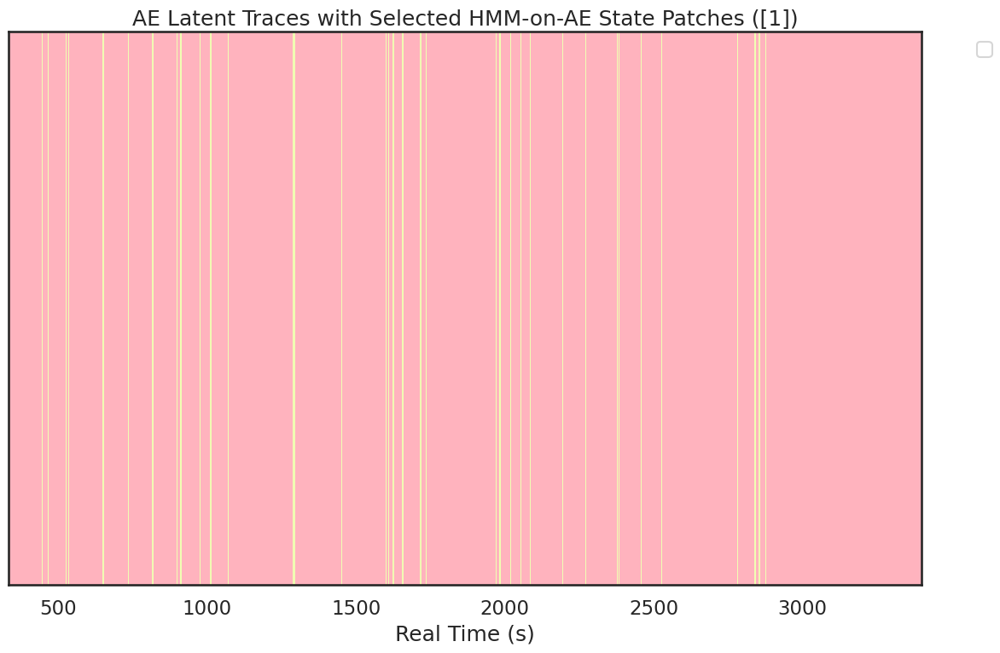

In [131]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import os

# ----- User Settings -----
plot_patch = True      # Show the HMM state patch.
plot_latents = False   # Plot the AE latent traces.
use_time_range = False  # Filter by time.
use_index_range = True  # Filter by index.

# Time range settings (in seconds)
start_time = 0        
end_time   = 2000    

# Index range settings
start_index = 16000  
end_index = "end"     

# Vertical offset for AE latent traces (Plot 1)
offset = 100

# ----- New Feature: Select Specific HMM States to Plot -----
selected_states = [1]  # Choose which HMM states to visualize as patches
plot_all_states = False  # Set to True to plot all states, False to filter

# ----- Load Data -----
# dfs_dir = "your_directory_path"  # Change to the actual path
ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "ae_latents_df.csv"))
# hmm_on_ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "hmm_on_ae_latents_df.csv"))

time_all = ae_latents_df["RealTime (s)"].values

# Time mask
if use_time_range:
    if isinstance(end_time, str) and end_time.lower() == "end":
        end_time = time_all[-1]
    mask_time = (time_all >= start_time) & (time_all <= end_time)
else:
    mask_time = np.ones_like(time_all, dtype=bool)

# Index mask
if use_index_range:
    if start_index is None:
        start_index = 0
    if isinstance(end_index, str) and end_index.lower() == "end":
        end_index = len(time_all) - 1
    mask_index = np.zeros_like(time_all, dtype=bool)
    mask_index[start_index: end_index + 1] = True
else:
    mask_index = np.ones_like(time_all, dtype=bool)

# Combined mask
mask = mask_time & mask_index
time_range = time_all[mask]

# ----- HMM Patch Setup -----
hmm_states_all = hmm_on_ae_latents_df[f"Most Likely State (K={num_hmm_on_ae_states})"].values
hmm_z_range = hmm_states_all[mask]  

# Ensure correct filtering of selected states
if not plot_all_states:
    hmm_z_filtered = np.full_like(hmm_z_range, np.nan)  # Set non-selected states to NaN
    mask_selected = np.isin(hmm_z_range, selected_states)
    hmm_z_filtered[mask_selected] = hmm_z_range[mask_selected]  # Keep only selected states
else:
    hmm_z_filtered = hmm_z_range  # Keep all states if not filtering

# Preserve original color mapping
unique_states = np.unique(hmm_states_all)
num_states = len(unique_states)
cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# Create a mapping from state to color index
state_to_color = {state: i for i, state in enumerate(unique_states)}

# Convert NaN values to -1 so that they do not interfere with mapping
hmm_color_map = np.where(np.isnan(hmm_z_filtered), -1, hmm_z_filtered)
hmm_color_map = np.vectorize(lambda state: state_to_color.get(state, -1))(hmm_color_map)

# =============================================================================
# Plot 1: AE Latent Traces with HMM State Patch
# =============================================================================
_obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values

n_channels = _obs_array.shape[1]
y_min, y_max = np.inf, -np.inf
for i in range(n_channels):
    trace = _obs_array[mask, i] + i * offset
    y_min = min(y_min, np.min(trace))
    y_max = max(y_max, np.max(trace))

plt.figure(figsize=(12, 8))

# Plot HMM state patches
if plot_patch:
    plt.imshow(hmm_color_map[None, :],
               aspect="auto",
               cmap=cmap_hmm,
               vmin=0,
               vmax=num_states - 1,
               extent=[time_range[0], time_range[-1], y_min, y_max],
               alpha=0.3)

# Plot Latent Traces
if plot_latents:
    for i in range(n_channels):
        trace = _obs_array[mask, i]
        plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

plt.xlabel("Real Time (s)")
if use_time_range:
    plt.xlim(start_time, end_time)
plt.yticks([])
plt.title(f"AE Latent Traces with Selected HMM-on-AE State Patches ({selected_states})")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [132]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import os

# ----- User Settings -----
plot_patch = True      # Show the HMM state patch.
plot_latents = False   # Plot the AE latent traces.
use_time_range = False  # Filter by time.
use_index_range = True  # Filter by index.

# Time range settings (in seconds)
start_time = 0        
end_time   = 2000    

# Index range settings
start_index = 16000  
end_index = "end"     

# Vertical offset for AE latent traces (Plot 1)
offset = 100

# ----- New Feature: Select Specific HMM States to Plot -----
selected_states = [3]  # Choose which HMM states to visualize as patches
plot_all_states = False  # Set to True to plot all states, False to filter

# ----- Load Data -----
# dfs_dir = "your_directory_path"  # Change to the actual path
ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "ae_latents_df.csv"))
# hmm_on_ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "hmm_on_ae_latents_df.csv"))

time_all = ae_latents_df["RealTime (s)"].values

# Time mask
if use_time_range:
    if isinstance(end_time, str) and end_time.lower() == "end":
        end_time = time_all[-1]
    mask_time = (time_all >= start_time) & (time_all <= end_time)
else:
    mask_time = np.ones_like(time_all, dtype=bool)

# Index mask
if use_index_range:
    if start_index is None:
        start_index = 0
    if isinstance(end_index, str) and end_index.lower() == "end":
        end_index = len(time_all) - 1
    mask_index = np.zeros_like(time_all, dtype=bool)
    mask_index[start_index: end_index + 1] = True
else:
    mask_index = np.ones_like(time_all, dtype=bool)

# Combined mask
mask = mask_time & mask_index
time_range = time_all[mask]

# ----- HMM Patch Setup -----
hmm_states_all = hmm_on_ae_latents_df[f"Most Likely State (K={num_hmm_on_ae_states})"].values
hmm_z_range = hmm_states_all[mask]  

# Ensure correct filtering of selected states
if not plot_all_states:
    hmm_z_filtered = np.full_like(hmm_z_range, np.nan)  # Set non-selected states to NaN
    mask_selected = np.isin(hmm_z_range, selected_states)
    hmm_z_filtered[mask_selected] = hmm_z_range[mask_selected]  # Keep only selected states
else:
    hmm_z_filtered = hmm_z_range  # Keep all states if not filtering

# Preserve original color mapping
unique_states = np.unique(hmm_states_all)
num_states = len(unique_states)
cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# Create a mapping from state to color index
state_to_color = {state: i for i, state in enumerate(unique_states)}

# Convert NaN values to a masked array
hmm_color_map = np.vectorize(lambda state: state_to_color.get(state, np.nan))(hmm_z_filtered)
hmm_color_map = np.ma.masked_where(np.isnan(hmm_color_map), hmm_color_map)  # Mask NaN values

# =============================================================================
# Plot 1: AE Latent Traces with HMM State Patch
# =============================================================================
_obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values

n_channels = _obs_array.shape[1]
y_min, y_max = np.inf, -np.inf
for i in range(n_channels):
    trace = _obs_array[mask, i] + i * offset
    y_min = min(y_min, np.min(trace))
    y_max = max(y_max, np.max(trace))

plt.figure(figsize=(12, 8))

# Plot HMM state patches (FIX: Set NaN regions as transparent)
if plot_patch:
    plt.imshow(hmm_color_map[None, :],
               aspect="auto",
               cmap=cmap_hmm,
               vmin=0,
               vmax=num_states - 1,
               extent=[time_range[0], time_range[-1], y_min, y_max],
               alpha=0.5)  # Set transparency to avoid pink background

# Plot Latent Traces
if plot_latents:
    for i in range(n_channels):
        trace = _obs_array[mask, i]
        plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

plt.xlabel("Real Time (s)")
if use_time_range:
    plt.xlim(start_time, end_time)
plt.yticks([])
plt.title(f"AE Latent Traces with Selected HMM-on-AE State Patches ({selected_states})")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


<__array_function__ internals>:200: RuntimeWarning: invalid value encountered in cast


ValueError: cannot convert float NaN to integer

No handles with labels found to put in legend.


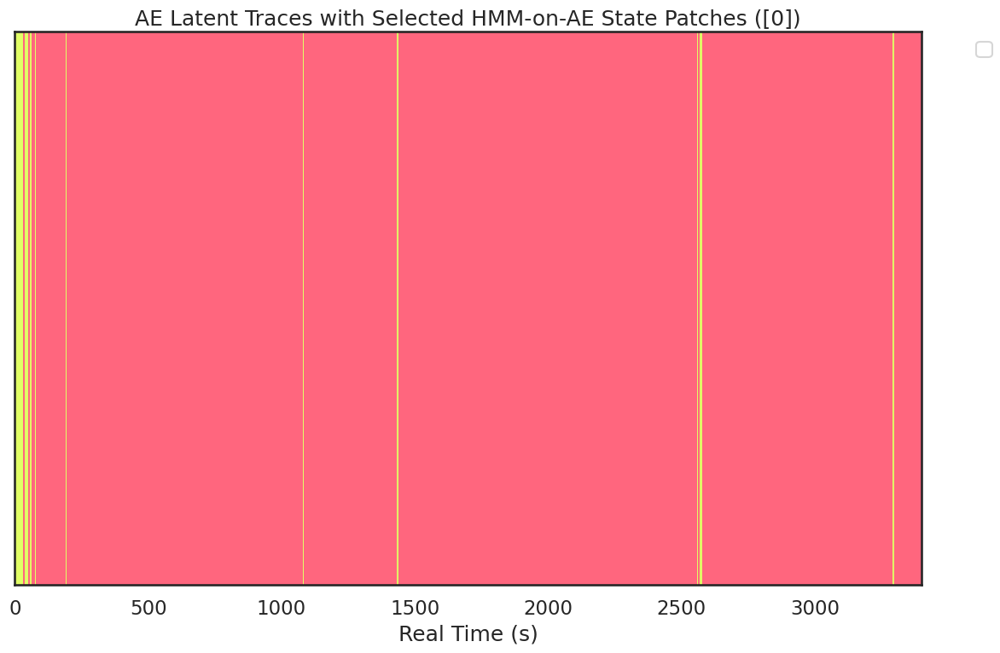

In [124]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import os

# ----- User Settings -----
plot_patch = True      # Show the HMM state patch.
plot_latents = False   # Plot the AE latent traces.
use_time_range = True  # Filter by time.
use_index_range = False  # Filter by index.

# Time range settings (in seconds)
start_time = 0        
end_time   = "end"    

# Index range settings
start_index = 160000  
end_index = "end"    

# Vertical offset for AE latent traces (Plot 1)
offset = 100

# ----- New Feature: Select Specific HMM States to Plot -----
selected_states = [0]  # Choose which HMM states to visualize as patches
plot_all_states = False  # True to plot all states, False to plot selected ones

# ----- Load Data -----
# dfs_dir = "your_directory_path"  # Change to the actual path
ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "ae_latents_df.csv"))
# hmm_on_ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "hmm_on_ae_latents_df.csv"))

time_all = ae_latents_df["RealTime (s)"].values

# Time mask
if use_time_range:
    if isinstance(end_time, str) and end_time.lower() == "end":
        end_time = time_all[-1]
    mask_time = (time_all >= start_time) & (time_all <= end_time)
else:
    mask_time = np.ones_like(time_all, dtype=bool)

# Index mask
if use_index_range:
    if start_index is None:
        start_index = 0
    if isinstance(end_index, str) and end_index.lower() == "end":
        end_index = len(time_all) - 1
    mask_index = np.zeros_like(time_all, dtype=bool)
    mask_index[start_index: end_index + 1] = True
else:
    mask_index = np.ones_like(time_all, dtype=bool)

# Combined mask
mask = mask_time & mask_index
time_range = time_all[mask]

# ----- HMM Patch Setup -----
hmm_states_all = hmm_on_ae_latents_df[f"Most Likely State (K={num_hmm_on_ae_states})"].values
hmm_z_range = hmm_states_all[mask]  

# Ensure correct filtering of selected states
if not plot_all_states:
    hmm_z_filtered = np.full_like(hmm_z_range, -1)  # Set non-selected states to -1
    mask_selected = np.isin(hmm_z_range, selected_states)
    hmm_z_filtered[mask_selected] = hmm_z_range[mask_selected]  # Keep only selected states
else:
    hmm_z_filtered = hmm_z_range  # Keep all states if not filtering

num_states = len(np.unique(hmm_states_all))
cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# =============================================================================
# Plot 1: AE Latent Traces with HMM State Patch
# =============================================================================
_obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values

n_channels = _obs_array.shape[1]
y_min, y_max = np.inf, -np.inf
for i in range(n_channels):
    trace = _obs_array[mask, i] + i * offset
    y_min = min(y_min, np.min(trace))
    y_max = max(y_max, np.max(trace))

plt.figure(figsize=(12, 8))

# Plot HMM state patches
if plot_patch:
    plt.imshow(hmm_z_filtered[None, :],
               aspect="auto",
               cmap=cmap_hmm,
               vmin=-1,  # Include background state
               vmax=num_states - 1,
               extent=[time_range[0], time_range[-1], y_min, y_max],
               alpha=0.6)  # Slightly increase alpha for better visibility

# Plot Latent Traces
if plot_latents:
    for i in range(n_channels):
        trace = _obs_array[mask, i]
        plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

plt.xlabel("Real Time (s)")
if use_time_range:
    plt.xlim(start_time, end_time)
plt.yticks([])
plt.title(f"AE Latent Traces with Selected HMM-on-AE State Patches ({selected_states})")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


No handles with labels found to put in legend.


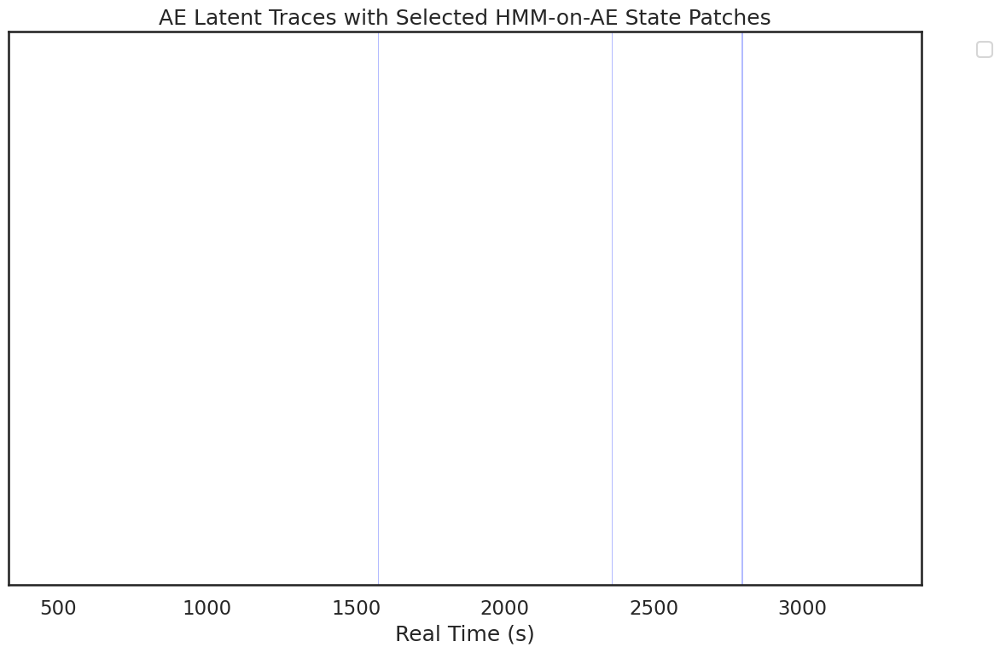

In [116]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import os

# ----- User Settings -----
plot_patch = True      # For Plot 1: whether to show the HMM state patch.
plot_latents = False   # For Plot 1: whether to plot the AE latent traces.
use_time_range = False  # Filter by time.
use_index_range = True  # Filter by index.

# Time range settings (in seconds)
start_time = 0        # Adjust as needed.
end_time   = 2000    # "end" means the last time point.

# Index range settings
start_index = 16000  # Adjust as needed.
end_index = "end"     # "end" means the last index.

# Vertical offset for AE latent traces (Plot 1)
offset = 100

# ----- New Feature: Select Specific HMM States to Plot -----
selected_states = [3]  # Choose which HMM states to visualize as patches
plot_all_states = False   # Set to True to plot all states, False to plot selected ones

# ----- Common Mask Building (for both plots) -----
ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "ae_latents_df.csv"))
# hmm_on_ae_latents_df = pd.read_csv(os.path.join(dfs_dir, "hmm_on_ae_latents_df.csv"))
time_all = ae_latents_df["RealTime (s)"].values

# Time mask
if use_time_range:
    if isinstance(end_time, str) and end_time.lower() == "end":
        end_time = time_all[-1]
    mask_time = (time_all >= start_time) & (time_all <= end_time)
else:
    mask_time = np.ones_like(time_all, dtype=bool)

# Index mask
if use_index_range:
    if start_index is None:
        start_index = 0
    if isinstance(end_index, str) and end_index.lower() == "end":
        end_index = len(time_all) - 1
    mask_index = np.zeros_like(time_all, dtype=bool)
    mask_index[start_index: end_index + 1] = True
else:
    mask_index = np.ones_like(time_all, dtype=bool)

# Combined mask
mask = mask_time & mask_index
time_range = time_all[mask]

# ----- HMM Patch Setup -----
hmm_states_all = hmm_on_ae_latents_df[f"Most Likely State (K={num_hmm_on_ae_states})"].values
hmm_z_range = hmm_states_all[mask]  

# Filter only selected states if plot_all_states is False
if not plot_all_states:
    hmm_z_range = np.where(np.isin(hmm_z_range, selected_states), hmm_z_range, np.nan) 

num_states = len(np.unique(hmm_states_all))
cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# =============================================================================
# Plot 1: AE Latent Traces with HMM State Patch
# =============================================================================
_obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values

n_channels = _obs_array.shape[1]
y_min = np.inf
y_max = -np.inf
for i in range(n_channels):
    trace = _obs_array[mask, i] + i * offset
    y_min = min(y_min, np.min(trace))
    y_max = max(y_max, np.max(trace))

plt.figure(figsize=(12, 8))
if plot_patch:
    plt.imshow(hmm_z_range[None, :],
               aspect="auto",
               cmap=cmap_hmm,
               vmin=0,
               vmax=num_states - 1,
               extent=[time_range[0], time_range[-1], y_min, y_max],
               alpha=0.3)
if plot_latents:
    for i in range(n_channels):
        trace = _obs_array[mask, i]
        plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

plt.xlabel("Real Time (s)")
if use_time_range:
    plt.xlim(start_time, end_time)
plt.yticks([])
plt.title("AE Latent Traces with Selected HMM-on-AE State Patches")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()


In [59]:
hmm_z_range

array([nan, nan, nan, ..., nan, nan, nan])

### Plot Distribution of Posterior Probabilities 0 to n_hmm_states

Number of HMM states identified: 5


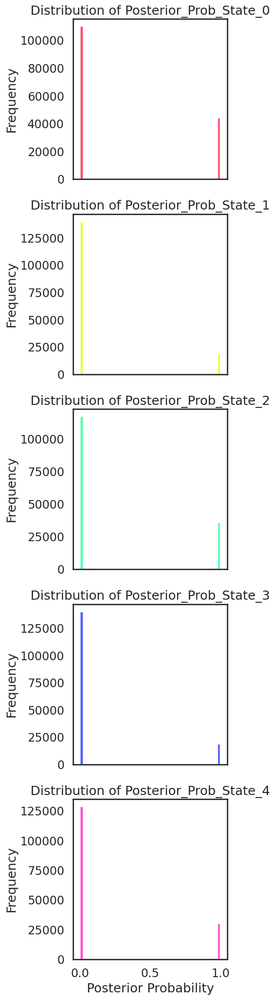

In [41]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Identify posterior probability columns from hmm_on_ae_latent_df.
posterior_cols = [col for col in hmm_on_ae_latents_df.columns if col.startswith("Posterior_Prob_State_")]
num_states = len(posterior_cols)
print(f"Number of HMM states identified: {num_states}")

# Create a colormap using 'gist_rainbow' with as many discrete colors as there are states.
cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# Create subplots: one for each state.
fig, axes = plt.subplots(num_states, 1, figsize=(5, 4 * num_states), sharex=True)

# If only one state is present, make sure axes is iterable.
if num_states == 1:
    axes = [axes]

bins = 50  # Number of histogram bins.

# Plot each state's posterior probability distribution in its corresponding subplot.
for i, col in enumerate(posterior_cols):
    data = hmm_on_ae_latents_df[col].values
    axes[i].hist(data, bins=bins, alpha=0.7, color=cmap_hmm(i))
    axes[i].set_ylabel("Frequency")
    axes[i].set_title(f"Distribution of {col}")

plt.xlabel("Posterior Probability")
plt.tight_layout()
plt.show()


In [ ]:
"""plot AE traces"""
# import numpy as np
# import matplotlib.pyplot as plt
# # Specify the desired time range (in seconds)
# start_time = 10  # adjust as needed
# end_time   = 20  # adjust as needed

# # Set a vertical offset value for clarity
# offset = 20

# # Extract the AE latent traces and real time from ae_latents_df
# _obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values
# time = ae_latents_df["RealTime (s)"].values

# # Create a mask to select the time indices within the specified range
# mask = (time >= start_time) & (time <= end_time)
# time_range = time[mask]

# # Plot all n_ae_latents latent traces from _obs_array (filtered by the time range) in one figure.
# plt.figure(figsize=(12, 8))
# n_channels = _obs_array.shape[1]

# for i in range(n_channels):
#     # Select the trace for channel i over the desired time range
#     trace = _obs_array[mask, i]
#     # Plot the trace with a vertical offset to avoid overlap
#     plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

# plt.xlabel("Real Time (s)")
# plt.xlim(start_time, end_time)
# plt.yticks([])  # Remove y-axis ticks
# plt.title("AE Latent Traces")
# plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
# plt.tight_layout()
# plt.show()


In [ ]:
"Next cell does the job of this cell"# import numpy as np
# import matplotlib.pyplot as plt

# # ----- User settings -----
# # Choose which range type(s) to use:
# use_time_range = False    # If True, use time range (in seconds)
# use_index_range = True   # If True, use index range

# # Time range settings (in seconds)
# start_time = 10         # Adjust as needed
# end_time   = 20         # Adjust as needed; set to "end" to use the last time point

# # Index range settings
# start_index = 0       # Adjust as needed (or set to None to start at 0)
# end_index   = 3000     # Set to "end" to use the last index, or an integer index

# # Vertical offset for clarity
# offset = 200

# # ----- Data extraction -----
# # Extract the AE latent traces and real time from ae_latents_df.
# # We assume that the first n_ae_latents columns contain the latent traces.
# _obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values
# time = ae_latents_df["RealTime (s)"].values

# # ----- Build the mask for selecting the desired range -----
# # Mask for the time range
# if use_time_range:
#     # If end_time is "end", set it to the last time value.
#     if end_time == "end":
#         end_time = time[-1]
#     mask_time = (time >= start_time) & (time <= end_time)
# else:
#     mask_time = np.ones_like(time, dtype=bool)

# # Mask for the index range
# if use_index_range:
#     if start_index is None:
#         start_index = 0
#     if end_index == "end" or end_index is None:
#         end_index = len(time) - 1
#     mask_index = np.zeros_like(time, dtype=bool)
#     mask_index[start_index: end_index + 1] = True
# else:
#     mask_index = np.ones_like(time, dtype=bool)

# # Combine both masks (logical AND)
# mask = mask_time & mask_index
# time_range = time[mask]

# # ----- Plotting -----
# plt.figure(figsize=(12, 8))
# n_channels = _obs_array.shape[1]

# for i in range(n_channels):
#     # Extract the trace for channel i over the desired range
#     trace = _obs_array[mask, i]
#     # Plot with a vertical offset to avoid overlapping
#     plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

# plt.xlabel("Real Time (s)")
# if use_time_range:
#     plt.xlim(start_time, end_time)
# plt.yticks([])  # Remove y-axis ticks
# plt.title("AE Latent Traces")
# plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
# plt.tight_layout()
# plt.show()


### Plot HMM states and AE latens overlaied

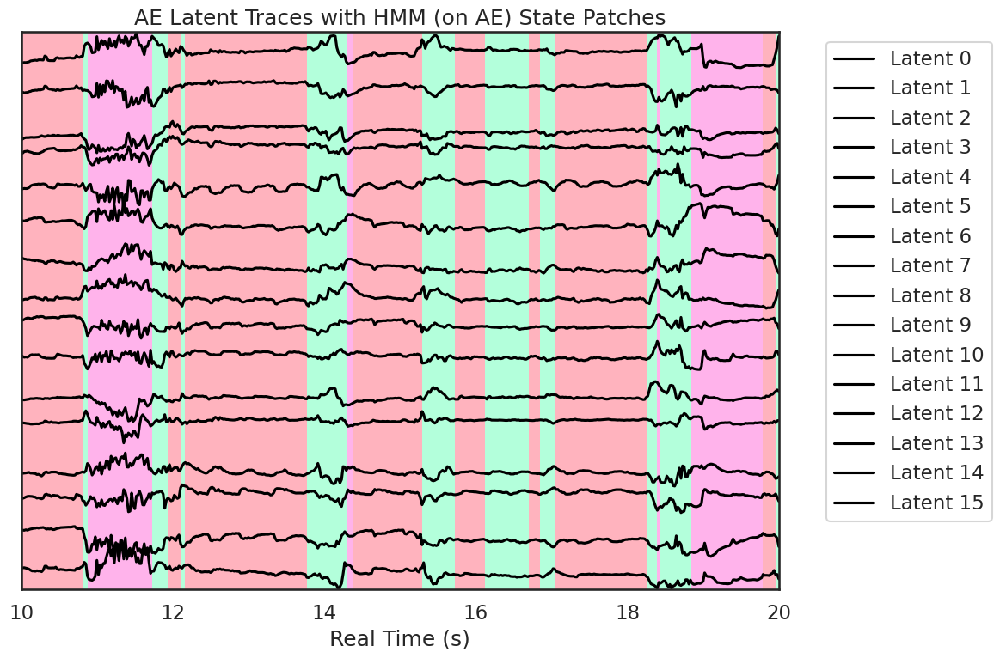

In [ ]:
"""This code Plot HMM states and AE latens overlaied. which part of the following code"""
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm

# # ----- User Settings -----
# # Determine which elements to plot:
# plot_patch = True      # Set to True to plot the HMM state patch.
# plot_latents = True    # Set to True to plot the AE latent traces.

# # Define whether to use each type of range.
# use_time_range = True   # Set to True to use time range filtering.
# use_index_range = False  # Set to True to use index range filtering.

# # Time range settings (in seconds)
# start_time = 10        # Adjust as needed.
# end_time   = 20        # Adjust as needed; alternatively, set to "end" for the last time point.

# # Index range settings
# start_index = 160000      # Adjust as needed.
# end_index = "end"      # Set to "end" for the last index.

# # Vertical offset between latent traces for clarity.
# offset = 100

# # ----- Data Extraction -----
# # Extract AE latent traces (first n_ae_latents columns) and real time from ae_latents_df.
# _obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values
# time = ae_latents_df["RealTime (s)"].values

# # ----- Build the Time Mask -----
# if use_time_range:
#     # Convert "end" string to the last time value if necessary.
#     if isinstance(end_time, str) and end_time.lower() == "end":
#         end_time = time[-1]
#     mask_time = (time >= start_time) & (time <= end_time)
# else:
#     mask_time = np.ones_like(time, dtype=bool)

# # ----- Build the Index Mask -----
# if use_index_range:
#     if start_index is None:
#         start_index = 0
#     if isinstance(end_index, str) and end_index.lower() == "end":
#         end_index = len(time) - 1
#     mask_index = np.zeros_like(time, dtype=bool)
#     mask_index[start_index: end_index + 1] = True
# else:
#     mask_index = np.ones_like(time, dtype=bool)

# # ----- Combine the Masks -----
# mask = mask_time & mask_index
# time_range = time[mask]

# # ----- HMM State Patch Setup -----
# # Assume hmm_on_ae_latent_df contains HMM results.
# # Here, we use the second column ("Most Likely State (K=3)") from hmm_on_ae_latent_df.
# hmm_z_range = hmm_on_ae_latent_df.iloc[:, 1][mask].values

# # Determine the number of unique HMM states and set up a colormap.
# num_states = len(np.unique(hmm_z_range))
# cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# # ----- Determine Overall y-axis Range -----
# n_channels = _obs_array.shape[1]
# y_min = np.inf
# y_max = -np.inf
# for i in range(n_channels):
#     trace = _obs_array[mask, i] + i * offset
#     y_min = min(y_min, np.min(trace))
#     y_max = max(y_max, np.max(trace))

# # ----- Plotting -----
# plt.figure(figsize=(12, 8))

# # Plot the HMM state patch as a background covering the full y-axis range if desired.
# if plot_patch:
#     plt.imshow(hmm_z_range[None, :],
#                aspect="auto",
#                cmap=cmap_hmm,
#                vmin=0,
#                vmax=num_states - 1,
#                extent=[time_range[0], time_range[-1], y_min, y_max],
#                alpha=0.3)

# # Plot each AE latent trace with a vertical offset if desired.
# if plot_latents:
#     for i in range(n_channels):
#         trace = _obs_array[mask, i]
#         plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")

# plt.xlabel("Real Time (s)")
# if use_time_range:
#     plt.xlim(start_time, end_time)
# plt.yticks([])  # Remove y-axis ticks for clarity.
# plt.title("AE Latent Traces with HMM (on AE) State Patches")
# plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
# plt.tight_layout()
# plt.show()


### Plot infered HMM-on_ae_latents and corresponding posterior probabbility

Number of HMM states identified: 3


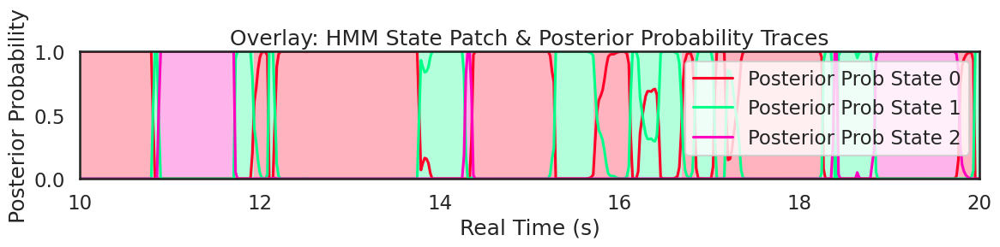

In [102]:
"""This code Plot infered HMM-on_ae_latents and corresponding posterior probabbility. which part of the above code"""
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm

# # ----- User Settings -----
# # Options to filter the data by time and/or index.
# use_time_range = True   # Set to True to filter by time.
# use_index_range = False # Set to True to filter by index.

# # Time range settings (in seconds)
# start_time = 10         # Adjust as needed.
# end_time   = 20         # Adjust as needed; alternatively, set to "end" for the last time point.

# # Index range settings (if used)
# start_index = 100       # Adjust as needed.
# end_index = "end"       # Set to "end" for the last index.

# # ----- Data Extraction -----
# # Extract the real time vector from hmm_on_ae_latent_df.
# time = hmm_on_ae_latent_df["RealTime (s)"].values

# # Build the time mask.
# if use_time_range:
#     if isinstance(end_time, str) and end_time.lower() == "end":
#         end_time = time[-1]
#     mask_time = (time >= start_time) & (time <= end_time)
# else:
#     mask_time = np.ones_like(time, dtype=bool)

# # Build the index mask.
# if use_index_range:
#     if start_index is None:
#         start_index = 0
#     if isinstance(end_index, str) and end_index.lower() == "end":
#         end_index = len(time) - 1
#     mask_index = np.zeros_like(time, dtype=bool)
#     mask_index[start_index:end_index+1] = True
# else:
#     mask_index = np.ones_like(time, dtype=bool)

# # Combine both masks.
# mask = mask_time & mask_index
# time_range = time[mask]

# # ----- HMM Data Extraction -----
# # Most likely state column (adjust the column name if needed)
# most_likely = hmm_on_ae_latent_df["Most Likely State (K=3)"].values[mask]

# # Dynamically identify posterior probability columns.
# posterior_cols = [col for col in hmm_on_ae_latent_df.columns if col.startswith("Posterior_Prob_State_")]
# num_states = len(posterior_cols)
# print(f"Number of HMM states identified: {num_states}")

# # Stack the posterior probability data into a 2D array and filter by the mask.
# posterior_data = np.column_stack([hmm_on_ae_latent_df[col].values for col in posterior_cols])
# posterior_data = posterior_data[mask, :]

# # ----- Colormap Setup -----
# # Use 'gist_rainbow' with as many discrete colors as there are states.
# cmap_hmm = cm.get_cmap('gist_rainbow', num_states)

# # For overlaying, posterior probabilities are between 0 and 1.
# y_min, y_max = 0, 1

# # ----- Plotting -----
# plt.figure(figsize=(12, 3))

# # Plot the HMM state patch as a background.
# plt.imshow(most_likely[None, :],
#            aspect="auto",
#            cmap=cmap_hmm,
#            vmin=0,
#            vmax=num_states - 1,
#            extent=[time_range[0], time_range[-1], y_min, y_max],
#            alpha=0.3)

# # Overlay the posterior probability traces.
# for i in range(num_states):
#     plt.plot(time_range, posterior_data[:, i],
#              label=f"Posterior Prob State {i}",
#              color=cmap_hmm(i))

# plt.xlabel("Real Time (s)")
# plt.ylabel("Posterior Probability")
# if use_time_range:
#     plt.xlim(start_time, end_time)
# plt.title("Overlay: HMM State Patch & Posterior Probability Traces")
# plt.legend(loc="upper right")
# plt.tight_layout()
# plt.show()


### Plot ARHMM states and AE latens overlaied

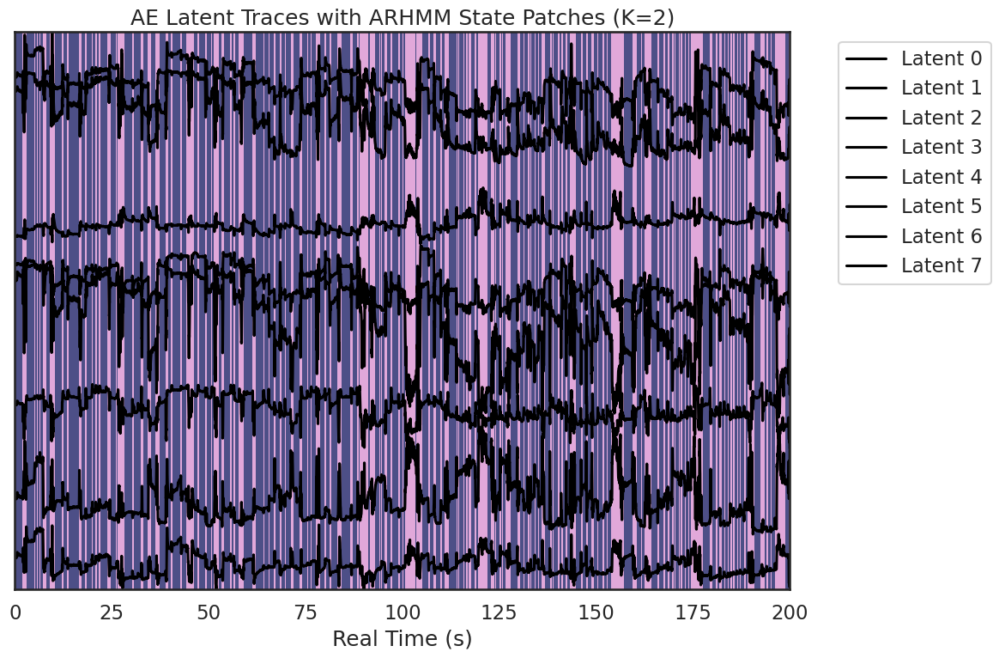

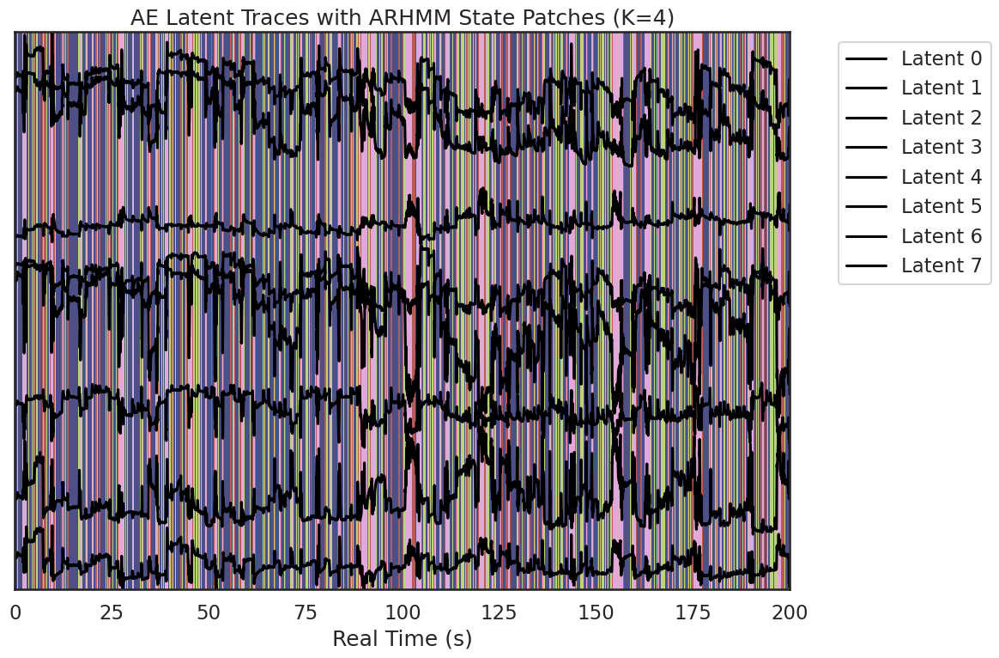

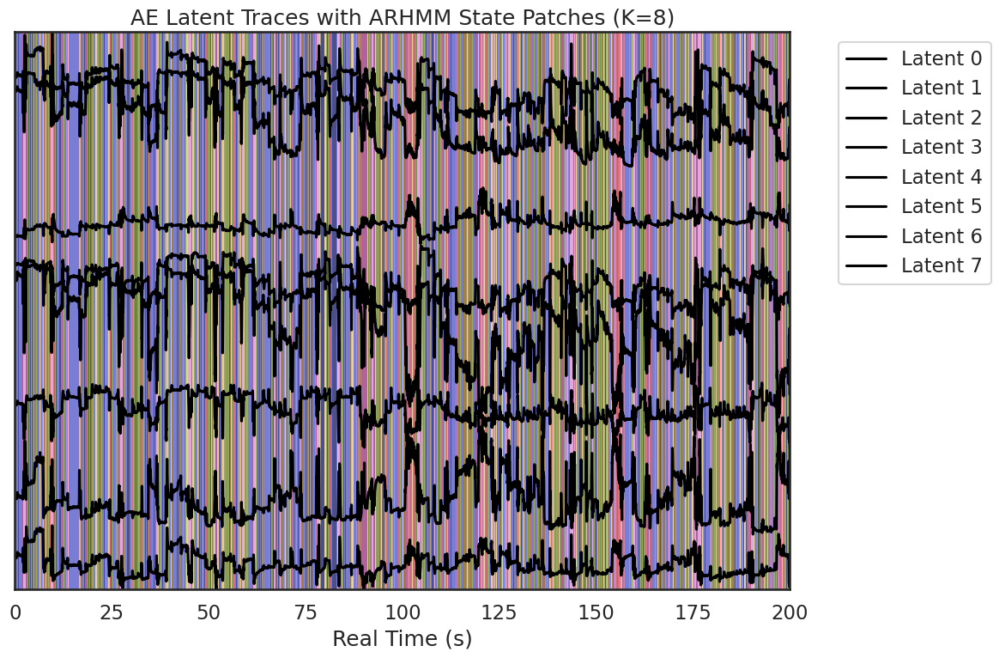

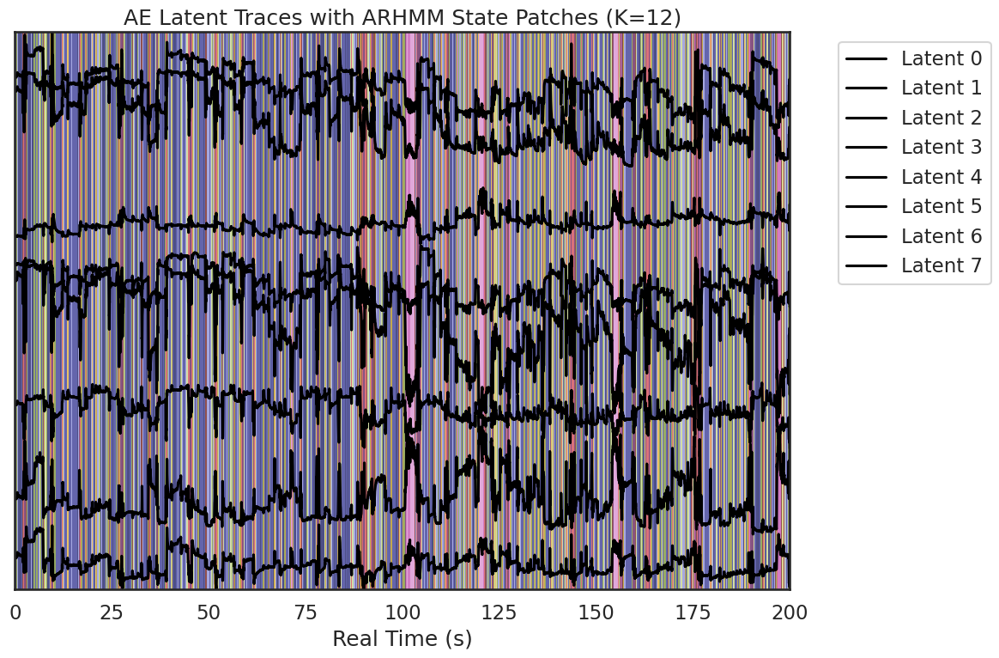

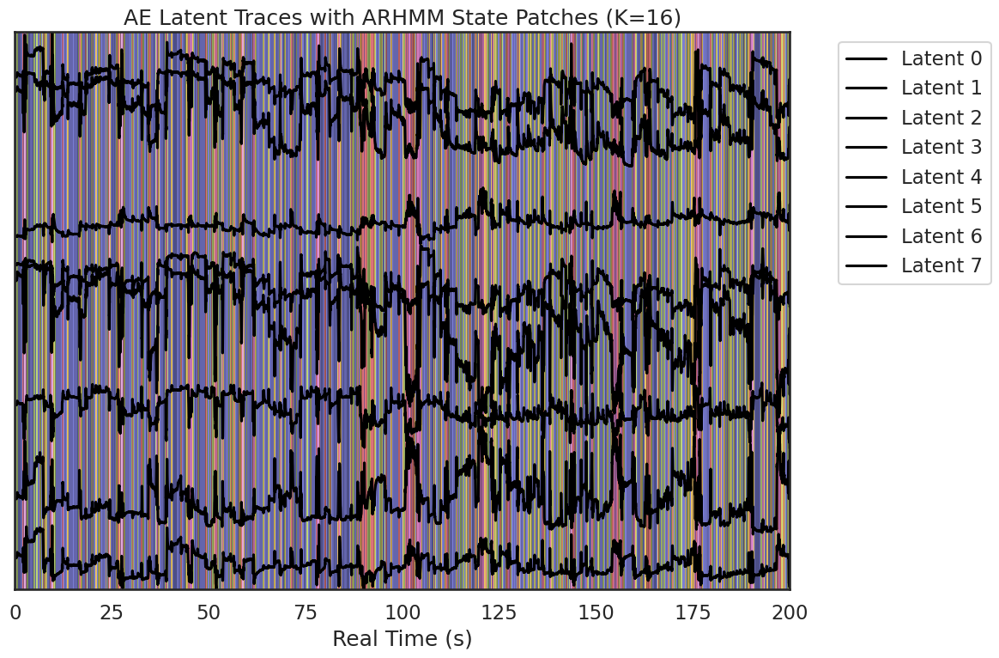

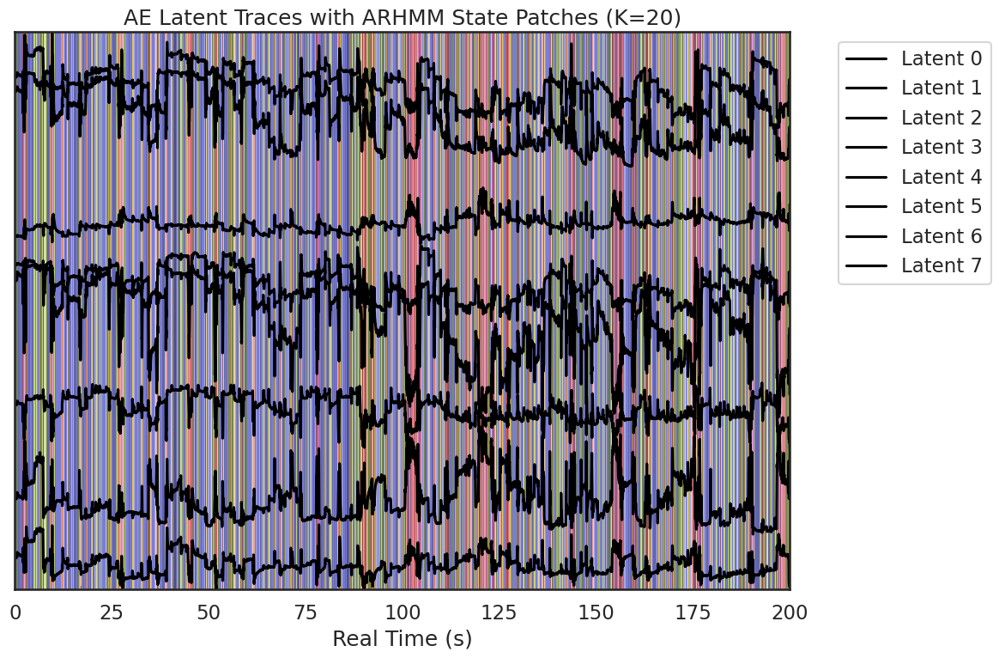

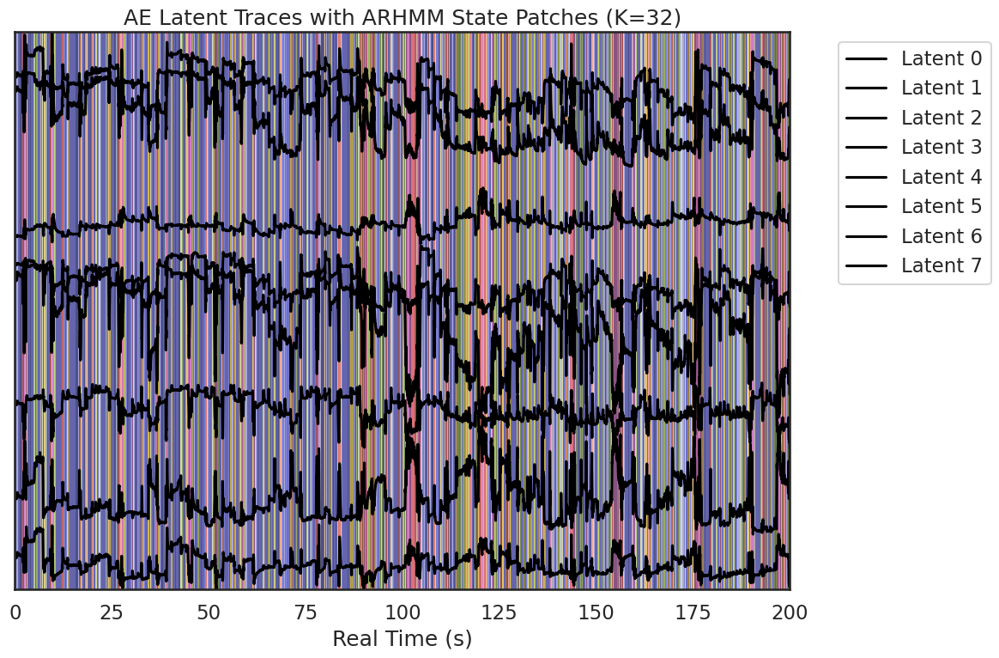

In [42]:
import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# ----- User Settings -----
# Which elements to plot:
plot_patch = True      # Set to True to plot the ARHMM state patch.
plot_latents = True    # Set to True to plot the AE latent traces.

# Options to filter the data:
use_time_range = True   # Set to True to use time range filtering.
use_index_range = False  # Set to True to use index range filtering.

# Time range settings (in seconds)
start_time = 0         # Adjust as needed.
end_time   = 200         # Adjust as needed; alternatively, set to "end" for the last time point.

# Index range settings (if used)
start_index = 160000    # Adjust as needed.
end_index = "end"       # Use "end" for the last index.

# Vertical offset for AE latent traces:
offset = 100

# Define n_ae_latents (number of latent columns in ae_latents_df)
# (For example, if you have 16 AE latent columns, set it as follows)
n_ae_latents = hparams['n_ae_latents']

# ----- Build Common Mask from ae_latents_df -----
# We use the "RealTime (s)" column from ae_latents_df for filtering.
time = ae_latents_df["RealTime (s)"].values

# Time mask:
if use_time_range:
    if isinstance(end_time, str) and end_time.lower() == "end":
        end_time = time[-1]
    mask_time = (time >= start_time) & (time <= end_time)
else:
    mask_time = np.ones_like(time, dtype=bool)

# Index mask:
if use_index_range:
    if start_index is None:
        start_index = 0
    if isinstance(end_index, str) and end_index.lower() == "end":
        end_index = len(time) - 1
    mask_index = np.zeros_like(time, dtype=bool)
    mask_index[start_index: end_index + 1] = True
else:
    mask_index = np.ones_like(time, dtype=bool)

# Combined mask:
mask = mask_time & mask_index
time_range = time[mask]

# ----- Loop over ARHMM Model Columns in arhmm_latent_df -----
# Identify columns that represent "Most Likely State (K=...)".
state_cols = [col for col in arhmm_latents_df.columns if col.startswith("Most Likely State (K=")]

for col in state_cols:
    # Extract the K value from the column name using regex.
    m = re.search(r'K=(\d+)', col)
    if m:
        k_value = int(m.group(1))
    else:
        continue

    # ----- ARHMM Patch Setup for this model -----
    # Get the ARHMM state patch from arhmm_latent_df (filtered by the common mask).
    state_patch = arhmm_latents_df[col].values[mask]
    # Determine the number of unique ARHMM states.
    num_states = len(np.unique(state_patch))
    # Use 'tab20b' colormap for ARHMM patches.
    cmap_arhmm = cm.get_cmap('tab20b', num_states)
    
    # ----- AE Latent Data Extraction -----
    _obs_array = ae_latents_df.iloc[:, 0:n_ae_latents].values

    # Determine overall y-axis range from the AE latent traces (after adding vertical offsets).
    n_channels = _obs_array.shape[1]
    y_min = np.inf
    y_max = -np.inf
    for i in range(n_channels):
        trace = _obs_array[mask, i] + i * offset
        y_min = min(y_min, np.min(trace))
        y_max = max(y_max, np.max(trace))
    
    # ----- Plotting for Model K=k_value -----
    plt.figure(figsize=(12, 8))
    plt.title(f"AE Latent Traces with ARHMM State Patches (K={k_value})")
    
    # Plot the ARHMM state patch as a background covering the full y-axis range.
    if plot_patch:
        plt.imshow(state_patch[None, :],
                   aspect="auto",
                   cmap=cmap_arhmm,
                   vmin=0,
                   vmax=num_states - 1,
                   extent=[time_range[0], time_range[-1], y_min, y_max],
                   alpha=0.9)
    
    # Plot each AE latent trace with a vertical offset.
    if plot_latents:
        for i in range(n_channels):
            trace = _obs_array[mask, i]
            plt.plot(time_range, trace + i * offset, 'k', label=f"Latent {i}")
    
    plt.xlabel("Real Time (s)")
    if use_time_range:
        plt.xlim(start_time, end_time)
    plt.yticks([])  # Remove y-axis ticks.
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


## HMM on ARHMM-latents

## Compute Running Average of ARHMM_states for all the K models

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def running_average(x, window_size):
    """
    Compute the running average of a 1D array x using a uniform window.
    Padding is done with the edge values so that the output has the same length as x.
    
    Parameters:
        x (np.ndarray): Input 1D array.
        window_size (int): Size of the moving window (preferably odd for symmetry).
        
    Returns:
        np.ndarray: Running average of x.
    """
    half = window_size // 2
    pad_right = window_size - 1 - half
    padded = np.pad(x, (half, pad_right), mode='edge')
    kernel = np.ones(window_size) / window_size
    return np.convolve(padded, kernel, mode='valid')



## Manually pick ARHMM model to run HMM on

In [28]:
## Manually pick ARHMM model, by setting the desired number of states(e.g., 2, 4, 8, etc.)
num_arhmm_states = 4  # Pick your  ARHMM model, by setting the desired number of states(e.g., 2, 4, 8, etc.)

In [79]:
# ----- Input Parameter -----
# K = 8  # Pick your  ARHMM model, by setting the desired number of states(e.g., 2, 4, 8, etc.)
state_col = f"Most Likely State (K={num_arhmm_states})"  # Automatically select the corresponding column
window_size = 2000        # Running average window size (preferably odd). window size in unit of frames (window_size=480 for 47fps video ~ 10 sec window)

# ----- Data Extraction -----
# Extract the full time vector and state values from arhmm_latents_df.
time_all = arhmm_latents_df["RealTime (s)"].values
states_all = arhmm_latents_df[state_col].values

# ----- Compute Running Average Frequency on the Entire Sequence -----
# Determine the unique states.
unique_states = np.unique(states_all)
print("Unique states in", state_col, ":", unique_states)

# For each state, compute the running average of its indicator over the full sequence.
state_freq_full = {}  # Dictionary to hold the running average frequency for each state.
for s in unique_states:
    indicator = (states_all == s).astype(float)
    freq = running_average(indicator, window_size)
    state_freq_full[s] = freq

Unique states in Most Likely State (K=4) : [0 1 2 3]


### Build arhmm_state_expression_ave_df

In [80]:
arhmm_state_expression_rate_df = pd.DataFrame(state_freq_full)

In [81]:
arhmm_state_expression_rate_df

,0,1,2,3
0,0.2025,0.6315,0.0790,0.0870
1,0.2030,0.6310,0.0790,0.0870
2,0.2030,0.6305,0.0795,0.0870
3,0.2030,0.6300,0.0795,0.0875
4,0.2030,0.6295,0.0795,0.0880
...,...,...,...,...
163140,0.6565,0.1185,0.1730,0.0520
163141,0.6570,0.1185,0.1730,0.0515
163142,0.6575,0.1185,0.1730,0.0510
163143,0.6580,0.1185,0.1730,0.0505


### Plot traces of ARHMM_state_expression_rate

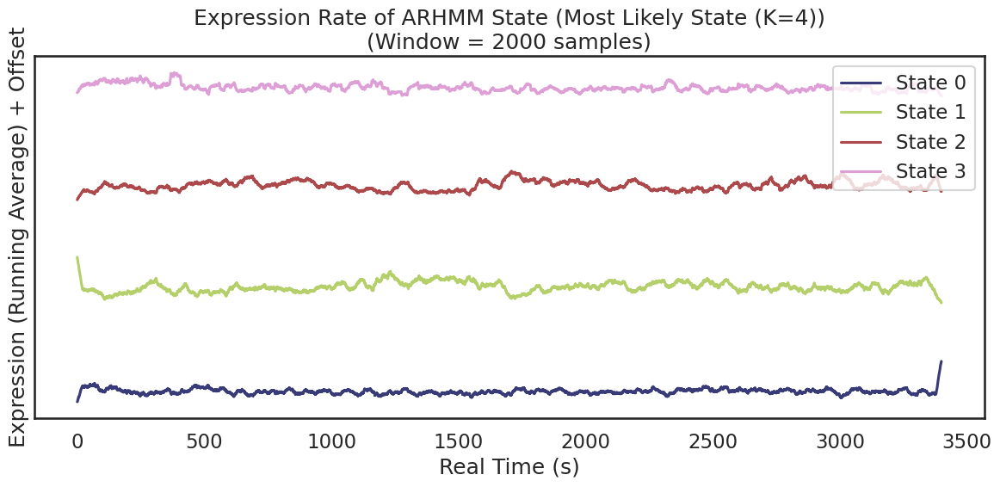

In [82]:
# ----- User Settings for Filtering and Plotting -----
use_time_range = False   # Set to True to filter by time for plotting.
use_index_range = True   # Set to True to filter by index for plotting.

# Time range settings (in seconds) for plotting:
plot_start_time = 10     # Adjust as needed.
plot_end_time   = 20     # Adjust as needed; can also be "end" for the last time point.

# Index range settings for plotting (if used):
plot_start_index = 0     # Adjust as needed.
plot_end_index = "end"   # "end" selects the last index.

# Plotting options:
vertical_offset = 1.2    # Vertical shift between curves.

# ----- Build the Plotting Mask (Time and/or Index) -----
# Build time mask:
if use_time_range:
    if isinstance(plot_end_time, str) and plot_end_time.lower() == "end":
        plot_end_time = time_all[-1]
    mask_time = (time_all >= plot_start_time) & (time_all <= plot_end_time)
else:
    mask_time = np.ones_like(time_all, dtype=bool)

# Build index mask:
if use_index_range:
    if plot_start_index is None:
        plot_start_index = 0
    if isinstance(plot_end_index, str) and plot_end_index.lower() == "end":
        plot_end_index = len(time_all) - 1
    mask_index = np.zeros_like(time_all, dtype=bool)
    mask_index[plot_start_index: plot_end_index + 1] = True
else:
    mask_index = np.ones_like(time_all, dtype=bool)

# Combine masks:
mask_plot = mask_time & mask_index
time_plot = time_all[mask_plot]

# ----- Plotting the Running Average Frequencies with Vertical Offsets -----
# Use 'tab20b' colormap.
cmap = cm.get_cmap('tab20b', len(unique_states))

plt.figure(figsize=(12, 6))
for idx, s in enumerate(unique_states):
    # Apply the plotting mask to the running average frequency computed on the full sequence.
    freq_masked = arhmm_state_expression_rate_df[s][mask_plot]
    shifted_freq = freq_masked + idx * vertical_offset
    plt.plot(time_plot, shifted_freq, label=f"State {s}", color=cmap(idx))

plt.xlabel("Real Time (s)")
plt.ylabel("Expression (Running Average) + Offset")
# remove y tick labels
plt.yticks([])
plt.title(f"Expression Rate of ARHMM State ({state_col})\n(Window = {window_size} samples)")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

### Fit HMM on ARHMM_expression traces

In [83]:
# Get the keys in sorted order.
# keys_ = sorted(state_freq_full.keys())
# # Stack the arrays corresponding to each key as columns.
# obs_array_ = np.column_stack([state_freq_full[k] for k in keys_]) # np.shape(obs_array) : (163192, 16). type(obs_array) : numpy.ndarray

obs_array_ = arhmm_state_expression_rate_df.to_numpy()  # or simply arhmm_state_expression_ave_df.values


N_iters = 100
num_hmm_onarhmm_states = 3
obs_dim_ = np.shape(obs_array_)[1]
# time_bins = len()

## testing the constrained transitions class
hmm = ssm.HMM(num_hmm_onarhmm_states, obs_dim_, observations="gaussian")




  0%|          | 0/100 [00:00<?, ?it/s]

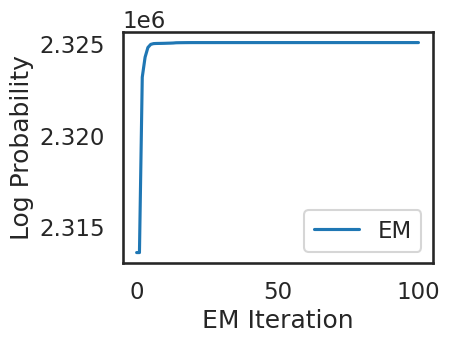

In [84]:
hmm_lls = hmm.fit(obs_array_, method="em", num_iters=N_iters) # , init_method="kmeans"

plt.figure(figsize=(4, 3))
plt.plot(hmm_lls, label="EM")
# plt.plot([0, N_iters], true_ll * np.ones(2), ':k', label="True")
plt.xlabel("EM Iteration")
plt.ylabel("Log Probability")
plt.legend(loc="lower right")
plt.show()

### Build hmm_on_arhmm_latent_df


In [85]:
most_likely_states_ = hmm.most_likely_states(obs_array_)
posterior_probs_ = hmm.expected_states(data=obs_array_)[0]  # Get the posterior probabilities
num_states_ = len(np.unique(most_likely_states_))  # Number of unique GLM states


In [86]:
import pandas as pd

# Get the number of states from posterior_probs.
num_states_ = posterior_probs_.shape[1]

# Create the column name for the most likely state based on num_states.
most_likely_col = f"Most Likely State (K={num_states_})"

# Check that the lengths match.
n_timepoints = len(arhmm_latents_df["RealTime (s)"])
if most_likely_states_.shape[0] != n_timepoints or posterior_probs_.shape[0] != n_timepoints:
    print("Error: Mismatch in the number of time points among the arrays/dataframe.")
else:
    # Create a new DataFrame
    hmm_on_arhmm_latents_df = pd.DataFrame({
        "RealTime (s)": arhmm_latents_df["RealTime (s)"].values,
        most_likely_col: most_likely_states_
    })

    # Add posterior probability columns for each state.
    for i in range(num_states_):
        hmm_on_arhmm_latents_df[f"Posterior_Prob_State_{i}"] = posterior_probs_[:, i]

# # Optionally, inspect the resulting DataFrame.
# print(hmm_on_ae_latent_df.head())
hmm_on_arhmm_latents_df[300:360]

,RealTime (s),Most Likely State (K=3),Posterior_Prob_State_0,Posterior_Prob_State_1,Posterior_Prob_State_2
300,6.250000,0,1.0,1.836110e-15,1.673636e-15
301,6.270833,0,1.0,1.962162e-15,1.802377e-15
302,6.291667,0,1.0,2.097103e-15,1.941101e-15
303,6.312500,0,1.0,2.241576e-15,2.090588e-15
304,6.333333,0,1.0,2.114752e-15,2.160486e-15
305,6.354167,0,1.0,1.994823e-15,2.233199e-15
306,6.375000,0,1.0,1.881431e-15,2.308855e-15
307,6.395833,0,1.0,1.774236e-15,2.387585e-15
308,6.416667,0,1.0,1.897141e-15,2.569910e-15
309,6.437500,0,1.0,2.028789e-15,2.766273e-15


### Plot HMM_on_arhmm_latents states and ARHMM_expression_rate traces overlaied
### Plot infered HMM_on_arhmm_latents and corresponding posterior probabbility

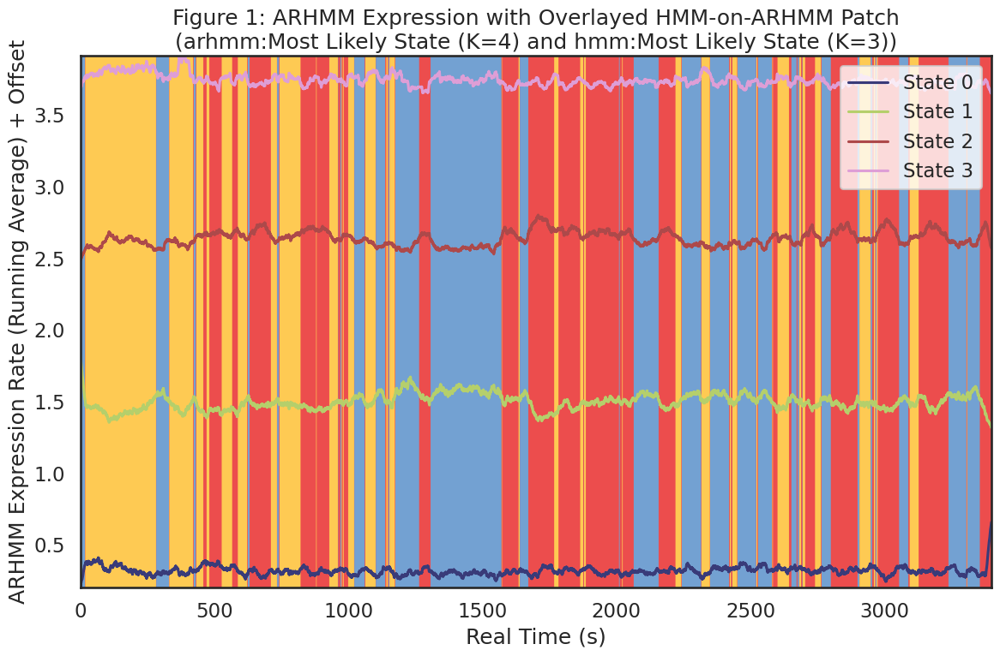

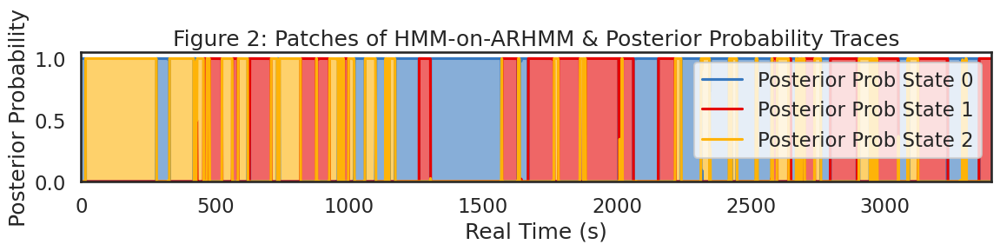

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from ssm.plots import gradient_cmap  # Ensure this is available
import pandas as pd

# ============================
# Common Filtering Settings
# ============================

# Filtering options (applied to both plots)
use_time_range = True    # Filter by time.
use_index_range = False  # Filter by index.

# Time range settings (in seconds) for plotting:
plot_start_time = 0      # Adjust as needed.
plot_end_time   = "end"     # Adjust as needed; can be "end" for the last time point.

# Index range settings for plotting (if used):
plot_start_index = 0     # Adjust as needed.
plot_end_index = "end"   # "end" selects the last index.

# ----------------------------
# Build the Common Mask
# ----------------------------
# Here we use the time vector from arhmm_latents_df (for ARHMM expression)
time_all = arhmm_latents_df["RealTime (s)"].values

if use_time_range:
    if isinstance(plot_end_time, str) and plot_end_time.lower() == "end":
        plot_end_time = time_all[-1]
    mask_time = (time_all >= plot_start_time) & (time_all <= plot_end_time)
else:
    mask_time = np.ones_like(time_all, dtype=bool)

if use_index_range:
    if plot_start_index is None:
        plot_start_index = 0
    if isinstance(plot_end_index, str) and plot_end_index.lower() == "end":
        plot_end_index = len(time_all) - 1
    mask_index = np.zeros_like(time_all, dtype=bool)
    mask_index[plot_start_index: plot_end_index + 1] = True
else:
    mask_index = np.ones_like(time_all, dtype=bool)

mask_plot = mask_time & mask_index
time_plot = time_all[mask_plot]

# ============================
# Figure 1: ARHMM Expression with HMM Patch Overlay
# ============================

# ----- ARHMM Expression Settings -----
# (These were computed earlier and stored in arhmm_state_expression_rate_df.)
# Assume arhmm_state_expression_rate_df is a DataFrame with columns corresponding to unique states.
freq_array = arhmm_state_expression_rate_df.to_numpy()  # shape: (n_timepoints, number_of_states)
freq_array_plot = freq_array[mask_plot, :]

# Determine overall y-axis range for expression traces (after vertical offsets)
vertical_offset = 1.2  # Vertical shift between curves
n_states_expr = freq_array_plot.shape[1]
y_min_expr = np.inf
y_max_expr = -np.inf
for idx in range(n_states_expr):
    trace = freq_array_plot[:, idx] + idx * vertical_offset
    y_min_expr = min(y_min_expr, np.min(trace))
    y_max_expr = max(y_max_expr, np.max(trace))

# ----- HMM Patch Settings for Figure 1 -----
# HMM patch will come from hmm_on_arhmm_latents_df.
# Specify the desired HMM patch K (this can be independent from the ARHMM expression K).
# K_hmm = num_hmm_onarhmm_states
hmm_state_col = f"Most Likely State (K={num_hmm_onarhmm_states})"
hmm_time_all = hmm_on_arhmm_latents_df["RealTime (s)"].values
hmm_states_all = hmm_on_arhmm_latents_df[hmm_state_col].values
# Assume the time alignment is the same; apply the same mask:
hmm_states_plot = hmm_states_all[mask_plot]

# Build a custom patch colormap using gradient_cmap.
# Define an XKCD palette for the HMM patch colors.
# For num_hmm_onarhmm_states=3, we need exactly 3 colors.
color_names = ["windows blue", "red", "amber"]#, "faded green", "dusty purple", "orange"]
colors_hmm = sns.xkcd_palette(color_names)  # This returns a list of 3 RGB tuples.
patch_cmap = gradient_cmap(colors_hmm)



# color_names = [
#     "windows blue",
#     "red",
#     "amber",
#     "faded green",
#     "dusty purple",
#     "orange",
#     "clay",
#     "pink",
#     "greyish",
#     "mint",
#     "light cyan",
#     "steel blue",
#     "forest green",
#     "pastel purple",
#     "salmon",
#     "dark brown",
#     "lavender",
#     "tan",
#     "maroon",
#     "turquoise",
#     "bright green",
#     "gold",
#     "sky blue"
#     ]

# colors_hmm = sns.xkcd_palette(color_names)  #????? bad naming
# cmap = gradient_cmap(colors_hmm)



# ----- Plot Figure 1 -----
plt.figure(figsize=(12, 8))

# Plot the HMM patch as a background.
plt.imshow(hmm_states_plot[None, :],
           aspect="auto",
           cmap=patch_cmap,
           vmin=0,
           vmax=len(np.unique(hmm_states_plot)) - 1,
           extent=[time_plot[0], time_plot[-1], y_min_expr, y_max_expr],
           alpha=0.7)

# Overlay the ARHMM expression traces with vertical offsets.
expr_cmap = cm.get_cmap('tab20b', n_states_expr)
for idx in range(n_states_expr):
    shifted_trace = freq_array_plot[:, idx] + idx * vertical_offset
    plt.plot(time_plot, shifted_trace, label=f"State {idx}", color=expr_cmap(idx))
    
plt.xlabel("Real Time (s)")
plt.ylabel("ARHMM Expression Rate (Running Average) + Offset")
if use_time_range:
    plt.xlim(plot_start_time, plot_end_time)
plt.title(f"Figure 1: ARHMM Expression with Overlayed HMM-on-ARHMM Patch\n(arhmm:{state_col} and hmm:{hmm_state_col})")
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()

# ============================
# Figure 2: Posterior Probability Overlay
# ============================

# ----- HMM Posterior Probability Settings -----
# Assume hmm_on_arhmm_latents_df contains columns for posterior probabilities:
posterior_cols = [col for col in hmm_on_arhmm_latents_df.columns if col.startswith("Posterior_Prob_State_")]
num_states_post = len(posterior_cols)  # Expected to be 3 for num_hmm_onarhmm_states=3.
posterior_data = np.column_stack([hmm_on_arhmm_latents_df[col].values for col in posterior_cols])
posterior_data_plot = posterior_data[mask_plot, :]

# For posterior probabilities, the y-axis is fixed:
y_min_post, y_max_post = 0, 1

# Use the same patch colormap as before.
# Normalize the color input to [0,1] for each state.
plt.figure(figsize=(12, 3))

# Plot the HMM patch as background.
plt.imshow(hmm_states_plot[None, :],
           aspect="auto",
           cmap=patch_cmap,
           vmin=0,
           vmax=num_states_post - 1,
           extent=[time_plot[0], time_plot[-1], y_min_post, y_max_post],
           alpha=0.6)

# Overlay the posterior probability traces.
for i in range(num_states_post):
    plt.plot(time_plot, posterior_data_plot[:, i],
             label=f"Posterior Prob State {i}",
             color=patch_cmap(i / (num_states_post - 1)))  # Normalize i to [0,1]
    
plt.xlabel("Real Time (s)")
plt.ylabel("Posterior Probability")
if use_time_range:
    plt.xlim(plot_start_time, plot_end_time)
plt.title("Figure 2: Patches of HMM-on-ARHMM & Posterior Probability Traces")
plt.legend(loc="upper right")
plt.ylim(0, 1.05)
plt.tight_layout()
plt.show()


In [47]:
bodypart

'ear'

## Align syllables to trial events


get the following files from  NWB capsul

1. "original_trials.csv"
2. "harp_video_timestamps_every_10_rows.csv"
3. "tot_num_original_video_frames.csv"
4. "df_events.csv"

### Build df_events_go - To complete

In [ ]:
import pandas as pd

# Load df_event
df_event_path = "/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/df_event.csv"
df_event = pd.read_csv(df_event_path)

# Ensure column names are clean
df_event.columns = df_event.columns.str.strip()

# Convert timestamps to numeric
df_event["timestamps"] = pd.to_numeric(df_event["timestamps"], errors="coerce")

# Compute timestamp_referenced (Shift to relative time based on session start)
session_start_time = df_event["timestamps"].min()  # Assuming first timestamp as reference
df_event["timestamp_referenced"] = df_event["timestamps"] - session_start_time

# change the timestampe key to harp_timestamp
df_event = df_event.rename(columns={"timestamps": "Harp_Timestamp"})

# Save the modified DataFrame
output_path = "/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" + bodypart + "/706893/2024-05-28/dfs/df_events.csv"
df_event.to_csv(output_path, index=False)

print(f"Updated file saved at: {output_path}")

In [ ]:
# import pandas as pd

# # Load the CSV file
# df_original = pd.read_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/original_trials.csv")

# # Create df_events with relevant columns
# df_events = pd.DataFrame({
#     "Harp_Timestamp": df_original["goCue_start_time"],
#     "event": "go_cue",  # Assign "go_cue" to all rows
#     "trial": range(1, len(df_original) + 1)  # Assign trial numbers sequentially
# })

# # Display the first few rows
# print(df_events.head(10))

# # Save the new dataframe to a CSV file if dfs folder
# df_events.to_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" +bodypart+ "/706893/2024-05-28/dfs/df_events.csv", index=False) # change df_events_go.csv to df_events.csv ?????


   Harp_Timestamp   event  trial
0    6.574707e+06  go_cue      1
1    6.574713e+06  go_cue      2
2    6.574748e+06  go_cue      3
3    6.574755e+06  go_cue      4
4    6.574762e+06  go_cue      5
5    6.574768e+06  go_cue      6
6    6.574775e+06  go_cue      7
7    6.574785e+06  go_cue      8
8    6.574794e+06  go_cue      9
9    6.574813e+06  go_cue     10


In [ ]:
# import pandas as pd

# # Load the CSV file
# df_original = pd.read_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/original_trials.csv")

# # Define event names and corresponding column names in df_original
# event_columns = {
#     "go_cue": "goCue_start_time",
#     "right_lick": "right_lick_time",
#     "left_lick": "left_lick_time",
#     "left_reward": "left_reward_delivery_time",
#     "right_reward": "right_reward_delivery_time"
# }

# # Create an empty list to store event data
# event_data = []

# # Loop through each event and extract relevant information
# for event_name, column_name in event_columns.items():
#     temp_df = pd.DataFrame({
#         "Harp_Timestamp": df_original[column_name],
#         "event": event_name,
#         "trial": range(1, len(df_original) + 1)  # Assign trial numbers sequentially
#     })
#     event_data.append(temp_df)

# # Combine all event data into a single dataframe
# df_events = pd.concat(event_data, ignore_index=True)

# # Remove rows with NaN timestamps (in case some events did not occur in a trial)
# df_events = df_events.dropna()

# # Sort by Harp_Timestamp
# df_events = df_events.sort_values(by="Harp_Timestamp").reset_index(drop=True)

# # Display the first few rows
# print(df_events.head(10))

# # Save the dataframe to a CSV file
# output_path = f"/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_{bodypart}/706893/2024-05-28/dfs/df_events.csv"
# df_events.to_csv(output_path, index=False)


In [3]:
print(df_events.columns)


Index(['Harp_Timestamp', 'event', 'trial'], dtype='object')


In [55]:
int(np.floor(window_size/48))

83

/tmp/ipykernel_278145/2097941164.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lick_events["time_bin"] = pd.cut(lick_events["timestamps"], bins=bins, right=False)


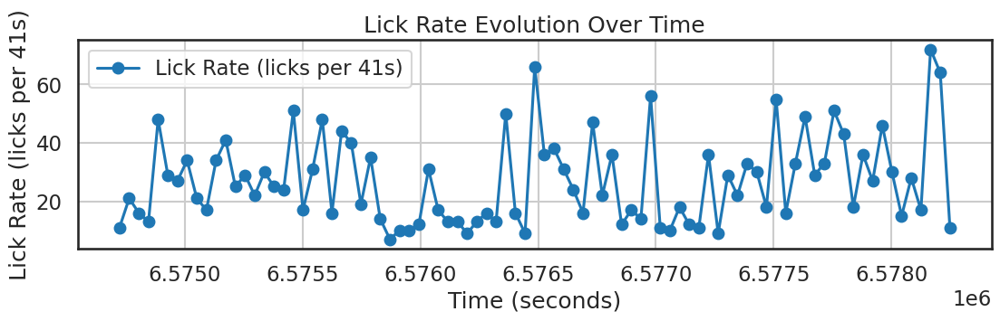

In [88]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
df_events = pd.read_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/df_event.csv")

# df_events = pd.DataFrame(data)

# Filter only lick events
lick_events = df_events[df_events["event"].isin(["right_lick_time", "left_lick_time"])]

# Define time bins for computing lick rate
time_bin_size = int(np.floor(window_size/48))  # 10 seconds binning. in unit of second
min_time, max_time = lick_events["timestamps"].min(), lick_events["timestamps"].max()
bins = list(range(int(min_time), int(max_time) + time_bin_size, time_bin_size))

# Compute lick counts in each time bin
lick_events["time_bin"] = pd.cut(lick_events["timestamps"], bins=bins, right=False)
lick_rate = lick_events.groupby("time_bin")["timestamps"].count()

# Convert bin intervals to numeric values (midpoints)
bin_midpoints = [(interval.left + interval.right) / 2 for interval in lick_rate.index]

# Plot lick rate over time
plt.figure(figsize=(13, 3))
plt.plot(bin_midpoints, lick_rate, marker='o', linestyle='-', label=f"Lick Rate (licks per {time_bin_size}s)")

# Labels and formatting
plt.xlabel("Time (seconds)")
plt.ylabel(f"Lick Rate (licks per {time_bin_size}s)")
plt.title("Lick Rate Evolution Over Time")
plt.legend()
plt.grid(True)

# Show plot
plt.show()


In [18]:
len(lick_rate)

1015

### Pearson Correlation between events and ARHMM states ????


Pearson Correlation (Lick Rate vs. ARHMM States)
State 1: r = -0.019, p = 0.561
State 0: r = -0.004, p = 0.898
State 2: r = 0.022, p = 0.505
State 3: r = 0.004, p = 0.897


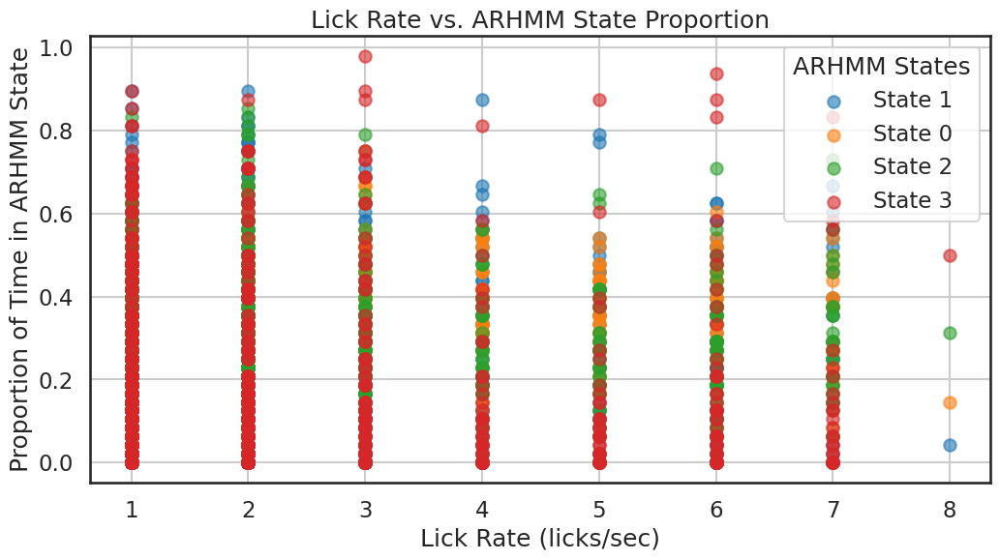

In [90]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import pearsonr

# ------------------------------
# Load Data
# ------------------------------
df_events_path = "/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" + bodypart + "/706893/2024-05-28/dfs/df_events.csv"
arhmm_latents_path = "/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" + bodypart + "/706893/2024-05-28/dfs/arhmm_latents_df.csv"

df_events = pd.read_csv(df_events_path)
arhmm_latents_df = pd.read_csv(arhmm_latents_path)

# Clean column names
df_events.columns = df_events.columns.str.strip()
arhmm_latents_df.columns = arhmm_latents_df.columns.str.strip()

# Convert timestamps to numeric
df_events["timestamp_referenced"] = pd.to_numeric(df_events["timestamp_referenced"], errors="coerce")
arhmm_latents_df["RealTime (s)"] = pd.to_numeric(arhmm_latents_df["RealTime (s)"], errors="coerce")

# ------------------------------
# Define Time Binning
# ------------------------------
bin_size = 1  # 1-second bins
df_events["time_bin"] = ((df_events["timestamp_referenced"] // bin_size) * bin_size).astype(int)
arhmm_latents_df["time_bin"] = ((arhmm_latents_df["RealTime (s)"] // bin_size) * bin_size).astype(int)

# ------------------------------
# Compute Lick Rate Per Time Bin
# ------------------------------
lick_rate = df_events[df_events["event"].isin(["right_lick_time", "left_lick_time"])]
lick_rate = lick_rate.groupby("time_bin")["Harp_Timestamp"].count().reset_index(name="lick_rate")

# ------------------------------
# Compute Proportion of Each ARHMM State Per Time Bin
# ------------------------------
arhmm_states = arhmm_latents_df["Most Likely State (K=4)"].unique()
state_proportions = arhmm_latents_df.groupby(["time_bin", "Most Likely State (K=4)"]).size().unstack(fill_value=0)
state_proportions = state_proportions.div(state_proportions.sum(axis=1), axis=0).reset_index()

# Merge lick rate with ARHMM state proportions
merged_df = pd.merge(lick_rate, state_proportions, on="time_bin", how="inner")

# ------------------------------
# Compute Pearson Correlation for Each State
# ------------------------------
correlations = {}
for state in arhmm_states:
    if state in merged_df.columns:
        corr, p_value = pearsonr(merged_df["lick_rate"], merged_df[state])
        correlations[state] = (corr, p_value)

# ------------------------------
# Print Results
# ------------------------------
print("\nPearson Correlation (Lick Rate vs. ARHMM States)")
for state, (corr, p_value) in correlations.items():
    print(f"State {state}: r = {corr:.3f}, p = {p_value:.3f}")

# ------------------------------
# Plot Correlations
# ------------------------------
plt.figure(figsize=(12, 6))
for state in arhmm_states:
    if state in merged_df.columns:
        plt.scatter(merged_df["lick_rate"], merged_df[state], alpha=0.6, label=f"State {state}")

plt.xlabel("Lick Rate (licks/sec)")
plt.ylabel("Proportion of Time in ARHMM State")
plt.title("Lick Rate vs. ARHMM State Proportion")
plt.legend(title="ARHMM States")
plt.grid(True)
plt.show()


### Spearmann Ranked Correlation between events and ARHMM states ????


Spearman Correlation (Lick Rate vs. ARHMM States)
State 1: r = -0.015, p = 0.650
State 0: r = 0.005, p = 0.876
State 2: r = 0.005, p = 0.878
State 3: r = -0.012, p = 0.705


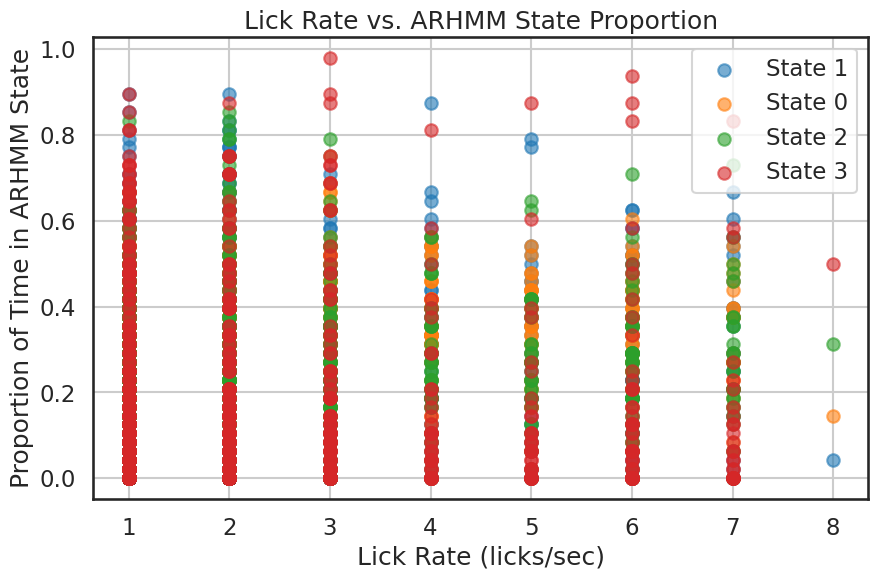

In [57]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import spearmanr

# Load df_events (Lick Rate)
df_events_path = "/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" + bodypart + "/706893/2024-05-28/dfs/df_events.csv"
df_events = pd.read_csv(df_events_path)

# Load ARHMM latent states
arhmm_latents_path = "/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" + bodypart + "/706893/2024-05-28/dfs/arhmm_latents_df.csv"
arhmm_latents_df = pd.read_csv(arhmm_latents_path)

# Clean column names
df_events.columns = df_events.columns.str.strip()
arhmm_latents_df.columns = arhmm_latents_df.columns.str.strip()

# Convert timestamps to numeric
df_events["timestamp_referenced"] = pd.to_numeric(df_events["timestamp_referenced"], errors="coerce")
arhmm_latents_df["RealTime (s)"] = pd.to_numeric(arhmm_latents_df["RealTime (s)"], errors="coerce")

# Define time bin size (adjust as needed)
bin_size = 1  # 1-second bins

# Bin timestamps
df_events["time_bin"] = ((df_events["timestamp_referenced"] // bin_size) * bin_size).astype(int)
arhmm_latents_df["time_bin"] = ((arhmm_latents_df["RealTime (s)"] // bin_size) * bin_size).astype(int)

# Compute lick rate per bin
lick_rate = df_events[df_events["event"].isin(["right_lick_time", "left_lick_time"])].groupby("time_bin")["Harp_Timestamp"].count().reset_index(name="lick_rate")

# Compute proportion of each ARHMM state per time bin
arhmm_states = arhmm_latents_df["Most Likely State (K=4)"].unique()
state_proportions = arhmm_latents_df.groupby(["time_bin", "Most Likely State (K=4)"]).size().unstack(fill_value=0)
state_proportions = state_proportions.div(state_proportions.sum(axis=1), axis=0).reset_index()

# Merge lick rate with ARHMM states
merged_df = pd.merge(lick_rate, state_proportions, on="time_bin", how="inner")

# Compute correlation for each ARHMM state
correlations = {}
for state in arhmm_states:
    if state in merged_df.columns:
        corr, p_value = spearmanr(merged_df["lick_rate"], merged_df[state])
        correlations[state] = (corr, p_value)

# Print correlation results
print("\nSpearman Correlation (Lick Rate vs. ARHMM States)")
for state, (corr, p_value) in correlations.items():
    print(f"State {state}: r = {corr:.3f}, p = {p_value:.3f}")

# Plot correlation between lick rate and each state
plt.figure(figsize=(10, 6))
for state in arhmm_states:
    if state in merged_df.columns:
        plt.scatter(merged_df["lick_rate"], merged_df[state], alpha=0.6, label=f"State {state}")

plt.xlabel("Lick Rate (licks/sec)")
plt.ylabel("Proportion of Time in ARHMM State")
plt.title("Lick Rate vs. ARHMM State Proportion")
plt.legend()
plt.grid(True)
plt.show()


### Build df_original_

In [170]:
import pandas as pd

# Load the CSV file
df_original = pd.read_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/original_trials.csv")

df_original.keys()

# create df_original_ by adding the Trial column
df_original_ = df_original.copy()
# # remove nan rows
# df_original_ = df_original_.dropna(subset=["start_time"])
df_original_['Trial'] = range(1, len(df_original_) + 1)  # Assign trial numbers sequentially
# Display the first few rows
print(df_original_.head(10))
# Save the new dataframe to a CSV file
df_original_.to_csv("/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_" +bodypart+ "/706893/2024-05-28/dfs/df_original.csv", index=False) # change df_events_go.csv to df_events.csv ?????




     start_time     stop_time  animal_response  rewarded_historyL  \
0  6.574702e+06  6.574709e+06              1.0              False   
1  6.574709e+06  6.574716e+06              1.0              False   
2  6.574716e+06  6.574750e+06              0.0               True   
3  6.574750e+06  6.574758e+06              0.0              False   
4  6.574758e+06  6.574764e+06              0.0              False   
5  6.574764e+06  6.574771e+06              0.0              False   
6  6.574771e+06  6.574777e+06              0.0              False   
7  6.574777e+06  6.574788e+06              0.0              False   
8  6.574788e+06  6.574796e+06              0.0              False   
9  6.574796e+06  6.574816e+06              0.0              False   

   rewarded_historyR  delay_start_time  goCue_start_time  reward_outcome_time  \
0              False      6.574705e+06      6.574707e+06         6.574707e+06   
1              False      6.574711e+06      6.574713e+06         6.574714e+06 

### Get the number of frames in the selected_segments

In [32]:
import h5py

def get_frame_counts(hdf5_path, selected_trials=None):
    """
    Reads an HDF5 file and extracts the number of frames for each selected trial.

    Parameters:
        hdf5_path (str): Path to the HDF5 file.
        selected_trials (list, optional): List of trial indices to include. If None, all trials will be used.

    Returns:
        dict: A dictionary with trial keys and their corresponding frame counts.
        int: The total number of frames across the selected trials.
        int: The total number of trials in the HDF5 file.
    """
    n_frames_dict = {}

    with h5py.File(hdf5_path, 'r') as f:
        images_group = f['images']
        total_num_trials = len(images_group.keys())  # Get the total number of trials

        # If no specific trials are selected, use all available trials
        if selected_trials is None:
            selected_trials = list(range(total_num_trials))

        # Loop over the selected trial indices
        for idx in selected_trials:
            trial_key = f"trial_{idx:04d}"
            if trial_key in images_group:
                n_frames = images_group[trial_key].shape[0]  # Extract number of frames
                n_frames_dict[trial_key] = n_frames

    # Compute total frames across selected trials
    total_num_frames = sum(n_frames_dict.values())

    return n_frames_dict, total_num_frames, total_num_trials



In [33]:
import numpy as np

# Example usage
hdf5_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/data.hdf5'


# Exclude frames from the beginning of the list
selected_segments = np.arange(178)

n_frames_dict, total_num_frames, total_num_frames_in_segments = get_frame_counts(hdf5_path, selected_segments)

# Print results
print("Total number of trials in the HDF5 file:", total_num_frames_in_segments)
print("Total number of frames for selected trials:", total_num_frames)
print("Frame counts per trial:", n_frames_dict)

Total number of trials in the HDF5 file: 178
Total number of frames for selected trials: 170883
Frame counts per trial: {'trial_0000': 1000, 'trial_0001': 1071, 'trial_0002': 1000, 'trial_0003': 1000, 'trial_0004': 889, 'trial_0005': 1000, 'trial_0006': 1000, 'trial_0007': 750, 'trial_0008': 1119, 'trial_0009': 978, 'trial_0010': 890, 'trial_0011': 1000, 'trial_0012': 1000, 'trial_0013': 973, 'trial_0014': 750, 'trial_0015': 997, 'trial_0016': 1000, 'trial_0017': 971, 'trial_0018': 1000, 'trial_0019': 986, 'trial_0020': 1000, 'trial_0021': 750, 'trial_0022': 1143, 'trial_0023': 870, 'trial_0024': 882, 'trial_0025': 979, 'trial_0026': 933, 'trial_0027': 1188, 'trial_0028': 968, 'trial_0029': 750, 'trial_0030': 1000, 'trial_0031': 975, 'trial_0032': 1000, 'trial_0033': 1000, 'trial_0034': 1000, 'trial_0035': 750, 'trial_0036': 1000, 'trial_0037': 972, 'trial_0038': 1000, 'trial_0039': 1000, 'trial_0040': 971, 'trial_0041': 1000, 'trial_0042': 1000, 'trial_0043': 750, 'trial_0044': 1000, 

### Get num_initial_frames_to_exclude and num_late_frames_to_exclude 

In [34]:
import numpy as np
import pandas as pd

# Example usage
hdf5_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/data/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/data.hdf5'
set_harp_ts = True  

ae_latent_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/dfs/ae_latents_df.csv'
ae_latents_df = pd.read_csv(ae_latent_path)

# Initialize exclusion counters
total_num_initial_frames_to_exclude, total_num_late_frames_to_exclude = 0, 0

if set_harp_ts:
    # Exclude frames from the beginning of the list
    selected_segments = np.arange(ae_latents_df['seg_index'].iloc[0])  

    n_frames_dict, total_num_initial_frames_to_exclude, total_num_frames_in_segments = get_frame_counts(hdf5_path, selected_segments)

    # Print results
    print("Total number of segments in the HDF5 file:", total_num_frames_in_segments)
    print("Total number of excluded frames for EARLY segments:", total_num_initial_frames_to_exclude)
    print("Frame counts per segments:", n_frames_dict)


    # Exclude frames from the end of the list
    selected_segments = np.arange(ae_latents_df['seg_index'].iloc[-1]+1, total_num_frames_in_segments)  

    n_frames_dict_, total_num_late_frames_to_exclude, _ = get_frame_counts(hdf5_path, selected_segments)

    # Print results
    print('')
    print("Total number of excluded frames for LATE segments:", total_num_late_frames_to_exclude)
    print("Frame counts per segments:", n_frames_dict_)


Total number of segments in the HDF5 file: 178
Total number of excluded frames for EARLY segments: 4071
Frame counts per segments: {'trial_0000': 1000, 'trial_0001': 1071, 'trial_0002': 1000, 'trial_0003': 1000}

Total number of excluded frames for LATE segments: 3667
Frame counts per segments: {'trial_0174': 994, 'trial_0175': 953, 'trial_0176': 1000, 'trial_0177': 720}


<!-- ### Add Harp timestamps to arhmm_latents_df -->

In [ ]:
# moved to above 
# # import pandas as pd

# # Load the harp video timestamps
# harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_video_timestamps_every_10_rows.csv'
# harp_ts_df = pd.read_csv(harp_timestamps_path)

# # Load the arhmm_latents_df
# arhmm_latents_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' +bodypart+ '/706893/2024-05-28/dfs/arhmm_latents_df.csv'
# arhmm_latents_df = pd.read_csv(arhmm_latents_path)

# # Ensure both DataFrames have the same length .....????
# # assert len(arhmm_latents_df) == len(harp_ts_df) - total_num_initial_frames_to_exclude - total_num_late_frames_to_exclude

# # Remove the first 'total_num_frames_in_segments' rows
# harp_ts_df_ = harp_ts_df.iloc[total_num_initial_frames_to_exclude:total_num_frames - total_num_late_frames_to_exclude-1].reset_index(drop=True)

# # Add a new column for the remaining harp timestamps
# arhmm_latents_df["Harp_Timestamp"] = harp_ts_df_["Selected_Values"]

# # Save the updated dataframe
# arhmm_latents_df.to_csv('/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' +bodypart+ '/706893/2024-05-28/dfs/arhmm_latents_df_.csv', index=False)

# # Display the first few rows
# print(arhmm_latents_df.head())


   Timestamp  RealTime (s)  Most Likely State (K=2)  Most Likely State (K=4)  \
0          0      0.000000                        0                        1   
1          1      0.020833                        0                        0   
2          2      0.041667                        0                        1   
3          3      0.062500                        0                        1   
4          4      0.083333                        0                        1   

   Most Likely State (K=8)  Most Likely State (K=12)  \
0                        2                         4   
1                        0                         0   
2                        0                         0   
3                        0                         0   
4                        0                         0   

   Most Likely State (K=16)  Most Likely State (K=20)  \
0                         4                         3   
1                         2                         3   
2          

In [ ]:
# len(arhmm_latents_df)

163145

In [ ]:
# len(harp_ts_df)

170883

In [ ]:
# # Load the harp video timestamps
# harp_timestamps_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/harp_video_timestamps_every_10_rows.csv'
# harp_ts_df = pd.read_csv(harp_timestamps_path)

# assert len(arhmm_latents_df) -(len(harp_ts_df) - total_num_initial_frames_to_exclude - total_num_late_frames_to_exclude) == 0

### Get first and last trial range (based on trained video) to plot

In [178]:
import pandas as pd

# Define file paths
arhmm_latents_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/dfs/arhmm_latents_df_.csv'
df_original_path = '/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_' + bodypart + '/706893/2024-05-28/dfs/df_original.csv'

# Load the CSV files
arhmm_latents_df = pd.read_csv(arhmm_latents_path)
df_original = pd.read_csv(df_original_path)

# Get the first Harp_Timestamp from arhmm_latents_df
first_harp_timestamp = arhmm_latents_df["Harp_Timestamp"].iloc[0]

# Find the closest next trial timestamp in df_original
first_analyzed_trial_idx = (df_original["start_time"] > first_harp_timestamp).idxmax()  # Get index of the first trial after first_harp_timestamp in analyzed video
first_analyzed_trial_event_timestamp = df_original.loc[first_analyzed_trial_idx, "start_time"]
first_analyzed_trial_number = df_original.loc[first_analyzed_trial_idx, "Trial"]

# Print results
print(f"First Harp_Timestamp from arhmm_latents_df: {first_harp_timestamp}")
print(f"Closest next trial Harp_Timestamp (start_time) from df_original: {first_analyzed_trial_event_timestamp} (Trial {first_analyzed_trial_number})")
print('')

# Get the last non-NaN Harp_Timestamp from arhmm_latents_df
last_harp_timestamp = arhmm_latents_df["Harp_Timestamp"].dropna().iloc[-1]

# # Find the closest prior trial timestamp in df_original
# Drop NaNs from the Harp_Timestamp column
df_original_clean = df_original.dropna(subset=["stop_time"])

# Find the index of the last trial before last_harp_timestamp
last_analyzed_trial_idx = df_original_clean[df_original_clean["stop_time"] < last_harp_timestamp].index[-1]
last_analyzed_trial_event_timestamp = df_original.loc[last_analyzed_trial_idx, "stop_time"]

# Get the trial number of the closest prior trial
last_analyzed_trial_number = df_original_clean.loc[last_analyzed_trial_idx, "Trial"]


# Print results
print(f"Last Harp_Timestamp from arhmm_latents_df: {last_harp_timestamp}")
print(f"Closest prior trial Harp_Timestamp from df_events: {last_analyzed_trial_event_timestamp} (Trial {last_analyzed_trial_number})")


First Harp_Timestamp from arhmm_latents_df: 6574786.711488
Closest next trial Harp_Timestamp (start_time) from df_original: 6574787.602496 (Trial 9)

Last Harp_Timestamp from arhmm_latents_df: 6578185.45952
Closest prior trial Harp_Timestamp from df_events: 6578181.317504 (Trial 273)


## Plot the arhmm_state occupancy aligned to Go-Cue events

### Get trial index coressponding to time point from the start of video (included segments)

In [179]:
def get_trial_of_time(t_sec, df_original, first_harp_timestamp):
    """
    Get the trial number corresponding to a given time.
    
    Parameters:
        time (float): The time to check.
        df_original (pd.DataFrame): DataFrame containing trial information.
        
    Returns:
        int: The trial number corresponding to the time.
    """
    # Find the index of the first trial where start_time is greater than the given time
    t = t_sec + first_harp_timestamp
    trial_idx = (df_original["start_time"] > t).idxmax() - 1
    return df_original.loc[trial_idx, "Trial"]

# Example usage
time = 1350  # Replace with the desired time
trial_number = get_trial_of_time(time, df_original, first_harp_timestamp) 
print(f"The trial number corresponding to time {time} is: {trial_number}")

The trial number corresponding to time 1350 is: 113


In [180]:
df_original.keys()

Index(['start_time', 'stop_time', 'animal_response', 'rewarded_historyL',
       'rewarded_historyR', 'delay_start_time', 'goCue_start_time',
       'reward_outcome_time', 'bait_left', 'bait_right',
       'base_reward_probability_sum', 'reward_probabilityL',
       'reward_probabilityR', 'reward_random_number_left',
       'reward_random_number_right', 'left_valve_open_time',
       'right_valve_open_time', 'block_beta', 'block_min', 'block_max',
       'min_reward_each_block', 'delay_beta', 'delay_min', 'delay_max',
       'delay_duration', 'ITI_beta', 'ITI_min', 'ITI_max', 'ITI_duration',
       'response_duration', 'reward_consumption_duration', 'reward_delay',
       'auto_waterL', 'auto_waterR', 'laser_on_trial', 'laser_wavelength',
       'laser_location', 'laser_1_power', 'laser_2_power',
       'laser_on_probability', 'laser_duration', 'laser_condition',
       'laser_condition_probability', 'laser_start', 'laser_start_offset',
       'laser_end', 'laser_end_offset', 'laser_pr

### Events order: 
'start_time' ->    'delay_start_time' ->   'goCue_start_time' ->   ('reward_outcome_time')    -> 'stop_time'

In [148]:
bodypart

'nose'

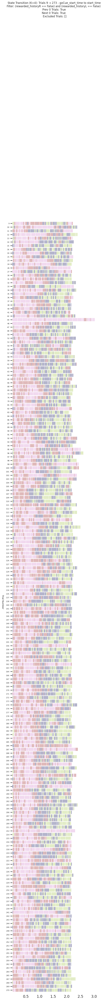

In [185]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm

# User-defined parameters
K = num_arhmm_states  # Choose "Most Likely State (K=X)"
start_trial = first_analyzed_trial_number  # First trial to plot
end_trial = last_analyzed_trial_number  # Last trial to plot

time_bin_width = 0.02  # Fixed width for time bins

# Define which events to use as start and end of a trial
start_event = "goCue_start_time"  # Choose an event column from df_original
end_event = "start_time"  # Choose an event column (same or different from start_event)

# Choose alignment mode: "start" or "end"
align_to = "start"  # Change to "start" or "end" to choose alignment

# Choose time window mode
N_seconds_mode = "start_to_end"  # Options: ["start_to_end", "start_to_N_after_start", "N_before_end_to_end"]
N_seconds = 2  # Amount of time in seconds

# Define the condition for filtering the **current trial**
current_condition = "(rewarded_historyR == False) and (rewarded_historyL == False)"# "(animal_response == 0)"  # Example condition

# Define the number of **previous** trials to check for conditions
num_prev_trials = 0  # Example: 1 means the last trial, 2 means one and two trials ago

# Define the number of **future** trials to check for conditions
num_future_trials = 0  # Example: 1 means the next trial, 2 means one and two trials ahead

# Specify trials to exclude (can be empty)
excluded_trials = []  # Example: np.arange(15, 20) or []

# Define file paths
# bodypart = "nose"
arhmm_latents_path = f'/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_{bodypart}/706893/2024-05-28/dfs/arhmm_latents_df_.csv'
df_original_path = f'/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/results/xinxin/coupled-baiting_{bodypart}/706893/2024-05-28/dfs/df_original.csv'

# Load the CSV files
arhmm_latents_df = pd.read_csv(arhmm_latents_path)
df_original = pd.read_csv(df_original_path)

# Construct the correct column name for Most Likely State (K=X)
state_column = f"Most Likely State (K={K})"

# ✅ First, filter trials based on range (start_trial to end_trial)
df_selected_range = df_original.query(f"Trial >= {start_trial} and Trial <= {end_trial}").copy()

# ✅ Create condition strings for **previous and future trials**
prev_conditions = " & ".join(
    [f"(rewarded_historyR.shift({i+1}) == False) and (rewarded_historyL.shift({i+1}) == False)" for i in range(num_prev_trials)]
) if num_prev_trials > 0 else "True"

future_conditions = " & ".join(
    [f"(rewarded_historyR.shift(-{i+1}) == False) and (rewarded_historyL.shift(-{i+1}) == False)" for i in range(num_future_trials)]
) if num_future_trials > 0 else "True"

# ✅ Apply the **current, previous, and future trial conditions**
filter_query = f"{current_condition} and {prev_conditions} and {future_conditions}"
filtered_trials_df = df_selected_range.query(filter_query)

# ✅ Remove excluded trials **only from visualization**, but keep them for defining end times
filtered_trials_df = filtered_trials_df[~filtered_trials_df["Trial"].isin(excluded_trials)]

# ✅ Ensure at least some trials remain after filtering
if filtered_trials_df.empty:
    raise ValueError("No trials match the given condition within the selected range after exclusions.")

# ✅ Extract the **start** timestamps for each **included** trial
trial_starts = {
    trial: df_original.loc[df_original["Trial"] == trial, start_event].values[0]
    for trial in filtered_trials_df["Trial"]
}

trial_ends = {}

# ✅ Assign end timestamps correctly
for trial in filtered_trials_df["Trial"]:
    current_start = trial_starts[trial]

    # ✅ Get the next trial **chronologically**, even if it's excluded
    next_trial = df_selected_range.loc[df_selected_range["Trial"] > trial, "Trial"].min()

    current_end = df_selected_range.loc[df_selected_range["Trial"] == trial, end_event].values
    current_end = current_end[0] if len(current_end) > 0 else None  # Avoids empty array errors

    # ✅ If start_event occurs **after** end_event in the same trial, use the next trial’s end_event
    if current_end is not None and current_start > current_end:
        if not pd.isna(next_trial):
            next_trial_end = df_selected_range.loc[df_selected_range["Trial"] == next_trial, end_event].values
            trial_ends[trial] = next_trial_end[0] if len(next_trial_end) > 0 else current_start
        else:
            trial_ends[trial] = current_start  # Fallback to trial start if no next trial exists
    else:
        trial_ends[trial] = current_end

# ✅ Extract data for each trial
trial_data = {}
max_time = 0  # Track max duration across all trials for consistent x-axis scaling
for trial in filtered_trials_df["Trial"]:
    trial_start = trial_starts[trial]
    trial_end = trial_ends[trial]

    # ✅ Adjust timestamps based on N_seconds_mode
    if N_seconds_mode == "start_to_end":
        time_window_start = trial_start
        time_window_end = trial_end
    elif N_seconds_mode == "start_to_N_after_start":
        time_window_start = trial_start
        time_window_end = trial_start + N_seconds
    elif N_seconds_mode == "N_before_end_to_end":
        time_window_start = trial_end - N_seconds
        time_window_end = trial_end
    else:
        raise ValueError(f"Invalid N_seconds_mode: {N_seconds_mode}")

    # Select state data within adjusted timestamps
    selected_data = arhmm_latents_df.query(f"{time_window_start} <= Harp_Timestamp < {time_window_end}").copy()
    
    if not selected_data.empty:
        if align_to == "start":
            selected_data["Aligned_Timestamp"] = selected_data["Harp_Timestamp"] - trial_start
        else:  # align_to == "end"
            selected_data["Aligned_Timestamp"] = selected_data["Harp_Timestamp"] - trial_end
        trial_data[trial] = selected_data
        max_time = max(max_time, abs(selected_data["Aligned_Timestamp"]).max())  # Update max time for x-axis

# ✅ Get unique states and assign colors
all_states = sorted(pd.concat(trial_data.values())[state_column].unique())
cmap = cm.get_cmap('tab20b', len(all_states))
state_to_color = {state: cmap(i / max(len(all_states) - 1, 1)) for i, state in enumerate(all_states)}

# ✅ Plot settings
num_trials = len(trial_data)
fig, axes = plt.subplots(nrows=num_trials, figsize=(7, num_trials * 0.3), sharex=True, gridspec_kw={'hspace': 0.0})

# ✅ Plot each trial
for i, (trial, data) in enumerate(trial_data.items()):
    ax = axes[i]
    for spine in ax.spines.values():
        spine.set_visible(False)
    ax.yaxis.set_label_position("right" if align_to == "end" else "left")
    ax.yaxis.tick_right() if align_to == "end" else ax.yaxis.tick_left()
    ax.set_yticks([trial])
    ax.set_yticklabels([trial], fontsize=8)

    # ✅ Plot bars
    for _, row in data.iterrows():
        ax.barh(trial, width=time_bin_width, left=row["Aligned_Timestamp"], color=state_to_color[row[state_column]], alpha=0.8)

# ✅ Formatting
fig.suptitle(
    f"State Transition (K={K}): Trials {start_trial} → {end_trial} - {start_event} to {end_event}\n"
    f"Filter: {current_condition} \n Prev {num_prev_trials} Trials: {prev_conditions} \n"
    f"Next {num_future_trials} Trials: {future_conditions} \n Excluded Trials: {excluded_trials}",
    fontsize=12, 
    y=1.1 
    )
fig.text(0.96 if align_to == "end" else 0.04, 0.5, "Trial Number", va="center", ha="center", rotation=270, fontsize=10)

plt.show()


In [186]:
first_analyzed_trial_number

9

### Get the number of frames in the original video

In [187]:
import pandas as pd

# Define the file path
file_path = "/local1/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/tot_num_original_video_frames.csv"

# Read the CSV file into a DataFrame
tot_num_original_video_frame = pd.read_csv(file_path).iloc[0,0]

tot_num_original_video_frame

1708821

# Code unill here is confirmed 

### Pick the video timestamp alignment method

In [188]:
if tot_num_original_video_frame == total_num_frames_in_segments:
    print("The total number of frames in the HDF5 file matches the expected number of frames in downsized viseo. Using HARP_VIDEO_TIMESTAMPS_EVERY_10_ROWS.CSV is recomended.")
else:
    print("The total number of frames in the HDF5 file does NOT match the expected number of frames in downsized video. Extracting timescale from FRAME_METADATA.JSON is recomended.")

The total number of frames in the HDF5 file does NOT match the expected number of frames in downsized video. Extracting timescale from FRAME_METADATA.JSON is recomended.


In [126]:
# Read df_events
csv_file = '/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/df_events.csv'
trial_events_df = pd.read_csv(csv_file)

# Read df_licks
csv_file = '/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/df_licks.csv'
licks_df = pd.read_csv(csv_file)

# Read df_licks
csv_file = '/home/faeze.aminmansoor/video-analysis/scratch/706893_2024-05-28_15-15-38/nwb/original_trials.csv'
# Read the CSV file into a DataFramde
original_trials_df = pd.read_csv(csv_file)

harp_video_start = 6574701.902624
harp_trial_start = 6574702.19648


In [127]:
arhmm_latents_df

,Timestamp,RealTime (s),Most Likely State (K=2),Most Likely State (K=4),Most Likely State (K=8),Most Likely State (K=12),Most Likely State (K=16),Most Likely State (K=20),Harp_Timestamp
0,0,0.000000,0,0,2,6,6,4,6.574785e+06
1,1,0.020833,0,0,2,6,6,4,6.574785e+06
2,2,0.041667,1,1,6,4,5,13,6.574785e+06
3,3,0.062500,1,1,6,4,5,13,6.574785e+06
4,4,0.083333,1,1,6,3,5,7,6.574785e+06
...,...,...,...,...,...,...,...,...,...
163187,163187,3399.729167,0,3,3,2,2,1,6.578185e+06
163188,163188,3399.750000,0,3,3,2,2,1,6.578185e+06
163189,163189,3399.770833,0,3,3,8,8,6,6.578185e+06
163190,163190,3399.791667,0,3,3,8,8,6,6.578185e+06


In [128]:
print(trial_events_df['event'].unique())
trial_events_df#[:60]

['right_lick_time' 'goCue_start_time' 'left_lick_time'
 'left_reward_delivery_time' 'right_reward_delivery_time']


,timestamps,data,event,trial
0,0.082592,1.0,right_lick_time,0
1,4.521920,NaN,goCue_start_time,0
2,4.750304,1.0,right_lick_time,0
3,4.940448,1.0,right_lick_time,0
4,5.114080,1.0,right_lick_time,0
...,...,...,...,...
2680,3537.828096,1.0,right_lick_time,276
2681,3546.312928,1.0,right_lick_time,277
2682,3549.716352,1.0,right_lick_time,277
2683,3549.914976,1.0,right_lick_time,277


In [129]:
3552 / 60

59.2

In [130]:
20*8 + 3399

3559

In [131]:
print(licks_df.keys())
licks_df

Index(['timestamps', 'data', 'event', 'trial'], dtype='object')


,timestamps,data,event,trial
0,0.082592,1.0,right_lick_time,0
1,4.521920,NaN,goCue_start_time,0
2,4.750304,1.0,right_lick_time,0
3,4.940448,1.0,right_lick_time,0
4,5.114080,1.0,right_lick_time,0
...,...,...,...,...
2680,3537.828096,1.0,right_lick_time,276
2681,3546.312928,1.0,right_lick_time,277
2682,3549.716352,1.0,right_lick_time,277
2683,3549.914976,1.0,right_lick_time,277


In [132]:
print(original_trials_df.keys())
original_trials_df

Index(['start_time', 'stop_time', 'animal_response', 'rewarded_historyL',
       'rewarded_historyR', 'delay_start_time', 'goCue_start_time',
       'reward_outcome_time', 'bait_left', 'bait_right',
       'base_reward_probability_sum', 'reward_probabilityL',
       'reward_probabilityR', 'reward_random_number_left',
       'reward_random_number_right', 'left_valve_open_time',
       'right_valve_open_time', 'block_beta', 'block_min', 'block_max',
       'min_reward_each_block', 'delay_beta', 'delay_min', 'delay_max',
       'delay_duration', 'ITI_beta', 'ITI_min', 'ITI_max', 'ITI_duration',
       'response_duration', 'reward_consumption_duration', 'reward_delay',
       'auto_waterL', 'auto_waterR', 'laser_on_trial', 'laser_wavelength',
       'laser_location', 'laser_1_power', 'laser_2_power',
       'laser_on_probability', 'laser_duration', 'laser_condition',
       'laser_condition_probability', 'laser_start', 'laser_start_offset',
       'laser_end', 'laser_end_offset', 'laser_pr

,start_time,stop_time,animal_response,rewarded_historyL,rewarded_historyR,delay_start_time,goCue_start_time,reward_outcome_time,bait_left,bait_right,...,auto_train_curriculum_name,auto_train_curriculum_version,auto_train_curriculum_schema_version,auto_train_stage,auto_train_stage_overridden,lickspout_position_x,lickspout_position_y,lickspout_position_z,reward_size_left,reward_size_right
0,6.574702e+06,6.574709e+06,1.0,False,False,6.574705e+06,6.574707e+06,6.574707e+06,False,False,...,None,None,None,None,NaN,4652.0,14391.0,9579.5,3.0,3.0
1,6.574709e+06,6.574716e+06,1.0,False,False,6.574711e+06,6.574713e+06,6.574714e+06,False,False,...,None,None,None,None,NaN,4652.0,14391.0,9579.5,3.0,3.0
2,6.574716e+06,6.574750e+06,0.0,True,False,6.574723e+06,6.574748e+06,6.574748e+06,True,False,...,None,None,None,None,NaN,4651.5,14391.0,9580.0,3.0,3.0
3,6.574750e+06,6.574758e+06,0.0,False,False,6.574753e+06,6.574755e+06,6.574756e+06,False,False,...,None,None,None,None,NaN,4652.0,14391.0,9580.0,3.0,3.0
4,6.574758e+06,6.574764e+06,0.0,False,False,6.574760e+06,6.574762e+06,6.574762e+06,False,False,...,None,None,None,None,NaN,4652.0,14390.5,9580.0,3.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272,6.578160e+06,6.578181e+06,1.0,False,True,6.578163e+06,6.578179e+06,6.578179e+06,True,True,...,None,None,None,None,NaN,4652.0,14390.5,9579.5,3.0,3.0
273,6.578181e+06,6.578192e+06,1.0,False,True,6.578188e+06,6.578190e+06,6.578190e+06,True,True,...,None,None,None,None,NaN,4652.0,14391.0,9580.0,3.0,3.0
274,6.578192e+06,6.578210e+06,1.0,False,False,6.578196e+06,6.578208e+06,6.578208e+06,True,False,...,None,None,None,None,NaN,4652.5,14390.5,9579.5,3.0,3.0
275,6.578210e+06,6.578217e+06,1.0,False,True,6.578213e+06,6.578215e+06,6.578215e+06,True,True,...,None,None,None,None,NaN,4652.0,14391.0,9579.5,3.0,3.0


In [133]:
original_trials_df['start_time'][1]

6574708.974496

In [134]:
original_trials_df['stop_time'][276]

6578241.58448

In [135]:
original_trials_df['stop_time'][276] - original_trials_df['start_time'][0]

3539.387999999337

In [136]:
# should be deleted, since it is part of the above code
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm
# import seaborn as sns
# from ssm.plots import gradient_cmap  # Make sure this is available
# import pandas as pd

# # ============================
# # Assume the following have been computed earlier:
# # - state_freq_full: a dictionary mapping each ARHMM state (from arhmm_latents_df) to its running average frequency.
# # - arhmm_state_expression_rate_df = pd.DataFrame(state_freq_full)
# # - arhmm_latents_df: contains a "RealTime (s)" column.
# # - hmm_on_arhmm_latents_df: contains "RealTime (s)" and a column "Most Likely State (K=3)" (or another K value) for the HMM patch.
# # ============================

# # ----- User Settings -----
# # Filtering options for plotting only:
# use_time_range = True   # Set to True to filter by time.
# use_index_range = False   # Set to True to filter by index.

# # Time range settings (in seconds) for plotting:
# plot_start_time = 0     # Adjust as needed.
# plot_end_time   = 20     # Adjust as needed; can also be "end" for the last time point.

# # Index range settings for plotting:
# plot_start_index = 0     # Adjust as needed.
# plot_end_index = "end"   # "end" selects the last index.

# # Plotting options:
# vertical_offset = 1.2    # Vertical shift between curves.

# # ----- ARHMM Expression Settings -----
# # The ARHMM expression column (e.g., from arhmm_latents_df) used to compute running averages
# K_expr = 20  
# state_col_expr = f"Most Likely State (K={K_expr})"
# window_size = 101        # Running average window size (preferably odd)

# # ----- HMM Patch Settings -----
# # HMM patch will come from hmm_on_arhmm_latents_df. Specify the desired K for the HMM patch:
# K_hmm = 3  
# hmm_state_col = f"Most Likely State (K={K_hmm})"

# # ----- Data Extraction for ARHMM Expression -----
# time_all = arhmm_latents_df["RealTime (s)"].values
# # Running average frequencies were computed and stored in a DataFrame:
# #    arhmm_state_expression_rate_df = pd.DataFrame(state_freq_full)
# # This DataFrame has columns corresponding to the unique states (e.g., 0,1,...)
# freq_array = arhmm_state_expression_rate_df.to_numpy()  # shape (n_timepoints, number_of_states)

# # ----- Build the Plotting Mask (applied to the full sequence) -----
# if use_time_range:
#     if isinstance(plot_end_time, str) and plot_end_time.lower() == "end":
#         plot_end_time = time_all[-1]
#     mask_time = (time_all >= plot_start_time) & (time_all <= plot_end_time)
# else:
#     mask_time = np.ones_like(time_all, dtype=bool)

# if use_index_range:
#     if plot_start_index is None:
#         plot_start_index = 0
#     if isinstance(plot_end_index, str) and plot_end_index.lower() == "end":
#         plot_end_index = len(time_all) - 1
#     mask_index = np.zeros_like(time_all, dtype=bool)
#     mask_index[plot_start_index: plot_end_index + 1] = True
# else:
#     mask_index = np.ones_like(time_all, dtype=bool)

# mask_plot = mask_time & mask_index
# time_plot = time_all[mask_plot]
# freq_array_plot = freq_array[mask_plot, :]

# # ----- Determine Overall y-axis Range for the Expression Plot -----
# n_states_expr = freq_array_plot.shape[1]
# y_min = np.inf
# y_max = -np.inf
# for idx in range(n_states_expr):
#     trace = freq_array_plot[:, idx] + idx * vertical_offset
#     y_min = min(y_min, np.min(trace))
#     y_max = max(y_max, np.max(trace))

# # ----- HMM Patch Setup -----
# # Extract HMM patch data from hmm_on_arhmm_latents_df.
# hmm_time_all = hmm_on_arhmm_latents_df["RealTime (s)"].values
# hmm_states_all = hmm_on_arhmm_latents_df[hmm_state_col].values
# # Assume the time alignment is the same; apply the same mask:
# hmm_states_plot = hmm_states_all[mask_plot]

# # Determine the unique HMM states in the patch (should be 3 for K_hmm=3).
# unique_hmm_states = np.unique(hmm_states_plot)
# n_patch_states = len(unique_hmm_states)
# print("Unique HMM states for patch:", unique_hmm_states)

# # Build a custom patch colormap using gradient_cmap from ssm.plots.
# # Use an XKCD palette for the HMM patch colors.
# color_names = [
#     "windows blue",
#     "red",
#     "amber",
#     "faded green",
#     "dusty purple",
#     "orange"
# ]
# colors_hmm = sns.xkcd_palette(color_names)
# # Slice the palette to use only n_patch_states colors.
# patch_colors = colors_hmm[:n_patch_states]
# patch_cmap = gradient_cmap(patch_colors)

# # ----- Plotting -----
# plt.figure(figsize=(12, 8))

# # Plot the HMM patch as a background.
# plt.imshow(hmm_states_plot[None, :],
#            aspect="auto",
#            cmap=patch_cmap,
#            vmin=0,
#            vmax=n_patch_states - 1,
#            extent=[time_plot[0], time_plot[-1], y_min, y_max],
#            alpha=0.7)

# # Overlay the ARHMM expression traces (running average frequencies) with vertical offsets.
# expr_cmap = cm.get_cmap('tab20b', n_states_expr)
# for idx in range(n_states_expr):
#     shifted_trace = freq_array_plot[:, idx] + idx * vertical_offset
#     plt.plot(time_plot, shifted_trace, label=f"State {idx}", color=expr_cmap(idx))

# plt.xlabel("Real Time (s)")
# plt.ylabel("ARHMM Expression Rate (Running Average) + Offset")
# if use_time_range:
#     plt.xlim(plot_start_time, plot_end_time)
# plt.title(f"ARHMM Expression (Running Avg) with Overlayed HMM Patch\n({state_col_expr} and {hmm_state_col})")
# plt.legend(loc="upper right")
# plt.tight_layout()
# plt.show()


In [137]:
# should be deleted, since it is part of the above code

# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm
# import seaborn as sns
# from ssm.plots import gradient_cmap  # Make sure this is available
# import pandas as pd

# # ----- User Settings for Filtering and Plotting -----
# use_time_range = True    # Set to True to filter by time.
# use_index_range = False   # Set to True to filter by index.

# # Time range settings (in seconds) for plotting:
# plot_start_time = 0     # Adjust as needed.
# plot_end_time   = 20     # Adjust as needed; can also be "end" for the last time point.

# # Index range settings for plotting (if used):
# plot_start_index = 0     # Adjust as needed.
# plot_end_index = "end"   # "end" selects the last index.

# # ----- Data Extraction from hmm_on_arhmm_latents_df -----
# # The DataFrame is assumed to have at least the following columns:
# # "RealTime (s)", "Most Likely State (K=3)", and posterior probability columns named
# # "Posterior_Prob_State_0", "Posterior_Prob_State_1", "Posterior_Prob_State_2".
# time_all = hmm_on_arhmm_latents_df["RealTime (s)"].values
# most_likely = hmm_on_arhmm_latents_df["Most Likely State (K=3)"].values

# # Dynamically identify the posterior probability columns.
# posterior_cols = [col for col in hmm_on_arhmm_latents_df.columns if col.startswith("Posterior_Prob_State_")]
# num_states = len(posterior_cols)  # Expected to be 3 for K=3.
# posterior_data = np.column_stack([hmm_on_arhmm_latents_df[col].values for col in posterior_cols])

# # ----- Build the Plotting Mask -----
# # Time mask:
# if use_time_range:
#     if isinstance(plot_end_time, str) and plot_end_time.lower() == "end":
#         plot_end_time = time_all[-1]
#     mask_time = (time_all >= plot_start_time) & (time_all <= plot_end_time)
# else:
#     mask_time = np.ones_like(time_all, dtype=bool)

# # Index mask:
# if use_index_range:
#     if plot_start_index is None:
#         plot_start_index = 0
#     if isinstance(plot_end_index, str) and plot_end_index.lower() == "end":
#         plot_end_index = len(time_all) - 1
#     mask_index = np.zeros_like(time_all, dtype=bool)
#     mask_index[plot_start_index: plot_end_index + 1] = True
# else:
#     mask_index = np.ones_like(time_all, dtype=bool)

# mask_plot = mask_time & mask_index
# time_plot = time_all[mask_plot]
# posterior_data_plot = posterior_data[mask_plot, :]
# most_likely_plot = most_likely[mask_plot]

# # ----- HMM Patch Setup -----
# # For the patch, we want a custom colormap that uses an XKCD palette.
# # Define an XKCD palette for the HMM patch colors.
# # For K=3, we only need 3 colors.
# # color_names = [
# #     "windows blue",
# #     "red",
# #     "amber"
# # ]
# # colors_hmm = sns.xkcd_palette(color_names)  # This returns a list of 3 RGB tuples.
# # patch_cmap = gradient_cmap(colors_hmm)  # Create a gradient colormap from the palette.

# # Since posterior probabilities are between 0 and 1, we set the y-axis accordingly.
# y_min, y_max = 0, 1

# # ----- Plotting -----
# plt.figure(figsize=(12, 3))

# # Plot the HMM patch as a background.
# plt.imshow(most_likely_plot[None, :],
#            aspect="auto",
#            cmap=patch_cmap,
#            vmin=0,
#            vmax=num_states - 1,
#            extent=[time_plot[0], time_plot[-1], y_min, y_max],
#            alpha=0.6)

# # Overlay the posterior probability traces.
# for i in range(num_states):
#     plt.plot(time_plot, posterior_data_plot[:, i],
#              label=f"Posterior Prob State {i}",
#              color=patch_cmap(i / (num_states - 1)))
    
# plt.xlabel("Real Time (s)")
# plt.ylabel("Posterior Probability")
# if use_time_range:
#     plt.xlim(plot_start_time, plot_end_time)
# plt.title("Overlay: HMM State Patch & Posterior Probability Traces")
# plt.legend(loc="upper right")
# plt.ylim(0, 1.05)
# plt.tight_layout()
# plt.show()


In [138]:
arhmm_latents_df

,Timestamp,RealTime (s),Most Likely State (K=2),Most Likely State (K=4),Most Likely State (K=8),Most Likely State (K=12),Most Likely State (K=16),Most Likely State (K=20),Harp_Timestamp
0,0,0.000000,0,0,2,6,6,4,6.574785e+06
1,1,0.020833,0,0,2,6,6,4,6.574785e+06
2,2,0.041667,1,1,6,4,5,13,6.574785e+06
3,3,0.062500,1,1,6,4,5,13,6.574785e+06
4,4,0.083333,1,1,6,3,5,7,6.574785e+06
...,...,...,...,...,...,...,...,...,...
163187,163187,3399.729167,0,3,3,2,2,1,6.578185e+06
163188,163188,3399.750000,0,3,3,2,2,1,6.578185e+06
163189,163189,3399.770833,0,3,3,8,8,6,6.578185e+06
163190,163190,3399.791667,0,3,3,8,8,6,6.578185e+06


In [139]:
# to del 
# import pandas as pd
# import numpy as np

# def compute_state_occupancy(arhmm_latent_df, arhmm_state, N_sec, frame_rate, averaging_method = 'exp_ave'): 
#     """
#     Compute the running average occupancy for each latent state in the specified ARHMM model based on the past N seconds.

#     Args:
#     arhmm_latent_df (pd.DataFrame): DataFrame with columns like 'Most Likely State (K=2)', 'Most Likely State (K=4)', etc.
#     arhmm_state (int): The number of states in the ARHMM model (e.g., 2, 4, 8).
#     N_sec (float): Number of seconds for the running average window.
#     frame_rate (float): The frame rate of the data (frames per second).
#     avaraging_method can be selected from {'exp_ave' , 'simple_smoothing', 'savgol_filter'}

#     Returns:
#     pd.DataFrame: DataFrame containing running average occupancy signals for each state in the specified ARHMM model.
#     """
#     # Calculate the window size in frames based on the time window (N_sec) and frame rate
#     window_size = int(N_sec * frame_rate)
    
#     # Extract the column for the specified ARHMM state (e.g., 'Most Likely State (K=2)')
#     state_column = f'Most Likely State (K={arhmm_state})'
    
#     if state_column not in arhmm_latent_df.columns:
#         raise ValueError(f"Column '{state_column}' not found in arhmm_latent_df.")

#     # Find the unique states (e.g., 0, 1 for K=2, 0, 1, 2, 3 for K=4)
#     unique_states = arhmm_latent_df[state_column].unique()

#     # Initialize a DataFrame to store the running average occupancy signals
#     running_avg_signals = pd.DataFrame(index=arhmm_latent_df.index)

#     # Compute the running average occupancy for each state
#     for state in unique_states:
#         # Create a binary signal for whether the state is occupied (1 if in this state, 0 otherwise)
#         occupancy_signal = (arhmm_latent_df[state_column] == state).astype(int)


#         if averaging_method == 'exp_ave':

#             # Create a pandas Series
#             series = pd.Series(occupancy_signal)

#             # Calculate the exponential moving average
#             # Span controls the decay, a smaller span means more smoothing
#             running_avg_signal = series.ewm(span=window_size, adjust=False).mean()

#             # print(exp_moving_avg)
#         if averaging_method == 'simple_smoothing':
#             # Compute the running average using pandas' rolling window function
#             running_avg_signal = occupancy_signal.rolling(window=window_size, min_periods=1).mean()


#         if averaging_method == 'savgol_filter':
#             from scipy.signal import savgol_filter

#             # Apply Savitzky-Golay filter
#             # y is your data, window_length is the length of the filter window (must be odd), and polyorder is the order of the polynomial used to fit the samples
#             smoothed_signal = savgol_filter(occupancy_signal, window_length=window_size+1, polyorder=3)




        
#         # Store the running average signal for the current state
#         running_avg_signals[f'State_{state}_occupancy_avg'] = running_avg_signal

#     # Add the time column for real-time reference (based on frame rate)
#     running_avg_signals['RealTime (s)'] = arhmm_latent_df.index / frame_rate

#     return running_avg_signals

# # Example usage
# # Assuming arhmm_latent_df contains columns like 'Most Likely State (K=2)', 'Most Likely State (K=4)', etc.
# # arhmm_latent_df = pd.DataFrame(...)

# # Parameters
# N_sec = 100  # Running average over 30 seconds
# frame_rate = 50  # Example frame rate, adjust based on actual data

# # Specify the ARHMM state (e.g., K=2 or K=4)
# arhmm_state = 2  # Example: K=2 for 'Most Likely State (K=2)'

# # Call the function to compute the running averages
# df_running_avg = compute_state_occupancy(arhmm_latents_df, arhmm_state, N_sec, frame_rate, averaging_method = 'exp_ave')

# # Display the result
# df_running_avg.head()


### Plot the rolling averaged trace of state (syllabel) occupancy for each latent state


In [140]:
#  to del
# import matplotlib.pyplot as plt
# %matplotlib inline

# def plot_state_trace(df_running_avg, K_states, N_sec):
#     """
#     Plot the trace of occupancy (presence) for each latent state vs. time using the rolling average.
    
#     Args:
#     df_running_avg (pd.DataFrame): DataFrame containing the rolling average of the latent states.
#     K_states (int): Number of latent states to plot (e.g., 2, 4, etc.)
#     """
#     # Initialize plot
#     plt.figure(figsize=(27, 6))
    
#         # Initialize list to store the rolling averages for each state
#     obs = []

#     # Iterate over each latent state and plot the rolling average
#     for state in range(K_states):
#         state_col = f'State_{state}_occupancy_avg'
        
#         # Extract time and rolling average for the current state
#         time = df_running_avg['RealTime (s)']
#         rolling_avg = df_running_avg[state_col]
        
#         # Append rolling average for the current state to the obs list
#         obs.append(rolling_avg.values)

#         states = np.array(range(K_states))
#         tab20b = plt.get_cmap('tab20b')
#         cmap = plt.get_cmap('tab20b')
#         norm = plt.Normalize(vmin=np.min(states), vmax=np.max(states))
#         colors = cmap(norm(states))
        
        
#         # Plot the trace for the current state
#         plt.plot(time, rolling_avg, label=f'State {state}', linewidth=2, color=colors[state])

#     # Convert the list of rolling averages to a NumPy array of shape (n_frames, K)
#     obs = np.column_stack(obs)

#     # Add labels and title
#     plt.xlabel('Time (s)', fontsize=20)
#     plt.ylabel('State occupancy', fontsize=20)
#     plt.title(f'Occupancy Trace for K={K_states} States - Averaging window = {N_sec} sec', fontsize=25)
#     plt.legend(loc='upper right')
#     plt.grid(True)
#     plt.tight_layout()

#     # Show the plot
#     plt.show()

#     return obs

# # Example usage:
# # Assuming df_running_avg is the DataFrame containing the running averages for the states
# _obs_array = plot_state_trace(df_running_avg, K_states=arhmm_state, N_sec= N_sec)


### Fit a Gaussian HMM on occupancy traces

In [141]:
# to del
# import autograd.numpy as np
# import autograd.numpy.random as npr
# npr.seed(0)

# import ssm
# from ssm.util import find_permutation
# from ssm.plots import gradient_cmap, white_to_color_cmap

# import matplotlib.pyplot as plt
# %matplotlib inline

# import seaborn as sns
# sns.set_style("white")
# sns.set_context("talk")

# color_names = [
#     "windows blue",
#     "red",
#     "amber",
#     "faded green",
#     "dusty purple",
#     "orange"
#     ]

# colors_hmm = sns.xkcd_palette(color_names)  
# cmap = gradient_cmap(colors_hmm)


# # Speficy whether or not to save figures
# save_figures = True

In [142]:
#  to del
# # Remove rows with NaN values from the obs array
# valid_rows = ~np.isnan(_obs_array).any(axis=1)
# _obs_array = _obs_array[valid_rows]
# data = _obs_array.copy() # Treat observations generated above as synthetic data.

# N_iters = 50
# num_states = 3
# obs_dim = arhmm_state
# # time_bins = len()

# ## testing the constrained transitions class
# hmm = ssm.HMM(num_states, obs_dim, observations="gaussian")

# hmm_lls = hmm.fit(_obs_array, method="em", num_iters=N_iters) # , init_method="kmeans"

# plt.figure(figsize=(4, 3))
# plt.plot(hmm_lls, label="EM")
# # plt.plot([0, N_iters], true_ll * np.ones(2), ':k', label="True")
# plt.xlabel("EM Iteration")
# plt.ylabel("Log Probability")
# plt.legend(loc="lower right")
# plt.show()

### Plot inferred discrete states

In [143]:
# to del
# import matplotlib.pyplot as plt
# import numpy as np

# def plot_inferred_states(df_running_avg, hmm_z, N_sec, cmap, colors):
#     """
#     Plot the trace of inferred discrete states on the real-time x-axis, starting from N_sec.
    
#     Args:
#     df_running_avg (pd.DataFrame): DataFrame containing the real-time values.
#     hmm_z (np.ndarray): Inferred states from the HMM model.
#     N_sec (int): Time window in seconds to start plotting from.
#     cmap (str or Colormap): Colormap for the states.
#     colors (list): List of colors for the states.
#     """
#     # Get real time from df_running_avg
#     real_time = df_running_avg['RealTime (s)']
    
#     # Check if N_sec is within the range of real_time
#     if N_sec > real_time.iloc[-1]:
#         raise ValueError(f"N_sec = {N_sec} is greater than the total duration of the session ({real_time.iloc[-1]} seconds).")
    
#     # Convert N_sec to the corresponding index in the time series (i.e., where to start plotting)
#     N_sec_idx = np.argmax(real_time >= N_sec)

#     # Plot the inferred states as a colored patch
#     plt.figure(figsize=(12, 3))
#     plt.imshow(hmm_z[None, :], aspect="auto", cmap=cmap, vmin=0, vmax=len(colors)-1, extent=[real_time.iloc[0], real_time.iloc[-1], 0, 1], alpha=.7)
    
#     # Set x-axis limits starting from N_sec
#     plt.xlim(real_time.iloc[N_sec_idx], real_time.iloc[-1])
    
#     # Set x-ticks based on the real time
#     plt.xticks(np.linspace(real_time.iloc[N_sec_idx], real_time.iloc[-1], num=10))
    
#     # Labeling the plot
#     plt.ylabel("$z_{\\mathrm{inferred}}$")
#     plt.yticks([])  # Hide y-tick labels
#     plt.xlabel("Time (s)")
    
#     plt.tight_layout()
#     plt.show()

# # Example usage:
# # Assuming df_running_avg contains the real time and hmm_z contains the inferred states
# # cmap is the colormap you want to use and colors is a list of colors.
# hmm_z = hmm.most_likely_states(data)
# # plot_inferred_states(df_running_avg, hmm_z, N_sec=N_sec, cmap=plt.get_cmap('gist_rainbow'), colors=colors)
# # cmap = gradient_cmap(colors_hmm)
# plot_inferred_states(df_running_avg, hmm_z, N_sec=N_sec, cmap=gradient_cmap(colors_hmm), colors=colors_hmm)

In [144]:
# to del
# import matplotlib.pyplot as plt
# import numpy as np

# def plot_inferred_states(df_running_avg, hmm_z, N_sec, cmap, colors):
#     """
#     Plot the trace of inferred discrete states on the real-time x-axis, starting from N_sec.
    
#     Args:
#     df_running_avg (pd.DataFrame): DataFrame containing the real-time values.
#     hmm_z (np.ndarray): Inferred states from the HMM model.
#     N_sec (int): Time window in seconds to start plotting from.
#     cmap (str or Colormap): Colormap for the states.
#     colors (list): List of colors for the states.
#     """
#     # Get real time from df_running_avg
#     real_time = df_running_avg['RealTime (s)']
    
#     # Check if N_sec is within the range of real_time
#     if N_sec > real_time.iloc[-1]:
#         raise ValueError(f"N_sec = {N_sec} is greater than the total duration of the session ({real_time.iloc[-1]} seconds).")
    
#     # Convert N_sec to the corresponding index in the time series (i.e., where to start plotting)
#     N_sec_idx = np.argmax(real_time >= N_sec)

#     # Plot the inferred states as a colored patch
#     plt.figure(figsize=(12, 3))
#     plt.imshow(hmm_z[None, :], aspect="auto", cmap=cmap, vmin=0, vmax=len(colors)-1, extent=[real_time.iloc[0], real_time.iloc[-1], 0, 1], alpha=.7)
    
#     # Set x-axis limits starting from N_sec
#     plt.xlim(real_time.iloc[N_sec_idx], real_time.iloc[-1])
    
#     # Set x-ticks based on the real time
#     # plt.xticks(np.linspace(real_time.iloc[N_sec_idx], real_time.iloc[-1], num=10))
#     plt.xticks(np.linspace(real_time.iloc[N_sec_idx], (real_time.iloc[-1] // 100) * 100, num=10))
#     # # Set x-ticks based on the real-time values that are divisible by 100
#     # # Find the minimum and maximum time values divisible by 100
#     # start_tick = (real_time.iloc[N_sec_idx] // 100) * 100
#     # end_tick = (real_time.iloc[-1] // 100) * 100
#     # # Generate x-ticks as values divisible by 100
#     # x_ticks = np.arange(start_tick, end_tick + 100, 1000)
#     # # Set x-ticks on the plot
#     # plt.xticks(x_ticks)

    
#     # Labeling the plot
#     # plt.ylabel("$z_{\\mathrm{inferred}}$")
#     plt.yticks([])  # Hide y-tick labels
#     plt.xlabel("Time (s)")
#     plt.title('Z inferred')
    
#     plt.tight_layout()
#     plt.show()

# # Example usage:
# # Assuming df_running_avg contains the real time and hmm_z contains the inferred states
# # cmap is the colormap you want to use and colors is a list of colors.
# hmm_z = hmm.most_likely_states(data)
# # plot_inferred_states(df_running_avg, hmm_z, N_sec=N_sec, cmap=plt.get_cmap('gist_rainbow'), colors=colors)
# # cmap = gradient_cmap(colors_hmm)
# plot_inferred_states(df_running_avg, hmm_z, N_sec=0, cmap=gradient_cmap(colors_hmm), colors=colors_hmm)

In [145]:
hmm.expected_states?

Signature: hmm.expected_states(data, input=None, mask=None, tag=None, **kwargs)
Docstring: <no docstring>
File:      ~/video-analysis/behavenet_dir/ssm/ssm/util.py
Type:      method

## Plot inferred states and traces overlaid

State 0: Color [0.22352941 0.23137255 0.4745098  1.        ]
State 1: Color [0.32156863 0.32941176 0.63921569 1.        ]
State 2: Color [0.41960784 0.43137255 0.81176471 1.        ]
State 3: Color [0.61176471 0.61960784 0.87058824 1.        ]
State 4: Color [0.38823529 0.4745098  0.22352941 1.        ]
State 5: Color [0.54901961 0.63529412 0.32156863 1.        ]
State 6: Color [0.70980392 0.81176471 0.41960784 1.        ]
State 7: Color [0.80784314 0.85882353 0.61176471 1.        ]
State 8: Color [0.54901961 0.42745098 0.19215686 1.        ]
State 9: Color [0.74117647 0.61960784 0.22352941 1.        ]
State 10: Color [0.90588235 0.72941176 0.32156863 1.        ]
State 11: Color [0.90588235 0.79607843 0.58039216 1.        ]
State 12: Color [0.51764706 0.23529412 0.22352941 1.        ]
State 13: Color [0.67843137 0.28627451 0.29019608 1.        ]
State 14: Color [0.83921569 0.38039216 0.41960784 1.        ]
State 15: Color [0.90588235 0.58823529 0.61176471 1.        ]
State 16: Color [0

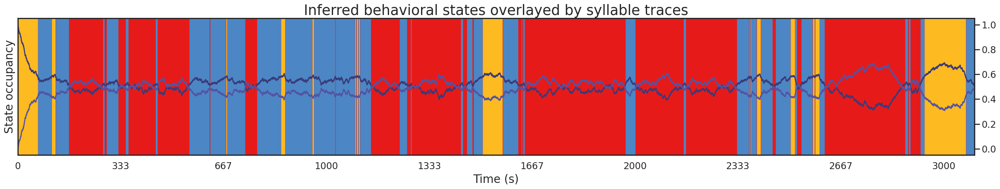

In [28]:
# to del
# import matplotlib.pyplot as plt
# import numpy as np

# def plot_inferred_states_and_trace(df_running_avg, hmm_z, N_sec, cmap, colors, K_states):
#     """
#     Plot the trace of inferred discrete states on the real-time x-axis, starting from N_sec,
#     and overlay the running average of the states.
    
#     Args:
#     df_running_avg (pd.DataFrame): DataFrame containing the real-time values and running average occupancies.
#     hmm_z (np.ndarray): Inferred states from the HMM model.
#     N_sec (int): Time window in seconds to start plotting from.
#     cmap (str or Colormap): Colormap for the states.
#     colors (list): List of colors for the states.
#     K_states (int): Number of latent states to plot (e.g., 2, 4, etc.)
#     """
#     # Get real time from df_running_avg
#     real_time = df_running_avg['RealTime (s)']
    
#     # Check if N_sec is within the range of real_time
#     if N_sec > real_time.iloc[-1]:
#         raise ValueError(f"N_sec = {N_sec} is greater than the total duration of the session ({real_time.iloc[-1]} seconds).")
    
#     # Convert N_sec to the corresponding index in the time series (i.e., where to start plotting)
#     N_sec_idx = np.argmax(real_time >= N_sec)

#     # Plot the inferred states as a colored patch (heatmap)
#     fig, ax1 = plt.subplots(figsize=(25, 5))
#     im = ax1.imshow(hmm_z[None, :], aspect="auto", cmap=cmap, vmin=0, vmax=len(colors)-1, extent=[real_time.iloc[0], real_time.iloc[-1], 0, 1], alpha = .9)

#     # Set x-axis limits starting from N_sec
#     ax1.set_xlim(real_time.iloc[N_sec_idx], real_time.iloc[-1])
    
#     # Set x-ticks based on the real time
#     ax1.set_xticks(np.linspace(real_time.iloc[N_sec_idx], real_time.iloc[-1], num=10))
    
#     # Labeling the heatmap plot
#     ax1.set_xticks(np.linspace(real_time.iloc[N_sec_idx], (real_time.iloc[-1] // 100) * 100, num=10))
#     # ax1.set_ylabel("$z_{\\mathrm{inferred}}$")
#     ax1.set_ylabel('State occupancy', fontsize=20)
#     ax1.set_yticks([])  # Hide y-tick labels
#     ax1.set_xlabel("Time (s)", fontsize=20)
#     ax1.set_title("Inferred behavioral states overlayed by syllable traces", fontsize=25)
    
#     # Overlay the rolling average traces (state occupancy traces)
#     ax2 = ax1.twinx()

#     # Get the tab20b colormap from matplotlib
#     tab20b = plt.get_cmap('tab20b')

#     # Define the colormap you're using (e.g., 'tab20b')
#     cmap = plt.get_cmap('tab20b')

#     # Define the states (e.g., 0, 1, 2, 3)
#     states = np.array(range(K_states))

#     # Normalize the states to the range [0, 1] as required by the colormap
#     # This scales the state values between 0 and 1
#     norm = plt.Normalize(vmin=np.min(states), vmax=np.max(states))

#     # Recover the RGBA colors for each state
#     colors = cmap(norm(states))

#     # Print the colors assigned to each state
#     for state, color in zip(states, colors):
#         print(f"State {state}: Color {color}")

#     # Plot each state's running average
#     for state in range(K_states):
#         state_col = f'State_{state}_occupancy_avg'
        
#         # Ensure the column exists in df_running_avg before attempting to plot
#         if state_col in df_running_avg.columns:
#             ax2.plot(real_time, df_running_avg[state_col], label=f'Syllable {state}', color=colors[state], linewidth=2)
#         else:
#             print(f"Warning: {state_col} not found in df_running_avg")


#     # ax2.set_ylabel('Running Avg Occupancy')
#     # ax2.legend(loc='upper right')
    
#     plt.tight_layout()
#     plt.show()

# # Example usage:
# # Assuming df_running_avg contains the real time and running averages, and hmm_z contains the inferred states
# # cmap is the colormap you want to use and colors is a list of colors.
# hmm_z = hmm.most_likely_states(data)
# # cmap=white_to_color_cmap(colors_hmm[4])
# # plot_inferred_states_and_trace(df_running_avg, hmm_z, N_sec=N_sec, cmap='gist_rainbow', colors=colors, K_states=4)
# # cmap=gradient_cmap(colors_hmm), colors=colors_hmm
# plot_inferred_states_and_trace(df_running_avg, hmm_z, N_sec=0, cmap=gradient_cmap(colors_hmm), colors=colors_hmm, K_states=20)

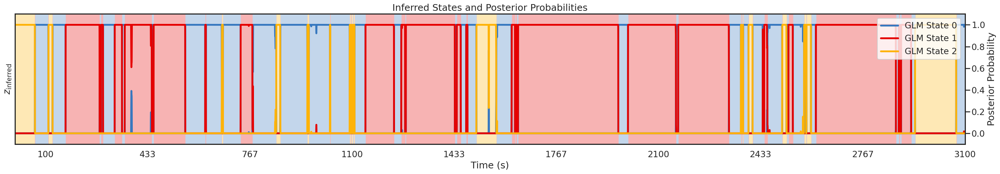

In [29]:
# to del
# import matplotlib.pyplot as plt
# import numpy as np

# def plot_inferred_states_with_probs(df_running_avg, hmm_z, posterior_probs, N_sec, cmap, colors):
#     """
#     Plot the trace of inferred discrete states on the real-time x-axis, starting from N_sec,
#     and overlay the posterior probabilities.
    
#     Args:
#     df_running_avg (pd.DataFrame): DataFrame containing the real-time values.
#     hmm_z (np.ndarray): Inferred states from the HMM model.
#     posterior_probs (np.ndarray): Posterior probabilities for each state, shape (time_points, num_states).
#     N_sec (int): Time window in seconds to start plotting from.
#     cmap (str or Colormap): Colormap for the states.
#     colors (list): List of colors for the states.
#     """
#     # Get real time from df_running_avg
#     real_time = df_running_avg['RealTime (s)']
    
#     # Check if N_sec is within the range of real_time
#     if N_sec > real_time.iloc[-1]:
#         raise ValueError(f"N_sec = {N_sec} is greater than the total duration of the session ({real_time.iloc[-1]} seconds).")
    
#     # Convert N_sec to the corresponding index in the time series (i.e., where to start plotting)
#     N_sec_idx = np.argmax(real_time >= N_sec)

#     # Adjust posterior_probs length to start from N_sec_idx
#     # posterior_probs = posterior_probs[N_sec_idx:]

#     # Plot the inferred states as a colored patch and overlay posterior probabilities
#     fig, ax1 = plt.subplots(figsize=(27, 5))

#     # Plot the inferred states as a colored patch (imshow)
#     ax1.imshow(hmm_z[None, :], aspect="auto", cmap=cmap, vmin=0, vmax=len(colors)-1, 
#                extent=[real_time.iloc[0], real_time.iloc[-1], 0, 1], alpha=.3)
    
#     # Set labels and limits for the imshow plot
#     ax1.set_xlim(real_time.iloc[0], real_time.iloc[-1])
#     ax1.set_ylabel("$z_{\\mathrm{inferred}}$")
#     ax1.set_yticks([])  # Hide y-tick labels
#     ax1.set_xlabel("Time (s)")

#     # Add a secondary axis for the posterior probabilities
#     ax2 = ax1.twinx()

#     # Plot the posterior probabilities for each state
#     for state in range(posterior_probs.shape[1]):
#         ax2.plot(real_time.iloc[:], posterior_probs[:, state], color=colors[state], label=f'GLM State {state}', linewidth=3.5)

#     # Set labels and title for posterior probabilities
#     ax2.set_ylabel("Posterior Probability")
#     ax2.set_ylim(-0.1, 1.1)  # Set y-limits for posterior probabilities

#     # Set x-ticks based on the real time
#     ax1.set_xticks(np.linspace(real_time.iloc[N_sec_idx], real_time.iloc[-1], num=10))

#     # Add legend for posterior probability lines
#     ax2.legend(loc='upper right')

#     plt.title("Inferred States and Posterior Probabilities")
#     plt.tight_layout()
#     plt.show()

# # Example usage:
# # Assuming df_running_avg contains the real time and hmm_z contains the inferred states
# # posterior_probs contains the posterior probabilities with shape (time_points, num_states)
# hmm_z = hmm.most_likely_states(data)
# posterior_probs = hmm.expected_states(data=obs_array)[0]  # Get the posterior probabilities
# num_states = len(np.unique(hmm_z))  # Number of unique GLM states

# # Call the function to plot
# plot_inferred_states_with_probs(df_running_avg, hmm_z, posterior_probs, N_sec=N_sec, cmap=gradient_cmap(colors_hmm), colors=colors_hmm)


ValueError: x and y must have same first dimension, but have shapes (117500,) and (117499,)

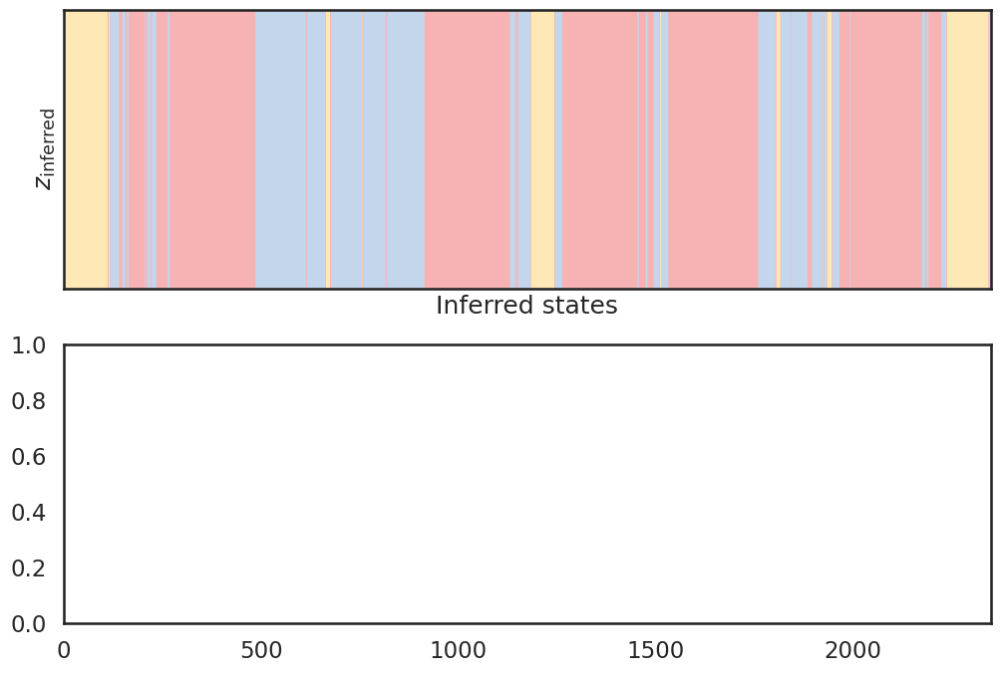

In [30]:
# to del
# import matplotlib.pyplot as plt
# import numpy as np

# def plot_inferred_states_with_probs(df_running_avg, hmm_z, posterior_probs, N_sec, cmap, colors):
#     """
#     Plot the trace of inferred discrete states on the real-time x-axis, starting from N_sec,
#     and overlay the posterior probabilities in a subplot structure (2,1).
    
#     Args:
#     df_running_avg (pd.DataFrame): DataFrame containing the real-time values.
#     hmm_z (np.ndarray): Inferred states from the HMM model.
#     posterior_probs (np.ndarray): Posterior probabilities for each state, shape (time_points, num_states).
#     N_sec (int): Time window in seconds to start plotting from.
#     cmap (str or Colormap): Colormap for the states.
#     colors (list): List of colors for the states.
#     """
#     # Get real time from df_running_avg
#     real_time = df_running_avg['RealTime (s)']
    
#     # Check if N_sec is within the range of real_time
#     if N_sec > real_time.iloc[-1]:
#         raise ValueError(f"N_sec = {N_sec} is greater than the total duration of the session ({real_time.iloc[-1]} seconds).")
    
#     # Convert N_sec to the corresponding index in the time series (i.e., where to start plotting)
#     N_sec_idx = np.argmax(real_time >= N_sec)

#     # Adjust posterior_probs length to start from N_sec_idx
#     # real_time_slice = real_time.iloc[N_sec_idx:]
#     # posterior_probs = posterior_probs[N_sec_idx:-1]

#     # Create a figure with subplots (2, 1)
#     fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

#     # Plot the inferred states as a colored patch (imshow) in the upper subplot
#     ax1.imshow(hmm_z[None, :], aspect="auto", cmap=cmap, vmin=0, vmax=len(colors)-1, 
#                extent=[real_time.iloc[0], real_time.iloc[-1], 0, 1], alpha=.3)
    
#     # Set labels and limits for the imshow plot
#     ax1.set_xlim(real_time.iloc[0], real_time.iloc[-1])
#     ax1.set_ylabel("$z_{\\mathrm{inferred}}$")
#     ax1.set_yticks([])  # Hide y-tick labels
#     ax1.set_xlabel("Inferred states")

#     # Plot the posterior probabilities for each state
#     for state in range(posterior_probs.shape[1]):
#         ax2.plot(real_time.iloc[:], posterior_probs[:-1, state], color=colors[state], label=f'GLM state {state}', linewidth=2)

#     # Set labels and limits for the posterior probabilities plot
#     ax2.set_ylabel("Posterior Probability")
#     ax2.set_ylim(0, 1.1)  # Set y-limits for posterior probabilities
#     ax2.set_xlabel("Time (s)")

#     # Set x-ticks based on the real time
#     ax1.set_xticks(np.linspace(real_time.iloc[0], real_time.iloc[-1], num=10))

#     # Add legend for posterior probability lines
#     ax2.legend(loc='upper right')

#     plt.tight_layout()
#     plt.show()

# # Example usage:
# # Assuming df_running_avg contains the real time and hmm_z contains the inferred states
# # posterior_probs contains the posterior probabilities with shape (time_points, num_states)
# hmm_z = hmm.most_likely_states(data)
# posterior_probs = hmm.expected_states(data=_obs_array)[0]  # Get the posterior probabilities
# num_states = len(np.unique(hmm_z))  # Number of unique GLM states

# # Call the function to plot
# plot_inferred_states_with_probs(df_running_avg, hmm_z, posterior_probs, N_sec=N_sec, cmap=gradient_cmap(colors_hmm), colors=colors_hmm)


/tmp/ipykernel_15064/3655433326.py:34: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])


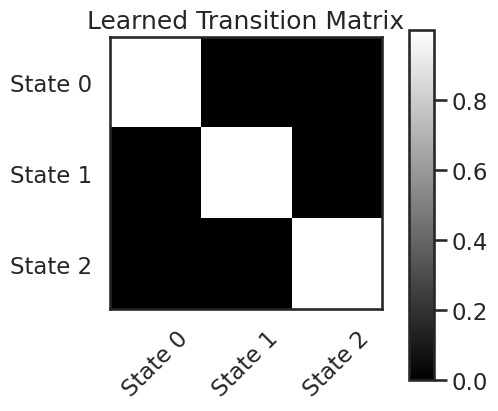

In [30]:
import matplotlib.pyplot as plt

# Assuming learned_transition_mat and hmm are defined
learned_transition_mat = hmm.transitions.transition_matrix

# Number of states
n_states = learned_transition_mat.shape[0]

fig = plt.figure(figsize=(5, 5))
ax = plt.subplot(111)

# Plot the transition matrix
im = ax.imshow(learned_transition_mat, cmap='gray')

# Set the title
ax.set_title("Learned Transition Matrix")

# Set x and y ticks to correspond to the state numbers
ax.set_xticks(range(n_states))
ax.set_yticks(range(n_states))

# Label the ticks with state numbers
ax.set_xticklabels([f'State {i}' for i in range(n_states)])
ax.set_yticklabels([f'State {i}' for i in range(n_states)])

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Add a colorbar next to the matrix
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(im, cax=cbar_ax)

# Show the plot
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.show()


In [99]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Assuming learned_transition_mat and hmm are defined
# learned_transition_mat = hmm.transitions.transition_matrix

# # Number of states
# n_states = learned_transition_mat.shape[0]

# fig, ax = plt.subplots(figsize=(5, 5))

# # Plot the transition matrix
# im = ax.imshow(learned_transition_mat, cmap='gray')

# # Set the title
# ax.set_title("Learned Transition Matrix")

# # Set x and y ticks to correspond to the state numbers
# ax.set_xticks(range(n_states))
# ax.set_yticks(range(n_states))

# # Label the ticks with state numbers
# ax.set_xticklabels([f'State {i}' for i in range(n_states)])
# ax.set_yticklabels([f'State {i}' for i in range(n_states)])

# # Rotate the x-axis labels for better readability
# plt.xticks(rotation=45)

# # Write the values of learned_transition_mat on the squares
# for i in range(n_states):
#     for j in range(n_states):
#         text = ax.text(j, i, f'{learned_transition_mat[i, j]:.2f}', 
#                        ha='center', va='center', color='black')

# # Add a colorbar next to the matrix
# cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
# fig.colorbar(im, cax=cbar_ax)

# # Adjust layout
# plt.tight_layout(rect=[0, 0, 0.85, 1])

# # Show the plot
# plt.show()


In [83]:
np.shape(_obs_array)

(180001, 4)

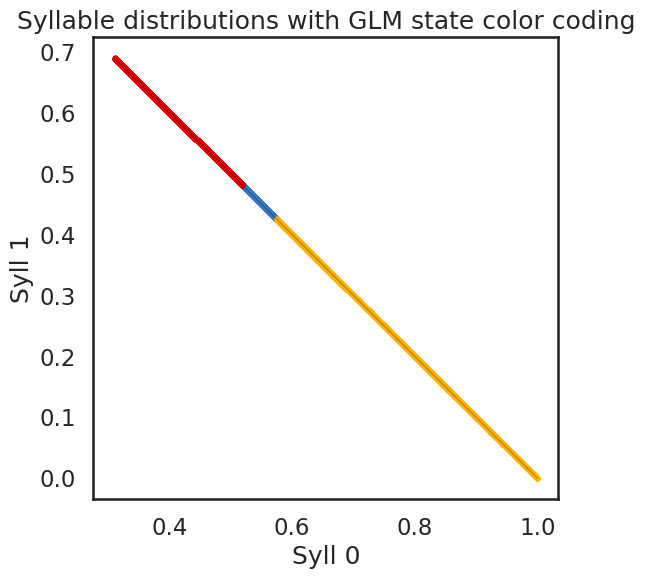

In [37]:

plt.figure(figsize=(6, 6))
for k in range(num_states):
    # plt.contour(XX, YY, np.exp(lls[:,k]).reshape(XX.shape), cmap=white_to_color_cmap(colors[k]))
    plt.plot(_obs_array[hmm_z==k, 0], _obs_array[hmm_z==k, 1], 'o', mfc=colors_hmm[k], mec='none', ms=4)
    
plt.plot(_obs_array[:,0], _obs_array[:,1], '-k', lw=1, alpha=.25)
plt.xlabel("Syll 0")
plt.ylabel("Syll 1")
plt.title("Syllable distributions with GLM state color coding")

if save_figures:
    plt.savefig("hmm_1.png")

In [66]:
n_arhmm_states

[2, 4, 8, 12, 20]

In [65]:
states = np.array(np.arange(4))
print(states)


[0 1 2 3]


In [35]:
df_running_avg

,State_0_occupancy_avg,State_1_occupancy_avg,RealTime (s)
0,1.000000,0.000000,0.00
1,1.000000,0.000000,0.02
2,1.000000,0.000000,0.04
3,1.000000,0.000000,0.06
4,1.000000,0.000000,0.08
...,...,...,...
154995,0.521352,0.478648,3099.90
154996,0.521544,0.478456,3099.92
154997,0.521735,0.478265,3099.94
154998,0.521926,0.478074,3099.96


In [22]:
print(hparams)

{'data_dir': '/root/capsule/data', 'save_dir': '/root/capsule/scratch/xinxin_face_50Hz/results', 'experiment_name': 'state_number_search', 'model_class': 'arhmm', 'model_type': None, 'noise_type': 'gaussian', 'n_arhmm_lags': 1, 'transitions': 'stationary', 'ae_experiment_name': 'ae-example', 'ae_model_class': 'ae', 'ae_model_type': 'conv', 'ae_version': 'best', 'n_ae_latents': 32, 'lab': 'xinxin', 'expt': 'test', 'animal': 'test', 'session': 'test', 'n_input_channels': 1, 'y_pixels': 224, 'x_pixels': 290, 'use_output_mask': False, 'frame_rate': 50.0, 'neural_type': 'ca', 'neural_bin_size': 0.02, 'approx_batch_size': 200, 'device': 'cpu', 'as_numpy': True, 'batch_load': True, 'rng_seed_model': 0, 'rng_seed_data': 0, 'trial_splits': '8;1;1;0', 'train_frac': 1.0, 'n_arhmm_states': 20, 'session_dir': '/root/capsule/scratch/xinxin_face_50Hz/results/xinxin/test/test/test', 'expt_dir': '/root/capsule/scratch/xinxin_face_50Hz/results/xinxin/test/test/test/arhmm/32_latents/20_states/stationary/

# Fa: Plot states overlaid with latents for a single trial

In [34]:
trial_vec

array([224, 225, 226, 227, 228, 229, 230, 231, 136, 137, 138, 139, 140,
       141, 142, 143,  24,  25,  26,  27,  28,  29,  30,  31, 216, 217,
       218, 219, 220, 221, 222, 223, 160, 161, 162, 163, 164, 165, 166,
       167,  88,  89,  90,  91,  92,  93,  94,  95, 152, 153, 154, 155,
       156, 157, 158, 159, 200, 201, 202, 203, 204, 205, 206, 207, 104,
       105, 106, 107, 108, 109, 110, 111, 192, 193, 194, 195, 196, 197,
       198, 199,  16,  17,  18,  19,  20,  21,  22,  23,   0,   1,   2,
         3,   4,   5,   6,   7, 144, 145, 146, 147, 148, 149, 150, 151,
        72,  73,  74,  75,  76,  77,  78,  79,  40,  41,  42,  43,  44,
        45,  46,  47, 240, 241, 242, 243, 244, 245, 246, 247,  32,  33,
        34,  35,  36,  37,  38,  39,  96,  97,  98,  99, 100, 101, 102,
       103, 168, 169, 170, 171, 172, 173, 174, 175, 184, 185, 186, 187,
       188, 189, 190, 191,  64,  65,  66,  67,  68,  69,  70,  71, 232,
       233, 234, 235, 236, 237, 238, 239,   8,   9,  10,  11,  1

In [64]:
mdict['trial_idxs']['test']

array([229, 209, 169, 109, 319, 289, 159, 119,  29, 259, 309, 329, 369,
       349, 299, 339,  89, 139,  59, 179, 149,  79, 279,  19, 129, 269,
       249,  69, 239,  49, 189, 219, 199,  99, 359,  39,   9])

In [38]:
print(mdict.keys())
print(mdict['model'])
print("trial index: ", mdict['trial_idxs']['test'])
# print(np.shape(mdict['latents']['test']))
print(np.shape(mdict['latents']['test'][0])) # shape = #frames * #latent
# print(np.shape(mdict['states']['test']))
print(np.shape(mdict['states']['test'][0])) # shape = #frames * 1 . it gives a state per frame.
# pd.DataFrame(mdict['latents'])
print((mdict['states'].keys()))  # mdict['states'] is a dict with i key 'test'. It contains a vector of 1 state of frame for all frames

print( mdict['states'])

dict_keys(['model', 'latents', 'states', 'trial_idxs', 'latents_gen', 'states_gen'])
trial index:  [123 233 113  33 173 153 293 273 213 143 253  63 183  93 313 263 243  23
 133  73  53 193 303 203 103  83 283  43  13 223 163]
(500, 32)
(500,)
dict_keys(['test'])
{'test': [array([ 0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  0,
        0,  0,  0,  0,  0,  0,  1,  3,  7,  7,  7,  7, 24, 26, 24, 24, 24,
       28, 22, 22, 22, 22, 22, 26, 11, 26, 17, 17, 17, 20, 20,  4,  4,  2,
        2,  2,  2,  2,  1,  3,  3,  3,  1,  1,  1,  1,  1,  1,  1,  3,  1,
        1,  0,  0,  0,  0,  1,  3,  1,  1,  3,  1,  3,  1,  1,  1,  1,  1,
        1,  0,  0,  0,  0,  3,  9, 10, 10, 16, 16, 25, 25, 25, 25, 26, 26,
       14, 14, 14, 25, 25, 16, 12,  5,  4,  4,  2,  2,  2,  1,  1,  1,  0,
        1,  0,  1,  6,  8, 26, 26, 26, 14, 25, 25, 25, 25, 25, 25, 14, 18,
       18, 18, 11, 16, 16,  5,  5, 20,  4,  4,  4, 1

In [60]:
mdict['trial_idxs']

{'test': array([229, 209, 169, 109, 319, 289, 159, 119,  29, 259, 309, 329, 369,
        349, 299, 339,  89, 139,  59, 179, 149,  79, 279,  19, 129, 269,
        249,  69, 239,  49, 189, 219, 199,  99, 359,  39,   9])}

In [ ]:
# dtype = 'train'
# mdict = get_model_latents_states(hparams, '', dtype=dtype, dtypes=[dtype])
# mdict['trial_idxs']

In [66]:
mdict['trial_idxs'][dtype][j]

229

In [157]:
"""FA: works well(?). plot states overlaied on latents for single trial
'''skip it. to do later:
trial id = real trial id?
plot and save has problem
scrit has problem
 '''
Final status: looks to be working well!
"""
from behavenet.plotting.arhmm_utils import plot_states_overlaid_with_latents

j=0     # 37 test data points
n_arhmm_states = [2,4,8,12,20]

# trial_idx = mdict['trial_idxs']['test'][j] 
dtype = 'test'
# mdict = get_model_latents_states(hparams, '', dtype=dtype, dtypes=[dtype])
# trial_idx = mdict['trial_idxs'][dtype][j] 

hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': 'state_number_search',
    'model_class': model_class,
    'model_type': None,
    'noise_type': 'gaussian',
    'n_arhmm_lags': 1,
    'transitions': 'stationary',
    'ae_experiment_name': 'ae-example',
    'ae_model_class': 'ae',
    'ae_model_type': 'conv',
    'ae_version': 'best',
    'n_ae_latents': 32, 
    # 'trial_idx': trial_idx,
    # 'n_arhmm_states': n_arhmm_states
}

get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

# xtick_locs = [0, 30, 60, 90, 120, 150, 180]
xtick_locs = [0, 2500, 5000]
frame_rate = 500
n_trials = 1 # n_trials in 'dtype' set

# add additional params to identify model
hparams['device'] = 'cpu'
hparams['as_numpy'] = True
hparams['batch_load'] = True
hparams['rng_seed_model'] = 0
hparams['rng_seed_data'] = 0
hparams['trial_splits'] = '8;1;1;0'
hparams['train_frac'] = 1.0


for _, n_states in enumerate(n_arhmm_states):
    print(_,n_states)
    # print(hparams['n_arhmm_states'][i])

    hparams['n_arhmm_states'] = n_states    
    
    mdict = get_model_latents_states(hparams, '', dtype=dtype, dtypes=[dtype])
    
    # choose which trials to plot
    np.random.seed(0)
        # radomly choose 'n_trials' trials from the set of 'dtype' data set.
    trial_vec = np.random.choice(
        np.arange(0, len(mdict['trial_idxs'][dtype])), size=(n_trials,), replace=False)

    # collect states
    for _, j in enumerate(trial_vec):
        print('_,j = ', _,j)
        hparams['trial_idx'] = mdict['trial_idxs'][dtype][j]

        x = mdict['latents'][dtype][j][:max_frames]
        states_tmp = mdict['model'].most_likely_states(x)
        n_frames = len(states_tmp)
#         print(n_frames/30)
        mdict['states'][dtype][j][:n_frames] = states_tmp

    latents_samp = mdict['latents'][dtype][j]
    print('latent shape = ', np.shape(latents_samp))
    states_samp = mdict['states'][dtype][j]
    # states = [hmm.most_likely_states(latents_samp) for latents_samp in latents if len(latents_samp) > 0]
    print('state shape = ',np.shape(states_samp))
    # states_samp[:1000]
    # print('trial index = Trial', mdict['trial_idxs'][dtype][j])


    # hparams['trial_idx'] = mdict['trial_idxs'][dtype][j]

    # xtick_locs = 
    if hparams['model_class'] == 'arhmm':
        print("hparams['n_arhmm_states']: ", hparams['n_arhmm_states'])           
        model_name = str(
            'single_trial_state_overlaied_latent_D=%02i_K=%02i_T=%02i' % (
            hparams['n_ae_latents'], hparams['n_arhmm_states'], hparams['trial_idx']))
    elif hparams['model_class'] == 'arhmm-labels':
        model_name = str('single_trial_state_overlaied_latent_K=%02i_T=%02i' % (
            hparams['n_arhmm_states'], hparams['trial_idx']))

    print('model_name: ', model_name)
    print('trial index = Trial', mdict['trial_idxs'][dtype][j])
    print('number of AE latents = ' , hparams['n_ae_latents'])
    print('number of arhmm latents = ' , hparams['n_arhmm_states'])

    if save_outputs:
        save_file = os.path.join(
            get_user_dir('fig'), hparams['model_class'], model_name)
    else:
        save_file = None

    plot_states_overlaid_with_latents(
            latents=latents_samp, states=states_samp, save_file=save_file, ax=None, xtick_locs=None, 
            frame_rate=frame_rate, cmap='tab20b', format='png')
                        
    # x axis is in ms

0 2
_,j =  0 22
latent shape =  (502, 32)
state shape =  (502,)
hparams['n_arhmm_states']:  2
model_name:  single_trial_state_overlaied_latent_D=32_K=02_T=279
trial index = Trial 279
number of AE latents =  32
number of arhmm latents =  2
1 4
_,j =  0 22
latent shape =  (502, 32)
state shape =  (502,)
hparams['n_arhmm_states']:  4
model_name:  single_trial_state_overlaied_latent_D=32_K=04_T=279
trial index = Trial 279
number of AE latents =  32
number of arhmm latents =  4
2 8
_,j =  0 22
latent shape =  (502, 32)
state shape =  (502,)
hparams['n_arhmm_states']:  8
model_name:  single_trial_state_overlaied_latent_D=32_K=08_T=279
trial index = Trial 279
number of AE latents =  32
number of arhmm latents =  8
3 12
_,j =  0 22
latent shape =  (502, 32)
state shape =  (502,)
hparams['n_arhmm_states']:  12
model_name:  single_trial_state_overlaied_latent_D=32_K=12_T=279
trial index = Trial 279
number of AE latents =  32
number of arhmm latents =  12
4 20
_,j =  0 22
latent shape =  (502, 32

In [140]:
trial_vec

array([230])

In [ ]:
# from behavenet.plotting.ae_utils import make_reconstruction_movie

# hparams = {
#     '' = 
# }
# trial = 
# ims = 
# title = 
# n_rows = 
# n_cols = 
# frame_rate =

# save_file = 

# make_reconstruction_movie(
#         ims, titles=None, n_rows=0, n_cols=0, save_file=None, frame_rate=15, dpi=100)

In [ ]:
'''check later'''
# from behavenet.plotting.arhmm_utils import *

# j=18     # 29 test data points
# n_arhmm_states = 2

# trial_idx = mdict['trial_idxs']['test'][j] 

# # hparams = {
# #     'data_dir': get_user_dir('data'),
# #     'save_dir': get_user_dir('save'),
# #     'experiment_name': 'state_number_search',
# #     'model_class': model_class,
# #     'model_type': None,
# #     'noise_type': 'gaussian',
# #     'n_arhmm_lags': 1,
# #     'transitions': 'stationary',
# #     'ae_experiment_name': '10D',
# #     'ae_model_class': 'ae',
# #     'ae_model_type': 'conv',
# #     'ae_version': 'best',
# #     'n_ae_latents': 10, 
# #     'trial_idx': trial_idx,
# #     'n_arhmm_states': n_arhmm_states
# # }

# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': 'n_states_search',
#     'model_class': model_class,
#     'model_type': None,
#     'n_arhmm_states': 8 ,
#     'noise_type': 'gaussian',
#     'n_arhmm_lags': 1,
#     'transitions': 'stationary',
#     'ae_experiment_name': '32D',
#     'ae_model_class': 'ae',
#     'ae_model_type': 'conv',
#     'ae_version': 'best',
#     'n_ae_latents': 32,
#     'rng_seed_data': 0,
#     'rng_seed_model': 0,
#     'train_frac': 1.0,
#     'trial_splits': '8;1;1;0',
#     'trial_idx': trial_idx,
#     'n_arhmm_states': n_arhmm_states
# }
# # xtick_locs = [0, 30, 60, 90, 120, 150, 180]
# frame_rate = 30




# if hparams['model_class'] == 'arhmm':           
#     model_name = str(
#         'single_trial_state_overlaied_latent_D=%02i_K=%02i_T=%02i' % (
#         hparams['n_ae_latents'], hparams['n_arhmm_states'], hparams['trial_idx']))
# elif hparams['model_class'] == 'arhmm-labels':
#     model_name = str('single_trial_state_overlaied_latent_K=%02i_T=%02i' % (
#         hparams['n_arhmm_states'], hparams['trial_idx']))
        
        

# latents_samp = mdict['latents']['test'][j]
# print('latent shape = ', np.shape(latents_samp))
# states_samp = mdict['states']['test'][j]
# # states = [hmm.most_likely_states(latents_samp) for latents_samp in latents if len(latents_samp) > 0]
# print('state shape = ',np.shape(states_samp))
# # states_samp[:1000]
# print('trial index = ', mdict['trial_idxs']['test'][j])



# if save_outputs:
#     save_file = os.path.join(
#         get_user_dir('fig'), hparams['model_class'], model_name)
# else:
#     save_file = None
        
# # xtick_locs = 


# plot_states_overlaid_with_latents(
#         latents=latents_samp, states=states_samp, save_file=save_file, ax=None, xtick_locs=None, 
#         frame_rate=frame_rate, cmap='tab20b', format='png')

# # x axis is in ms

In [ ]:
'''check later'''
# #     if save_outputs:
# #         save_file = os.path.join(
# #             get_user_dir('fig'), hparams['model_class'], model_name + '.' + format)
# #     else:
# #         save_file = None

# if hparams['model_class'] == 'arhmm':           
#     model_name = str(
#         'single_trial_state_overlaied_latent_D=%02i_K=%02i_T=%02i' % (
#         hparams['n_ae_latents'], hparams['n_arhmm_states'], hparams['trial_idx']))
# elif hparams['model_class'] == 'arhmm-labels':
#     model_name = str('single_trial_state_overlaied_latent_K=%02i_T=%02i' % (
#         hparams['n_arhmm_states'], hparams['trial_idx']))
        
        
# #      if save_file is not None:
# #         make_dir_if_not_exists(save_file)
# #         fig.savefig(save_file, transparent=True, bbox_inches='tight')
# #         # plt.close(fig)   
        

In [2]:
# #del later . 
# from unittest.mock import patch
# from behavenet import setup

# def automated_setup():
#     with patch('builtins.input', \
#         side_effect= ['/root/capsule/data', '/root/capsule/scratch/xinxin_face_50Hz_H270_W360/results', \
#         '/root/capsule/scratch/xinxin_face_50Hz_H270_W360/figures']):
#         setup()
# # '/root/capsule/data/base-data-dir1


# # Call the automated setup function
# automated_setup()


# # to read the inputs from a text file 'data_info.txt'

# from unittest.mock import patch
# from behavenet import add_dataset

# def automated_setup():
#     with open('data_info_xinxin_face_left_50Hz_H270_W360.txt', 'r') as file:
#         input_values = [line.strip() for line in file]

#     with patch('builtins.input', side_effect=input_values):
#         add_dataset()

# # Call the automated setup function
# automated_setup()




# import os
# import pickle
# import scipy.io as sio
# import pandas as pd
# import seaborn as sns
# import numpy as np
# import matplotlib.pyplot as plt

# from behavenet import get_user_dir, make_dir_if_not_exists
# from behavenet.data.utils import get_transforms_paths
# from behavenet.data.utils import load_labels_like_latents
# from behavenet.fitting.utils import get_expt_dir
# from behavenet.fitting.utils import get_session_dir
# from behavenet.fitting.utils import get_best_model_version
# from behavenet.fitting.utils import get_lab_example
# from behavenet.plotting.arhmm_utils import *

# save_outputs = True  # true to save figures/movies to user's figure directory
# # format = 'png'  # figure format ('png' | 'jpeg' | 'pdf'); movies saved as mp4
# # model_class = 'arhmm'  # 'arhmm' | 'arhmm-labels'
# # lab_id = 'xinxin'
# # expt_id = 'coupled_baiting'

Directories are now stored in /root/.behavenet/directories.json
Please enter the following information about the dataset:
Please enter the following information about the behavioral video:
Please enter the following information about the neural data:
Dataset params are now stored in /root/.behavenet/xinxin_coupled_baiting_params.json


## Plot inferred and generated latents and states (plot/movie conditional/unconditional sampling)

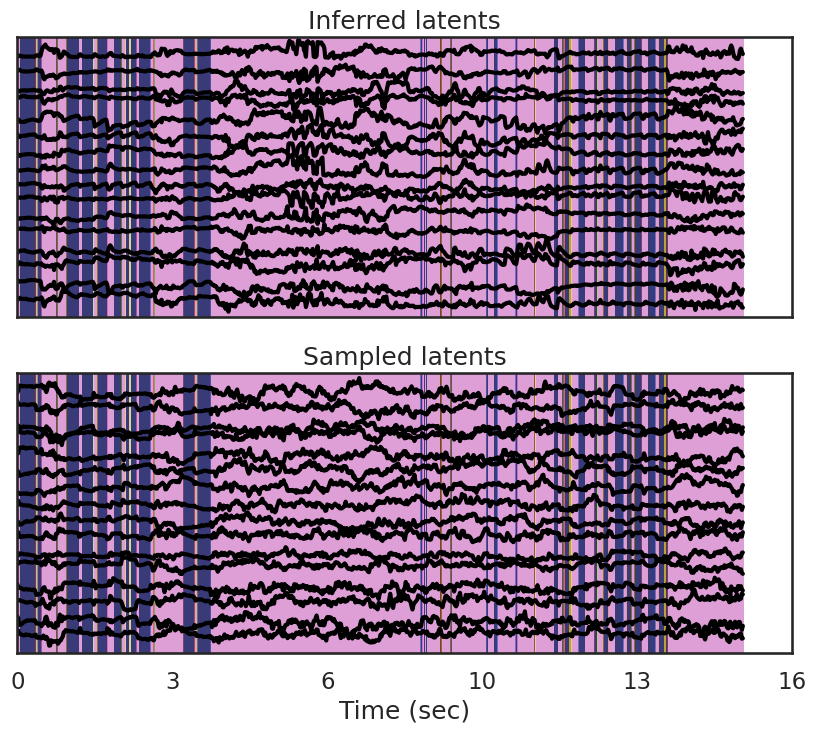

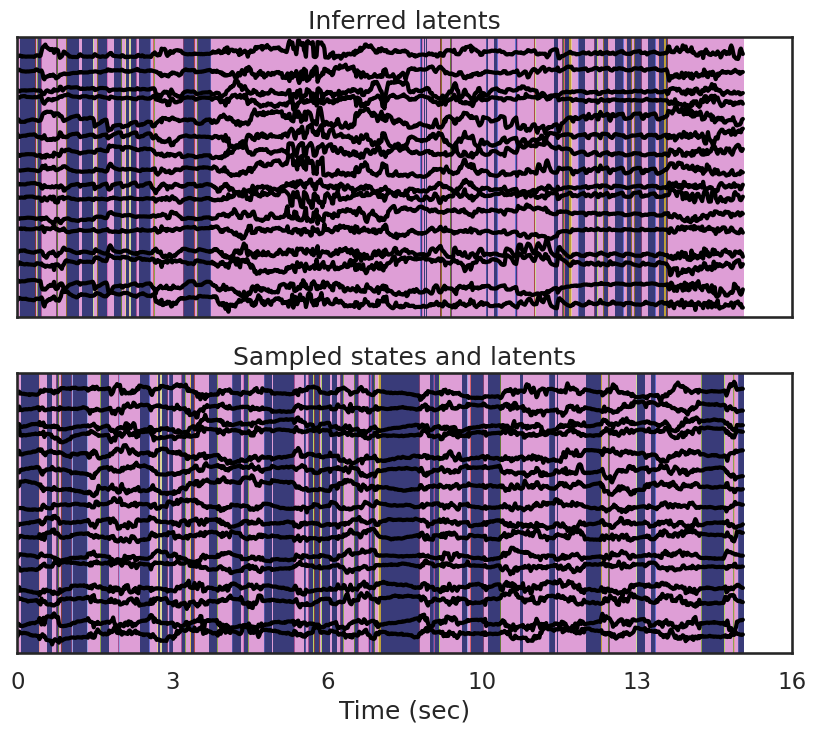

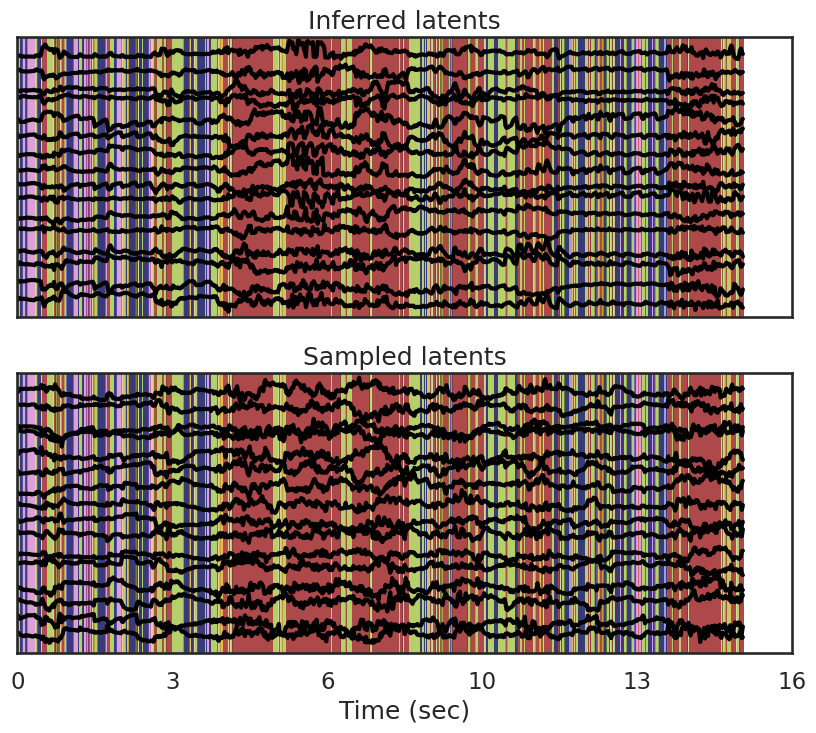

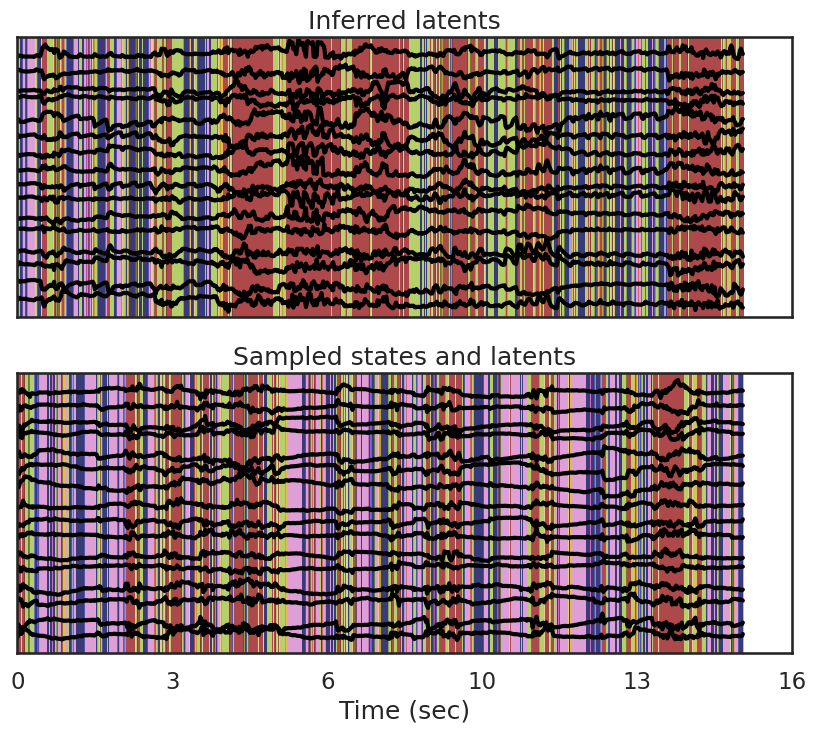

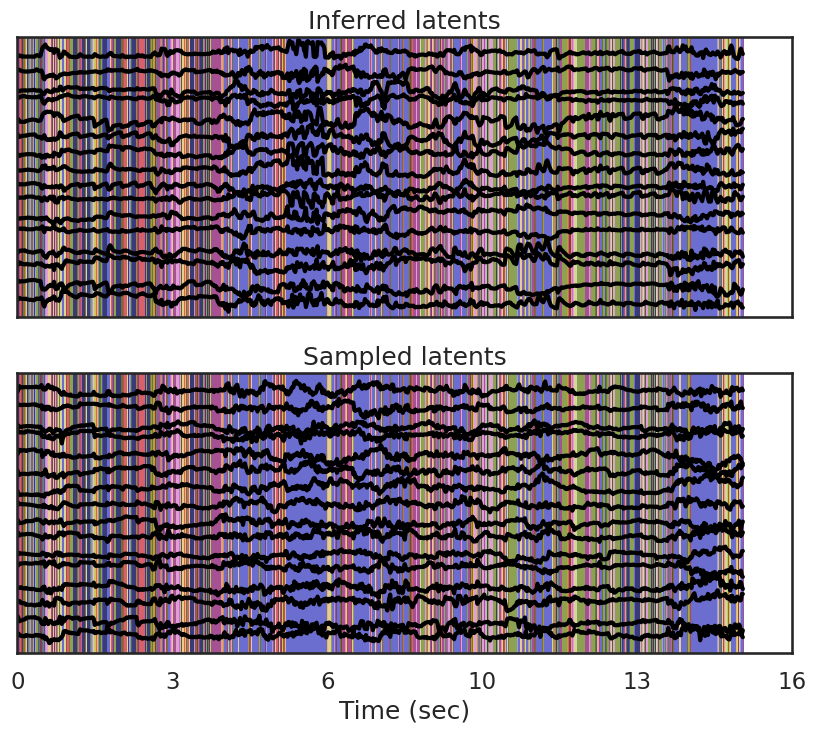

...

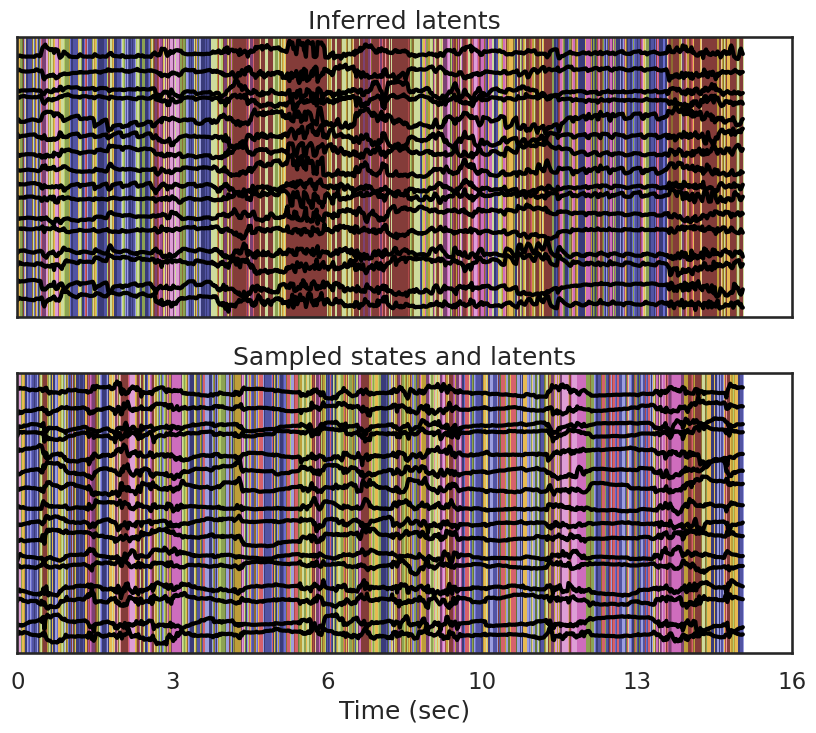

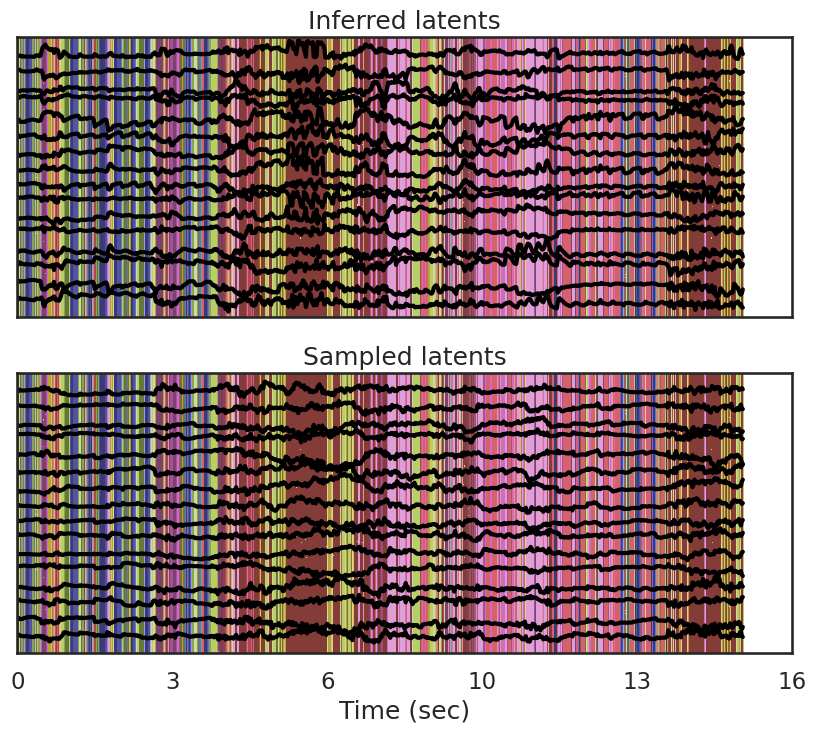

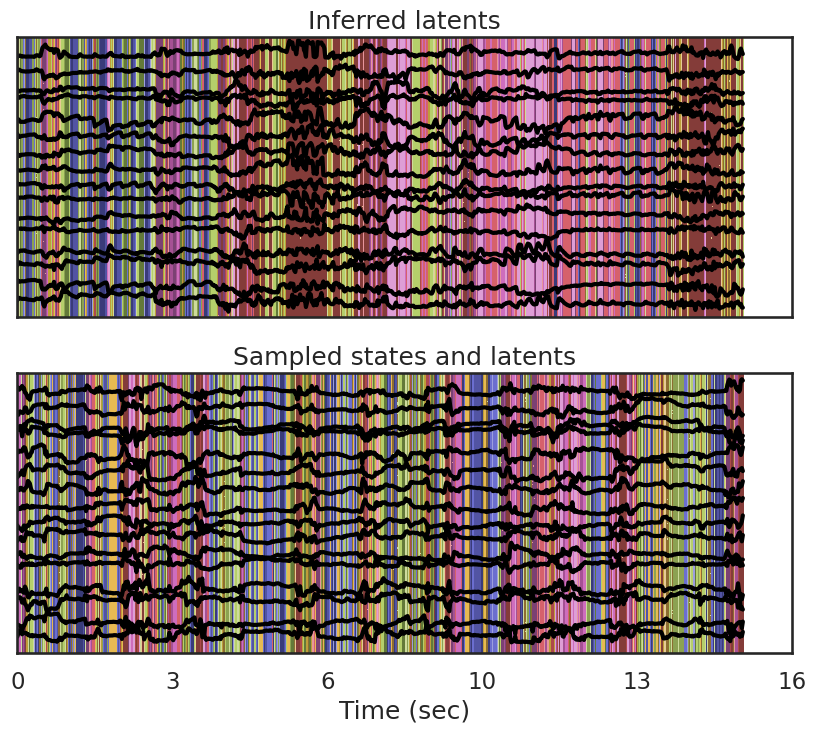

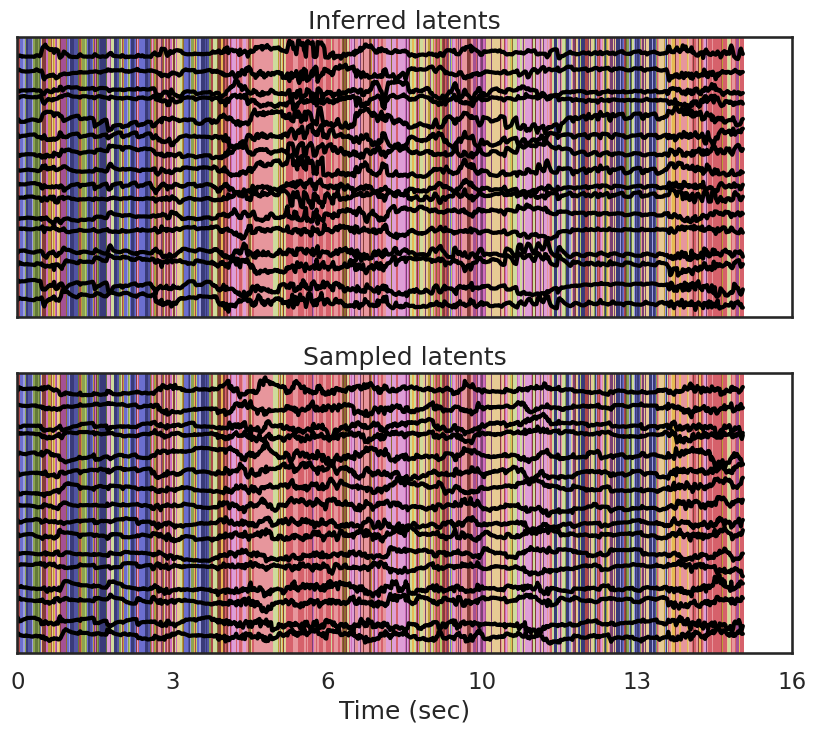

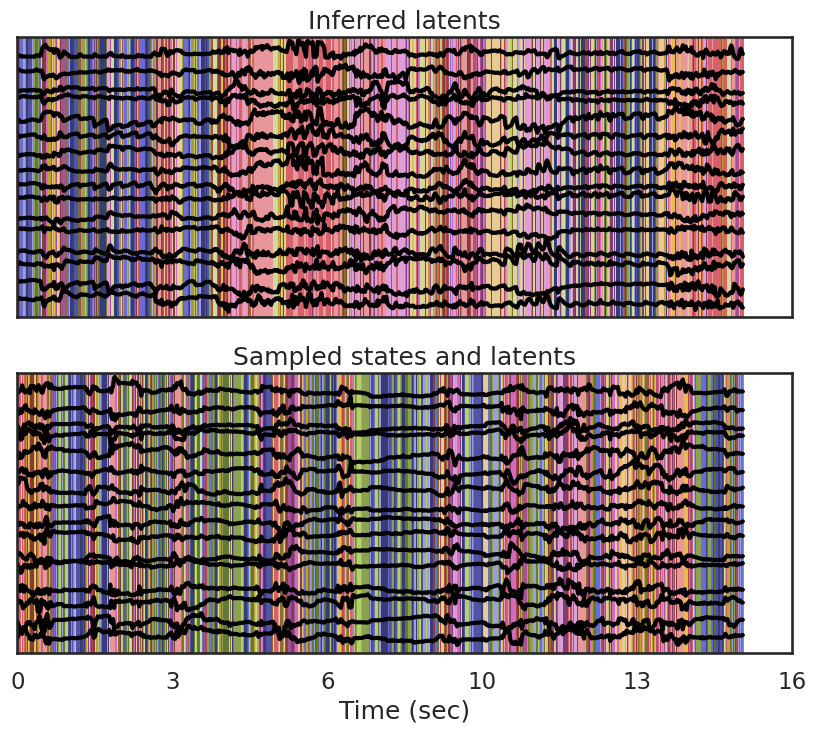

In [218]:
from behavenet.plotting.arhmm_utils import get_model_latents_states
from behavenet.plotting.arhmm_utils import plot_states_overlaid_with_latents

# user params
sess_idx = 0  # when using a multisession, this determines which session is used
version = 'best'  # test-tube version; 'best' finds the version with the lowest mse

# xtick_locs = [0, 30, 60, 90, 120, 150, 180]
# xtick_locs = [0, 2500, 5000]
# frame_rate = 50
max_frames = 800
xtick_locs = np.linspace(0, max_frames, 6)

for n_arhmm_state in n_arhmm_states:
    # set model info
    hparams = {
        'data_dir': get_user_dir('data'),
        'save_dir': get_user_dir('save'),
        'experiment_name': arhmm_model_experiment_name,
        'model_class': model_class,
        'model_type': None,
        'n_arhmm_states': n_arhmm_state,
        'noise_type': noise_type,
        'n_arhmm_lags': n_arhmm_lags,
        'transitions': 'stationary',
        'ae_experiment_name': ae_experiment_name,
        'ae_model_class': 'ae',
        'ae_model_type': 'conv',
        'ae_version': 'best',
        'n_ae_latents': n_ae_latents,
        'rng_seed_data': rng_seed_data,
        'rng_seed_model': rng_seed_model,
        'train_frac': train_frac,
        'trial_splits': trial_splits,
        'arhmm_verion': 'best'
    }
    get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)

    np.random.seed(101)

    # cond_sampling: True to condition samples on inferred discrete states of real data
    for cond_sampling in [True, False]:
        
        save_str = 'conditional' if cond_sampling else 'unconditional'
        if hparams['model_class'] == 'arhmm':           
            file_name = str('infer_vs_sample_%s_D=%02i_K=%02i' % (
                save_str, hparams['n_ae_latents'], hparams['n_arhmm_states']))
        elif hparams['model_class'] == 'arhmm-labels':
            file_name = str('infer_vs_sample_%s_K=%02i' % (
                save_str, hparams['n_arhmm_states']))
        save_file = os.path.join(get_user_dir('fig'), hparams['model_class'], file_name)
        
        fig = real_vs_sampled_wrapper(
            'plot', hparams, save_file, 0, xtick_locs=xtick_locs, max_frames=max_frames,
            frame_rate=frame_rate, frame_rate_beh=frame_rate, conditional=cond_sampling)
        # output_type : :obj:`str`'plot' | 'movie' | 'both'

# Make syllable movies
### Specify     'n_arhmm_states': in hparams

In [192]:
model_class

'arhmm'

producing syllable videos for arhmm 0
processing syllable 1/8
processing syllable 2/8
processing syllable 3/8
processing syllable 4/8
processing syllable 5/8
processing syllable 6/8
processing syllable 7/8
processing syllable 8/8
creating animation...done
saving video to /local1/video-analysis/scratch/706893_2024-05-28_15-15-38/figures/ear/arhmm/syllable-movies_D=08_K=08_dur=20sec.mp4...done


<Figure size 640x480 with 0 Axes>

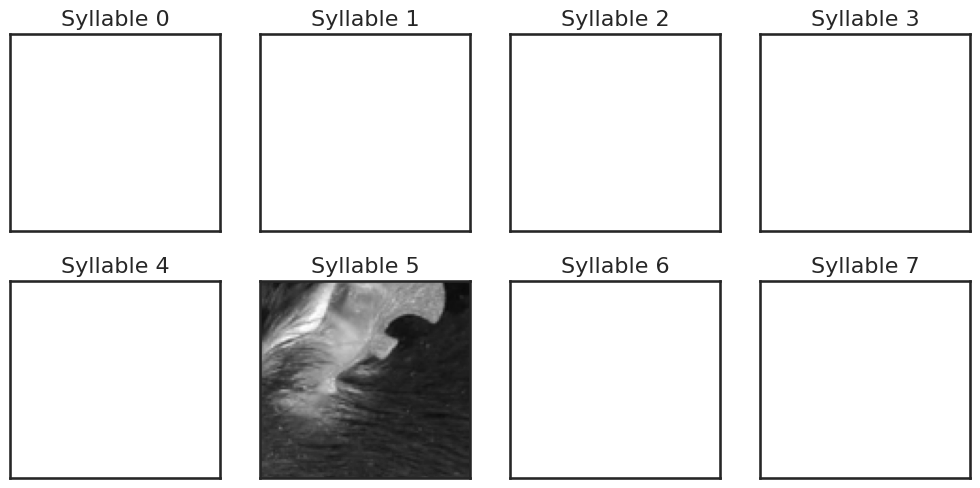

In [209]:
from behavenet.plotting.arhmm_utils import make_syllable_movies_wrapper

# hparams = { 'n_arhmm_states': 2}

# user params
dtype = 'train'  # data type to draw trials from: 'train' | 'val' | 'test'
sess_idx = 0  # when using a multisession, this determines which session is used
# frame_rate = frame_rate
max_frames = 1000 #tpycal value: frame_rate * 20 ; max_frames: specifyes the length of animate (*20 foe 20 sec)

# # set model info
hparams = {
    'data_dir': get_user_dir('data'),
    'save_dir': get_user_dir('save'),
    'experiment_name': arhmm_model_experiment_name,
    'model_class': model_class,
    'model_type': None,
    'n_arhmm_states': 8,
    'noise_type': noise_type,
    'n_arhmm_lags': n_arhmm_lags,
    'transitions': 'stationary',
    'ae_experiment_name': ae_experiment_name,
    'ae_model_class': 'ae',
    'ae_model_type': 'conv',
    'ae_version': 'best',
    'n_ae_latents': n_ae_latents,
    'rng_seed_data': rng_seed_data,
    'rng_seed_model': rng_seed_model,
    'train_frac': train_frac,
    'trial_splits': trial_splits,
    # 'arhmm_verion': 'best'
}
# Set up common hparams
# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': arhmm_model_experiment_name,
#     'model_class': model_class,
#     'model_type': None,
#     'noise_type': noise_type,
#     'n_arhmm_lags': n_arhmm_lags,
#     'transitions': 'stationary',
#     'ae_experiment_name': ae_experiment_name,
#     'ae_model_class': 'ae',
#     'ae_model_type': 'conv',
#     'ae_version': 'best',
#     'n_ae_latents': n_ae_latents,
#     'device': device,
#     'as_numpy': as_numpy,
#     'batch_load': batch_load,
#     'rng_seed_model': rng_seed_model,
#     'rng_seed_data': rng_seed_data,
#     'trial_splits': trial_splits,
#     'train_frac': train_frac,
# }

# hparams = {
#     'data_dir': get_user_dir('data'),
#     'save_dir': get_user_dir('save'),
#     'experiment_name': arhmm_model_experiment_name,
#     'model_class': model_class,
#     'model_type': None,
#     'noise_type': noise_type,
#     'n_arhmm_lags': n_arhmm_lags,
#     'transitions': 'stationary',
#     'ae_experiment_name': ae_experiment_name,
#     'n_ae_latents': n_ae_latents,
# }


# programmatically fill out other hparams options
get_lab_example(hparams, experimenter_name, dataset_hparams_experiment_name)
# get_lab_example(hparams, 'mussal', 'vistrained')   
# hparams['session_dir'], sess_ids = get_session_dir(hparams)
# hparams['expt_dir'] = get_expt_dir(hparams)
dur = max_frames/frame_rate

if hparams['model_class'] == 'arhmm':           
    file_name = str('syllable-movies_D=%02i_K=%02i_dur=%02isec' % 
                    (hparams['n_ae_latents'], hparams['n_arhmm_states'], dur))
elif hparams['model_class'] == 'arhmm-labels':
    file_name = str('syllable-movies_D=%02i' % hparams['n_arhmm_states'])
save_file = os.path.join(get_user_dir('fig'), hparams['model_class'], file_name)

n_rows = (hparams['n_arhmm_states']-1)//4 +1  # 4 is an appropreate choice for the number of columns

make_syllable_movies_wrapper(hparams, save_file, sess_idx=sess_idx, n_rows=2, dtype=dtype,  frame_rate=frame_rate, 
                             min_threshold=5, max_frames=max_frames, n_pre_frames =0, n_buffer=0)
# explanation:
# def make_syllable_movies_wrapper(
#         hparams, save_file, sess_idx=0, dtype='test', max_frames=400, frame_rate=10,
#         min_threshold=0, n_buffer=5, n_pre_frames=3, n_rows=None, single_syllable=None):
# Fa: max_frames: specifyes the length of animate
# min_threshold : minimum number of frames in a syllable run to be considered for movie

In [ ]:
make_syllable_movies_wrapper?

In [ ]:
(4-1)//4 +1

1

# For Musall Data:

Enter base data directory: /root/capsule/data
Enter base results directory: /root/capsule/scratch/results
Enter base figures directory: /root/capsule/scratch/figures
Directories are now stored in /root/.behavenet/directories.json

-------

name of experimenter/lab (str): musall
name of experiment (str): vistrained
example animal name (str): mSM36
example session name (str): 05-Dec-2017
Please enter the following information about the behavioral video:
number of camera views (int): 2
number of y pixels (int): 128
number of x pixels (int): 128
are you applying any masks to the video? (True/False): false
frame rate of video (Hz) (float): 30
Please enter the following information about the neural data:
neural data type (str - spikes or ca): ca
Dataset params are now stored in /root/.behavenet/musall_vistrained_params.json


---------

mkdir scratch/results

mkdir scratch/figures

cp -r ~/../behavenet/configs/ .

cp -r ~/../behavenet/configs/ scratch/


cp -r configs/ae_jsons/* ~/.behavenet

cp -r configs/arhmm_jsons/* ~/.behavenet

cp -r data/results_figures/* scratch/results/


--------

python /behavenet/behavenet/fitting/ae_grid_search.py --data_config /root/.behavenet/musall_vistrained_params.json --model_config /root/.behavenet/ae_model.json --training_config /root/.behavenet/ae_training.json --compute_config /root/.behavenet/ae_compute.json


# for AIND data (single view):

Enter base data directory: /root/capsule/data 

Enter base results directory: /root/capsule/scratch/results

Enter base figures directory: /root/capsule/scratch/figures/video_HH09_S04_20210419_sideFace

Directories are now stored in /root/.behavenet/directories.json


------


Please enter the following information about the dataset:

name of experimenter/lab (str): han

name of experiment (str): twoArmBand_Block

example animal name (str): 09

example session name (str): 20210419

Please enter the following information about the behavioral video:

number of camera views (int): 1

number of y pixels (int): 472

number of x pixels (int): 496

are you applying any masks to the video? (True/False): false

frame rate of video (Hz) (float): 30

Please enter the following information about the neural data:

neural data type (str - spikes or ca): spikes

Dataset params are now stored in /root/.behavenet/han_twoArmBand_Block_params.json



--------

mkdir /root/capsule/scratch/figures/HH09_S04_20210419_sideFace


--------

cp -r configs4video_HH09_S04_20210419_sideFace_downsampled/ae_jsons/* ~/.behavenet

-------

python /behavenet/behavenet/fitting/ae_grid_search.py --data_config /root/.behavenet/han_twoArmBand_Block_params.json --model_config /root/.behavenet/ae_model.json --training_config /root/.behavenet/ae_training.json --compute_config /root/.behavenet/ae_compute.json

-------

In "preprocessing_4_behavenet" capsule, to create new .hdf5 dara asset:

Source: /results/han

Data Asset Name: preProc4BehaveNet_video_HH09_S04_20210419_sideFace

Folder name: data/han


------


python /behavenet/behavenet/fitting/arhmm_grid_search.py --data_config /root/.behavenet/han_twoArmBand_Block_params.json --model_config /root/.behavenet/arhmm_model.json --training_config /root/.behavenet/arhmm_training.json --compute_config /root/.behavenet/arhmm_compute.json

# for AIND data (2-angle view):

Enter base data directory: /root/capsule/data/base-data-dir

Enter base results directory: /root/capsule/scratch/results

Enter base figures directory: 
/root/capsule/scratch/figures/HH09_S04_20210419_2angle
/root/capsule/scratch/figures/HH09_S07_20210611_2angle

information of directories are now stored in /root/.behavenet/directories.json


------


Enter the following information about the dataset:

name of experimenter/lab (str): han

name of experiment (str): jenelia-exp

example animal name (str): HH09

example session name (str): S04_20210419 or S07_20210611 (304, 288)

Please enter the following information about the behavioral video:

number of camera views (int): 2

number of y pixels (int): 374

number of x pixels (int): 496

are you applying any masks to the video? (True/False): false

frame rate of video (Hz) (float): 30

Please enter the following information about the neural data:

neural data type (str - spikes or ca): spikes

Dataset params are now stored in /root/.behavenet/han_jenelia-exp_params.json



--------

mkdir -p /root/capsule/scratch/figures/HH09_S04_20210419_2angle

--------
set the parameters of json files in configs4video_HH09_S04_20210419_2angles/* as you wish, then copy the 3 jason config files ( ae_compute.json, ae_model.json, and ae_training.json , (and I think ae-arch-default.json)) to the .behavenet directory. run: 

cp -r configs4video_HH09_S04_20210419_2angles/ae_jsons/* ~/.behavenet

-------

python /behavenet/behavenet/fitting/ae_grid_search.py --data_config /root/.behavenet/han_jenelia-exp_params.json --model_config /root/.behavenet/ae_model.json --training_config /root/.behavenet/ae_training.json --compute_config /root/.behavenet/ae_compute.json

-------

In "preprocessing_4_behavenet" capsule, to create new .hdf5 dara asset:

Source: /results/han

Data Asset Name: preProc4BehaveNet_video_HH09_S04_20210419_sideFace

Folder name: data/han


------


python /behavenet/behavenet/fitting/arhmm_grid_search.py --data_config /root/.behavenet/han_twoArmBand_Block_params.json --model_config /root/.behavenet/arhmm_model.json --training_config /root/.behavenet/arhmm_training.json --compute_config /root/.behavenet/arhmm_compute.json


-------

Source Code Link: https://behavenet.readthedocs.io/en/latest/_modules/index.html

-------

One thing you could try is running the integration test, which makes fake data and then runs a bunch of models on that data. It only runs each model for a couple epochs, so should be pretty fast. All you need to do is run the following command from the top level of the behavenet repo:

python /behavenet/tests/integration.py

The approx_batch_size parameter is unfortunately a bit misleading - this is only used for the calculation of the model's (approximate) memory footprint on the GPU, not the acutal batch size. The actual batch size is determined through the construction of the hdf5, and the number of frames you allocate per "trial".

# Auto-Initialization

 Using Scripts for installing behavenet, create directories, and initiation of code by setup behavenet and adding data

1. 
for the first time run:
chmod +x install_behavenet.sh 

The command, chmod +x install_behavenet.sh, needs to be run only once to make the script executable. Once you've executed this command, you won't need to run it again unless the script permissions are somehow modified or if you create a new script that requires execution permission.

cd code
./install_behavenet.sh


------

2. 
- setup behevenet manually: 
from behavenet import setup
setup()



- setup behevenet automaticcally by giving values directly: 
from unittest.mock import patch
from behavenet import setup

def automated_setup():
    with patch('builtins.input', \
        side_effect= ['/root/capsule/data/base-data-dir', '/root/capsule/scratch/results', \
        '/root/capsule/scratch/figures/HH09_S07_20210611_2angle']):
        setup()

Call the automated setup function
automated_setup()



- setup behevenet automaticcally by reading values from a text file (directory_address.txt):
from unittest.mock import patch
from behavenet import setup

def automated_setup():
    with open('directory_address.txt', 'r') as file:
        input_values = [line.strip() for line in file]

    with patch('builtins.input', side_effect=input_values):
        setup()

#Call the automated setup function
automated_setup()

-------


3. 
- add data manually:
from behavenet import add_dataset
add_dataset()


- add data automaticcally by reading values from a text file (data_info.txt):
#to read the inputs from a text file 'data_info.txt'

from unittest.mock import patch
from behavenet import add_dataset

def automated_setup():
    with open('data_info.txt', 'r') as file:
        input_values = [line.strip() for line in file]

    with patch('builtins.input', side_effect=input_values):
        add_dataset()

#Call the automated setup function
automated_setup()

-----

4. 
chmod +x remaining_preparation.sh

./remaining_preparation.sh

-----

5.
python /root/capsule/code/behavenet/behavenet/fitting/ae_grid_search.py --data_config /root/.behavenet/han_jenelia-exp_params.json --model_config /root/.behavenet/ae_model.json --training_config /root/.behavenet/ae_training.json --compute_config /root/.behavenet/ae_compute.json


# Configuring and Training Autoencoders with BehaveNet



Now adjust the config files as you wish! and copy the following config files to the .behavenet directory that was automatically created in your home directory: ae_compute.json, ae_model.json, and ae_training.json. 

cp -r configs4video_HH09_S04_20210419_2angles/ae_jsons/* ~/.behavenet

Then to fit the model, cd to the behavenet directory in the terminal and run:

python /behavenet/behavenet/fitting/ae_grid_search.py --data_config /root/.behavenet/han_twoArmBand_Block_params.json --model_config /root/.behavenet/ae_model.json --training_config /root/.behavenet/ae_training.json --compute_config /root/.behavenet/ae_compute.json
[should be refined]


Training an AE can be slow: you can speed up the training by parallelizing over multiple gpus. To do this, just specify n_parallel_gpus to be the number of gpus you wish to use per model. The code will split up the gpus specified in gpus_viz into groups of size n_parallel_gpus (or less if there are leftover gpus) and run the models accordingly.

VAE or AE?: https://behavenet.readthedocs.io/en/latest/_modules/behavenet/models/vaes.html?highlight=ae_model.json#

This class constructs convolutional variational autoencoders. The convolutional autoencoder
    architecture is defined by various keys in the dict that serves as the constructor input. See
    the :mod:`behavenet.fitting.ae_model_architecture_generator` module to see examples for how
    this is done.

    The VAE class can also be used to fit β-VAE models (see https://arxiv.org/pdf/1804.03599.pdf)
    by changing the value of the `vae.beta` parameter in the `ae_model.json` file; a value of 1
    corresponds to a standard VAE; a value >1 will upweight the KL divergence term which, in some
    cases, can lead to disentangling of the latent representation.
    """

"model_class": "ae", # type: str [me: ?]

This class constructs convolutional variational autoencoders. The convolutional autoencoder architecture is defined by various keys in the dict that serves as the constructor input. See the behavenet.fitting.ae_model_architecture_generator module to see examples for how this is done.

To fit a single model with the default CAE BehaveNet architecture (details in paper), edit the ae_model.json file to look like the following:

{
"experiment_name": "ae-example",
"model_type": "conv",
"n_ae_latents": 12,
"l2_reg": 0.0,
"rng_seed_model": 0,
"fit_sess_io_layers": false,
"ae_arch_json": null,
"model_class": "ae"
}

Source Code Link: https://behavenet.readthedocs.io/en/latest/_modules/index.html

https://behavenet.readthedocs.io/en/latest/_modules/behavenet/models/aes.html:
class AE(BaseModel):
    """Base autoencoder class.

    This class can construct both linear and convolutional autoencoders. The linear autoencoder
    utilizes a single hidden layer, dense feedforward layers (i.e. not convolutional), and the
    encoding and decoding weights are tied to more closely resemble PCA/SVD. The convolutional
    autoencoder architecture is defined by various keys in the dict that serves as the constructor
    input. See the :mod:`behavenet.models.ae_model_architecture_generator` module to see examples
    for how this is done.
    """

See the :mod:`behavenet.models.ae_model_architecture_generator` module to see examples for how this is done (VAE)(?)

AE loss: MSE

def loss(self, data, dataset=0, accumulate_grad=True, chunk_size=200):
        """Calculate MSE loss for autoencoder.

        The batch is split into chunks if larger than a hard-coded `chunk_size` to keep memory
        requirements low; gradients are accumulated across all chunks before a gradient step is
        taken.

        chunk_size : :obj:`int`, optional
            batch is split into chunks of this size to keep memory requirements low

in ae.training.json there are parameters which I am not sure what exactly they indicate

# make it interactively changable
open terminal  
cd code/behavenet  
run pip install -e .  
in python:  
%load_ext autoreload  
%autoreload 2 
maybe you need to restatrt kernel?  